# 新段落

In [ ]:
from google.colab import drive
drive.mount('/content/drive/')

In [ ]:
import os
import sys
# sys.path.append('/content/drive/My\ Drive/algorithms/DBScan/density')
%cd /content/drive/My\ Drive/algorithms/DBScan/density
os.listdir()

In [ ]:
import time

# from point import ClusterPoint as CP
from boxgraph import BoxGraph
from box import Box

import numpy as np
from matplotlib import patches
import matplotlib.pyplot as plt
import datetime as dt
import math
from operator import itemgetter
from itertools import compress
import operator

import random

import pandas as pd
import seaborn as sns
sns.set()

In [ ]:
class Rectangle:
    def __init__(self, x, y, width, height, cluster_label=-1):
        '''
            x,y: the coordinate of a point, which is the middle point of a rectangle
            width, height: the width, height of the rectangle
            cluster_label: the label, default is -1, which means that it is not clustered
        '''
        self.x = x
        self.y = y
        self.width = width
        self.height = height
        self.cluster_label = cluster_label
        self.x_min = self.x - self.width/2
        self.x_max = self.x + self.width/2
        self.y_min = self.y - self.height/2
        self.y_max = self.y + self.height/2
        self.area = self.width * self.height

In [ ]:
from enum import Enum

"""absolute tolerance value used for equality testing.
Should ideally be relative to magnitude"""
EPS = 1e-12


class Point:
    """
    Represents a point in the plane.
    Contains a dimension field and a list of coordinates for each dimension
    """
    def __init__(self, dimension, coords=None, ID=None, datetime=None,type_point=None):
        self.dimension = dimension
        if coords is None:
            self.coords = [0. for _ in range(dimension)]
        else:
            assert len(coords) == dimension
            self.coords = coords[:]
        self.ID = ID
        self.datetime = datetime
        self.type_point = type_point
        # self.label = label

    def __str__(self):
        return " ".join("{}".format(c) for c in self.coords)

    def __eq__(self, other):
        return self.sq_distance_to(other) < EPS

    def __ne__(self, other):
        return not self.__eq__(other)

    def __hash__(self):
        return hash(hash(self.coords[0]) + hash(self.coords[1])) # a bit finniky

    def sq_distance_to(self, other):
        assert self.dim_match(other)

        return sum((self.coords[i] - other.coords[i]) ** 2 for i in range(self.dimension))

    def add(self, other):
        assert self.dim_match(other)

        for i in range(self.dimension):
            self.coords[i] += other.coords[i]

    def sub(self, other):
        assert self.dim_match(other)

        for i in range(self.dimension):
            self.coords[i] -= other.coords[i]

    def mul(self, x):
        self.coords = [coord * x for coord in self.coords]
        return self

    def div(self, x):
        self.coords = [coord / x for coord in self.coords]
        return self

    def dim_match(self, other):
        return self.dimension == other.dimension

    def get(self, i):
        return self.coords[i]


class ClusterPoint(Point):
    """
    Point containing an additional clustering label and cluster function
    """

    DEFAULT_LABEL = -1

    class Func(Enum):
        NOISE = 0
        CORE = 1
        BORDER = 2

    def __init__(self, dimension, coords=None, ID=None, datetime=None, label=DEFAULT_LABEL, func=Func.NOISE, type_point=None):
        super().__init__(dimension, coords, ID, datetime, type_point)

        self.cluster_label = label
        self.func = func

    def __str__(self):
        return "{} {} {}".format(super().__str__(), self.cluster_label, self.func.name)

    def is_labeled(self):
        return self.cluster_label != self.DEFAULT_LABEL

class CentroidPoint(Point):
    """Centroid point used by k-means"""
    def __init__(self, dimension, coords=None):
        super().__init__(dimension, coords)

In [ ]:
def leap_year(year):
    if((year%4 == 0 and year%100 != 0) or year %400 == 0):
        return True
    else:
        return False

def day_of_month(year, month):
    dic = {1:31, 2:28, 3:31, 4:30, 5:31, 6:30, 7:31, 8:31, 9:30, 10:31, 11:30, 12:31}
    if month==2 and leap_year(year):
        return 29
    else:
        return dic[month]
        

In [ ]:
def rectangle_set(n_samples, a, rctgs, datetime, interval, epsilon=5, min_pts=4, type_point='Rect'):
    '''
        n_samples: int, number of points
        a: int list, the probability to be in the smaller rectangles
        rctgs: list of rectangles of class Rectangle, the first one is the biggest one
        datetime: datetime, 'yyyy-mm-dd hh:mm:ss'
        interval: int, the lasting time (e.g. 12 hours) from the starting time (i.e. date)
    '''
    list_points = []
    d = 2

    # insert 0 at the beginning and 1 at the end
    a = [0] + a + [1]
    for i in range(1, len(a)-1):
        a[i] = a[i-1] + a[i]

    for j in range(n_samples):
        b = np.random.uniform(0,1)        # Generate a random float from 0 to 1
        for i in range(len(a)-1):
            if a[i] < b <= a[i+1]:
                tmp_rctg = rctgs[i]
                x = np.random.uniform(low=tmp_rctg.x_min, high=tmp_rctg.x_min+tmp_rctg.width)
                y = np.random.uniform(low=tmp_rctg.y_min, high=tmp_rctg.y_min+tmp_rctg.height)
                hour_low = datetime.hour
                hour = np.random.randint(low=hour_low, high=hour_low+interval)
                year, month, day = datetime.year, datetime.month, datetime.day
                minute = np.random.randint(low=0, high=59)
                second = np.random.randint(low=0, high=59)
                day_month = day_of_month(year, month)
                if hour >= 24:
                    hour = hour % 24
                    if day<day_month:
                        day = day + 1
                    else:
                        day = (day + 1) % day_month
                # date_str = str(year)+'-'+str(month).zfill(2)+'-'+str(day).zfill(2)+' '+str(hour).zfill(2)+':'+str(minute).zfill(2)+':'+str(second).zfill(2)
                date_generated = dt.date(year, month, day)
                time_generated = dt.time(hour, minute, second)
                datetime_generated = dt.datetime.combine(date_generated, time_generated)
                list_points.append(ClusterPoint(d, [x,y],ID=j,datetime=datetime_generated,type_point=type_point))
                break
    return BoxGraph(n_samples, d, epsilon, min_pts, list_points)

def rectangle_set_gaussian(n_samples, a, rctgs, datetime, interval, epsilon=5, min_pts=4, type_point='Rect'):
    '''
        n_samples: int, number of points
        a: int list, the probability to be in the smaller rectangles
        rctgs: list of rectangles of class Rectangle, the first one is the biggest one
        datetime: datetime, 'yyyy-mm-dd hh:mm:ss'
        interval: int, the lasting time (e.g. 12 hours) from the starting time (i.e. date)
    '''
    list_points = []
    d = 2

    # insert 0 at the beginning and 1 at the end
    a = [0] + a + [1]
    for i in range(1, len(a)-1):
        a[i] = a[i-1] + a[i]

    for j in range(n_samples):
        b = np.random.uniform(0,1)        # Generate a random float from 0 to 1
        for i in range(len(a)-1):
            if a[i] < b <= a[i+1]:
                tmp_rctg = rctgs[i]
                x = np.random.normal(tmp_rctg.x_min+0.5*(tmp_rctg.width), tmp_rctg.width*0.3)
                y = np.random.normal(tmp_rctg.y_min+0.5*(tmp_rctg.height), tmp_rctg.height*0.3)
                hour_low = datetime.hour
                hour = np.random.randint(low=hour_low, high=hour_low+interval)
                year, month, day = datetime.year, datetime.month, datetime.day
                minute = np.random.randint(low=0, high=59)
                second = np.random.randint(low=0, high=59)
                day_month = day_of_month(year, month)
                if hour >= 24:
                    hour = hour % 24
                    if day<day_month:
                        day = day + 1
                    else:
                        day = (day + 1) % day_month
                # date_str = str(year)+'-'+str(month).zfill(2)+'-'+str(day).zfill(2)+' '+str(hour).zfill(2)+':'+str(minute).zfill(2)+':'+str(second).zfill(2)
                date_generated = dt.date(year, month, day)
                time_generated = dt.time(hour, minute, second)
                datetime_generated = dt.datetime.combine(date_generated, time_generated)
                list_points.append(ClusterPoint(d, [x,y],ID=j,datetime=datetime_generated,type_point=type_point))
                break
    return BoxGraph(n_samples, d, epsilon, min_pts, list_points)


In [ ]:
import math

radius = 6371    #Earth Radius in KM

class referencePoint:
    def __init__(self, scrX, scrY, lat, lng):
        self.scrX = scrX
        self.scrY = scrY
        self.lat = lat
        self.lng = lng


# Calculate global X and Y for top-left reference point        
p0 = referencePoint(0, 0, 40.88104503491091, -74.02323943194315)
# Calculate global X and Y for bottom-right reference point
p1 = referencePoint(471, 907, 40.701400864163276, -73.90045275291787) 


# This function converts lat and lng coordinates to GLOBAL X and Y positions
def latlngToGlobalXY(lat, lng):
    # Calculates x based on cos of average of the latitudes
    x = radius*lng*math.cos((p0.lat + p1.lat)/2)
    # x = radius * lng
    # Calculates y based on latitude
    y = radius*lat
    return {'x': x, 'y': y}

p0_pos = latlngToGlobalXY(p0.lat, p0.lng)
p1_pos = latlngToGlobalXY(p1.lat, p1.lng)


# This function converts lat and lng coordinates to SCREEN X and Y positions
def latlngToScreenXY(lat, lng):
    # Calculate global X and Y for projection point
    pos = latlngToGlobalXY(lat, lng)
    # Calculate the percentage of Global X position in relation to total global width
    perX = ((pos['x']-p0_pos['x'])/(p1_pos['x'] - p0_pos['x']))
    # Calculate the percentage of Global Y position in relation to total global height
    perY = ((pos['y']-p0_pos['y'])/(p1_pos['y'] - p0_pos['y']))

    # Returns the screen position based on reference points
    return {
        'x': p0.scrX + (p1.scrX - p0.scrX)*perX,
        'y': p0.scrY + (p1.scrY - p0.scrY)*perY
    }

In [ ]:
def select_day(start_dt, lasting_hour, df, column):
    '''
        start_dt: datetime, the starting datetime
        lasting_time: int, hours
        df: dataframe
        column: string, name of the required column
    '''
    # print(start_dt, type(start_dt))
    # print(df[column][0], type(df[column][0]) )
    after_start_date = df[column] >= start_dt
    before_end_date = df[column] < start_dt + dt.timedelta(hours=lasting_hour)
    # print(start_dt + dt.timedelta(hours=lasting_hour))
    between_two_dates = after_start_date & before_end_date
    # print(np.unique(np.array(between_two_dates)))
    filtered_dates = df.loc[between_two_dates]
    return filtered_dates

In [ ]:
class TimeWindow:
    def __init__(self, w, start_time, window):
        '''
            w: int - the window size, as in minutes
            start_time: dateime - the starting time of the window
            window: dataframe
        '''
        self.window_size = w
        self.start_time = start_time
        self.window = window

        
    def sliding(self, x, df, column):
        '''
            because the window and the starting time of it are initialized
            it only needs to move on the dataframe df by x minutes
        '''
        # the window slides to right x minutes 
        # print('start time:', (self.start_time))
        # print('timedelta:', type(dt.timedelta(minutes=x)))
        new_start_time = self.start_time + dt.timedelta(minutes=x)
        # sort by datetime
        # self.window.sort(key=itemgetter(3))
        
        # delete the previous points
        # for i in range(len(self.window)):
        #     if self.window[i][3] < new_start_time:
        #         self.window.pop(i)
        self.window = self.window.drop(self.window[self.window[column] < new_start_time].index)
        
        # add new points
        end_time = self.start_time + dt.timedelta(minutes=self.window_size)
        new_end_time = new_start_time + dt.timedelta(minutes=self.window_size)
        # update new start time
        self.start_time = new_start_time

        after_end_time = df[column] >= end_time
        before_new_end_time = df[column] < new_end_time
        between_two_times = after_end_time & before_new_end_time
        filtered_times = df.loc[between_two_times]

        self.window = pd.concat([self.window, filtered_times])

        return TimeWindow(self.window_size, self.start_time, self.window)

    def sliding_with_prob(self, x, df, column, prob):
        '''
            because the window and the starting time of it are initialized
            it only needs to move on the dataframe df by x minutes
        '''
        # the window slides to right x minutes 
        new_start_time = self.start_time + dt.timedelta(minutes=x)
        # print('before delete:',len(self.window.index))
        self.window = self.window.drop(self.window[self.window[column] < new_start_time].index)
        # print('after delete:',len(self.window.index))
        
        # add new points
        end_time = self.start_time + dt.timedelta(minutes=self.window_size)
        new_end_time = new_start_time + dt.timedelta(minutes=self.window_size)
        # update new start time
        self.start_time = new_start_time

        after_end_time = df[column] >= end_time
        before_new_end_time = df[column] < new_end_time
        between_two_times = after_end_time & before_new_end_time
        filtered_times = df.loc[between_two_times]
        n_samples = len(filtered_times.index)
        index_list = []
        for j in range(n_samples):
            b = np.random.uniform(0,1)        # Generate a random float from 0 to 1
            if b <= prob:
                index_list.append(j)
        # print('before:',n_samples,'after sample:',len(index_list))
        latest_window = filtered_times.iloc[np.array(index_list)]

        self.window = pd.concat([self.window, latest_window])

        return TimeWindow(self.window_size, self.start_time, self.window)

In [ ]:
def taxi_set(epsilon, min_pts):
    data=pd.read_csv("yellow_tripdata_2015-01.csv")
    data['tpep_pickup_datetime']=pd.to_datetime(data['tpep_pickup_datetime'])
    data['tpep_dropoff_datetime']=pd.to_datetime(data['tpep_dropoff_datetime'])
    
    del data['store_and_fwd_flag']
    del data['RateCodeID']
    del data['payment_type']
    del data['fare_amount']
    del data['extra']
    del data['mta_tax']
    del data['tip_amount']
    del data['tolls_amount']
    del data['improvement_surcharge']
    del data['total_amount']
    
    data['tpep_pickup_datetime']=pd.to_datetime(data['tpep_pickup_datetime'])
    data['tpep_dropoff_datetime']=pd.to_datetime(data['tpep_dropoff_datetime'])
    s_date = dt.date(2015,1,10)
    s_time = dt.time(7,0,0)
    s_datetime = dt.datetime.combine(s_date,s_time)
    data_oneday = select_day(s_datetime, 0.25, data, 'tpep_pickup_datetime')

    data_oneday['pickup_coords']=data_oneday.apply(lambda x: latlngToScreenXY(x['pickup_latitude'], x['pickup_longitude']), axis=1)
    data_oneday['dropoff_coords']=data_oneday.apply(lambda x: latlngToScreenXY(x['dropoff_latitude'], x['dropoff_longitude']), axis=1)

    data_oneday['pickup_x'] = data_oneday['pickup_coords'].apply(lambda x: x['x'])
    data_oneday['pickup_y'] = data_oneday['pickup_coords'].apply(lambda x: x['y'])
    data_oneday['dropoff_x'] = data_oneday['dropoff_coords'].apply(lambda x: x['x'])
    data_oneday['dropoff_y'] = data_oneday['dropoff_coords'].apply(lambda x: x['y'])

    # data that fit in the image
    data_oneday = data_oneday[(data_oneday['pickup_x'] >= 0) & (data_oneday['pickup_x'] <= 471) & (data_oneday['pickup_y'] <= 907) & (data_oneday['pickup_y'] >= 0)]

    n, d = len(data_oneday), 2
    list_points = []
    for j in range(n):
        x, y = data_oneday.iloc[j,-4], data_oneday.iloc[j,-3]
        datetime_generated = data_oneday.iloc[j,1]
        list_points.append(ClusterPoint(d, [x,y],ID=j,datetime=datetime_generated))
    return BoxGraph(n, d, epsilon, min_pts, list_points)

In [ ]:
def find_core_points(bg):
    """
    Step 2: find the core points
    """

    for box in bg.boxes:
        if len(box.points) >= bg.min_pts:
            # print('len(box.points) >= bg.min_pts:',len(box.points), bg.min_pts)
            box.func = Box.Func.CORE
            for point in box.points:
                point.func = ClusterPoint.Func.CORE
            
        else:
            for point in box.points:
                count = len(box.points)
                
                for neighbour in box.neighbours:
                    for nb_point in neighbour.points:
                        if nb_point.sq_distance_to(point) <= bg.eps_sqr:
                            count += 1
                            
                if count >= bg.min_pts:
                    box.func = Box.Func.CORE
                    point.func = ClusterPoint.Func.CORE
                    neighbour.func = Box.Func.PARTIAL                 

In [ ]:
def is_core_neighbour(me, other, dist):
    """
    Returns whether there exists a core point A in this box and a core point B in the `other` box for which dist(A,B) <= `dist`
    """
    sqr_dist = dist**2
    my_core_points = [
        p for p in me.points if p.func == ClusterPoint.Func.CORE]
    other_core_points = [
        p for p in other.points if p.func == ClusterPoint.Func.CORE]
    # print('core length:', len(my_core_points), len(other_core_points))
    for cp in my_core_points:
        for ocp in other_core_points:
            if cp.sq_distance_to(ocp) <= sqr_dist:
                return True
    return False

def compute_cluster_cores(bg):
    """
    Step 3: compute the cluster cores    
    """
    nr_clusters = -1

    label = 0
    for box in bg.boxes:
        # if (box.label == -1)  and (box.func is not Box.Func.NONE):
        if (box.label == -1)  and (box.func == Box.Func.CORE):
            label += 1
            box.label = label
            front = [box]
            
            while len(front) > 0:
                current_box = front.pop(0)
                
                for point in current_box.points:
                    if point.func == ClusterPoint.Func.CORE:
                        point.cluster_label = label
                        
                for neighbour in current_box.neighbours:
                    core_box = [p for p in box.points if p.func is ClusterPoint.Func.CORE]
                    core_box_nb = [p for p in neighbour.points if p.func is ClusterPoint.Func.CORE]
                    if neighbour.label == -1 and neighbour.func is not Box.Func.NONE:
                        # if current_box.is_core_neighbour(neighbour, bg.eps):
                        #     neighbour.label = label
                        #     front.append(neighbour)
                        if is_core_neighbour(current_box, neighbour, bg.eps):
                            neighbour.label = label
                            front.append(neighbour)
                            
    nr_clusters = label
    
    return nr_clusters

In [ ]:
def assign_border_points(bg):
    """
    Step 4: assign border points to clusters
    """

    for box in bg.boxes:
        for point in box.points:
            if point.cluster_label == -1:
                nearest = None
                distance = 10**99
                
                for other_point in box.points:
                    if other_point.sq_distance_to(point) <= distance and other_point.cluster_label != -1:
                        nearest = other_point
                        distance = other_point.sq_distance_to(point)
                    
                for neighbour in box.neighbours:
                    for other_point in neighbour.points:
                        if other_point.sq_distance_to(point) <= distance and other_point.cluster_label != -1:
                            nearest = other_point
                            distance = other_point.sq_distance_to(point)
                            
                if distance <= bg.eps_sqr:
                    point.cluster_label = nearest.cluster_label
                    point.func = ClusterPoint.Func.BORDER

In [ ]:
def n_of_points_in_rectangle(rect, points):
    '''
        p: one point of format (diemension, coords, cluster_label)
        q: one point of format (diemension, coords, cluster_label)
        points: list of points of format (diemension, coords, cluster_label)
    '''
    cnt = 0
    xl = rect.x_min
    xr = rect.x_max
    yl = rect.y_min
    yr = rect.y_max
    for i in range(len(points)):
        x,y = points[i].coords
        # print('x:',x,'y:',y, rect.x_min, rect.x)
        if xl <= x <= xr and yl <= y <= yr:
            cnt += 1
    return cnt
    
def dense_rectangle(points, rects, k=3, min_area=10):
    '''
        n: int - the number of rectangles
        input_obj: object with format (n,d,k,cluster_points)
    '''
    # c = 4 * k**2    # the function with k
    list_densities = []
    list_rect = rects.copy()

    for i in range(len(list_rect)-1,-1,-1):
        r = list_rect[i]
        if r.area > min_area:
            density_pq = n_of_points_in_rectangle(r, points) / (r.area+EPS)
            list_densities.append(density_pq)
        else:
            list_rect.pop(i)
    
    list_densities = list_densities[::-1]
    if len(list_densities)<=0:
        return [],[]

    # print('the length of it:',len(list_densities),'. They are:',list_densities)
    # print('the length of it:',len(rects),'. They are:',rects)

    from operator import itemgetter

    # zipppppppppp and sort
    sorted_densities, sorted_rectangles = (list(t) for t in zip(*sorted(zip(list_densities, list_rect),key=itemgetter(0))))
    sorted_densities, sorted_rectangles = sorted_densities[::-1], sorted_rectangles[::-1]
    # average_density = sum(sorted_densities) / len(sorted_densities)

    # return sorted_rectangles[:k], average_density
    return sorted_rectangles[:k], sorted_densities[:k]

In [ ]:
def intersect_area(a, b):  # returns 0 if rectangles don't intersect
    '''
        a, b: Rectangles
    '''
    dx = min(a.x_max, b.x_max) - max(a.x_min, b.x_min)
    dy = min(a.y_max, b.y_max) - max(a.y_min, b.y_min)
    if (dx>=0) and (dy>=0):
        return dx*dy
    else: 
        return 0

def intersect_rect(a, b):  # returns 0 if rectangles don't intersect
    '''
        a, b: Rectangles
    '''
    dx = min(a.x_max, b.x_max) - max(a.x_min, b.x_min)
    dy = min(a.y_max, b.y_max) - max(a.y_min, b.y_min)
    if (dx>=0) and (dy>=0):
        bottom = max(a.y_min, b.y_min)
        top = min(a.y_max, b.y_max)
        left = max(a.x_min, b.x_min)
        right = min(a.x_max, b.x_max)
        center_x = 0.5*(left+right)
        center_y = 0.5*(top+bottom)
        return Rectangle(center_x, center_y, dx, dy)
    else: 
        return None
    
def dense_disjoint_rectangle(list_rect,percent):
    '''
        list_rect: list - Rectangle, sorted by density (descentding)
        list_dens: list - float
        percent: float - the maximum overlap percentage
    '''
    disjoint_rect = random.choice(list_rect)
    for r in list_rect:
        flag_disjoint = True
        for dr in disjoint_rect:
            if intersect_area(r, dr) > percent*r.area or intersect_area(r, dr) > percent*dr.area:
                flag_disjoint = False
        if flag_disjoint:
            disjoint_rect.append(r)
    return disjoint_rect

def points_in_rect(list_rect, points):
    '''
        list_rect: list - Rectangles
        input_obj: object with format (n,d,k,cluster_points), cluster_points - (diemension, coords, cluster_label)

        return -- list of coords that lay in the rectangle
    '''
    # points = input_obj.cluster_points
    X = np.array([np.array(points[idx].coords) for idx in range(len(points))])
    res_points = []
    for r in list_rect:
        x_l, x_r = r.x_min, r.x_max
        y_b, y_t = r.y_min, r.y_max
        points_obtained = []
        for x in X:
            if x_l <= x[0] <= x_r and y_b <= x[1] <= y_t:
                points_obtained.append(x)
        res_points.extend(points_obtained)
    return res_points

def f_score_points_in_rect(true_rects, predicted_rects, points):
    '''
        list_rect: list - Rectangles
        input_obj: object with format (n,d,k,cluster_points), cluster_points - (diemension, coords, cluster_label)

        return -- float, accuracy
    '''
    # points = input_obj.cluster_points
    label = np.array([points[idx].cluster_label for idx in range(len(points))])
    # print(np.unique(label))

    flag_true_rects = [False for _ in range(len(true_rects))]
    flag_predicted_rects = [False for _ in range(len(predicted_rects))]

    true_but_not_detected = []
    false_detected = []
    intersection = []
    for i in range(len(true_rects)):
        for j in range(len(predicted_rects)):
            tr = true_rects[i]
            pr = predicted_rects[j]
            tmp = intersect_rect(tr,pr)
            if tmp:
                intersection.append(tmp)
                flag_true_rects[i] = True
                flag_predicted_rects[j] = True
                if tr.x_min <= pr.x_min:
                    left_r, right_r = tr, pr
                else: left_r, right_r = pr, tr

                if left_r.y_max >= right_r.y_max:
                    frac_1_width = left_r.width
                else: frac_1_width = right_r.width
                frac_1_height = abs(pr.y_max - tr.y_max)    #max(pr.y_max, tr.y_max) - min(pr.y_max, tr.y_max)
                if left_r.y_max >= right_r.y_max:
                    frac_1_x = left_r.x
                else: frac_1_x = right_r.x
                frac_1_y = 0.5*(tr.y_max + pr.y_max)        #0.5*(max(pr.y_max, tr.y_max) + min(pr.y_max, tr.y_max))
                frac_1 = Rectangle(frac_1_x, frac_1_y, frac_1_width, frac_1_height)
                if left_r.y_max >= right_r.y_max:
                    if left_r is tr:
                        true_but_not_detected.append(frac_1)
                    else:
                        false_detected.append(frac_1)
                else: 
                    if left_r is tr:
                        false_detected.append(frac_1)
                    else:
                        true_but_not_detected.append(frac_1)

                frac_2_width = abs(tr.x_min - pr.x_min)     #max(pr.x_min, tr.x_min) - min(pr.x_min, tr.x_min)
                frac_2_height = min(pr.y_max, tr.y_max) - max(pr.y_min, tr.y_min)
                frac_2_x = 0.5*(tr.x_min + pr.x_min)      #0.5*(max(pr.x_min, tr.x_min) + min(pr.x_min, tr.x_min))
                frac_2_y = 0.5*(max(pr.y_max, tr.y_max) + max(pr.y_min, tr.y_min))
                frac_2 = Rectangle(frac_2_x, frac_2_y, frac_2_width, frac_2_height)
                if left_r is tr:
                    true_but_not_detected.append(frac_2)
                else: false_detected.append(frac_2)

                if left_r.y_min >= right_r.y_min:
                    frac_3_width = right_r.width
                else: frac_3_width = left_r.width
                frac_3_height = max(pr.y_min, tr.y_min) - min(pr.y_min, tr.y_min)
                if left_r.y_min >= right_r.y_min:
                    frac_3_x = right_r.x
                else: frac_3_x = left_r.x
                frac_3_y = 0.5*(pr.y_min + tr.y_min)
                frac_3 = Rectangle(frac_3_x, frac_3_y, frac_3_width, frac_3_height)
                if left_r.y_min >= right_r.y_min:
                    if left_r is tr:
                        false_detected.append(frac_3)
                    else:
                        true_but_not_detected.append(frac_3)
                else:
                    if left_r is tr:
                         true_but_not_detected.append(frac_3)
                    else:
                        false_detected.append(frac_3)

                frac_4_width = abs(pr.x_max - tr.x_max)
                frac_4_height = min(pr.y_max, tr.y_max) - max(pr.y_min, tr.y_min)
                frac_4_x = 0.5*(pr.x_max + tr.x_max)        # 0.5*(max(pr.x_max, tr.x_max) + min(pr.x_max, tr.x_max))
                frac_4_y = 0.5*(max(pr.y_max, tr.y_max) + max(pr.y_min, tr.y_min))
                frac_4 = Rectangle(frac_4_x, frac_4_y, frac_4_width, frac_4_height)
                if right_r is tr:
                    if right_r.x_max > left_r.x_max:
                        true_but_not_detected.append(frac_4)
                    else:
                        false_detected.append(frac_4)
                else: 
                    if right_r.x_max > left_r.x_max:
                        false_detected.append(frac_4)
                    else:
                        true_but_not_detected.append(frac_4)
        if flag_true_rects[i] == False:
            true_but_not_detected.append(true_rects[i])
    for j in range(len(predicted_rects)):
        if not flag_predicted_rects[j]:
            false_detected.append(predicted_rects[j])

    # true positive
    true_positive_points = points_in_rect(intersection, points)
    n_tp = len(true_positive_points)

    # false negative
    false_negative_points = points_in_rect(true_but_not_detected, points)
    n_fn = len(false_negative_points)

    # all the actual positive
    actual_positive_points = points_in_rect(true_rects, points)
    n_ap = len(actual_positive_points)
    
    # false positive
    false_positive_points = points_in_rect(false_detected, points)
    n_fp = len(false_positive_points)
    
    # precision = tp / (tp + fp)
    if n_tp + n_fp == 0 :
        precision = 0
    else: precision = n_tp / (n_tp + n_fp)
    # print('precision check:',precision, n_tp, n_fp)
    
    # recall = tp / (tp + fn)
    if n_ap == 0:
        recall = 0
    else: recall = n_tp / n_ap
    # print('recall check',recall, n_tp, n_fn)

    # f_score = 2 * (p*r)/(p+r)
    if precision + recall == 0:
        f_score = 0
    else: f_score = 2 * ((precision*recall) / (precision+recall))

    return f_score, precision, recall

def roc_auc_fscore(true_rects, predicted_rects, points):
    '''
        list_rect: list - Rectangles
        input_obj: object with format (n,d,k,cluster_points), cluster_points - (diemension, coords, cluster_label)

        return -- float, accuracy
    '''
    # points = input_obj.cluster_points
    label = np.array([points[idx].cluster_label for idx in range(len(points))])
    # print(np.unique(label))

    flag_true_rects = [False for _ in range(len(true_rects))]
    flag_predicted_rects = [False for _ in range(len(predicted_rects))]

    true_but_not_detected = []
    false_detected = []
    intersection = []
    for i in range(len(true_rects)):
        for j in range(len(predicted_rects)):
            tr = true_rects[i]
            pr = predicted_rects[j]
            tmp = intersect_rect(tr,pr)
            if tmp:
                intersection.append(tmp)
                flag_true_rects[i] = True
                flag_predicted_rects[j] = True
                if tr.x_min <= pr.x_min:
                    left_r, right_r = tr, pr
                else: left_r, right_r = pr, tr

                if left_r.y_max >= right_r.y_max:
                    frac_1_width = left_r.width
                else: frac_1_width = right_r.width
                frac_1_height = abs(pr.y_max - tr.y_max)    #max(pr.y_max, tr.y_max) - min(pr.y_max, tr.y_max)
                if left_r.y_max >= right_r.y_max:
                    frac_1_x = left_r.x
                else: frac_1_x = right_r.x
                frac_1_y = 0.5*(tr.y_max + pr.y_max)        #0.5*(max(pr.y_max, tr.y_max) + min(pr.y_max, tr.y_max))
                frac_1 = Rectangle(frac_1_x, frac_1_y, frac_1_width, frac_1_height)
                if left_r.y_max >= right_r.y_max:
                    if left_r is tr:
                        true_but_not_detected.append(frac_1)
                    else:
                        false_detected.append(frac_1)
                else: 
                    if left_r is tr:
                        false_detected.append(frac_1)
                    else:
                        true_but_not_detected.append(frac_1)

                frac_2_width = abs(tr.x_min - pr.x_min)     #max(pr.x_min, tr.x_min) - min(pr.x_min, tr.x_min)
                frac_2_height = min(pr.y_max, tr.y_max) - max(pr.y_min, tr.y_min)
                frac_2_x = 0.5*(tr.x_min + pr.x_min)      #0.5*(max(pr.x_min, tr.x_min) + min(pr.x_min, tr.x_min))
                frac_2_y = 0.5*(max(pr.y_max, tr.y_max) + max(pr.y_min, tr.y_min))
                frac_2 = Rectangle(frac_2_x, frac_2_y, frac_2_width, frac_2_height)
                if left_r is tr:
                    true_but_not_detected.append(frac_2)
                else: false_detected.append(frac_2)

                if left_r.y_min >= right_r.y_min:
                    frac_3_width = right_r.width
                else: frac_3_width = left_r.width
                frac_3_height = max(pr.y_min, tr.y_min) - min(pr.y_min, tr.y_min)
                if left_r.y_min >= right_r.y_min:
                    frac_3_x = right_r.x
                else: frac_3_x = left_r.x
                frac_3_y = 0.5*(pr.y_min + tr.y_min)
                frac_3 = Rectangle(frac_3_x, frac_3_y, frac_3_width, frac_3_height)
                if left_r.y_min >= right_r.y_min:
                    if left_r is tr:
                        false_detected.append(frac_3)
                    else:
                        true_but_not_detected.append(frac_3)
                else:
                    if left_r is tr:
                         true_but_not_detected.append(frac_3)
                    else:
                        false_detected.append(frac_3)

                frac_4_width = abs(pr.x_max - tr.x_max)
                frac_4_height = min(pr.y_max, tr.y_max) - max(pr.y_min, tr.y_min)
                frac_4_x = 0.5*(pr.x_max + tr.x_max)        # 0.5*(max(pr.x_max, tr.x_max) + min(pr.x_max, tr.x_max))
                frac_4_y = 0.5*(max(pr.y_max, tr.y_max) + max(pr.y_min, tr.y_min))
                frac_4 = Rectangle(frac_4_x, frac_4_y, frac_4_width, frac_4_height)
                if right_r is tr:
                    if right_r.x_max > left_r.x_max:
                        true_but_not_detected.append(frac_4)
                    else:
                        false_detected.append(frac_4)
                else: 
                    if right_r.x_max > left_r.x_max:
                        false_detected.append(frac_4)
                    else:
                        true_but_not_detected.append(frac_4)
        if flag_true_rects[i] == False:
            true_but_not_detected.append(true_rects[i])
    for j in range(len(predicted_rects)):
        if not flag_predicted_rects[j]:
            false_detected.append(predicted_rects[j])

    # true positive
    true_positive_points = points_in_rect(intersection, points)
    n_tp = len(true_positive_points)

    # false negative
    false_negative_points = points_in_rect(true_but_not_detected, points)
    n_fn = len(false_negative_points)

    # all the actual positive
    actual_positive_points = points_in_rect(true_rects, points)
    n_ap = len(actual_positive_points)

    # all the actual negative
    n_an = len(points) - n_ap
    
    # false positive
    false_positive_points = points_in_rect(false_detected, points)
    n_fp = len(false_positive_points)
    
    # precision = tp / (tp + fp)
    if n_tp + n_fp == 0 :
        precision = 0
    else: precision = n_tp / (n_tp + n_fp)
    # print('precision check:',precision, n_tp, n_fp)
    
    # recall = tp / (tp + fn)
    if n_ap == 0:
        recall = 0
    else: recall = n_tp / n_ap
    # print('recall check',recall, n_tp, n_fn)

    # FPR = FP / (FP + TN)
    if n_an == 0:
        fpr = 0
    else: fpr = n_fp / n_an

    # f_score = 2 * (p*r)/(p+r)
    if precision + recall == 0:
        f_score = 0
    else: f_score = 2 * ((precision*recall) / (precision+recall))

    return f_score, recall, fpr

In [ ]:
# data = pd.read_csv("NYC_yellow_cab_trip_2016.csv")
data=pd.read_csv("yellow_tripdata_2015-01.csv")
data['tpep_pickup_datetime']=pd.to_datetime(data['tpep_pickup_datetime'])
data['tpep_dropoff_datetime']=pd.to_datetime(data['tpep_dropoff_datetime'])

del data['store_and_fwd_flag']
del data['RateCodeID']
del data['payment_type']
del data['fare_amount'] 
del data['extra']
del data['mta_tax']
del data['tip_amount']
del data['tolls_amount']
del data['improvement_surcharge']
del data['total_amount']

data['tpep_pickup_datetime']=pd.to_datetime(data['tpep_pickup_datetime'])
data['tpep_dropoff_datetime']=pd.to_datetime(data['tpep_dropoff_datetime'])

s_date = dt.date(2015,1,10)
s_time = dt.time(7,0,0)
s_datetime = dt.datetime.combine(s_date,s_time)
data_sat = select_day(s_datetime, 17, data, 'tpep_pickup_datetime')
s_date = dt.date(2015,1,9)
s_time = dt.time(7,0,0)
s_datetime = dt.datetime.combine(s_date,s_time)
data_fri = select_day(s_datetime, 17, data, 'tpep_pickup_datetime')
s_date = dt.date(2015,1,11)
s_time = dt.time(7,0,0)
s_datetime = dt.datetime.combine(s_date,s_time)
data_sun = select_day(s_datetime, 17, data, 'tpep_pickup_datetime')
s_date = dt.date(2015,1,12)
s_time = dt.time(7,0,0)
s_datetime = dt.datetime.combine(s_date,s_time)
data_mon = select_day(s_datetime, 17, data, 'tpep_pickup_datetime')
s_date = dt.date(2015,1,1)
s_time = dt.time(0,0,0)
s_datetime = dt.datetime.combine(s_date,s_time)
data_newyear = select_day(s_datetime, 24, data, 'tpep_pickup_datetime')

data_newyear['pickup_coords']=data_newyear.apply(lambda x: latlngToScreenXY(x['pickup_latitude'], x['pickup_longitude']), axis=1)
data_newyear['dropoff_coords']=data_newyear.apply(lambda x: latlngToScreenXY(x['dropoff_latitude'], x['dropoff_longitude']), axis=1)
data_newyear['pickup_x'] = data_newyear['pickup_coords'].apply(lambda x: x['x'])
data_newyear['pickup_y'] = data_newyear['pickup_coords'].apply(lambda x: x['y'])
data_newyear['dropoff_x'] = data_newyear['dropoff_coords'].apply(lambda x: x['x'])
data_newyear['dropoff_y'] = data_newyear['dropoff_coords'].apply(lambda x: x['y'])
# data that fit in the image
data_newyear = data_newyear[(data_newyear['pickup_x'] >= 0) & (data_newyear['pickup_x'] <= 471) & (data_newyear['pickup_y'] <= 907) & (data_newyear['pickup_y'] >= 0)]

data_fri['pickup_coords']=data_fri.apply(lambda x: latlngToScreenXY(x['pickup_latitude'], x['pickup_longitude']), axis=1)
data_fri['dropoff_coords']=data_fri.apply(lambda x: latlngToScreenXY(x['dropoff_latitude'], x['dropoff_longitude']), axis=1)
data_fri['pickup_x'] = data_fri['pickup_coords'].apply(lambda x: x['x'])
data_fri['pickup_y'] = data_fri['pickup_coords'].apply(lambda x: x['y'])
data_fri['dropoff_x'] = data_fri['dropoff_coords'].apply(lambda x: x['x'])
data_fri['dropoff_y'] = data_fri['dropoff_coords'].apply(lambda x: x['y'])
# data that fit in the image
data_fri = data_fri[(data_fri['pickup_x'] >= 0) & (data_fri['pickup_x'] <= 471) & (data_fri['pickup_y'] <= 907) & (data_fri['pickup_y'] >= 0)]

data_sat['pickup_coords']=data_sat.apply(lambda x: latlngToScreenXY(x['pickup_latitude'], x['pickup_longitude']), axis=1)
data_sat['dropoff_coords']=data_sat.apply(lambda x: latlngToScreenXY(x['dropoff_latitude'], x['dropoff_longitude']), axis=1)
data_sat['pickup_x'] = data_sat['pickup_coords'].apply(lambda x: x['x'])
data_sat['pickup_y'] = data_sat['pickup_coords'].apply(lambda x: x['y'])
data_sat['dropoff_x'] = data_sat['dropoff_coords'].apply(lambda x: x['x'])
data_sat['dropoff_y'] = data_sat['dropoff_coords'].apply(lambda x: x['y'])
# data that fit in the image
data_sat = data_sat[(data_sat['pickup_x'] >= 0) & (data_sat['pickup_x'] <= 471) & (data_sat['pickup_y'] <= 907) & (data_sat['pickup_y'] >= 0)]
data_oneday = data_sat

data_sun['pickup_coords']=data_sun.apply(lambda x: latlngToScreenXY(x['pickup_latitude'], x['pickup_longitude']), axis=1)
data_sun['dropoff_coords']=data_sun.apply(lambda x: latlngToScreenXY(x['dropoff_latitude'], x['dropoff_longitude']), axis=1)
data_sun['pickup_x'] = data_sun['pickup_coords'].apply(lambda x: x['x'])
data_sun['pickup_y'] = data_sun['pickup_coords'].apply(lambda x: x['y'])
data_sun['dropoff_x'] = data_sun['dropoff_coords'].apply(lambda x: x['x'])
data_sun['dropoff_y'] = data_sun['dropoff_coords'].apply(lambda x: x['y'])
# data that fit in the image
data_sun = data_sun[(data_sun['pickup_x'] >= 0) & (data_sun['pickup_x'] <= 471) & (data_sun['pickup_y'] <= 907) & (data_sun['pickup_y'] >= 0)]

data_mon['pickup_coords']=data_mon.apply(lambda x: latlngToScreenXY(x['pickup_latitude'], x['pickup_longitude']), axis=1)
data_mon['dropoff_coords']=data_mon.apply(lambda x: latlngToScreenXY(x['dropoff_latitude'], x['dropoff_longitude']), axis=1)
data_mon['pickup_x'] = data_mon['pickup_coords'].apply(lambda x: x['x'])
data_mon['pickup_y'] = data_mon['pickup_coords'].apply(lambda x: x['y'])
data_mon['dropoff_x'] = data_mon['dropoff_coords'].apply(lambda x: x['x'])
data_mon['dropoff_y'] = data_mon['dropoff_coords'].apply(lambda x: x['y'])
# data that fit in the image
data_mon = data_mon[(data_mon['pickup_x'] >= 0) & (data_mon['pickup_x'] <= 471) & (data_mon['pickup_y'] <= 907) & (data_mon['pickup_y'] >= 0)]


In [ ]:
s_date = dt.date(2015,1,10)
s_time = dt.time(7,0,0)
s_datetime = dt.datetime.combine(s_date,s_time)
data_onehour = select_day(s_datetime, 1, data, 'tpep_pickup_datetime')

data_onehour['pickup_coords']=data_onehour.apply(lambda x: latlngToScreenXY(x['pickup_latitude'], x['pickup_longitude']), axis=1)
data_onehour['dropoff_coords']=data_onehour.apply(lambda x: latlngToScreenXY(x['dropoff_latitude'], x['dropoff_longitude']), axis=1)

data_onehour['pickup_x'] = data_onehour['pickup_coords'].apply(lambda x: x['x'])
data_onehour['pickup_y'] = data_onehour['pickup_coords'].apply(lambda x: x['y'])
data_onehour['dropoff_x'] = data_onehour['dropoff_coords'].apply(lambda x: x['x'])
data_onehour['dropoff_y'] = data_onehour['dropoff_coords'].apply(lambda x: x['y'])

# data that fit in the image
data_onehour = data_onehour[(data_sat['pickup_x'] >= 0) &
                            (data_onehour['pickup_x'] <= 471) &
                            (data_onehour['pickup_y'] <= 907) & 
                            (data_onehour['pickup_y'] >= 0)]

In [ ]:

def f_score_points_in_rect_duplicate(true_rects, list_rect, points):
    '''
        list_rect: list - Rectangles
        input_obj: object with format (n,d,k,cluster_points), cluster_points - (diemension, coords, cluster_label)

        return -- float, accuracy
    '''
    # points = input_obj.cluster_points
    label = np.array([points[idx].cluster_label for idx in range(len(points))])
    # print(np.unique(label))
    # label_points = []
    # noise_points = []
    # for idx in range(len(points)):
    #     if points[idx].cluster_label==-1:
    #         noise_points.append(points[idx])
    #     else:
    #         label_points.append(points[idx])
    # points = [points[idx] for idx in range(len(points)) if points[idx]!=-1]
    # cluster_coords = np.array([np.array(label_points[idx].coords) for idx in range(len(label_points))])
    # noise_coords = np.array([np.array(noise_points[idx].coords) for idx in range(len(noise_points))])
    n_points = len(points)
    coords = np.array([np.array(points[idx].coords) for idx in range(n_points)])
    
    # the points in the predicted rectangle
    predicted_points = points_in_rect(list_rect, points)
    set_predicted_points = set(map(tuple, predicted_points))

    # all the points that are clusterd
    set_all_points = set(map(tuple, coords))

    # all the actual positive points
    true_points = points_in_rect(true_rects, points)
    set_true_points = set(map(tuple, true_points))

    # the points outside of the predicted rectangle
    negative_points = set_all_points - set_true_points
    # print('negative points:',len(negative_points),'= all points:',len(set_all_points),'- actual positive points:',len(set_true_points))
    
    # true positive
    tp_set = set_true_points & set_predicted_points
    # tp_list = list(map(list, tp_set))
    n_tp = len(tp_set)
    # print('true positvie points:',n_tp,'= actual positive points:',len(set_true_points),'& predicted points:',len(set_predicted_points))

    # false negative
    fn_set = set_true_points - set_predicted_points
    # fn_list = list(map(list, fn_set))
    n_fn = len(fn_set)
    # print('false positvie points:',n_fn,'= all actual positive points:',len(set_true_points),'- true positive points:',n_tp)
    
    # false positive
    fp_set = set_predicted_points & negative_points
    # fp_list = list(map(list, fp_set))
    n_fp = len(fp_set)
    # print('false positvie points:',n_fp,'= negative points:',len(negative_points),'& predicted points:',len(set_predicted_points))

    # precision = tp / (tp + fp)
    if n_tp + n_fp == 0 :
        precision = 0
    else: precision = n_tp / len(predicted_points)
    # print(precision, n_tp, n_fp)
    
    # recall = tp / (tp + fn)
    if (n_tp + n_fn) == 0:
        recall = 0
    else: recall = n_tp / len(true_points)
    # print(recall, n_tp, n_fn)

    # f_score = 2 * (p*r)/(p+r)
    if precision + recall == 0:
        f_score = 0
    else: f_score = 2 * ((precision*recall) / (precision+recall))

    return f_score, precision, recall

# 新段落

In [ ]:
def plot_clusters(points, rctgs):
    plt.figure(1)

    label = [points[i].cluster_label for i in range(len(points))]
    label = np.array(label)

    colors = ['#'+("%06x" % random.randint(0, 0xFFFFFF)).upper() for _ in range(len(np.unique(label)))]
    
    print('number of labels:', len(label))
    print('unique labels:', np.unique(label))
    print('the first 5 labels:', label[:5])
    X = [np.array(points[i].coords) for i in range(len(points))]
    X = np.array(X)
    print('number of coords:', len(X))
    print('the first 5 coords:', X[:5])

    print('number of colors:', len(colors))

    # core_points = [(np.array(points[i].coords) for i in range(len(points)) if points[i].func==ClusterPoint.Func.CORE)]
    # core_points = np.array(core_points)
    # print('number of core points:', len(core_points))
    # print('the first 5 core points:', core_points[:5])
    for idx, col in enumerate(colors, 1):
        # print(idx, col)
        cluster_data = label == idx
        # print('number of cluster points:',len(cluster_data[cluster_data==True]))
        plt.scatter(X[cluster_data, 0], X[cluster_data, 1],
                    c=col, marker='.', s=10)
    
    # currentAxis = plt.gca()
    # big_rect = rctgs[-1]
    # for r in rctgs:
    #     currentAxis.add_patch(patches.Rectangle((r.x-r.width/2, r.y-r.height/2), r.width, r.height, linewidth=1, edgecolor='b', fill=None))

    
    currentAxis = plt.gca()
    big_rect = rctgs[-1]
    cluster_rect = []
    for idx in range(1,len(np.unique(label))+1):
        cluster_data = label == idx
        if np.any(cluster_data):
            # ax.scatter(X[cluster_data, 0], X[cluster_data, 1],
            #             c=col, marker='.', s=10)
            left, right = min(X[cluster_data,0]), max(X[cluster_data,0])
            bottom, top = min(X[cluster_data,1]), max(X[cluster_data,1])
            width, height = abs(right-left), abs(top-bottom)
            # currentAxis.add_patch(patches.Rectangle((left, bottom), width, height, linewidth=1, edgecolor='b', fill=None))
            temp_rect = Rectangle(0.5*(left+right), 0.5*(top+bottom), width, height)
            cluster_rect.append(temp_rect)
    
    k_rects, k_density = dense_rectangle(points, cluster_rect,k=3)
    for r in k_rects:
        currentAxis.add_patch(patches.Rectangle((r.x-r.width/2, r.y-r.height/2), r.width, r.height, linewidth=1, edgecolor='b', fill=None))


    plt.title('box graph')
    min_x, max_x = big_rect.x-big_rect.width/2, big_rect.x+big_rect.width/2
    min_y, max_y = big_rect.y-big_rect.height/2, big_rect.y+big_rect.height/2
    xlabel = 'average density:'+str(round(np.mean(k_density), 4))
    plt.xlabel(xlabel)
    plt.xlim([min_x, max_x])
    plt.ylim([min_y, max_y])

    plt.show()

In [ ]:
def plot_clusters_taxi(points):    
    im = plt.imread('manhattan.png')
    dpi = 80
    height, width, depth = im.shape
    figsize = width / float(dpi), height / float(dpi)
    fig = plt.figure(figsize=figsize)
    ax = fig.add_axes([0, 0, 1, 1])

    label = [points[i].cluster_label for i in range(len(points))]
    label = np.array(label)

    colors = ['#'+("%06x" % random.randint(0, 0xFFFFFF)).upper() for _ in range(len(label))]
    
    # cmap = plt.get_cmap('gnuplot')
    # colors = [cmap(i) for i in np.linspace(0, 1, len(label))]
    colors = colors[:len(label)]
    print('number of labels:', len(label))
    print('labels:', np.unique(label))
    X = [np.array(points[i].coords) for i in range(len(points))]
    X = np.array(X)
    print('number of coords:', len(X))
    print('the first 5 coords:', X[:5])
    core_points = [(np.array(points[i].coords) for i in range(len(points)) if points[i].func==ClusterPoint.Func.CORE)]
    core_points = np.array(core_points)
    print('number of core points:', len(core_points))
    print('the first 5 core points:', core_points[:5])
    for idx, col in enumerate(colors):
        # print(idx, col)
        cluster_data = label == idx
        ax.scatter(X[cluster_data, 0], X[cluster_data, 1],
                    c=col, marker='.', s=10)

    # currentAxis = plt.gca()
    # big_rect = rctgs[-1]
    cluster_rect = []
    for idx in range(1,len(np.unique(label))+1):
        cluster_data = label == idx
        # print(len(cluster_data),np.unique(cluster_data))
        # print('i th label:', idx, label)
        # ax.scatter(X[cluster_data, 0], X[cluster_data, 1],
        #             c=col, marker='.', s=10)
        if True in np.unique(cluster_data):
            left, right = min(X[cluster_data,0]), max(X[cluster_data,0])
            bottom, top = min(X[cluster_data,1]), max(X[cluster_data,1])
            width, height = abs(right-left), abs(top-bottom)
            # currentAxis.add_patch(patches.Rectangle((left, bottom), width, height, linewidth=1, edgecolor='b', fill=None))
            temp_rect = Rectangle(0.5*(left+right), 0.5*(top+bottom), width, height)
            cluster_rect.append(temp_rect)
    
    k_rects, average_density = dense_rectangle(points, cluster_rect)
    print(len(k_rects), average_density)
    for r in k_rects:
        ax.add_patch(patches.Rectangle((r.x-r.width/2, r.y-r.height/2), r.width, r.height, linewidth=1, edgecolor='b', fill=None))

    # Hide spines, ticks, etc.
    ax.axis('off')

    # Display the image.
    ax.imshow(im, cmap='gray')
    implot = plt.imshow(im)

    # plt.scatter(core_points[:,0], core_points[:,1], c='b', s=50)
    plt.title("DBScan clustering")
    # plt.xticks([])
    # plt.yticks([])

    plt.show()

In [ ]:
def test_plot(points):
    X = [np.array(points[i].coords) for i in range(len(points))]
    X = np.array(X)
    plt.scatter(X[:, 0], X[:, 1], c=col, marker='.', s=10)
    plt.title("plot points")
    plt.xticks([])
    plt.yticks([])

    plt.show()

In [ ]:
def run_cluster_taxi_single(epsilon, min_pts):
    """
    Reads the input set, clusters the points and writes to output

    :param path_in:     location of the input set
    :param path_out:    location to print the output
    """
    # Step 1: read file and create box graph
    bg = taxi_set(epsilon, min_pts)
    print('number of points:',len(bg.points))
    
    # Step 2: Compute the core points
    find_core_points(bg)

    # Step 3: cluster the core points
    nr_clusters = compute_cluster_cores(bg)
    print(nr_clusters)

    # Step 4: assign border points to clusters
    assign_border_points(bg)
    
    # try:
    #     bg.write_output(nr_clusters, path_out, assignment_nr)
    # except IOError:
    #     print("could not write output to file:", path_out, file=sys.stderr)

    points = bg.points
    plot_clusters_taxi(points)

    print("Cluster counter:", nr_clusters, file=sys.stderr)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:24: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stab

number of points: 1348
2
number of labels: 1348
labels: [-1  1  2]
number of coords: 1348
the first 5 coords: [[ 38.16368028 829.96090501]
 [121.54181532 609.6853233 ]
 [169.74251325 729.59751809]
 [135.03332822 512.86575967]
 [294.00490755 663.67084884]]
number of core points: 1
the first 5 core points: [<generator object plot_clusters_taxi.<locals>.<genexpr> at 0x7ffa6774fad0>]
2 [0.006526786290951405, 0.005587732298278776]


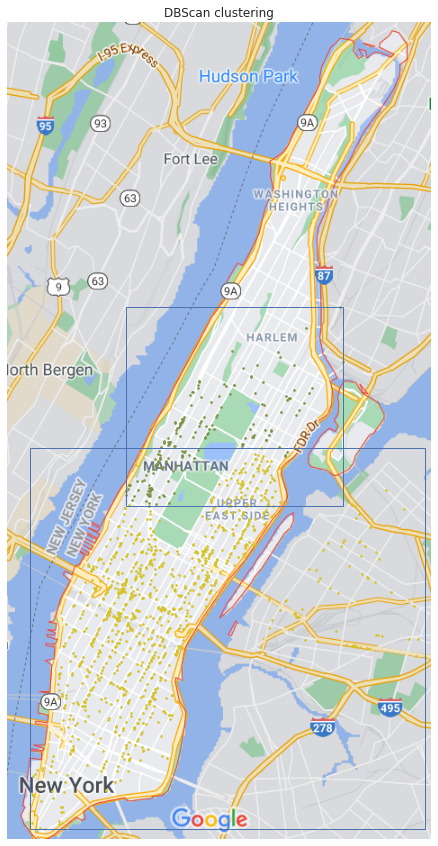

Cluster counter: 2
Time taken:      56.146s


In [ ]:
if __name__ == "__main__":
    epsilon, min_pts = 50, 100

    import time
    start = time.time()
    run_cluster_taxi_single(epsilon, min_pts)
    end = time.time()
    print("Time taken:      {:.3f}s".format(end - start), file=sys.stderr)

In [ ]:
def run(n, a, rctgs, datetime, interval, epsilon, min_pts):
    """
    Reads the input set, clusters the points and writes to output

    :param path_in:     location of the input set
    :param path_out:    location to print the output
    """
    # Step 1: read file and create box graph
    bg = rectangle_set(n, a, rctgs, datetime, interval, epsilon, min_pts)
    points = bg.points
    # test_plot(points)
    # label = [points[i].cluster_label for i in range(len(points))]
    # label = np.array(label)
    # print('unique lables:', np.unique(label))
    
    # Step 2: Compute the core points
    find_core_points(bg)

    # Step 3: cluster the core points
    nr_clusters = compute_cluster_cores(bg)
    # print(nr_clusters)
    # plot_clusters(points, rctgs)

    # Step 4: assign border points to clusters
    assign_border_points(bg)
    
    # try:
    #     bg.write_output(nr_clusters, path_out, assignment_nr)
    # except IOError:
    #     print("could not write output to file:", path_out, file=sys.stderr)

    plot_clusters(points, rctgs)

    print("Cluster counter:", nr_clusters, file=sys.stderr)

box, points, core points:: Func.NONE 12 0
box, points, core points:: Func.NONE 9 0
box, points, core points:: Func.NONE 27 0
box, points, core points:: Func.NONE 44 0
box, points, core points:: Func.NONE 19 0
box, points, core points:: Func.NONE 10 0
box, points, core points:: Func.NONE 1 0
box, points, core points:: Func.NONE 14 0
box, points, core points:: Func.NONE 13 0
box, points, core points:: Func.NONE 17 0
box, points, core points:: Func.CORE 47 4
box, points, core points:: Func.NONE 51 0
box, points, core points:: Func.PARTIAL 13 0
box, points, core points:: Func.NONE 2 0
box, points, core points:: Func.NONE 9 0
box, points, core points:: Func.NONE 24 0
box, points, core points:: Func.CORE 22 5
box, points, core points:: Func.NONE 37 0
box, points, core points:: Func.NONE 22 0
box, points, core points:: Func.NONE 5 0
box, points, core points:: Func.NONE 7 0
box, points, core points:: Func.NONE 8 0
box, points, core points:: Func.NONE 83 0
box, points, core points:: Func.CORE 5

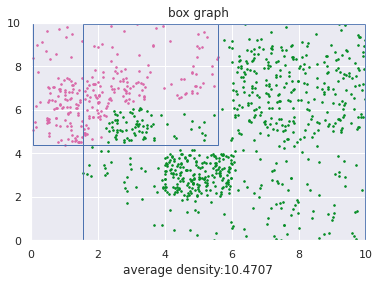

Cluster counter: 2
Time taken:      1.611s


In [ ]:
if __name__ == "__main__":
    r_d = Rectangle(5,5,10,10)
    r_n = Rectangle(2,6,3,3)
    r_p = Rectangle(5,3,2,2)
    r_q = Rectangle(8,7,4,4)
    rctgs = [r_n, r_p, r_q, r_d]

    k = 3

    epsilon, min_pts = 2, 250

    # datetime = '2015-03-15 07:00:00'
    date = dt.date(2015,3,15)
    time = dt.time(7,0,0)
    datetime = dt.datetime.combine(date,time)
    lasting_hours = 12
    import time
    start = time.time()
    run(1_000, [0.2,0.2,0.2], rctgs, datetime, lasting_hours, epsilon, min_pts)
    end = time.time()
    print("Time taken:      {:.3f}s".format(end - start), file=sys.stderr)

In [ ]:
 if __name__ == "__main__":
    r_a = Rectangle(9,9,1,1)
    r_b = Rectangle(2,2,2,2)
    r_c = Rectangle(6,5,4,4)
    r_d = Rectangle(5,5,10,10)
    rctgs = [r_a, r_b, r_c, r_d]

    k = 3

    epsilon, min_pts = 2, 200

    # datetime = '2015-03-15 07:00:00'
    date = dt.date(2015,3,15)
    time = dt.time(7,0,0)
    datetime = dt.datetime.combine(date,time)
    lasting_hours = 12
    import time
    start = time.time()
    run(1_000, [0.3,0.3,0.3], rctgs, datetime, lasting_hours, 2, 100)
    run(1_000, [0.3,0.3,0.3], rctgs, datetime, lasting_hours, 2, 200)
    run(1_000, [0.3,0.3,0.3], rctgs, datetime, lasting_hours, 2, 300)
    end = time.time()
    print("Time taken:      {:.3f}s".format(end - start), file=sys.stderr)


/usr/local/lib/python3.7/dist-packages/numpy/core/fromnumeric.py:3373: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/usr/local/lib/python3.7/dist-packages/numpy/core/_methods.py:170: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


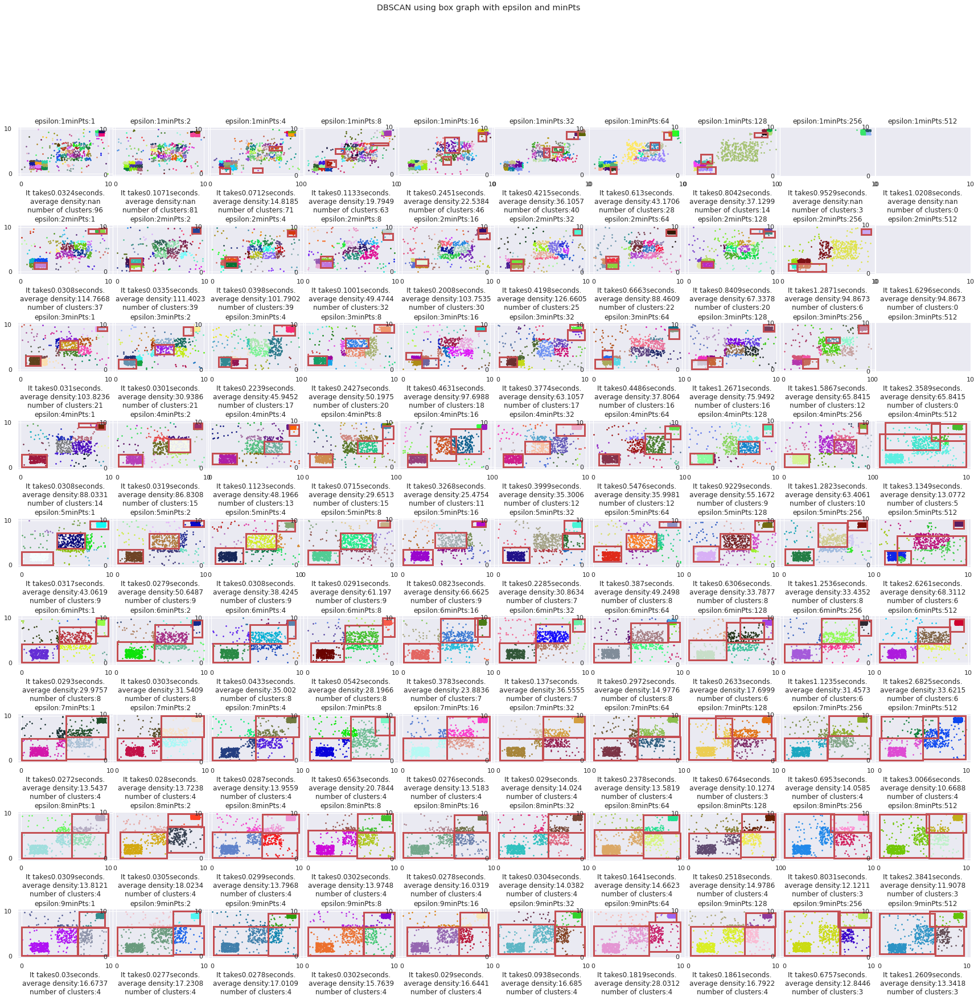

Time taken:      58.833s


In [ ]:
 def generate_rectangle_set(n, a, rctgs, datetime, interval, epsilon, min_pts):
    """
    Reads the input set, clusters the points and writes to output

    :param path_in:     location of the input set
    :param path_out:    location to print the output
    """
    # Step 1: read file and create box graph
    bg = rectangle_set(n, a, rctgs, datetime, interval, epsilon, min_pts)
    
    # Step 2: Compute the core points
    find_core_points(bg)

    # Step 3: cluster the core points
    nr_clusters = compute_cluster_cores(bg)

    # Step 4: assign border points to clusters
    assign_border_points(bg)
    # points = bg.points
    # label = [points[i].cluster_label for i in range(len(points))]
    # label = np.array(label)
    # print('labels:', np.unique(label))

    return bg

def plot_clusters_many(n, a, rctgs, datetime, interval, epsilon_list, min_pts_list):
    # Plot init seeds along side sample data=
    # color ="%06x" % random.randint(0, 0xFFFFFF)
    # color = '#'+color.upper()
    
    fig = plt.figure(figsize=(30, 30))
    fig.tight_layout()
    plt.subplots_adjust(wspace=0,hspace=1)
    fig.suptitle('DBSCAN using box graph with epsilon and minPts')

    #  plot Numerical Data
    row = len(min_pts_list)  # number of rows
    column = len(epsilon_list)+1  # number of columns
    order = 1  # initialize plot counter
    cnt = 0

    for eps in epsilon_list:
        for mpt in min_pts_list:
            start = time.time()
            bg = generate_rectangle_set(n, a, rctgs, datetime, interval, eps, mpt)
            end = time.time()
            cost_time = end - start
            points = bg.points

            label = [points[i].cluster_label for i in range(len(points))]
            label = np.array(label)

            colors = ['#'+("%06x" % random.randint(0, 0xFFFFFF)).upper() for _ in range(len(np.unique(label)))]
            
            # print('labels:', np.unique(label))
            # print('the first 5 labels:', label[:5])
            X = [np.array(points[i].coords) for i in range(len(points))]
            X = np.array(X)
            # print('number of coords:', len(X))
            # print('the first 5 coords:', X[:5])

            ax = fig.add_subplot(row, column, order+cnt)
            cnt += 1

            for idx, col in enumerate(colors,1):
                # print(idx, col)
                cluster_data = label == idx
                ax.scatter(X[cluster_data, 0], X[cluster_data, 1],
                            c=col, marker='.', s=10)
            
            # currentAxis = plt.gca()
            # big_rect = rctgs[-1]
            # for r in rctgs:
            #     currentAxis.add_patch(patches.Rectangle((r.x-r.width/2, r.y-r.height/2), r.width, r.height, linewidth=1, edgecolor='b', fill=None))

            currentAxis = plt.gca()
            big_rect = rctgs[-1]
            cluster_rect = []
            unique_label = np.unique(label)
            # unique_label = unique_label[unique_label != -1]
            # for idx, lbl in enumerate(np.unique(label),1):
            for idx in range(1,len(unique_label)+1):
                cluster_data = label == idx
                if np.any(cluster_data):
                    left, right = np.min(X[cluster_data,0]), np.max(X[cluster_data,0])
                    bottom, top = np.min(X[cluster_data,1]), np.max(X[cluster_data,1])
                    width, height = abs(right-left), abs(top-bottom)
                    # currentAxis.add_patch(patches.Rectangle((left, bottom), width, height, linewidth=1, edgecolor='b', fill=None))
                    temp_rect = Rectangle(0.5*(left+right), 0.5*(top+bottom), width, height)
                    # print(left, right, top,bottom)
                    # print('x:',temp_rect.x,'y:',temp_rect.y, temp_rect.x_min )
                    cluster_rect.append(temp_rect)
            
            # print('number of clusters:', len(cluster_rect))
            if len(cluster_rect)>0:
                k_rects, k_density = dense_rectangle(points, cluster_rect, k=3, min_area=1)
                for r in k_rects:
                    currentAxis.add_patch(patches.Rectangle((r.x-r.width/2, r.y-r.height/2), r.width, r.height, linewidth=3, edgecolor='r', fill=None))

            title = 'epsilon:' + str(eps) + '. minPts:' + str(mpt)
            ax.set_title(title)
            xlabel_1 = 'It takes' + str(round(cost_time, 4)) + 'seconds.' + '\n'
            xlabel_2 = 'average density:' + str(round(np.mean(k_density), 4))+'\n'
            xlabel_3 = 'number of clusters:'+str(len(cluster_rect))
            xlabel = xlabel_1 + xlabel_2 + xlabel_3
            ax.set_xlabel(xlabel)
            min_x, max_x = big_rect.x-big_rect.width/2, big_rect.x+big_rect.width/2
            min_y, max_y = big_rect.y-big_rect.height/2, big_rect.y+big_rect.height/2
            ax.set_xticks([min_x, max_x])
            ax.set_yticks([min_y, max_y])

    plt.show()

if __name__ == "__main__":
    r_a = Rectangle(9,9,1,1)
    r_b = Rectangle(2,2,2,2)
    r_c = Rectangle(6,5,4,4)
    r_d = Rectangle(5,5,10,10)
    rctgs = [r_a, r_b, r_c, r_d]

    k = 3
    n = 1_000
    a = [0.3,0.3,0.3]

    epsilon, min_pts = 5, 200

    # datetime = '2015-03-15 07:00:00'
    date = dt.date(2015,3,15)
    time = dt.time(7,0,0)
    datetime = dt.datetime.combine(date,time)
    lasting_hours = 12

    epsilon_list = np.array(list(range(1,r_d.width)))
    power = np.array(list(range(int(math.log2(n))+1)))
    min_pts_list = 2**power

    import time
    start = time.time()
    plot_clusters_many(n, a, rctgs, datetime, lasting_hours, epsilon_list, min_pts_list)
    end = time.time()
    print("Time taken:      {:.3f}s".format(end - start), file=sys.stderr)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:24: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stab

1216
0


/usr/local/lib/python3.7/dist-packages/numpy/core/fromnumeric.py:3373: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/usr/local/lib/python3.7/dist-packages/numpy/core/_methods.py:170: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


1216
0
1216
0
1216
0
1216
0
1216
0
1216
0
1216
0


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:24: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stab

1039
0


/usr/local/lib/python3.7/dist-packages/numpy/core/fromnumeric.py:3373: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/usr/local/lib/python3.7/dist-packages/numpy/core/_methods.py:170: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


1039
0
1039
0
1039
0
1039
0
1039
0
1039
0
1039
0


KeyboardInterrupt: ignored

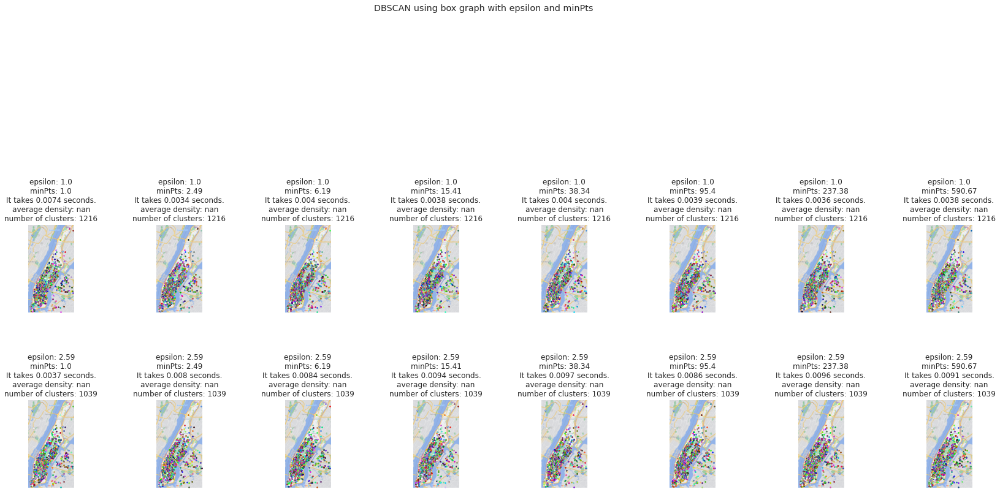

In [ ]:
def taxi_set(epsilon, min_pts=100):
    data=pd.read_csv("yellow_tripdata_2015-01.csv")
    data['tpep_pickup_datetime']=pd.to_datetime(data['tpep_pickup_datetime'])
    data['tpep_dropoff_datetime']=pd.to_datetime(data['tpep_dropoff_datetime'])
    
    del data['store_and_fwd_flag']
    del data['RateCodeID']
    del data['payment_type']
    del data['fare_amount']
    del data['extra']
    del data['mta_tax']
    del data['tip_amount']
    del data['tolls_amount']
    del data['improvement_surcharge']
    del data['total_amount']
    
    data['tpep_pickup_datetime']=pd.to_datetime(data['tpep_pickup_datetime'])
    data['tpep_dropoff_datetime']=pd.to_datetime(data['tpep_dropoff_datetime'])
    s_date = dt.date(2015,1,10)
    s_time = dt.time(7,0,0)
    s_datetime = dt.datetime.combine(s_date,s_time)
    data_oneday = select_day(s_datetime, 0.25, data, 'tpep_pickup_datetime')

    data_oneday['pickup_coords']=data_oneday.apply(lambda x: latlngToScreenXY(x['pickup_latitude'], x['pickup_longitude']), axis=1)
    data_oneday['dropoff_coords']=data_oneday.apply(lambda x: latlngToScreenXY(x['dropoff_latitude'], x['dropoff_longitude']), axis=1)

    data_oneday['pickup_x'] = data_oneday['pickup_coords'].apply(lambda x: x['x'])
    data_oneday['pickup_y'] = data_oneday['pickup_coords'].apply(lambda x: x['y'])
    data_oneday['dropoff_x'] = data_oneday['dropoff_coords'].apply(lambda x: x['x'])
    data_oneday['dropoff_y'] = data_oneday['dropoff_coords'].apply(lambda x: x['y'])

    # data that fit in the image
    data_oneday = data_oneday[(data_oneday['pickup_x'] >= 0) & (data_oneday['pickup_x'] <= 471) & (data_oneday['pickup_y'] <= 907) & (data_oneday['pickup_y'] >= 0)]

    n, d = len(data_oneday), 2
    list_points = []
    for j in range(n):
        x, y = data_oneday.iloc[j,-4], data_oneday.iloc[j,-3]
        datetime_generated = data_oneday.iloc[j,1]
        list_points.append(ClusterPoint(d, [x,y],ID=j,datetime=datetime_generated))
    min_pts = math.inf
    return BoxGraph(n, d, epsilon, min_pts, list_points)

def n_type_of_points_in_rectangle(rects, points, type_req):
    '''
        p: one point of format (diemension, coords, cluster_label)
        q: one point of format (diemension, coords, cluster_label)
        points: list of points of format (diemension, coords, cluster_label)
    '''
    cnt = 0
    for i in range(len(points)):
        x,y = points[i].coords
        for r in rects:
            xl = r.x_min
            xr = r.x_max
            yl = r.y_min
            yr = r.y_max
            if xl <= x <= xr and yl <= y <= yr and points[i].type_point==type_req:
                cnt += 1
                break
    return cnt

def generate_bg_list(df):
    n, d = len(df.index), 2
    list_points = []
    for j in range(n):
        x, y = df.iloc[j,-4], df.iloc[j,-3]
        datetime_generated = df.iloc[j,1]
        list_points.append(ClusterPoint(d, [x,y], ID=j, datetime=datetime_generated,type_point='taxi'))
    return list_points

def run_cluster_taxi_and_rect_prob(bg):
    """
    Reads the input set, clusters the points and writes to output

    :param path_in:     location of the input set
    :param path_out:    location to print the output
    """
    # Step 1: read file and create box graph
    # bg = taxi_set(epsilon, min_pts)
    print('number of points:',len(bg.points))
    
    # Step 2: Compute the core points
    find_core_points(bg)

    # Step 3: cluster the core points
    nr_clusters = compute_cluster_cores(bg)

    # Step 4: assign border points to clusters
    assign_border_points(bg)
    
    # points = bg.points
    # plot_clusters_taxi(points)

    # print("Cluster counter:", nr_clusters, file=sys.stderr)

def plot_clusters_taxi_many(epsilon_list, gamma_mpt):
    # Plot init seeds along side sample data=
    # color ="%06x" % random.randint(0, 0xFFFFFF)
    # color = '#'+color.upper()
    
    fig = plt.figure(figsize=(30, 50))
    fig.tight_layout()
    plt.subplots_adjust(wspace=0,hspace=1)
    fig.suptitle('DBSCAN using box graph with epsilon and minPts')

    #  plot Numerical Data
    row = 10  # number of rows
    column = len(epsilon_list)  # number of columns
    order = 1  # initialize plot counter
    cnt = 0

    im = plt.imread('manhattan.png')
    dpi = 80
    height, width, depth = im.shape
    figsize = width / float(dpi), height / float(dpi)
    # ax = fig.add_axes([0, 0, 1, 1])

    for eps in epsilon_list:
        bg = taxi_set(eps)
        number_of_points = len(bg.points)
        max_pow_mpt = math.log(number_of_points, 1+gamma_mpt)
        min_pts_pow_list = np.array(range(0,int(max_pow_mpt)+1,5))
        min_pts_list = (1+gamma_mpt)**min_pts_pow_list
        for mpt in min_pts_list:
            start = time.time()
            bg.min_pts = mpt
            find_core_points(bg)
            nr_clusters = compute_cluster_cores(bg)
            assign_border_points(bg)
            end = time.time()
            cost_time = end - start
            points = bg.points

            label = [points[i].cluster_label for i in range(len(points))]
            label = np.array(label)

            colors = ['#'+("%06x" % random.randint(0, 0xFFFFFF)).upper() for _ in range(len(np.unique(label)))]
            
            # print('labels:', np.unique(label))
            # print('the first 5 labels:', label[:5])
            X = [np.array(points[i].coords) for i in range(len(points))]
            X = np.array(X)
            # print('number of coords:', len(X))
            # print('the first 5 coords:', X[:5])

            ax = fig.add_subplot(row, column, order+cnt)
            cnt += 1
            # ax_im = fig.add_axes([0, 0, 1, 1])
            # Hide spines, ticks, etc.
            ax.axis('off')
            ax.imshow(im, cmap='gray')
            implot = plt.imshow(im)

            for idx, col in enumerate(colors,1):
                # print(idx, col)
                cluster_data = label == idx
                ax.scatter(X[cluster_data, 0], X[cluster_data, 1],
                            c=col, marker='.', s=10)
            
            currentAxis = plt.gca()
            # big_rect = rctgs[-1]
            cluster_rect = []
            unique_label = np.unique(label)
            # unique_label = unique_label[unique_label != -1]
            # for idx, lbl in enumerate(np.unique(label),1):
            for idx in range(1,len(unique_label)+1):
                cluster_data = label == idx
                if np.any(cluster_data):
                    left, right = np.min(X[cluster_data,0]), np.max(X[cluster_data,0])
                    bottom, top = np.min(X[cluster_data,1]), np.max(X[cluster_data,1])
                    width, height = abs(right-left), abs(top-bottom)
                    # currentAxis.add_patch(patches.Rectangle((left, bottom), width, height, linewidth=1, edgecolor='b', fill=None))
                    temp_rect = Rectangle(0.5*(left+right), 0.5*(top+bottom), width, height)
                    # print(left, right, top,bottom)
                    # print('x:',temp_rect.x,'y:',temp_rect.y, temp_rect.x_min )
                    cluster_rect.append(temp_rect)
            
            # print('number of clusters:', len(cluster_rect))
            max_avg_dens = 0
            if len(cluster_rect)>0:
                print(len(cluster_rect))
                k_rects, k_density = dense_rectangle(points, cluster_rect)
                average_density = np.mean(k_density)
                if average_density > max_avg_dens: max_avg_dens = average_density
                for r in k_rects:
                    currentAxis.add_patch(patches.Rectangle((r.x-r.width/2, r.y-r.height/2), r.width, r.height, linewidth=3, edgecolor='r', fill=None))

            print(max_avg_dens)
            titile_1 = 'epsilon: ' + str(round(eps,2)) + '\n' + 'minPts: ' + str(round(mpt,2)) + '\n'
            titile_2 = 'It takes ' + str(round(cost_time, 4)) + ' seconds.' + '\n'
            titile_3 = 'average density: ' + str(round(average_density, 4))+'\n'
            titile_4 = 'number of clusters: '+str(len(cluster_rect))
            title = titile_1 + titile_2 + titile_3 + titile_4
            ax.set_title(title)           
            # ax_im.set_xlabel(xlabel)
            ax.set_xticks([])
            ax.set_yticks([])

    plt.show()

if __name__ == "__main__":

    # epsilon_list = np.array(list(range(1,470,100)))
    # power = np.array(list(range(int(math.log2(1_000))+1)))
    # min_pts_list = 2**power
    # epsilon_list, min_pts_list = [10, 50, 100], [16, 64, 218]
    
    min_area = 4
    lambda_eps, gamma_mpt = 0.1, 0.2
    min_area_r = math.sqrt(min_area/math.pi) 
    min_pow_eps = lambda_eps * math.log(min_area_r,1+lambda_eps)     # math.log(x, base)

    w_image, h_image = 471, 907
    z = max(w_image, h_image)
    max_pow_eps = math.log(z, 1+lambda_eps)
    pow_eps = np.array(range(int(min_pow_eps), int(max_pow_eps)+1, 10))
    # epsilons = list(range(int((1+lambda_eps)**min_pow_eps), int((1+lambda_eps)**max_pow_eps)+1))
    epsilon_list = (1+lambda_eps)**pow_eps

    import time 
    start = time.time()
    plot_clusters_taxi_many(epsilon_list, gamma_mpt)
    end = time.time()
    print("Time taken:      {:.3f}s".format(end - start), file=sys.stderr)

In [ ]:
if __name__ == "__main__":
    r_a = Rectangle(7,7,2,2)
    r_b = Rectangle(2,2,2,2)
    r_d = Rectangle(5,5,10,10)
    rctgs = [r_a, r_b, r_d]

    k = 2

    epsilon, min_pts = 5, 200

    # # datetime = '2015-03-15 07:00:00'
    # date = dt.date(2015,3,15)
    # time = dt.time(7,0,0)
    # datetime = dt.datetime.combine(date,time)
    # lasting_hours = 12
    # import time
    # start = time.time()
    # run(1_000, [0.3,0.3], rctgs, datetime, lasting_hours, epsilon, min_pts)
    # end = time.time()
    # print("Time taken:      {:.3f}s".format(end - start), file=sys.stderr)

    start = time.time()
    run_cluster(epsilon, min_pts)
    end = time.time()
    print("Time taken:      {:.3f}s".format(end - start), file=sys.stderr)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:24: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stab

number of points: 1348
27
number of labels: 1348
labels: [-1  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27]
number of coords: 1348
the first 5 coords: [[ 38.16368028 829.96090501]
 [121.54181532 609.6853233 ]
 [169.74251325 729.59751809]
 [135.03332822 512.86575967]
 [294.00490755 663.67084884]]
number of core points: 1
the first 5 core points: [<generator object plot_clusters_taxi.<locals>.<genexpr> at 0x7fe75cbe1250>]
3 0.022291503415119897


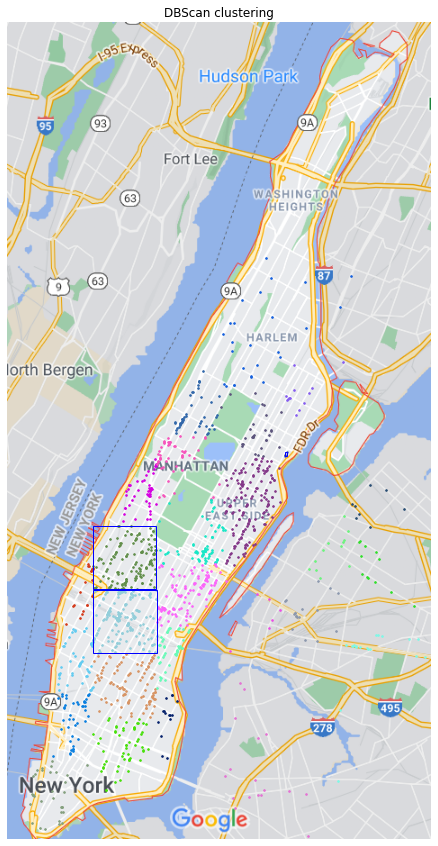

Cluster counter: 27
Time taken:      77.854s


In [ ]:
def plot_clusters_taxi(points):    
    im = plt.imread('manhattan.png')
    dpi = 80
    height, width, depth = im.shape
    figsize = width / float(dpi), height / float(dpi)
    fig = plt.figure(figsize=figsize)
    ax = fig.add_axes([0, 0, 1, 1])

    label = [points[i].cluster_label for i in range(len(points))]
    label = np.array(label)

    colors = ['#'+("%06x" % random.randint(0, 0xFFFFFF)).upper() for _ in range(len(label))]
    
    # cmap = plt.get_cmap('gnuplot')
    # colors = [cmap(i) for i in np.linspace(0, 1, len(label))]
    colors = colors[:len(label)]
    print('number of labels:', len(label))
    print('labels:', np.unique(label))
    X = [np.array(points[i].coords) for i in range(len(points))]
    X = np.array(X)
    print('number of coords:', len(X))
    print('the first 5 coords:', X[:5])
    core_points = [(np.array(points[i].coords) for i in range(len(points)) if points[i].func==ClusterPoint.Func.CORE)]
    core_points = np.array(core_points)
    print('number of core points:', len(core_points))
    print('the first 5 core points:', core_points[:5])
    for idx, col in enumerate(colors):
        # print(idx, col)
        cluster_data = label == idx
        ax.scatter(X[cluster_data, 0], X[cluster_data, 1],
                    c=col, marker='.', s=10)

    currentAxis = plt.gca()
    # big_rect = rctgs[-1]
    cluster_rect = []
    for idx in range(1,len(np.unique(label))+1):
        cluster_data = label == idx
        # print(len(cluster_data),np.unique(cluster_data))
        if np.any(cluster_data):
            left, right = min(X[cluster_data,0]), max(X[cluster_data,0])
            bottom, top = min(X[cluster_data,1]), max(X[cluster_data,1])
            width, height = abs(right-left), abs(top-bottom)
            # currentAxis.add_patch(patches.Rectangle((left, bottom), width, height, linewidth=1, edgecolor='b', fill=None))
            temp_rect = Rectangle(0.5*(left+right), 0.5*(top+bottom), width, height)
            cluster_rect.append(temp_rect)
    
    k_rects, average_density = dense_rectangle(points, cluster_rect)
    print(len(k_rects), average_density)
    for r in k_rects:
        currentAxis.add_patch(patches.Rectangle((r.x-r.width/2, r.y-r.height/2), r.width, r.height, linewidth=1, edgecolor='b', fill=None))

    # Hide spines, ticks, etc.
    ax.axis('off')

    # Display the image.
    ax.imshow(im, cmap='gray')
    implot = plt.imshow(im)

    # plt.scatter(core_points[:,0], core_points[:,1], c='b', s=50)
    plt.title("DBScan clustering")
    # plt.xticks([])
    # plt.yticks([])

    plt.show()

def run_cluster_taxi_single(epsilon, min_pts):
    """
    Reads the input set, clusters the points and writes to output

    :param path_in:     location of the input set
    :param path_out:    location to print the output
    """
    # Step 1: read file and create box graph
    bg = taxi_set(epsilon, min_pts)
    print('number of points:',len(bg.points))
    
    # Step 2: Compute the core points
    find_core_points(bg)

    # Step 3: cluster the core points
    nr_clusters = compute_cluster_cores(bg)
    print(nr_clusters)

    # Step 4: assign border points to clusters
    assign_border_points(bg)

    points = bg.points
    plot_clusters_taxi(points)

    print("Cluster counter:", nr_clusters, file=sys.stderr)

if __name__ == "__main__":
    
    epsilon, min_pts = 100, 50

    start = time.time()
    run_cluster_taxi_single(epsilon, min_pts)
    end = time.time()
    print("Time taken:      {:.3f}s".format(end - start), file=sys.stderr)

number of points: 1716
3 [0.07811752403120742, 0.05869612946163884, 0.055726109785994314]


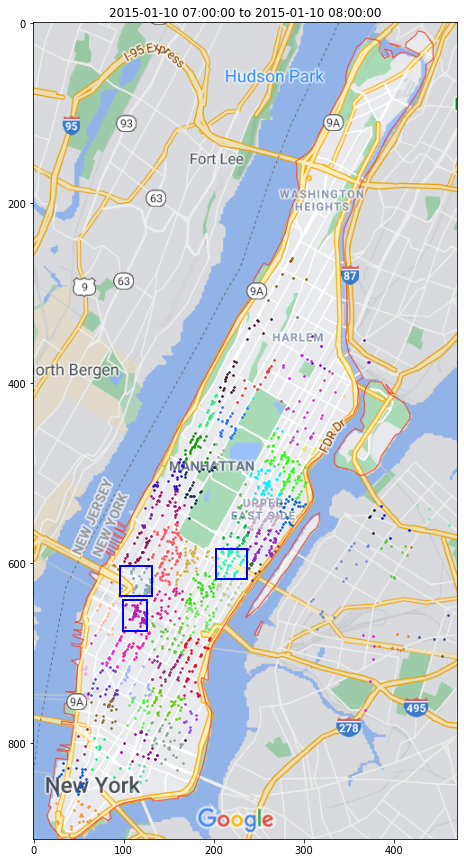

KeyboardInterrupt: ignored

In [ ]:
from IPython.display import clear_output

def generate_bg(df, epsilon, min_pts):
    n, d = len(df.index), 2
    list_points = []
    for j in range(n):
        x, y = df.iloc[j,-4], df.iloc[j,-3]
        datetime_generated = df.iloc[j,1]
        list_points.append(ClusterPoint(d, [x,y], ID=j, datetime=datetime_generated))
    return BoxGraph(n, d, epsilon, min_pts, list_points)

def run_cluster_taxi_prob(bg):
    """
    Reads the input set, clusters the points and writes to output

    :param path_in:     location of the input set
    :param path_out:    location to print the output
    """
    # Step 1: read file and create box graph
    # bg = taxi_set(epsilon, min_pts)
    print('number of points:',len(bg.points))
    
    # Step 2: Compute the core points
    find_core_points(bg)

    # Step 3: cluster the core points
    nr_clusters = compute_cluster_cores(bg)

    # Step 4: assign border points to clusters
    assign_border_points(bg)
    
    # points = bg.points
    # plot_clusters_taxi(points)

    # print("Cluster counter:", nr_clusters, file=sys.stderr)

def plot_sliding_window_prob(df, begin_date, interval, w, column, eps, mpt, prob=0.2, unit='minute'):
    '''
        df: dataframes
        begin_date: datetime
        interval: int, the window move to begin_time+interval next time
        w: int, the size of the sliding window
        unit: string, the unit of the sliding window
        column: string, the name of the required column

        only plot, not return
    '''
    start_time = begin_date

    after_start_date = df[column] >= start_time
    before_end_date = df[column] < start_time + dt.timedelta(minutes=w)
    between_two_dates = after_start_date & before_end_date
    filtered_df = df.loc[between_two_dates]

    # choose it with probability
    n_samples = len(filtered_df.index)
    index_list = []
    for j in range(n_samples):
        b = np.random.uniform(0,1)        # Generate a random float from 0 to 1
        if b <= prob:
            index_list.append(j)
    sampled_df = filtered_df.iloc[np.array(index_list)]

    # initializing the window
    init_df = TimeWindow(w, start_time, sampled_df)
    filtered_tw = init_df
    latest_window = filtered_tw.window
    
    # generate the boxgraph for the window and run DBSCAN
    for _ in range(100):
        im = plt.imread('manhattan.png')
        dpi = 80
        height, width, depth = im.shape
        figsize = width / float(dpi), height / float(dpi)
        fig = plt.figure(figsize=figsize)
        ax = fig.add_axes([0, 0, 1, 1])
        ax.imshow(im, cmap='gray')
        implot = plt.imshow(im)

        temp_bg = generate_bg(latest_window, eps, int(mpt*prob))
        run_cluster_taxi_prob(temp_bg)
        points = temp_bg.points

        label = [points[i].cluster_label for i in range(len(points))]
        label = np.array(label)

        colors = ['#'+("%06x" % random.randint(0, 0xFFFFFF)).upper() for _ in range(len(label))]
        
        # cmap = plt.get_cmap('gnuplot')
        # colors = [cmap(i) for i in np.linspace(0, 1, len(label))]
        colors = colors[:len(label)]
        # print('number of labels:', len(label))
        # print('labels:', np.unique(label))
        X = [np.array(points[i].coords) for i in range(len(points))]
        X = np.array(X)
        # print('number of coords:', len(X))
        # print('the first 5 coords:', X[:5])
        # core_points = [(np.array(points[i].coords) for i in range(len(points)) if points[i].func==ClusterPoint.Func.CORE)]
        # core_points = np.array(core_points)
        # print('number of core points:', len(core_points))
        # print('the first 5 core points:', core_points[:5])
        for idx, col in enumerate(colors):
            # print(idx, col)
            cluster_data = label == idx
            dots = ax.scatter(X[cluster_data, 0], X[cluster_data, 1],
                        c=col, marker='.', s=10)

        # currentAxis = plt.gca()
        # big_rect = rctgs[-1]
        cluster_rect = []
        for idx in range(1,len(np.unique(label))+1):
            cluster_data = label == idx
            # print(len(cluster_data),np.unique(cluster_data))
            if np.any(cluster_data):
                left, right = np.min(X[cluster_data,0]), np.max(X[cluster_data,0])
                bottom, top = np.min(X[cluster_data,1]), np.max(X[cluster_data,1])
                width, height = abs(right-left), abs(top-bottom)
                # currentAxis.add_patch(patches.Rectangle((left, bottom), width, height, linewidth=1, edgecolor='b', fill=None))
                temp_rect = Rectangle(0.5*(left+right), 0.5*(top+bottom), width, height)
                cluster_rect.append(temp_rect)
        
        k_rects, average_density = dense_rectangle(points, cluster_rect)
        print(len(k_rects), average_density)
        for r in k_rects:
            ax.add_patch(patches.Rectangle((r.x-r.width/2, r.y-r.height/2), r.width, r.height, linewidth=2, edgecolor='b', fill=None))

        plt.draw()
        title_str = str(start_time)+' to '+str(start_time+ dt.timedelta(minutes=w))
        plt.title(title_str)
        plt.pause(15)
        dots.remove()
        clear_output(wait=True)
        start_time += dt.timedelta(minutes=interval)
        
        # Hide spines, ticks, etc.
        ax.axis('off')

        # plt.scatter(core_points[:,0], core_points[:,1], c='b', s=50)
        # plt.title("DBScan clustering")
        # plt.xticks([])
        # plt.yticks([])

        filtered_tw = filtered_tw.sliding_with_prob(interval, df, column, prob)
        latest_window = filtered_tw.window
        # n_samples = len(latest_window.index)
        # index_list = []
        # for j in range(n_samples):
        #     b = np.random.uniform(0,1)        # Generate a random float from 0 to 1
        #     if b <= prob:
        #         index_list.append(j)
        # latest_window = latest_window.iloc[np.array(index_list)]

    plt.show()

plot_sliding_window_prob(data_oneday, s_datetime, 30, 60, 'tpep_pickup_datetime', 50, 50, 1/4)

In [ ]:
data=pd.read_csv("yellow_tripdata_2015-01.csv")
data['tpep_pickup_datetime']=pd.to_datetime(data['tpep_pickup_datetime'])
data['tpep_dropoff_datetime']=pd.to_datetime(data['tpep_dropoff_datetime'])

del data['store_and_fwd_flag']
del data['RateCodeID']
del data['payment_type']
del data['fare_amount'] 
del data['extra']
del data['mta_tax']
del data['tip_amount']
del data['tolls_amount']
del data['improvement_surcharge']
del data['total_amount']

data['tpep_pickup_datetime']=pd.to_datetime(data['tpep_pickup_datetime'])
data['tpep_dropoff_datetime']=pd.to_datetime(data['tpep_dropoff_datetime'])

s_date = dt.date(2015,1,10)
s_time = dt.time(7,0,0)
s_datetime = dt.datetime.combine(s_date,s_time)
data_oneday = select_day(s_datetime, 12, data, 'tpep_pickup_datetime')

data_oneday['pickup_coords']=data_oneday.apply(lambda x: latlngToScreenXY(x['pickup_latitude'], x['pickup_longitude']), axis=1)
data_oneday['dropoff_coords']=data_oneday.apply(lambda x: latlngToScreenXY(x['dropoff_latitude'], x['dropoff_longitude']), axis=1)

data_oneday['pickup_x'] = data_oneday['pickup_coords'].apply(lambda x: x['x'])
data_oneday['pickup_y'] = data_oneday['pickup_coords'].apply(lambda x: x['y'])
data_oneday['dropoff_x'] = data_oneday['dropoff_coords'].apply(lambda x: x['x'])
data_oneday['dropoff_y'] = data_oneday['dropoff_coords'].apply(lambda x: x['y'])

# data that fit in the image
data_oneday = data_oneday[(data_oneday['pickup_x'] >= 0) & (data_oneday['pickup_x'] <= 471) & (data_oneday['pickup_y'] <= 907) & (data_oneday['pickup_y'] >= 0)]

data_oneday.head()

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:24: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stab

,VendorID,tpep_pickup_datetime,tpep_dropoff_datetime,passenger_count,trip_distance,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,pickup_coords,dropoff_coords,pickup_x,pickup_y,dropoff_x,dropoff_y
2266,2,2015-01-10 18:49:53,2015-01-10 18:55:20,2,0.38,-73.992073,40.733704,-73.986923,40.731392,"{'x': 119.55174400121005, 'y': 743.9076306341125}","{'x': 139.30612839868863, 'y': 755.5791356194767}",119.551744,743.907631,139.306128,755.579136
2267,2,2015-01-10 18:49:53,2015-01-10 18:52:33,1,0.48,-74.005196,40.722820,-74.005753,40.726429,"{'x': 69.21464598111862, 'y': 798.8561516296111}","{'x': 67.07824589075277, 'y': 780.6362775105441}",69.214646,798.856152,67.078246,780.636278
2268,2,2015-01-10 18:49:53,2015-01-10 18:58:19,1,2.03,-73.953850,40.781818,-73.972229,40.756420,"{'x': 266.1731748619472, 'y': 500.9823956829586}","{'x': 195.67197187924242, 'y': 629.2148712482311}",266.173175,500.982396,195.671972,629.214871
2269,2,2015-01-10 18:49:53,2015-01-10 18:54:00,1,0.63,-73.986938,40.756310,-73.975960,40.751469,"{'x': 139.24759688930345, 'y': 629.7734086155176}","{'x': 181.3610178491113, 'y': 654.2142334115559}",139.247597,629.773409,181.361018,654.214233
2270,2,2015-01-10 18:49:54,2015-01-10 19:03:42,1,1.23,-73.984756,40.753063,-73.986694,40.760891,"{'x': 147.61760272289203, 'y': 646.1635913589911}","{'x': 140.18410103851886, 'y': 606.6422576461736}",147.617603,646.163591,140.184101,606.642258


before delete: 1889
after delete: 1773
before: 759 after sample: 213
number of points: 2691
3 [0.3123048331776329, 0.22957812050141005, 0.1604705216682383]


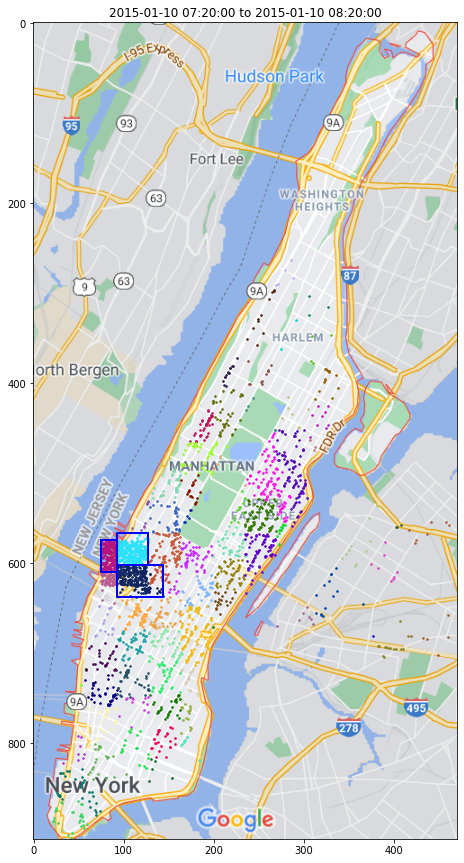

KeyboardInterrupt: ignored

In [ ]:
def rectangle_set_list(n_samples, a, rctgs, datetime, interval):
    '''
        n_samples: int, number of points
        a: int list, the probability to be in the smaller rectangles
        rctgs: list of rectangles of class Rectangle, the first one is the biggest one
        datetime: datetime, 'yyyy-mm-dd hh:mm:ss'
        interval: int, the lasting time (e.g. 12 hours) from the starting time (i.e. date)
    '''
    list_points = []
    d = 2

    # insert 0 at the beginning and 1 at the end
    a = [0] + a
    for i in range(1, len(a)-1):
        a[i] = a[i-1] + a[i]

    for j in range(n_samples):
        b = np.random.uniform(0,1)        # Generate a random float from 0 to 1
        for i in range(len(a)-1):
            if a[i] < b <= a[i+1]:
                tmp_rctg = rctgs[i]
                x = np.random.uniform(low=tmp_rctg.x_min, high=tmp_rctg.x_min+tmp_rctg.width)
                y = np.random.uniform(low=tmp_rctg.y_min, high=tmp_rctg.y_min+tmp_rctg.height)
                hour_low = datetime.hour
                hour = np.random.randint(low=hour_low, high=hour_low+interval)
                year, month, day = datetime.year, datetime.month, datetime.day
                minute = np.random.randint(low=0, high=59)
                second = np.random.randint(low=0, high=59)
                day_month = day_of_month(year, month)
                if hour >= 24:
                    hour = hour % 24
                    if day<day_month:
                        day = day + 1
                    else:
                        day = (day + 1) % day_month
                # date_str = str(year)+'-'+str(month).zfill(2)+'-'+str(day).zfill(2)+' '+str(hour).zfill(2)+':'+str(minute).zfill(2)+':'+str(second).zfill(2)
                date_generated = dt.date(year, month, day)
                time_generated = dt.time(hour, minute, second)
                datetime_generated = dt.datetime.combine(date_generated, time_generated)
                list_points.append(ClusterPoint(d, [x,y],ID=j,datetime=datetime_generated,type_point='Rect'))
                break
    return list_points

def generate_bg_list(df):
    n, d = len(df.index), 2
    list_points = []
    for j in range(n):
        x, y = df.iloc[j,-4], df.iloc[j,-3]
        datetime_generated = df.iloc[j,1]
        list_points.append(ClusterPoint(d, [x,y], ID=j, datetime=datetime_generated))
    return list_points

def run_cluster_taxi_and_rect_prob(bg):
    """
    Reads the input set, clusters the points and writes to output

    :param path_in:     location of the input set
    :param path_out:    location to print the output
    """
    # Step 1: read file and create box graph
    # bg = taxi_set(epsilon, min_pts)
    print('number of points:',len(bg.points))
    
    # Step 2: Compute the core points
    find_core_points(bg)

    # Step 3: cluster the core points
    nr_clusters = compute_cluster_cores(bg)

    # Step 4: assign border points to clusters
    assign_border_points(bg)
    
    # points = bg.points
    # plot_clusters_taxi(points)

    # print("Cluster counter:", nr_clusters, file=sys.stderr)

def plot_sliding_window_taxi_and_rect_prob(df, begin_date, interval, w, column, eps, mpt, prob=0.2, unit='minute'):
    '''
        df: dataframes
        begin_date: datetime
        interval: int, the window move to begin_time+interval next time
        w: int, the size of the sliding window
        unit: string, the unit of the sliding window
        column: string, the name of the required column

        only plot, not return
    '''
    start_time = begin_date

    after_start_date = df[column] >= start_time
    before_end_date = df[column] < start_time + dt.timedelta(minutes=w)
    between_two_dates = after_start_date & before_end_date
    filtered_df = df.loc[between_two_dates]

    # choose it with probability
    n_samples = len(filtered_df.index)
    index_list = []
    for j in range(n_samples):
        b = np.random.uniform(0,1)        # Generate a random float from 0 to 1
        if b <= prob:
            index_list.append(j)
    sampled_df = filtered_df.iloc[np.array(index_list)]

    # initializing the window
    init_df = TimeWindow(w, start_time, sampled_df)
    filtered_tw = init_df
    latest_window = filtered_tw.window

    rect_1 = Rectangle(100, 600, 50, 50)
    rect_2 = Rectangle(300, 500, 80, 80)
    rctgs = [rect_1, rect_2]

    date = dt.date(2015,3,15)
    time = dt.time(7,0,0)
    datetime = dt.datetime.combine(date,time)

    interval = 5

    rect_set_list = rectangle_set_list(1000, [0.7,0.3], rctgs, datetime, interval)
    
    # generate the boxgraph for the window and run DBSCAN
    for _ in range(100):
        im = plt.imread('manhattan.png')
        dpi = 80
        height, width, depth = im.shape
        figsize = width / float(dpi), height / float(dpi)
        fig = plt.figure(figsize=figsize)
        ax = fig.add_axes([0, 0, 1, 1])
        ax.imshow(im, cmap='gray')
        implot = plt.imshow(im)

        temp_point_list = generate_bg_list(latest_window) + rect_set_list
        temp_bg = BoxGraph(len(temp_point_list), 2, eps, int(mpt*prob), temp_point_list)
        run_cluster_taxi_and_rect_prob(temp_bg)
        points = temp_bg.points

        label = [points[i].cluster_label for i in range(len(points))]
        label = np.array(label)

        colors = ['#'+("%06x" % random.randint(0, 0xFFFFFF)).upper() for _ in range(len(label))]
        
        # cmap = plt.get_cmap('gnuplot')
        # colors = [cmap(i) for i in np.linspace(0, 1, len(label))]
        colors = colors[:len(label)]
        # print('number of labels:', len(label))
        # print('labels:', np.unique(label))
        X = [np.array(points[i].coords) for i in range(len(points))]
        X = np.array(X)
        # print('number of coords:', len(X))
        # print('the first 5 coords:', X[:5])
        # core_points = [(np.array(points[i].coords) for i in range(len(points)) if points[i].func==ClusterPoint.Func.CORE)]
        # core_points = np.array(core_points)
        # print('number of core points:', len(core_points))
        # print('the first 5 core points:', core_points[:5])
        for idx, col in enumerate(colors):
            # print(idx, col)
            cluster_data = label == idx
            dots = ax.scatter(X[cluster_data, 0], X[cluster_data, 1],
                        c=col, marker='.', s=10)

        # currentAxis = plt.gca()
        # big_rect = rctgs[-1]
        cluster_rect = []
        for idx in range(1,len(np.unique(label))+1):
            cluster_data = label == idx
            # print(len(cluster_data),np.unique(cluster_data))
            if np.any(cluster_data):
                left, right = np.min(X[cluster_data,0]), np.max(X[cluster_data,0])
                bottom, top = np.min(X[cluster_data,1]), np.max(X[cluster_data,1])
                width, height = abs(right-left), abs(top-bottom)
                # currentAxis.add_patch(patches.Rectangle((left, bottom), width, height, linewidth=1, edgecolor='b', fill=None))
                temp_rect = Rectangle(0.5*(left+right), 0.5*(top+bottom), width, height)
                cluster_rect.append(temp_rect)
        
        k_rects, average_density = dense_rectangle(points, cluster_rect)
        print(len(k_rects), average_density)
        for r in k_rects:
            ax.add_patch(patches.Rectangle((r.x-r.width/2, r.y-r.height/2), r.width, r.height, linewidth=2, edgecolor='b', fill=None))

        plt.draw()
        title_str = str(start_time)+' to '+str(start_time+ dt.timedelta(minutes=w))
        plt.title(title_str)
        plt.pause(15)
        dots.remove()
        clear_output(wait=True)
        start_time += dt.timedelta(minutes=interval)
        
        # Hide spines, ticks, etc.
        ax.axis('off')

        # plt.scatter(core_points[:,0], core_points[:,1], c='b', s=50)
        # plt.title("DBScan clustering")
        # plt.xticks([])
        # plt.yticks([])

        filtered_tw = filtered_tw.sliding_with_prob(interval, df, column, prob)
        latest_window = filtered_tw.window
        # n_samples = len(latest_window.index)
        # index_list = []
        # for j in range(n_samples):
        #     b = np.random.uniform(0,1)        # Generate a random float from 0 to 1
        #     if b <= prob:
        #         index_list.append(j)
        # latest_window = latest_window.iloc[np.array(index_list)]

    plt.show()

plot_sliding_window_taxi_and_rect_prob(data_oneday, s_datetime, 30, 60, 'tpep_pickup_datetime', 50, 50, 1/4)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:24: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stab

1216
0
1216
0
1216
0
1216
0
1216
0
1216
0
1216
0
1216
0


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:24: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stab

1039
0
1039
0
1039
0
1039
0
1039
0
1039
0
1039
0
1039
0


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:24: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stab

750
0.7863614898381708
750
0.7863614898381708
750
0.7863614898381708
750
0.7863614898381708
750
0.7863614898381708
750
0.7863614898381708
750
0.7863614898381708
750
0.7863614898381708


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:24: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stab

354
0.33382531791593695
354
0.33382531791593695
354
0.33382531791593695
354
0.33382531791593695
354
0.33382531791593695
354
0.33382531791593695
354
0.33382531791593695
354
0.33382531791593695


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:24: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stab

116
0.09347198717889586
116
0.09347198717889586
116
0.09347198717889586
116
0.09347198717889586
116
0.09347198717889586
116
0.09347198717889586
116
0.09347198717889586
116
0.09347198717889586


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:24: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stab

33
0.02667025370814625
33
0.02667025370814625
33
0.02667025370814625
33
0.02667025370814625
33
0.02667025370814625
33
0.02667025370814625
33
0.02667025370814625
33
0.02667025370814625


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:24: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stab

9
0.01053827151180913
9
0.01053827151180913
9
0.01053827151180913
9
0.01053827151180913
9
0.01053827151180913
9
0.01053827151180913
9
0.01053827151180913
9
0.01053827151180913


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:24: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stab

2
0.004357256294449658
2
0.004357256294449658
2
0.004357256294449658
2
0.004357256294449658
2
0.004357256294449658
2
0.004357256294449658
2
0.004357256294449658
2
0.004357256294449658


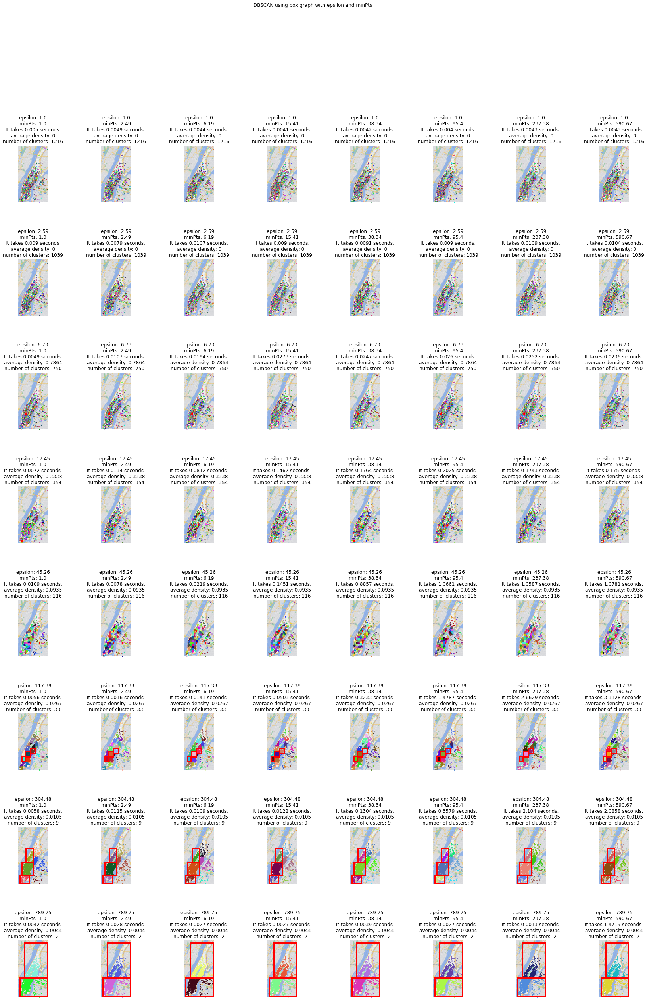

Time taken:      783.727s


In [ ]:
#@title
def taxi_set(epsilon, min_pts=100):
    data=pd.read_csv("yellow_tripdata_2015-01.csv")
    data['tpep_pickup_datetime']=pd.to_datetime(data['tpep_pickup_datetime'])
    data['tpep_dropoff_datetime']=pd.to_datetime(data['tpep_dropoff_datetime'])
    
    del data['store_and_fwd_flag']
    del data['RateCodeID']
    del data['payment_type']
    del data['fare_amount']
    del data['extra']
    del data['mta_tax']
    del data['tip_amount']
    del data['tolls_amount']
    del data['improvement_surcharge']
    del data['total_amount']
    
    data['tpep_pickup_datetime']=pd.to_datetime(data['tpep_pickup_datetime'])
    data['tpep_dropoff_datetime']=pd.to_datetime(data['tpep_dropoff_datetime'])
    s_date = dt.date(2015,1,10)
    s_time = dt.time(7,0,0)
    s_datetime = dt.datetime.combine(s_date,s_time)
    data_oneday = select_day(s_datetime, 0.25, data, 'tpep_pickup_datetime')

    data_oneday['pickup_coords']=data_oneday.apply(lambda x: latlngToScreenXY(x['pickup_latitude'], x['pickup_longitude']), axis=1)
    data_oneday['dropoff_coords']=data_oneday.apply(lambda x: latlngToScreenXY(x['dropoff_latitude'], x['dropoff_longitude']), axis=1)

    data_oneday['pickup_x'] = data_oneday['pickup_coords'].apply(lambda x: x['x'])
    data_oneday['pickup_y'] = data_oneday['pickup_coords'].apply(lambda x: x['y'])
    data_oneday['dropoff_x'] = data_oneday['dropoff_coords'].apply(lambda x: x['x'])
    data_oneday['dropoff_y'] = data_oneday['dropoff_coords'].apply(lambda x: x['y'])

    # data that fit in the image
    data_oneday = data_oneday[(data_oneday['pickup_x'] >= 0) & (data_oneday['pickup_x'] <= 471) & (data_oneday['pickup_y'] <= 907) & (data_oneday['pickup_y'] >= 0)]

    n, d = len(data_oneday), 2
    list_points = []
    for j in range(n):
        x, y = data_oneday.iloc[j,-4], data_oneday.iloc[j,-3]
        datetime_generated = data_oneday.iloc[j,1]
        list_points.append(ClusterPoint(d, [x,y],ID=j,datetime=datetime_generated,type_point='taxi'))
    min_pts = math.inf
    return BoxGraph(n, d, epsilon, min_pts, list_points)

def plot_clusters_taxi_many(epsilon_list, gamma_mpt):
    # Plot init seeds along side sample data=
    # color ="%06x" % random.randint(0, 0xFFFFFF)
    # color = '#'+color.upper()
    
    fig = plt.figure(figsize=(30, 50))
    fig.tight_layout()
    plt.subplots_adjust(wspace=0,hspace=1)
    fig.suptitle('DBSCAN using box graph with epsilon and minPts')

    #  plot Numerical Data
    row = 10  # number of rows
    column = len(epsilon_list)  # number of columns
    order = 1  # initialize plot counter
    cnt = 0

    im = plt.imread('manhattan.png')
    dpi = 80
    height, width, depth = im.shape
    figsize = width / float(dpi), height / float(dpi)
    # ax = fig.add_axes([0, 0, 1, 1])

    for eps in epsilon_list:
        bg = taxi_set(eps)
        number_of_points = len(bg.points)
        max_pow_mpt = math.log(number_of_points, 1+gamma_mpt)
        min_pts_pow_list = np.array(range(0,int(max_pow_mpt)+1,5))
        min_pts_list = (1+gamma_mpt)**min_pts_pow_list
        for mpt in min_pts_list:
            start = time.time()
            bg.min_pts = mpt
            find_core_points(bg)
            nr_clusters = compute_cluster_cores(bg)
            assign_border_points(bg)
            end = time.time()
            cost_time = end - start
            points = bg.points

            label = [points[i].cluster_label for i in range(len(points))]
            label = np.array(label)

            colors = ['#'+("%06x" % random.randint(0, 0xFFFFFF)).upper() for _ in range(len(np.unique(label)))]
            
            # print('labels:', np.unique(label))
            # print('the first 5 labels:', label[:5])
            X = [np.array(points[i].coords) for i in range(len(points))]
            X = np.array(X)
            # print('number of coords:', len(X))
            # print('the first 5 coords:', X[:5])

            ax_im = fig.add_subplot(row, column, order+cnt)
            # temp_row, temp_col = (order+cnt)//column, (order+cnt)%column
            # pix_row = 907//row
            # pix_col = 471//column
            # ax = fig.add_axes([temp_row*pix_row, temp_col*pix_col, 0.1, 0.1])
            cnt += 1
            # ax_im = fig.add_axes([0, 0, 1, 1])
            # Hide spines, ticks, etc.
            ax_im.axis('off')
            ax_im.imshow(im, cmap='gray')
            implot = plt.imshow(im)

            for idx, col in enumerate(colors,1):
                # print(idx, col)
                cluster_data = label == idx
                ax_im.scatter(X[cluster_data, 0], X[cluster_data, 1],
                            c=col, marker='.', s=10)
            
            currentAxis = plt.gca()
            # big_rect = rctgs[-1]
            cluster_rect = []
            unique_label = np.unique(label)
            # unique_label = unique_label[unique_label != -1]
            # for idx, lbl in enumerate(np.unique(label),1):
            for idx in range(1,len(unique_label)+1):
                cluster_data = label == idx
                if np.any(cluster_data):
                    left, right = np.min(X[cluster_data,0]), np.max(X[cluster_data,0])
                    bottom, top = np.min(X[cluster_data,1]), np.max(X[cluster_data,1])
                    width, height = abs(right-left), abs(top-bottom)
                    # currentAxis.add_patch(patches.Rectangle((left, bottom), width, height, linewidth=1, edgecolor='b', fill=None))
                    temp_rect = Rectangle(0.5*(left+right), 0.5*(top+bottom), width, height)
                    # print(left, right, top,bottom)
                    # print('x:',temp_rect.x,'y:',temp_rect.y, temp_rect.x_min )
                    cluster_rect.append(temp_rect)
            
            # print('number of clusters:', len(cluster_rect))
            max_avg_dens = 0
            if len(cluster_rect)>0:
                print(len(cluster_rect))
                k_rects, k_density = dense_rectangle(points, cluster_rect)
                if len(k_density)>0: average_density = sum(k_density) / len(k_density)
                else: average_density = 0
                if average_density > max_avg_dens: max_avg_dens = average_density
                for r in k_rects:
                    currentAxis.add_patch(patches.Rectangle((r.x-r.width/2, r.y-r.height/2), r.width, r.height, linewidth=3, edgecolor='r', fill=None))

            print(max_avg_dens)
            titile_1 = 'epsilon: ' + str(round(eps,2)) + '\n' + 'minPts: ' + str(round(mpt,2)) + '\n'
            titile_2 = 'It takes ' + str(round(cost_time, 4)) + ' seconds.' + '\n'
            # titile_3 = 'average density: ' + str(round(average_density, 4))+'\n'
            title_3 = 'f_score: ' + str(f_score) + '\n'
            title_4 = 'number of clusters: '+str(len(cluster_rect)) + '\n'
            title_5 = 'number of original taxi data points: ' + str(n_taxi_points) + '\n'
            title_6 = 'number of generated rect data points: ' + str(n_rect_points)
            title = title_1 + title_2 + title_3 + title_4 + title_5 + title_6
            ax_im.set_title(title)           
            # ax_im.set_xlabel(xlabel)
            ax_im.set_xticks([])
            ax_im.set_yticks([])

    plt.show()

if __name__ == "__main__":

    # epsilon_list = np.array(list(range(1,470,100)))
    # power = np.array(list(range(int(math.log2(1_000))+1)))
    # min_pts_list = 2**power
    # epsilon_list, min_pts_list = [10, 50, 100], [16, 64, 218]
    
    min_area = 4
    lambda_eps, gamma_mpt = 0.1, 0.2
    min_area_r = math.sqrt(min_area/math.pi) 
    min_pow_eps = lambda_eps * math.log(min_area_r,1+lambda_eps)     # math.log(x, base)

    w_image, h_image = 471, 907
    z = max(w_image, h_image)
    max_pow_eps = math.log(z, 1+lambda_eps)
    pow_eps = np.array(range(int(min_pow_eps), int(max_pow_eps)+1, 10))
    # epsilons = list(range(int((1+lambda_eps)**min_pow_eps), int((1+lambda_eps)**max_pow_eps)+1))
    epsilon_list = (1+lambda_eps)**pow_eps

    import time 
    start = time.time()
    plot_clusters_taxi_many(epsilon_list, gamma_mpt)
    end = time.time()
    print("Time taken:      {:.3f}s".format(end - start), file=sys.stderr)

In [ ]:
def rectangle_set_list(n_samples, a, rctgs, datetime, interval):
    '''
        n_samples: int, number of points
        a: int list, the probability to be in the smaller rectangles
        rctgs: list of rectangles of class Rectangle, the first one is the biggest one
        datetime: datetime, 'yyyy-mm-dd hh:mm:ss'
        interval: int, the lasting time (e.g. 12 hours) from the starting time (i.e. date)
    '''
    list_points = []
    d = 2

    # insert 0 at the beginning and 1 at the end
    a = [0] + a
    for i in range(1, len(a)):
        a[i] = a[i-1] + a[i]

    for j in range(n_samples):
        b = np.random.uniform(0,1)        # Generate a random float from 0 to 1
        for i in range(len(a)-1):
            if a[i] < b <= a[i+1]:
                tmp_rctg = rctgs[i]
                x = np.random.uniform(low=tmp_rctg.x_min, high=tmp_rctg.x_min+tmp_rctg.width)
                y = np.random.uniform(low=tmp_rctg.y_min, high=tmp_rctg.y_min+tmp_rctg.height)
                hour_low = datetime.hour
                hour = np.random.randint(low=hour_low, high=hour_low+interval)
                year, month, day = datetime.year, datetime.month, datetime.day
                minute = np.random.randint(low=0, high=59)
                second = np.random.randint(low=0, high=59)
                day_month = day_of_month(year, month)
                if hour >= 24:
                    hour = hour % 24
                    if day<day_month:
                        day = day + 1
                    else:
                        day = (day + 1) % day_month
                # date_str = str(year)+'-'+str(month).zfill(2)+'-'+str(day).zfill(2)+' '+str(hour).zfill(2)+':'+str(minute).zfill(2)+':'+str(second).zfill(2)
                date_generated = dt.date(year, month, day)
                time_generated = dt.time(hour, minute, second)
                datetime_generated = dt.datetime.combine(date_generated, time_generated)
                list_points.append(ClusterPoint(d, [x,y],ID=j,datetime=datetime_generated,type_point='Rect'))
                break
    return list_points

def n_type_of_points_in_rectangle(rects, points, type_req):
    '''
        p: one point of format (diemension, coords, cluster_label)
        q: one point of format (diemension, coords, cluster_label)
        points: list of points of format (diemension, coords, cluster_label)
    '''
    cnt = 0
    for i in range(len(points)):
        x,y = points[i].coords
        for r in rects:
            xl = r.x_min
            xr = r.x_max
            yl = r.y_min
            yr = r.y_max
            if xl <= x <= xr and yl <= y <= yr and points[i].type_point==type_req:
                cnt += 1
                break
    return cnt


def generate_bg_list(df):
    n, d = len(df.index), 2
    list_points = []
    for j in range(n):
        x, y = df.iloc[j,-4], df.iloc[j,-3]
        datetime_generated = df.iloc[j,1]
        list_points.append(ClusterPoint(d, [x,y], ID=j, datetime=datetime_generated,type_point='taxi'))
    return list_points


def plot_clusters_taxi_many(data_oneday, epsilon_list, gamma_mpt):
    # Plot init seeds along side sample data=
    # color ="%06x" % random.randint(0, 0xFFFFFF)
    # color = '#'+color.upper()
    
    fig = plt.figure(figsize=(30, 50))
    fig.tight_layout()
    plt.subplots_adjust(wspace=0,hspace=1)
    fig.suptitle('DBSCAN using box graph with epsilon and minPts')

    #  plot Numerical Data
    row = 10  # number of rows
    column = len(epsilon_list)  # number of columns
    order = 1  # initialize plot counter
    cnt = 0

    im = plt.imread('manhattan.png')
    dpi = 80
    height, width, depth = im.shape
    figsize = width / float(dpi), height / float(dpi)
    # ax = fig.add_axes([0, 0, 1, 1])

    n_samples = 500
    a = [0.5, 0.5]
    
    rect_1 = Rectangle(130, 600, 30, 30)
    rect_2 = Rectangle(250, 550, 40, 40)
    rctgs = [rect_1, rect_2]

    date = dt.date(2015,3,15)
    time = dt.time(7,0,0)
    datetime = dt.datetime.combine(date,time)

    interval = 5

    rect_set_list = rectangle_set_list(3000, [0.5,0.5], rctgs, datetime, interval)

    for eps in epsilon_list:
        # bg = taxi_set_and_random_rectangle(n_samples, a, rctgs, datetime, interval, eps)
        points = generate_bg_list(data_oneday) + rect_set_list
        n_points = len(points)
        max_pow_mpt = math.log(n_points, 1+gamma_mpt)
        min_pts_pow_list = np.array(range(0,int(max_pow_mpt)+1,5))
        min_pts_list = (1+gamma_mpt)**min_pts_pow_list
        for mpt in min_pts_list:      
            import time as tm
            start = tm.time()
            bg = BoxGraph(n_points, 2, eps, mpt, points) 
            find_core_points(bg)
            nr_clusters = compute_cluster_cores(bg)
            assign_border_points(bg)
            end = tm.time()
            cost_time = end - start
            points = bg.points

            label = [points[i].cluster_label for i in range(len(points))]
            label = np.array(label)

            colors = ['#'+("%06x" % random.randint(0, 0xFFFFFF)).upper() for _ in range(len(np.unique(label)))]
            
            # print('labels:', np.unique(label))
            # print('the first 5 labels:', label[:5])
            X = [np.array(points[i].coords) for i in range(len(points))]
            X = np.array(X)
            # print('number of coords:', len(X))
            # print('the first 5 coords:', X[:5])

            ax_im = fig.add_subplot(row, column, order+cnt)
            # temp_row, temp_col = (order+cnt)//column, (order+cnt)%column
            # pix_row = 907//row
            # pix_col = 471//column
            # ax = fig.add_axes([temp_row*pix_row, temp_col*pix_col, 0.1, 0.1])
            cnt += 1
            # ax_im = fig.add_axes([0, 0, 1, 1])
            # Hide spines, ticks, etc.
            ax_im.axis('off')
            ax_im.imshow(im, cmap='gray')
            implot = plt.imshow(im)

            for idx, col in enumerate(colors,1):
                # print(idx, col)
                cluster_data = label == idx
                ax_im.scatter(X[cluster_data, 0], X[cluster_data, 1],
                            c=col, marker='.', s=10)
            
            currentAxis = plt.gca()
            # big_rect = rctgs[-1]
            cluster_rect = []
            unique_label = np.unique(label)
            # unique_label = unique_label[unique_label != -1]
            # for idx, lbl in enumerate(np.unique(label),1):
            for idx in range(1,len(unique_label)+1):
                cluster_data = label == idx
                if np.any(cluster_data):
                    left, right = np.min(X[cluster_data,0]), np.max(X[cluster_data,0])
                    bottom, top = np.min(X[cluster_data,1]), np.max(X[cluster_data,1])
                    width, height = abs(right-left), abs(top-bottom)
                    # currentAxis.add_patch(patches.Rectangle((left, bottom), width, height, linewidth=1, edgecolor='b', fill=None))
                    temp_rect = Rectangle(0.5*(left+right), 0.5*(top+bottom), width, height)
                    # print(left, right, top,bottom)
                    # print('x:',temp_rect.x,'y:',temp_rect.y, temp_rect.x_min )
                    cluster_rect.append(temp_rect)
            
            # print('number of clusters:', len(cluster_rect))
            max_avg_dens = 0
            if len(cluster_rect)>0:
                print(len(cluster_rect))
                k_rects, k_density = dense_rectangle(points, cluster_rect)
                n_rect_points = n_type_of_points_in_rectangle(k_rects, points, 'Rect')
                n_taxi_points = n_type_of_points_in_rectangle(k_rects, points, 'taxi')
                f_score, _, _ = f_score_points_in_rect(rctgs, k_rects, points)
                f_socre = round(f_score, 4)
                if len(k_density)>0: average_density = sum(k_density) / len(k_density)
                else: average_density = 0
                if average_density > max_avg_dens: max_avg_dens = average_density
                for r in k_rects:
                    currentAxis.add_patch(patches.Rectangle((r.x-r.width/2, r.y-r.height/2), r.width, r.height, linewidth=3, edgecolor='r', fill=None))
            for r in rctgs:
                currentAxis.add_patch(patches.Rectangle((r.x-r.width/2, r.y-r.height/2), r.width, r.height, linewidth=1, edgecolor='b', fill=None))

            print(max_avg_dens)
            title_1 = 'epsilon: ' + str(round(eps,2)) + '\n' + 'minPts: ' + str(round(mpt,2)) + '\n'
            title_2 = 'It takes ' + str(round(cost_time, 4)) + ' seconds.' + '\n'
            # titile_3 = 'average density: ' + str(round(average_density, 4))+'\n'
            title_3 = 'f_score: ' + str(f_score) + '\n'
            title_4 = 'number of clusters: '+str(len(cluster_rect)) + '\n'
            title_5 = 'taxi data points: ' + str(n_taxi_points) + '\n'
            title_6 = 'generated rect points: ' + str(n_rect_points)
            title = title_1 + title_2 + title_3 + title_4 + title_5 + title_6
            ax_im.set_title(title)           
            # ax_im.set_xlabel(xlabel)
            ax_im.set_xticks([])
            ax_im.set_yticks([])

    plt.show()

if __name__ == "__main__":

    # epsilon_list = np.array(list(range(1,470,100)))
    # power = np.array(list(range(int(math.log2(1_000))+1)))
    # min_pts_list = 2**power
    # epsilon_list, min_pts_list = [10, 50, 100], [16, 64, 218]
    
    min_area = 4
    lambda_eps, gamma_mpt = 0.1, 0.2
    min_area_r = math.sqrt(min_area/math.pi) 
    min_pow_eps = lambda_eps * math.log(min_area_r,1+lambda_eps)     # math.log(x, base)

    w_image, h_image = 471, 907
    z = max(w_image, h_image)
    max_pow_eps = math.log(z, 1+lambda_eps)
    pow_eps = np.array(range(int(min_pow_eps), int(max_pow_eps)+1, 10))
    # epsilons = list(range(int((1+lambda_eps)**min_pow_eps), int((1+lambda_eps)**max_pow_eps)+1))
    epsilon_list = (1+lambda_eps)**pow_eps

    # data=pd.read_csv("yellow_tripdata_2015-01.csv")
    # data['tpep_pickup_datetime']=pd.to_datetime(data['tpep_pickup_datetime'])
    # data['tpep_dropoff_datetime']=pd.to_datetime(data['tpep_dropoff_datetime'])

    # del data['store_and_fwd_flag']
    # del data['RateCodeID']
    # del data['payment_type']
    # del data['fare_amount'] 
    # del data['extra']
    # del data['mta_tax']
    # del data['tip_amount']
    # del data['tolls_amount']
    # del data['improvement_surcharge']
    # del data['total_amount']

    # data['tpep_pickup_datetime']=pd.to_datetime(data['tpep_pickup_datetime'])
    # data['tpep_dropoff_datetime']=pd.to_datetime(data['tpep_dropoff_datetime'])

    s_date = dt.date(2015,1,10)
    s_time = dt.time(7,0,0)
    s_datetime = dt.datetime.combine(s_date,s_time)
    data_onehour = select_day(s_datetime, 1, data, 'tpep_pickup_datetime')

    data_onehour['pickup_coords']=data_onehour.apply(lambda x: latlngToScreenXY(x['pickup_latitude'], x['pickup_longitude']), axis=1)
    data_onehour['dropoff_coords']=data_onehour.apply(lambda x: latlngToScreenXY(x['dropoff_latitude'], x['dropoff_longitude']), axis=1)

    data_onehour['pickup_x'] = data_onehour['pickup_coords'].apply(lambda x: x['x'])
    data_onehour['pickup_y'] = data_onehour['pickup_coords'].apply(lambda x: x['y'])
    data_onehour['dropoff_x'] = data_onehour['dropoff_coords'].apply(lambda x: x['x'])
    data_onehour['dropoff_y'] = data_onehour['dropoff_coords'].apply(lambda x: x['y'])

    # data that fit in the image
    data_onehour = data_onehour[(data_oneday['pickup_x'] >= 0) &
                                (data_onehour['pickup_x'] <= 471) &
                                (data_onehour['pickup_y'] <= 907) & 
                                (data_onehour['pickup_y'] >= 0)]

    # data_oneday.head()

    import time 
    start = time.time()
    plot_clusters_taxi_many(data_onehour, epsilon_list, gamma_mpt)
    end = time.time()
    print("Time taken:      {:.3f}s".format(end - start), file=sys.stderr)

NameError: ignored

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:312: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:313: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:315: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/s

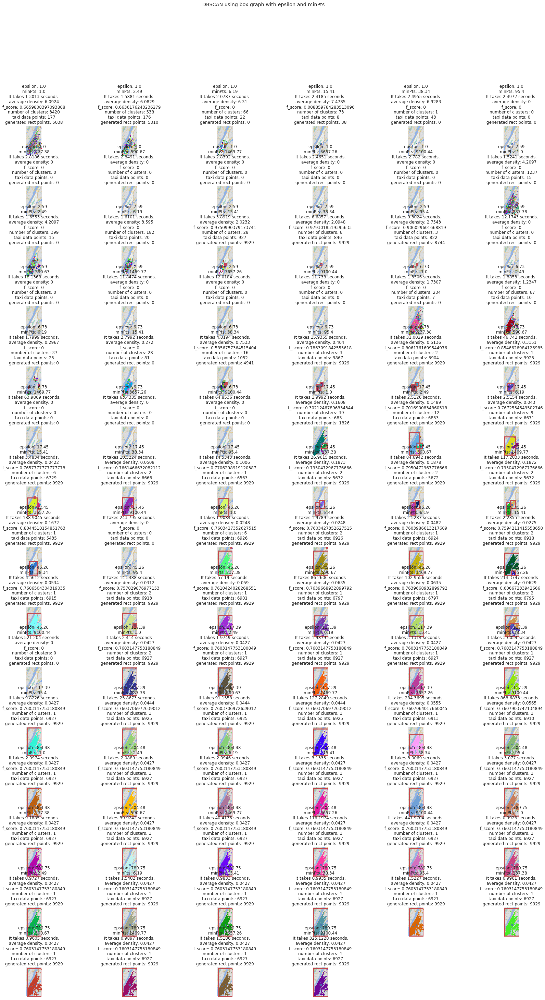

maximum average density: 7.478495879414599 , eps: 1.0 , mpt: 15.40702157458636
maximum fscore: 0.9793018519395633 , eps: 2.5937424601000023 , mpt: 38.33759992447472


Time taken:      4623.703s


In [ ]:
def rectangle_set_list(n_samples, a, rctgs, datetime, interval):
    '''
        n_samples: int, number of points
        a: int list, the probability to be in the smaller rectangles
        rctgs: list of rectangles of class Rectangle, the first one is the biggest one
        datetime: datetime, 'yyyy-mm-dd hh:mm:ss'
        interval: int, the lasting time (e.g. 12 hours) from the starting time (i.e. date)
    '''
    list_points = []
    d = 2

    # insert 0 at the beginning and 1 at the end
    a = [0] + a
    for i in range(1, len(a)):
        a[i] = a[i-1] + a[i]

    for j in range(n_samples):
        b = np.random.uniform(0,1)        # Generate a random float from 0 to 1
        for i in range(len(a)-1):
            if a[i] < b <= a[i+1]:
                tmp_rctg = rctgs[i]
                x = np.random.uniform(low=tmp_rctg.x_min, high=tmp_rctg.x_min+tmp_rctg.width)
                y = np.random.uniform(low=tmp_rctg.y_min, high=tmp_rctg.y_min+tmp_rctg.height)
                hour_low = datetime.hour
                hour = np.random.randint(low=hour_low, high=hour_low+interval)
                year, month, day = datetime.year, datetime.month, datetime.day
                minute = np.random.randint(low=0, high=59)
                second = np.random.randint(low=0, high=59)
                day_month = day_of_month(year, month)
                if hour >= 24:
                    hour = hour % 24
                    if day<day_month:
                        day = day + 1
                    else:
                        day = (day + 1) % day_month
                # date_str = str(year)+'-'+str(month).zfill(2)+'-'+str(day).zfill(2)+' '+str(hour).zfill(2)+':'+str(minute).zfill(2)+':'+str(second).zfill(2)
                date_generated = dt.date(year, month, day)
                time_generated = dt.time(hour, minute, second)
                datetime_generated = dt.datetime.combine(date_generated, time_generated)
                list_points.append(ClusterPoint(d, [x,y],ID=j,datetime=datetime_generated,type_point='Rect'))
                break
    return list_points

def n_type_of_points_in_rectangle(rects, points, type_req):
    '''
        p: one point of format (diemension, coords, cluster_label)
        q: one point of format (diemension, coords, cluster_label)
        points: list of points of format (diemension, coords, cluster_label)
    '''
    cnt = 0
    for i in range(len(points)):
        x,y = points[i].coords
        for r in rects:
            xl = r.x_min
            xr = r.x_max
            yl = r.y_min
            yr = r.y_max
            if xl <= x <= xr and yl <= y <= yr and points[i].type_point==type_req:
                cnt += 1
                break
    return cnt

# def generate_rectangle_set(n_points, d, eps, mpt, data_list):
#     """
#     Reads the input set, clusters the points and writes to output

#     :param path_in:     location of the input set
#     :param path_out:    location to print the output
#     """
#     # Step 1: read file and create box graph
#     bg = BoxGraph(n_points, d, eps, mpt, data_list)
    
#     # Step 2: Compute the core points
#     find_core_points(bg)

#     # Step 3: cluster the core points
#     nr_clusters = compute_cluster_cores(bg)

#     # Step 4: assign border points to clusters
#     assign_border_points(bg)

#     return bg

def generate_rectangle_set(n_samples, a, rctgs, datetime, interval, d, eps, mpt, df):
    """
    Reads the input set, clusters the points and writes to output

    :param path_in:     location of the input set
    :param path_out:    location to print the output
    """
    # Step 1: read file and create box graph
    rects = rectangle_set_list(n_samples, a, rctgs, datetime, interval)
    taxis = generate_taxi(df)
    data_list = taxis + rects
    bg = BoxGraph(n_samples, d, eps, mpt, data_list)

    # Step 2: Compute the core points
    find_core_points(bg)

    # Step 3: cluster the core points
    nr_clusters = compute_cluster_cores(bg)

    # Step 4: assign border points to clusters
    assign_border_points(bg)

    return bg


def generate_taxi(df):
    n, d = len(df.index), 2
    points = []
    for j in range(n):
        x, y = df.iloc[j,-4], df.iloc[j,-3]
        datetime_generated = df.iloc[j,1]
        points.append(ClusterPoint(d, [x,y], ID=j, datetime=datetime_generated,type_point='taxi'))
    return points


def plot_clusters_taxi_many(data_oneday, epsilon_list, gamma_mpt):
    # Plot init seeds along side sample data=
    # color ="%06x" % random.randint(0, 0xFFFFFF)
    # color = '#'+color.upper()
    
    fig = plt.figure(figsize=(30, 50))
    fig.tight_layout()
    plt.subplots_adjust(wspace=0,hspace=1)
    fig.suptitle('DBSCAN using box graph with epsilon and minPts')

    #  plot Numerical Data
    row = len(epsilon_list) * 2  # number of rows
    column = 6  # number of columns
    order = 1  # initialize plot counter
    cnt = 0

    plt.rcParams["figure.figsize"] = [4.71, 9.07]
    plt.rcParams["figure.autolayout"] = True
    im = plt.imread('manhattan.png')
    dpi = 80
    height, width, depth = im.shape
    figsize = width / float(dpi), height / float(dpi)
    # ax = fig.add_axes([0, 0, 1, 1])

    n_samples = 500
    a = [0.5, 0.5]
    
    rect_1 = Rectangle(130, 600, 30, 30)
    rect_2 = Rectangle(250, 550, 40, 40)
    rctgs = [rect_1, rect_2]

    date = dt.date(2015,3,15)
    time = dt.time(7,0,0)
    datetime = dt.datetime.combine(date,time)

    interval = 5

    rect_set_list = rectangle_set_list(3000, [0.5,0.5], rctgs, datetime, interval)
    data_list = generate_taxi(data_onehour) + rect_set_list
    max_avg_dens = 0
    eps_max_dens, mpt_max_dens = 0,0
    max_fscore = 0
    eps_max_fscore, mpt_max_fscore = 0,0

    for eps in epsilon_list:
        # bg = taxi_set_and_random_rectangle(n_samples, a, rctgs, datetime, interval, eps)
        # points = generate_bg_list(data_oneday) + rect_set_list
        n_points = len(data_list)
        max_pow_mpt = math.log(n_points, 1+gamma_mpt)
        min_pts_pow_list = np.array(range(0,int(max_pow_mpt)+1,5))
        min_pts_list = (1+gamma_mpt)**min_pts_pow_list
        for mpt in min_pts_list:      
            import time as tm
            start = tm.time()
            # bg = BoxGraph(n_points, 2, eps, mpt, points) 
            bg = generate_rectangle_set(n_points, a, rctgs, datetime, interval, 2, eps, mpt, data_oneday)
            end = tm.time()
            cost_time = end - start
            points = bg.points

            label = [p.cluster_label for p in points]
            label = np.array(label)

            colors = ['#'+("%06x" % random.randint(0, 0xFFFFFF)).upper() for _ in range(len(np.unique(label)))]
            
            # print(len(np.unique(label)), 'labels:', np.unique(label))
            # print('the first 5 labels:', np.unique(label))
            X = [np.array(points[i].coords) for i in range(len(points))]
            X = np.array(X)
            # print('number of coords:', len(X))
            # print('the first 5 coords:', X[:5])

            ax_im = fig.add_subplot(row, column, order+cnt)
            # temp_row, temp_col = (order+cnt)//column, (order+cnt)%column
            # pix_row = 907//row
            # pix_col = 471//column
            # ax = fig.add_axes([temp_row*pix_row, temp_col*pix_col, 0.1, 0.1])
            cnt += 1
            # ax_im = fig.add_axes([0, 0, 1, 1])
            # Hide spines, ticks, etc.
            ax_im.axis('off')
            ax_im.imshow(im, cmap='gray')
            implot = plt.imshow(im)

            for idx, col in enumerate(colors,1):
                # print(idx, col)
                cluster_data = label == idx
                ax_im.scatter(X[cluster_data, 0], X[cluster_data, 1],
                            c=col, marker='.', s=10)
            
            currentAxis = plt.gca()
            # big_rect = rctgs[-1]
            cluster_rect = []
            unique_label = np.unique(label)
            # unique_label = unique_label[unique_label != -1]
            # for idx, lbl in enumerate(np.unique(label),1):
            for idx in range(1,len(unique_label)+1):
                cluster_data = label == idx
                if np.any(cluster_data):
                    left, right = np.min(X[cluster_data,0]), np.max(X[cluster_data,0])
                    bottom, top = np.min(X[cluster_data,1]), np.max(X[cluster_data,1])
                    width, height = abs(right-left), abs(top-bottom)
                    # currentAxis.add_patch(patches.Rectangle((left, bottom), width, height, linewidth=1, edgecolor='b', fill=None))
                    temp_rect = Rectangle(0.5*(left+right), 0.5*(top+bottom), width, height)
                    # print(left, right, top,bottom)
                    # print('x:',temp_rect.x,'y:',temp_rect.y, temp_rect.x_min )
                    cluster_rect.append(temp_rect)
            
            print('number of clusters:', len(cluster_rect))
            average_density = 0
            f_score = 0
            n_taxi_points = n_rect_points = 0
            if len(cluster_rect)>0:
                # print('number of clusters:',len(cluster_rect))
                k_rects, k_density = dense_rectangle(points, cluster_rect, 3, 1)
                n_rect_points = n_type_of_points_in_rectangle(k_rects, points, 'Rect')
                n_taxi_points = n_type_of_points_in_rectangle(k_rects, points, 'taxi')
                f_score, _, _ = f_score_points_in_rect_duplicate(rctgs, k_rects, points)
                f_socre = round(f_score, 4)
                if len(k_density)>0: average_density = np.mean(k_density)
                else: average_density = 0
                if average_density > max_avg_dens: 
                    max_avg_dens = average_density
                    eps_max_dens, mpt_max_dens = eps, mpt
                if f_score > max_fscore: 
                    max_fscore = f_score
                    eps_max_fscore, mpt_max_fscore = eps, mpt
                for r in k_rects:
                    currentAxis.add_patch(patches.Rectangle((r.x-r.width/2, r.y-r.height/2), r.width, r.height, linewidth=3, edgecolor='r', fill=None))
            for r in rctgs:
                currentAxis.add_patch(patches.Rectangle((r.x-r.width/2, r.y-r.height/2), r.width, r.height, linewidth=1, edgecolor='b', fill=None))

            # print('the maximum average density:',max_avg_dens)
            title_1 = 'epsilon: ' + str(round(eps,2)) + '\n' + 'minPts: ' + str(round(mpt,2)) + '\n'
            title_2 = 'It takes ' + str(round(cost_time, 4)) + ' seconds.' + '\n'
            title_3_1 = 'average density: ' + str(round(average_density, 4))+'\n'
            title_3 = 'f_score: ' + str(f_score) + '\n'
            title_4 = 'number of clusters: '+str(len(cluster_rect)) + '\n'
            title_5 = 'taxi data points: ' + str(n_taxi_points) + '\n'
            title_6 = 'generated rect points: ' + str(n_rect_points)
            title = title_1 + title_2 + title_3_1 + title_3 + title_4 + title_5 + title_6
            ax_im.set_title(title)           
            # ax_im.set_xlabel(xlabel)
            ax_im.set_xticks([])
            ax_im.set_yticks([])
            bg = None

    plt.show()
    print('maximum average density:', max_avg_dens, ', eps:', eps_max_dens, ', mpt:', mpt_max_dens)
    print('maximum fscore:', max_fscore, ', eps:', eps_max_fscore, ', mpt:', mpt_max_fscore)
    
if __name__ == "__main__":

    # epsilon_list = np.array(list(range(1,470,100)))
    # power = np.array(list(range(int(math.log2(1_000))+1)))
    # min_pts_list = 2**power
    # epsilon_list, min_pts_list = [10, 50, 100], [16, 64, 218]
    
    min_area = 4
    lambda_eps, gamma_mpt = 0.1, 0.2
    min_area_r = math.sqrt(min_area/math.pi) 
    min_pow_eps = lambda_eps * math.log(min_area_r,1+lambda_eps)     # math.log(x, base)

    w_image, h_image = 471, 907
    z = max(w_image, h_image)
    max_pow_eps = math.log(z, 1+lambda_eps)
    pow_eps = np.array(range(int(min_pow_eps), int(max_pow_eps)+1, 10))
    # epsilons = list(range(int((1+lambda_eps)**min_pow_eps), int((1+lambda_eps)**max_pow_eps)+1))
    epsilon_list = (1+lambda_eps)**pow_eps

    # data=pd.read_csv("yellow_tripdata_2015-01.csv")
    # data['tpep_pickup_datetime']=pd.to_datetime(data['tpep_pickup_datetime'])
    # data['tpep_dropoff_datetime']=pd.to_datetime(data['tpep_dropoff_datetime'])

    # del data['store_and_fwd_flag']
    # del data['RateCodeID']
    # del data['payment_type']
    # del data['fare_amount'] 
    # del data['extra']
    # del data['mta_tax']
    # del data['tip_amount']
    # del data['tolls_amount']
    # del data['improvement_surcharge']
    # del data['total_amount']

    # data['tpep_pickup_datetime']=pd.to_datetime(data['tpep_pickup_datetime'])
    # data['tpep_dropoff_datetime']=pd.to_datetime(data['tpep_dropoff_datetime'])

    s_date = dt.date(2015,1,10)
    s_time = dt.time(7,0,0)
    s_datetime = dt.datetime.combine(s_date,s_time)
    data_onehour = select_day(s_datetime, 1, data, 'tpep_pickup_datetime')

    data_onehour['pickup_coords']=data_onehour.apply(lambda x: latlngToScreenXY(x['pickup_latitude'], x['pickup_longitude']), axis=1)
    data_onehour['dropoff_coords']=data_onehour.apply(lambda x: latlngToScreenXY(x['dropoff_latitude'], x['dropoff_longitude']), axis=1)

    data_onehour['pickup_x'] = data_onehour['pickup_coords'].apply(lambda x: x['x'])
    data_onehour['pickup_y'] = data_onehour['pickup_coords'].apply(lambda x: x['y'])
    data_onehour['dropoff_x'] = data_onehour['dropoff_coords'].apply(lambda x: x['x'])
    data_onehour['dropoff_y'] = data_onehour['dropoff_coords'].apply(lambda x: x['y'])

    # data that fit in the image
    data_onehour = data_onehour[(data_onehour['pickup_x'] >= 0) &
                                (data_onehour['pickup_x'] <= 471) &
                                (data_onehour['pickup_y'] <= 907) & 
                                (data_onehour['pickup_y'] >= 0)]

    # data_oneday.head()

    import time 
    start = time.time()
    plot_clusters_taxi_many(data_onehour, epsilon_list, gamma_mpt)
    end = time.time()
    print("Time taken:      {:.3f}s".format(end - start), file=sys.stderr)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:44: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stab

41
[0.14322724746048923, 0.13358826470854085, 0.06277943829950917]
[(249.52096045888283, 542.5007411779981), (114.51987328621453, 595.3988873390499), (114.15221226592777, 667.1761523144901)]
0.6447602131438721 363 200
0.7642105263157895 363 112


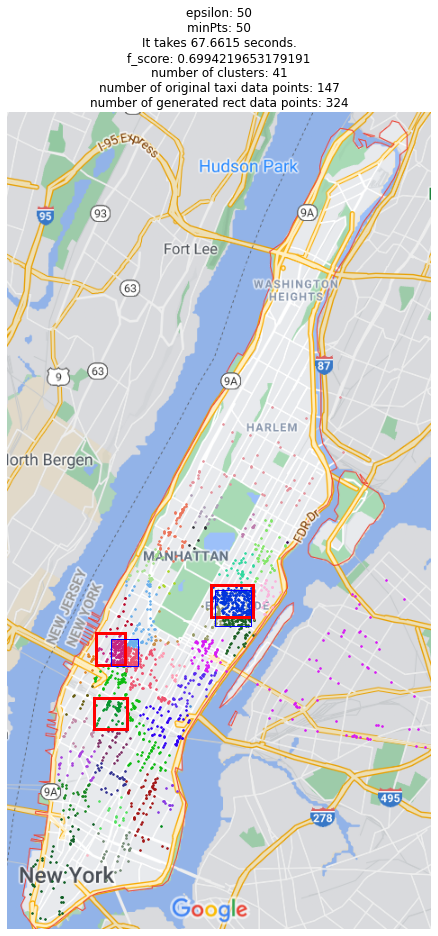

Time taken:      68.303s


In [ ]:

def n_type_of_points_in_rectangle(rects, points, type_req):
    '''
        p: one point of format (diemension, coords, cluster_label)
        q: one point of format (diemension, coords, cluster_label)
        points: list of points of format (diemension, coords, cluster_label)
    '''
    cnt = 0
    for i in range(len(points)):
        x,y = points[i].coords
        for r in rects:
            xl = r.x_min
            xr = r.x_max
            yl = r.y_min
            yr = r.y_max
            if xl <= x <= xr and yl <= y <= yr and points[i].type_point==type_req:
                cnt += 1
                break
    return cnt

def taxi_set_and_random_rectangle(n_samples, a, rctgs, datetime, interval, epsilon, min_pts=None):
    data=pd.read_csv("yellow_tripdata_2015-01.csv")
    data['tpep_pickup_datetime']=pd.to_datetime(data['tpep_pickup_datetime'])
    data['tpep_dropoff_datetime']=pd.to_datetime(data['tpep_dropoff_datetime'])
    
    del data['store_and_fwd_flag']
    del data['RateCodeID']
    del data['payment_type']
    del data['fare_amount']
    del data['extra']
    del data['mta_tax']
    del data['tip_amount']
    del data['tolls_amount']
    del data['improvement_surcharge']
    del data['total_amount']
    
    data['tpep_pickup_datetime']=pd.to_datetime(data['tpep_pickup_datetime'])
    data['tpep_dropoff_datetime']=pd.to_datetime(data['tpep_dropoff_datetime'])
    s_date = dt.date(2015,1,10)
    s_time = dt.time(7,0,0)
    s_datetime = dt.datetime.combine(s_date,s_time)
    data_oneday = select_day(s_datetime, 0.25, data, 'tpep_pickup_datetime')

    data_oneday['pickup_coords']=data_oneday.apply(lambda x: latlngToScreenXY(x['pickup_latitude'], x['pickup_longitude']), axis=1)
    data_oneday['dropoff_coords']=data_oneday.apply(lambda x: latlngToScreenXY(x['dropoff_latitude'], x['dropoff_longitude']), axis=1)

    data_oneday['pickup_x'] = data_oneday['pickup_coords'].apply(lambda x: x['x'])
    data_oneday['pickup_y'] = data_oneday['pickup_coords'].apply(lambda x: x['y'])
    data_oneday['dropoff_x'] = data_oneday['dropoff_coords'].apply(lambda x: x['x'])
    data_oneday['dropoff_y'] = data_oneday['dropoff_coords'].apply(lambda x: x['y'])

    # data that fit in the image
    data_oneday = data_oneday[(data_oneday['pickup_x'] >= 0) & (data_oneday['pickup_x'] <= 471) & (data_oneday['pickup_y'] <= 907) & (data_oneday['pickup_y'] >= 0)]

    n, d = len(data_oneday), 2
    list_points = []
    for j in range(n):
        x, y = data_oneday.iloc[j,-4], data_oneday.iloc[j,-3]
        datetime_generated = data_oneday.iloc[j,1]
        list_points.append(ClusterPoint(d, [x,y],ID=j,datetime=datetime_generated,type_point='taxi'))
    if min_pts==None: min_pts = math.inf

    # insert 0 at the beginning and 1 at the end
    a = [0] + a
    for i in range(1, len(a)):
        a[i] = a[i-1] + a[i]

    for j in range(n_samples):
        b = np.random.uniform(0,1)        # Generate a random float from 0 to 1
        for i in range(len(a)-1):
            if a[i] < b <= a[i+1]:
                tmp_rctg = rctgs[i]
                x = np.random.uniform(low=tmp_rctg.x_min, high=tmp_rctg.x_min+tmp_rctg.width)
                y = np.random.uniform(low=tmp_rctg.y_min, high=tmp_rctg.y_min+tmp_rctg.height)
                hour_low = datetime.hour
                hour = np.random.randint(low=hour_low, high=hour_low+interval)
                year, month, day = datetime.year, datetime.month, datetime.day
                minute = np.random.randint(low=0, high=59)
                second = np.random.randint(low=0, high=59)
                day_month = day_of_month(year, month)
                if hour >= 24:
                    hour = hour % 24
                    if day<day_month:
                        day = day + 1
                    else:
                        day = (day + 1) % day_month
                # date_str = str(year)+'-'+str(month).zfill(2)+'-'+str(day).zfill(2)+' '+str(hour).zfill(2)+':'+str(minute).zfill(2)+':'+str(second).zfill(2)
                date_generated = dt.date(year, month, day)
                time_generated = dt.time(hour, minute, second)
                datetime_generated = dt.datetime.combine(date_generated, time_generated)
                list_points.append(ClusterPoint(d, [x,y],ID=j,datetime=datetime_generated,type_point='Rect'))
                break
    return BoxGraph(n, d, epsilon, min_pts, list_points)

def plot_clusters_taxi_and_rect(n_samples, a, rctgs, datetime, interval, epsilon, min_pts):
    
    # fig = plt.figure(1)

    im = plt.imread('manhattan.png')
    dpi = 80
    height, width, depth = im.shape
    figsize = width / float(dpi), height / float(dpi)
    fig = plt.figure(figsize=figsize)
    ax = fig.add_axes([0, 0, 1, 1])
    ax.imshow(im, cmap='gray')
    implot = plt.imshow(im)

    start = time.time()
    bg = taxi_set_and_random_rectangle(n_samples, a, rctgs, datetime, interval, epsilon, min_pts)
    find_core_points(bg)
    nr_clusters = compute_cluster_cores(bg)
    assign_border_points(bg)
    end = time.time()
    cost_time = end - start
    points = bg.points

    label = [points[i].cluster_label for i in range(len(points))]
    label = np.array(label)

    colors = ['#'+("%06x" % random.randint(0, 0xFFFFFF)).upper() for _ in range(len(np.unique(label)))]
    
    # print('labels:', np.unique(label))
    # print('the first 5 labels:', label[:5])
    X = [np.array(points[i].coords) for i in range(len(points))]
    X = np.array(X)
    # print('number of coords:', len(X))
    # print('the first 5 coords:', X[:5])

    # Hide spines, ticks, etc.
    ax.axis('off')

    for idx, col in enumerate(colors,1):
        cluster_data = label == idx
        ax.scatter(X[cluster_data, 0], X[cluster_data, 1],
                    c=col, marker='.', s=10)
    
    currentAxis = plt.gca()
    cluster_rect = []
    unique_label = np.unique(label)
    # unique_label = unique_label[unique_label != -1]
    # for idx, lbl in enumerate(np.unique(label),1):
    for idx in range(1,len(unique_label)+1):
        cluster_data = label == idx
        if np.any(cluster_data):
            left, right = np.min(X[cluster_data,0]), np.max(X[cluster_data,0])
            bottom, top = np.min(X[cluster_data,1]), np.max(X[cluster_data,1])
            width, height = abs(right-left), abs(top-bottom)
            temp_rect = Rectangle(0.5*(left+right), 0.5*(top+bottom), width, height)
            cluster_rect.append(temp_rect)
    
    # print('number of clusters:', len(cluster_rect))
    # max_avg_dens = 0
    if len(cluster_rect)>0:
        print(len(cluster_rect))
        # k_rects, average_density = dense_rectangle(points, cluster_rect)
        k_rects, k_density = dense_rectangle(points, cluster_rect)
        print(k_density)
        lskdfj = [(r.x, r.y) for r in k_rects]
        print(lskdfj)
        n_rect_points = n_type_of_points_in_rectangle(k_rects, points, 'Rect')
        n_taxi_points = n_type_of_points_in_rectangle(k_rects, points, 'taxi')
        # if average_density > max_avg_dens: max_avg_dens = average_density
        for r in k_rects:
            currentAxis.add_patch(patches.Rectangle((r.x-r.width/2, r.y-r.height/2), r.width, r.height, linewidth=3, edgecolor='r', fill=None))
        f_score, _, _ = f_score_points_in_rect(rctgs, k_rects, points)
        f_socre = round(f_score, 4)

    for r in rctgs:
        currentAxis.add_patch(patches.Rectangle((r.x-r.width/2, r.y-r.height/2), r.width, r.height, linewidth=1, edgecolor='b', fill=None))

    title_1 = 'epsilon: ' + str(round(epsilon,2)) + '\n' + 'minPts: ' + str(round(min_pts,2)) + '\n'
    title_2 = 'It takes ' + str(round(cost_time, 4)) + ' seconds.' + '\n'
    # titile_3 = 'average density: ' + str(round(average_density, 4))+'\n'
    title_3 = 'f_score: ' + str(f_score) + '\n'
    title_4 = 'number of clusters: '+str(len(cluster_rect)) + '\n'
    title_5 = 'number of original taxi data points: ' + str(n_taxi_points) + '\n'
    title_6 = 'number of generated rect data points: ' + str(n_rect_points)
    title = title_1 + title_2 + title_3 + title_4 + title_5 + title_6
    ax.set_title(title)           
    # ax.set_xlabel(title)
    ax.set_xticks([])
    ax.set_yticks([])

    plt.show()

if __name__ == "__main__":

    n_samples = 500
    a = [0.5, 0.5]
    
    rect_1 = Rectangle(130, 600, 30, 30)
    rect_2 = Rectangle(250, 550, 40, 40)
    rctgs = [rect_1, rect_2]

    date = dt.date(2015,3,15)
    time = dt.time(7,0,0)
    datetime = dt.datetime.combine(date,time)

    interval = 5

    epsilon, min_pts = 50, 50

    import time 
    start = time.time()
    plot_clusters_taxi_and_rect(n_samples, a, rctgs, datetime, interval, epsilon, min_pts)
    end = time.time()
    print("Time taken:      {:.3f}s".format(end - start), file=sys.stderr)

26
26
149.23760655905895


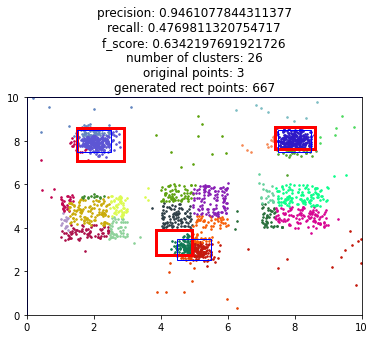

Cluster counter: 26


25
25
138.02328494784285


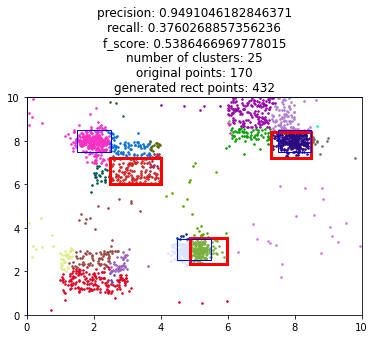

Cluster counter: 25


20
20
208.95124157228884


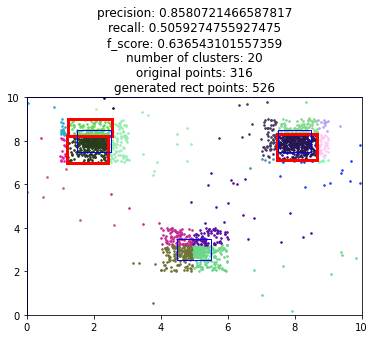

Cluster counter: 20


20
20
123.03004221763803


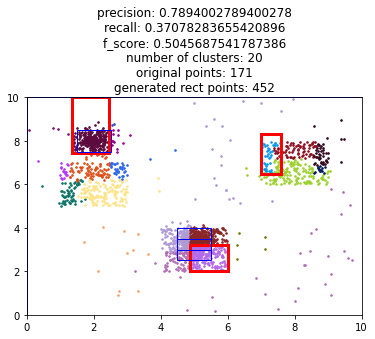

Cluster counter: 20
Time taken:      8.492s


In [ ]:
def n_type_of_points_in_rectangle(rects, points, type_req):
    '''
        p: one point of format (diemension, coords, cluster_label)
        q: one point of format (diemension, coords, cluster_label)
        points: list of points of format (diemension, coords, cluster_label)
    '''
    cnt = 0
    for i in range(len(points)):
        x,y = points[i].coords
        for r in rects:
            xl = r.x_min
            xr = r.x_max
            yl = r.y_min
            yr = r.y_max
            if xl <= x <= xr and yl <= y <= yr and points[i].type_point==type_req:
                cnt += 1
                break
    return cnt

def plot_clusters_two_rects(points, rctgs_origin, rctgs_extra):
    plt.figure(1)

    label = [points[i].cluster_label for i in range(len(points))]
    label = np.array(label)

    colors = ['#'+("%06x" % random.randint(0, 0xFFFFFF)).upper() for _ in range(len(np.unique(label)))]
    
    X = [np.array(points[i].coords) for i in range(len(points))]
    X = np.array(X)
    for idx, col in enumerate(colors, 1):
        cluster_data = label == idx
        # print('number of cluster points:',len(cluster_data[cluster_data==True]))
        plt.scatter(X[cluster_data, 0], X[cluster_data, 1],
                    c=col, marker='.', s=10)

    currentAxis = plt.gca()
    big_rect = rctgs_origin[-1]
    cluster_rect = []
    unique_label = np.unique(label)
    for idx in range(1,len(unique_label)+1):
        cluster_data = label == idx
        if np.any(cluster_data):
            left, right = np.min(X[cluster_data,0]), np.max(X[cluster_data,0])
            bottom, top = np.min(X[cluster_data,1]), np.max(X[cluster_data,1])
            width, height = abs(right-left), abs(top-bottom)
            temp_rect = Rectangle(0.5*(left+right), 0.5*(top+bottom), width, height)
            cluster_rect.append(temp_rect)

    max_avg_dens = 0
    if len(cluster_rect)>0:
        print(len(cluster_rect))
        k_rects, k_density = dense_rectangle(points, cluster_rect, k=3, min_area=1)
        n_rect_points = n_type_of_points_in_rectangle(k_rects, points, 'Rect')
        n_extra_points = n_type_of_points_in_rectangle(k_rects, points, 'extra')
        f_score, psc, rcl = f_score_points_in_rect(rctgs_extra, k_rects, points)
        f_socre = round(f_score, 4)
        if len(k_density)>0: average_density = sum(k_density) / len(k_density)
        else: average_density = 0
        if average_density > max_avg_dens: max_avg_dens = average_density
        for r in k_rects:
            currentAxis.add_patch(patches.Rectangle((r.x-r.width/2, r.y-r.height/2), r.width, r.height, linewidth=3, edgecolor='r', fill=None))
    # for r in cluster_rect:
    #     currentAxis.add_patch(patches.Rectangle((r.x-r.width/2, r.y-r.height/2), r.width, r.height, linewidth=1, edgecolor='g', fill=None))
    for r in rctgs_extra:
        currentAxis.add_patch(patches.Rectangle((r.x-r.width/2, r.y-r.height/2), r.width, r.height, linewidth=1, edgecolor='b', fill=None))

    print(max_avg_dens)
    # title_1 = 'epsilon: ' + str(round(eps,2)) + '\n' + 'minPts: ' + str(round(mpt,2)) + '\n'
    # title_2 = 'It takes ' + str(round(cost_time, 4)) + ' seconds.' + '\n'
    # titile_3 = 'average density: ' + str(round(average_density, 4))+'\n'
    title_1 = 'precision: ' + str(psc) + '\n'
    title_2 = 'recall: ' + str(rcl) + '\n'
    title_3 = 'f_score: ' + str(f_score) + '\n'
    title_4 = 'number of clusters: '+str(len(cluster_rect)) + '\n'
    title_5 = 'original points: ' + str(n_rect_points) + '\n'
    title_6 = 'generated rect points: ' + str(n_extra_points)
    title = title_1 + title_2 + title_3 + title_4 + title_5 + title_6
    plt.title(title)           
    # ax.set_xlabel(xlabel)
    min_x, max_x = big_rect.x-big_rect.width/2, big_rect.x+big_rect.width/2
    min_y, max_y = big_rect.y-big_rect.height/2, big_rect.y+big_rect.height/2
    plt.xlim([min_x, max_x])
    plt.ylim([min_y, max_y])

    plt.show()

def run_two_rects(n, a, rctgs_origin, rctgs_extra, datetime, interval, epsilon, min_pts):
    """
    Reads the input set, clusters the points and writes to output

    :param path_in:     location of the input set
    :param path_out:    location to print the output
    """
    # Step 1: read file and create box graph
    bg_origin = rectangle_set(n[0], a[0], rctgs_origin, datetime, interval, epsilon, min_pts)
    bg_extra = rectangle_set_gaussian(n[1], a[1], rctgs_extra, datetime, interval, epsilon, min_pts, type_point='extra')
    points = []
    points.extend(bg_origin.points)
    points.extend(bg_extra.points)
    bg = BoxGraph(sum(n), 2, epsilon, min_pts, points)

    # # Step 2: Compute the core points
    # find_core_points(bg)

    # # Step 3: cluster the core points
    # nr_clusters = compute_cluster_cores(bg)
    # print(nr_clusters)

    # # Step 4: assign border points to clusters
    # assign_border_points(bg)
    
    plot_clusters_two_rects(points, rctgs_origin, rctgs_extra)

    print("Cluster counter:", nr_clusters, file=sys.stderr)

if __name__ == "__main__":
    # r_a = Rectangle(8,5,2,2)
    # r_b = Rectangle(5,5,2,2)
    # r_c = Rectangle(2,4.5,2,2)
    # r_d = Rectangle(5,5,10,10)
    # rctgs_origin_1 = [r_a, r_b, r_c, r_d]

    # r_1 = Rectangle(2,8,1,1)
    # r_2 = Rectangle(5,3,1,1)
    # r_3 = Rectangle(8,8,1,1)
    # rctgs_extra_1 = [r_1, r_2, r_3, r_d]

    r_e = Rectangle(2,2,3,3)
    r_f = Rectangle(3,7,3,3)
    r_g = Rectangle(7,9,3,3)
    rctgs_origin_2 = [r_e, r_f, r_g, r_d]

    r_4 = Rectangle(2,8,1,1)
    r_5 = Rectangle(5,3,1,1)
    r_6 = Rectangle(8,8,1,1)
    rctgs_extra_2 = [r_4, r_5, r_6, r_d]

    # r_h = Rectangle(2,8,2,2)
    # r_k = Rectangle(5,3,2,2)
    # r_m = Rectangle(8,8,2,2)
    # rctgs_origin_3 = [r_h, r_k, r_m, r_d]

    # r_7 = Rectangle(2,8,1,1)
    # r_8 = Rectangle(5,3,1,1)
    # r_9 = Rectangle(8,8,1,1)
    # rctgs_extra_3 = [r_7, r_8, r_9, r_d]

    # r_n = Rectangle(2,6,2,2)
    # r_p = Rectangle(5,3,2,2)
    # r_q = Rectangle(8,7,2,2)
    # rctgs_origin_4 = [r_n, r_p, r_q, r_d]

    # r_10 = Rectangle(2,8,1,1)
    # r_11 = Rectangle(5,3,1,1)
    # r_12 = Rectangle(5,3.5,1,1)
    # rctgs_extra_4 = [r_10, r_11, r_12, r_d]

    k = 3
    a_origin = [0.3,0.3,0.3]
    a_extra = [1/3, 1/3, 1/3, 0]
    list_a = [a_origin, a_extra]

    list_n = [1000, 900]

    epsilon, min_pts = 1.7, 280

    # datetime = '2015-03-15 07:00:00'
    date = dt.date(2015,3,15)
    time = dt.time(7,0,0)
    datetime = dt.datetime.combine(date,time)
    lasting_hours = 12
    import time
    start = time.time()
    # run(list_n, [0.3,0.3,0.3], rctgs, datetime, lasting_hours, epsilon, min_pts)
    # run_two_rects(list_n, list_a, rctgs_origin_1, rctgs_extra_1, datetime, lasting_hours, epsilon, min_pts)
    run_two_rects(list_n, list_a, rctgs_origin_2, rctgs_extra_2, datetime, lasting_hours, epsilon, min_pts)
    # run_two_rects(list_n, list_a, rctgs_origin_3, rctgs_extra_3, datetime, lasting_hours, epsilon, min_pts)
    # run_two_rects(list_n, list_a, rctgs_origin_4, rctgs_extra_4, datetime, lasting_hours, epsilon, min_pts)
    end = time.time()
    print("Time taken:      {:.3f}s".format(end - start), file=sys.stderr)

42
42


NameError: ignored

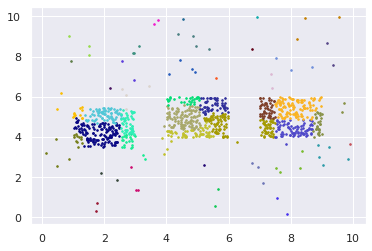

In [ ]:
def n_type_of_points_in_rectangle(rects, points, type_req):
    '''
        p: one point of format (diemension, coords, cluster_label)
        q: one point of format (diemension, coords, cluster_label)
        points: list of points of format (diemension, coords, cluster_label)
    '''
    cnt = 0
    for i in range(len(points)):
        x,y = points[i].coords
        for r in rects:
            xl = r.x_min
            xr = r.x_max
            yl = r.y_min
            yr = r.y_max
            if xl <= x <= xr and yl <= y <= yr and points[i].type_point==type_req:
                cnt += 1
                break
    return cnt

def plot_clusters_two_rects(points, rctgs_origin):
    plt.figure(1)

    label = [points[i].cluster_label for i in range(len(points))]
    label = np.array(label)

    colors = ['#'+("%06x" % random.randint(0, 0xFFFFFF)).upper() for _ in range(len(np.unique(label)))]
    
    X = [np.array(points[i].coords) for i in range(len(points))]
    X = np.array(X)
    for idx, col in enumerate(colors, 1):
        cluster_data = label == idx
        # print('number of cluster points:',len(cluster_data[cluster_data==True]))
        plt.scatter(X[cluster_data, 0], X[cluster_data, 1],
                    c=col, marker='.', s=10)

    currentAxis = plt.gca()
    big_rect = rctgs_origin[-1]
    cluster_rect = []
    unique_label = np.unique(label)
    for idx in range(1,len(unique_label)+1):
        cluster_data = label == idx
        if np.any(cluster_data):
            left, right = np.min(X[cluster_data,0]), np.max(X[cluster_data,0])
            bottom, top = np.min(X[cluster_data,1]), np.max(X[cluster_data,1])
            width, height = abs(right-left), abs(top-bottom)
            temp_rect = Rectangle(0.5*(left+right), 0.5*(top+bottom), width, height)
            cluster_rect.append(temp_rect)

    max_avg_dens = 0
    if len(cluster_rect)>0:
        print(len(cluster_rect))
        k_rects, k_density = dense_rectangle(points, cluster_rect, k=3, min_area=1)
        n_rect_points = n_type_of_points_in_rectangle(k_rects, points, 'Rect')
        n_extra_points = n_type_of_points_in_rectangle(k_rects, points, 'extra')
        f_score, psc, rcl = f_score_points_in_rect(rctgs_extra, k_rects, points)
        f_socre = round(f_score, 4)
        if len(k_density)>0: average_density = sum(k_density) / len(k_density)
        else: average_density = 0
        if average_density > max_avg_dens: max_avg_dens = average_density
        for r in k_rects:
            currentAxis.add_patch(patches.Rectangle((r.x-r.width/2, r.y-r.height/2), r.width, r.height, linewidth=3, edgecolor='r', fill=None))
    # for r in cluster_rect:
    #     currentAxis.add_patch(patches.Rectangle((r.x-r.width/2, r.y-r.height/2), r.width, r.height, linewidth=1, edgecolor='g', fill=None))
    # for r in rctgs_extra:
    #     currentAxis.add_patch(patches.Rectangle((r.x-r.width/2, r.y-r.height/2), r.width, r.height, linewidth=1, edgecolor='b', fill=None))

    print(max_avg_dens)
    # title_1 = 'epsilon: ' + str(round(eps,2)) + '\n' + 'minPts: ' + str(round(mpt,2)) + '\n'
    # title_2 = 'It takes ' + str(round(cost_time, 4)) + ' seconds.' + '\n'
    # titile_3 = 'average density: ' + str(round(average_density, 4))+'\n'
    title_1 = 'precision: ' + str(psc) + '\n'
    title_2 = 'recall: ' + str(rcl) + '\n'
    title_3 = 'f_score: ' + str(f_score) + '\n'
    title_4 = 'number of clusters: '+str(len(cluster_rect)) + '\n'
    title_5 = 'original points: ' + str(n_rect_points) + '\n'
    title_6 = 'generated rect points: ' + str(n_extra_points)
    title = title_1 + title_2 + title_3 + title_4 + title_5 + title_6
    plt.title(title)           
    # ax.set_xlabel(xlabel)
    min_x, max_x = big_rect.x-big_rect.width/2, big_rect.x+big_rect.width/2
    min_y, max_y = big_rect.y-big_rect.height/2, big_rect.y+big_rect.height/2
    plt.xlim([min_x, max_x])
    plt.ylim([min_y, max_y])

    plt.show()

def run_two_rects(n, a, rctgs_origin, datetime, interval, epsilon, min_pts):
    """
    Reads the input set, clusters the points and writes to output

    :param path_in:     location of the input set
    :param path_out:    location to print the output
    """
    # Step 1: read file and create box graph
    bg_origin = rectangle_set(n[0], a[0], rctgs_origin, datetime, interval, epsilon, min_pts)
    # bg_extra = rectangle_set_gaussian(n[1], a[1], rctgs_extra, datetime, interval, epsilon, min_pts, type_point='extra')
    # points = []
    points = bg_origin.points
    # points.extend(bg_origin.points)
    # points.extend(bg_extra.points)
    bg = BoxGraph(sum(n), 2, epsilon, min_pts, points)

    # Step 2: Compute the core points
    find_core_points(bg)

    # Step 3: cluster the core points
    nr_clusters = compute_cluster_cores(bg)
    print(nr_clusters)

    # Step 4: assign border points to clusters
    assign_border_points(bg)
    
    plot_clusters_two_rects(points, rctgs_origin)

    print("Cluster counter:", nr_clusters, file=sys.stderr)

if __name__ == "__main__":
    r_a = Rectangle(8,5,2,2)
    r_b = Rectangle(5,5,2,2)
    r_c = Rectangle(2,4.5,2,2)
    r_d = Rectangle(5,5,10,10)
    rctgs_origin_1 = [r_a, r_b, r_c, r_d]

    r_1 = Rectangle(2,8,1,1)
    r_2 = Rectangle(5,3,1,1)
    r_3 = Rectangle(8,8,1,1)
    rctgs_extra_1 = [r_1, r_2, r_3, r_d]

    r_e = Rectangle(2,2,2,2)
    r_f = Rectangle(3,7,2,2)
    r_g = Rectangle(7,9,2,2)
    rctgs_origin_2 = [r_e, r_f, r_g, r_d]

    r_4 = Rectangle(2,8,1,1)
    r_5 = Rectangle(5,3,1,1)
    r_6 = Rectangle(8,8,1,1)
    rctgs_extra_2 = [r_4, r_5, r_6, r_d]

    r_h = Rectangle(2,8,2,2)
    r_k = Rectangle(5,3,2,2)
    r_m = Rectangle(8,8,2,2)
    rctgs_origin_3 = [r_h, r_k, r_m, r_d]

    r_7 = Rectangle(2,8,1,1)
    r_8 = Rectangle(5,3,1,1)
    r_9 = Rectangle(8,8,1,1)
    rctgs_extra_3 = [r_7, r_8, r_9, r_d]

    r_n = Rectangle(2,6,2,2)
    r_p = Rectangle(5,3,2,2)
    r_q = Rectangle(8,7,2,2)
    rctgs_origin_4 = [r_n, r_p, r_q, r_d]

    r_10 = Rectangle(2,8,1,1)
    r_11 = Rectangle(5,3,1,1)
    r_12 = Rectangle(5,3.5,1,1)
    rctgs_extra_4 = [r_10, r_11, r_12, r_d]

    k = 3
    a_origin = [0.3,0.3,0.3]
    a_extra = [1/3, 1/3, 1/3, 0]
    list_a = [a_origin, a_extra]

    list_n = [1000, 900]

    epsilon, min_pts = 1.7, 280

    # datetime = '2015-03-15 07:00:00'
    date = dt.date(2015,3,15)
    time = dt.time(7,0,0)
    datetime = dt.datetime.combine(date,time)
    lasting_hours = 12
    import time
    start = time.time()
    # run(list_n, [0.3,0.3,0.3], rctgs, datetime, lasting_hours, epsilon, min_pts)
    run_two_rects(list_n, list_a, rctgs_origin_1, datetime, lasting_hours, epsilon, min_pts)
    # run_two_rects(list_n, list_a, rctgs_origin_2, rctgs_extra_2, datetime, lasting_hours, epsilon, min_pts)
    # run_two_rects(list_n, list_a, rctgs_origin_3, rctgs_extra_3, datetime, lasting_hours, epsilon, min_pts)
    # run_two_rects(list_n, list_a, rctgs_origin_4, rctgs_extra_4, datetime, lasting_hours, epsilon, min_pts)
    end = time.time()
    print("Time taken:      {:.3f}s".format(end - start), file=sys.stderr)

In [ ]:
def n_type_of_points_in_rectangle(rects, points, type_req):
    '''
        p: one point of format (diemension, coords, cluster_label)
        q: one point of format (diemension, coords, cluster_label)
        points: list of points of format (diemension, coords, cluster_label)
    '''
    cnt = 0
    for i in range(len(points)):
        x,y = points[i].coords
        for r in rects:
            xl = r.x_min
            xr = r.x_max
            yl = r.y_min
            yr = r.y_max
            if xl <= x <= xr and yl <= y <= yr and points[i].type_point==type_req:
                cnt += 1
                break
    return cnt

def plot_clusters_two_rect_many_k(list_n, list_a, rctgs_origin, rctgs_extra, datetime, lasting_hours, epsilon_list, gamma_mpt, list_k):

    fig = plt.figure(figsize=(35,700))
    fig.tight_layout()
    plt.subplots_adjust(wspace=0,hspace=2.5)
    fig.suptitle('rectangles: DBSCAN using box graph with epsilon and minPts')

    epsilon_list_np = np.array(epsilon_list)
    less_than_2 = epsilon_list_np[epsilon_list_np<2]
    less_than_2_n = len(less_than_2) * len(list_k[0])
    less_than_4 = epsilon_list_np[(epsilon_list_np>=2) & (epsilon_list_np<4)]
    less_than_4_n = len(less_than_4) * len(list_k[1])
    less_than_6 = epsilon_list_np[(epsilon_list_np>=4) & (epsilon_list_np<6)]
    less_than_6_n = len(less_than_6) * len(list_k[2])
    more_than_6 = epsilon_list_np[epsilon_list_np>=6]
    more_than_6_n = len(more_than_6) * len(list_k[3])

    print('number of epsilon < 2:', less_than_2_n // 8)
    print('number of epsilon < 4:', less_than_4_n // 4)
    print('number of epsilon < 6:', less_than_6_n // 2)
    print('number of epsilon >= 6:', more_than_6_n // 3)

    #  plot Numerical Data
    row = less_than_2_n + less_than_4_n + less_than_6_n + more_than_6_n  # number of rows
    columns = 9  # number of columns
    order = 1  # initialize plot counter
    cnt = 0

    date = dt.date(2015,3,15)
    time = dt.time(7,0,0)
    datetime = dt.datetime.combine(date,time)

    interval = 30

    for eps in epsilon_list:
        bg_origin = rectangle_set(list_n[0], list_a[0], rctgs_origin, datetime, interval, eps)
        bg_extra = rectangle_set(list_n[1], list_a[1], rctgs_extra, datetime, interval, eps, type_point='extra')
        points = []
        points.extend(bg_origin.points)
        points.extend(bg_extra.points)
        bg = BoxGraph(sum(list_n), 2, eps, math.inf, points)
        number_of_points = len(bg.points)
        max_pow_mpt = math.log(number_of_points, 1+gamma_mpt)
        min_pts_pow_list = np.array(range(0,int(max_pow_mpt)+1,5))
        min_pts_list = (1+gamma_mpt)**min_pts_pow_list
        print('for epsilon', bg.eps, ', the number of min_pts is', len(min_pts_list))
        if eps<2 : ks = list_k[0]
        if 2<=eps<4 : ks = list_k[1]
        if 4<=eps<6 : ks = list_k[2]
        if eps>6 : ks = list_k[3]
        for k in ks:
            for mpt in min_pts_list:
                import time as tm
                start = tm.time()
                bg.min_pts = mpt
                # print('for min_pts', bg.min_pts))
                find_core_points(bg)
                nr_clusters = compute_cluster_cores(bg)
                assign_border_points(bg)
                end = tm.time()
                cost_time = end - start
                points = bg.points

                label = [points[i].cluster_label for i in range(len(points))]
                label = np.array(label)

                colors = ['#'+("%06x" % random.randint(0, 0xFFFFFF)).upper() for _ in range(len(np.unique(label)))]
                
                X = [np.array(points[i].coords) for i in range(len(points))]
                X = np.array(X)
                
                currentAxis = plt.gca()
                big_rect = rctgs_origin[-1]
                cluster_rect = []
                unique_label = np.unique(label)
                for idx in range(1,len(unique_label)+1):
                    cluster_data = label == idx
                    if np.any(cluster_data):
                        left, right = np.min(X[cluster_data,0]), np.max(X[cluster_data,0])
                        bottom, top = np.min(X[cluster_data,1]), np.max(X[cluster_data,1])
                        width, height = abs(right-left), abs(top-bottom)
                        temp_rect = Rectangle(0.5*(left+right), 0.5*(top+bottom), width, height)
                        cluster_rect.append(temp_rect)
                
                max_avg_dens = 0
                if len(cluster_rect)>0:
                    # print(len(cluster_rect))
                    k_rects, k_density = dense_rectangle(points, cluster_rect, k, 1)
                    n_rect_points = n_type_of_points_in_rectangle(k_rects, points, 'Rect')
                    n_extra_points = n_type_of_points_in_rectangle(k_rects, points, 'extra')
                    f_score, precision, recall = f_score_points_in_rect(rctgs_extra, k_rects, points)
                    f_socre = round(f_score, 4)
                    if len(k_density)>0: average_density = sum(k_density) / len(k_density)
                    else: average_density = 0
                    if average_density > max_avg_dens: max_avg_dens = average_density

                    ax = fig.add_subplot(row, columns, order+cnt)
                    cnt += 1

                    for idx, color in enumerate(colors,1):
                        # print(idx, col)
                        cluster_data = label == idx
                        ax.scatter(X[cluster_data, 0], X[cluster_data, 1],
                                    c=color, marker='.', s=10)

                    for r in k_rects:
                        currentAxis.add_patch(patches.Rectangle((r.x-r.width/2, r.y-r.height/2), r.width, r.height, linewidth=3, edgecolor='r', fill=None))
                    for r in rctgs_extra:
                        currentAxis.add_patch(patches.Rectangle((r.x-r.width/2, r.y-r.height/2), r.width, r.height, linewidth=1, edgecolor='b', fill=None))

                    # print(max_avg_dens)
                    title_1 = 'epsilon: ' + str(round(eps,2)) + '\n' + 'minPts: ' + str(round(mpt,2)) + '\n'
                    title_2 = 'It takes ' + str(round(cost_time, 4)) + ' seconds.' + '\n'
                    # title_3 = 'average density: ' + str(round(average_density, 4))+'\n'
                    title_3_1 = 'precision: ' + str(precision) + '\n'
                    title_3_2 = 'recall: ' + str(recall) + '\n'
                    title_3 = 'f_score: ' + str(f_score) + '\n'
                    title_4 = 'number of clusters: '+str(len(cluster_rect)) + '\n'
                    title_5 = 'original points: ' + str(n_rect_points) + '\n'
                    title_6 = 'generated rect points: ' + str(n_extra_points) + '\n'
                    title_7 = 'requested k: ' + str(k)
                    title = title_1 + title_2 + title_3_1 + title_3_2 + title_3 + title_4 + title_5 + title_6 + title_7
                    ax.set_title(title)           
                    # ax.set_xlabel(xlabel)
                    min_x, max_x = big_rect.x-big_rect.width/2, big_rect.x+big_rect.width/2
                    min_y, max_y = big_rect.y-big_rect.height/2, big_rect.y+big_rect.height/2
                    ax.set_xlim([min_x, max_x])
                    ax.set_ylim([min_y, max_y])

    plt.show()

if __name__ == "__main__":

    r_n = Rectangle(2,6,2,2)
    r_p = Rectangle(5,3,2,2)
    r_q = Rectangle(8,7,2,2)
    r_d = Rectangle(5,5,10,10)
    rctgs_origin = [r_n, r_p, r_q, r_d]

    r_10 = Rectangle(2,8,1,1)
    r_11 = Rectangle(5,3,1,1)
    r_12 = Rectangle(8,8,1,1)
    rctgs_extra = [r_10, r_11, r_12, r_d]

    k = 3
    a_origin = [0.3,0.3,0.3]
    a_extra = [1/3, 1/3, 1/3, 0]
    list_a = [a_origin, a_extra]

    list_n = [1000, 900]

    date = dt.date(2015,3,15)
    time = dt.time(7,0,0)
    datetime = dt.datetime.combine(date,time)
    lasting_hours = 12

    min_area = 1
    lambda_eps, gamma_mpt = 0.1, 0.2
    min_area_r = math.sqrt(min_area/math.pi) 
    min_pow_eps = lambda_eps * math.log(min_area_r,1+lambda_eps)     # math.log(x, base)

    w_image, h_image = 10, 10
    z = max(w_image, h_image)
    max_pow_eps = math.log(z, 1+lambda_eps)
    pow_eps = np.array(range(int(min_pow_eps), int(max_pow_eps)+1))
    # epsilons = list(range(int((1+lambda_eps)**min_pow_eps), int((1+lambda_eps)**max_pow_eps)+1))
    epsilon_list = (1+lambda_eps)**pow_eps

    list_k = [list(range(3,11)), list(range(3,7)), list(range(3,5)), list(range(1,4))]

    import time 
    start = time.time()
    plot_clusters_two_rect_many_k(list_n, list_a, rctgs_origin, rctgs_extra, datetime, lasting_hours, epsilon_list, gamma_mpt, list_k)
    end = time.time()
    print("Time taken:      {:.3f}s".format(end - start), file=sys.stderr)

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
def n_type_of_points_in_rectangle(rects, points, type_req):
    '''
        p: one point of format (diemension, coords, cluster_label)
        q: one point of format (diemension, coords, cluster_label)
        points: list of points of format (diemension, coords, cluster_label)
    '''
    cnt = 0
    for i in range(len(points)):
        x,y = points[i].coords
        for r in rects:
            xl = r.x_min
            xr = r.x_max
            yl = r.y_min
            yr = r.y_max
            if xl <= x <= xr and yl <= y <= yr and points[i].type_point==type_req:
                cnt += 1
                break
    return cnt

def plot_clusters_two_rect_many(list_n, a, rctgs_origin, rctgs_extra, datetime, lasting_hours, epsilon_list, gamma_mpt):

    fig = plt.figure(figsize=(30,75))
    fig.tight_layout()
    plt.subplots_adjust(wspace=0,hspace=1.5)
    fig.suptitle('rectangles: DBSCAN using box graph with epsilon and minPts')

    #  plot Numerical Data
    row = len(epsilon_list)  # number of rows
    column = 9  # number of columns
    order = 1  # initialize plot counter
    cnt = 0

    n_samples = 500

    date = dt.date(2015,3,15)
    time = dt.time(7,0,0)
    datetime = dt.datetime.combine(date,time)

    interval = 30

    for eps in epsilon_list:
        number_of_points = sum(list_n)
        max_pow_mpt = math.log(number_of_points, 1+gamma_mpt)
        min_pts_pow_list = np.array(range(0,int(max_pow_mpt)+1,5))
        min_pts_list = (1+gamma_mpt)**min_pts_pow_list
        print('for epsilon', eps, ', the number of min_pts is', len(min_pts_list))
        for mpt in min_pts_list:
            import time as tm
            start = tm.time()
            bg_origin = rectangle_set(list_n[0], a, rctgs_origin, datetime, interval, eps, mpt)
            bg_extra = rectangle_set(list_n[1], a, rctgs_extra, datetime, interval, eps, mpt, type_point='extra')
            points = []
            points.extend(bg_origin.points)
            points.extend(bg_extra.points)
            bg = BoxGraph(sum(list_n), 2, eps, mpt, points)
            find_core_points(bg)
            nr_clusters = compute_cluster_cores(bg)
            assign_border_points(bg)
            end = tm.time()
            cost_time = end - start
            points = bg.points

            label = [points[i].cluster_label for i in range(len(points))]
            label = np.array(label)

            colors = ['#'+("%06x" % random.randint(0, 0xFFFFFF)).upper() for _ in range(len(np.unique(label)))]
            
            # print('labels:', np.unique(label))
            # print('the first 5 labels:', label[:5])
            X = [np.array(points[i].coords) for i in range(len(points))]
            X = np.array(X)
            # print('number of coords:', len(X))
            # print('the first 5 coords:', X[:5])

            ax = fig.add_subplot(row, column, order+cnt)
            cnt += 1
            # ax = fig.add_axes([0, 0, 1, 1])
            # Hide spines, ticks, etc.

            for idx, col in enumerate(colors,1):
                # print(idx, col)
                cluster_data = label == idx
                ax.scatter(X[cluster_data, 0], X[cluster_data, 1],
                            c=col, marker='.', s=10)
            
            currentAxis = plt.gca()
            big_rect = rctgs_origin[-1]
            cluster_rect = []
            unique_label = np.unique(label)
            # unique_label = unique_label[unique_label != -1]
            # for idx, lbl in enumerate(np.unique(label),1):
            for idx in range(1,len(unique_label)+1):
                cluster_data = label == idx
                if np.any(cluster_data):
                    left, right = np.min(X[cluster_data,0]), np.max(X[cluster_data,0])
                    bottom, top = np.min(X[cluster_data,1]), np.max(X[cluster_data,1])
                    width, height = abs(right-left), abs(top-bottom)
                    # currentAxis.add_patch(patches.Rectangle((left, bottom), width, height, linewidth=1, edgecolor='b', fill=None))
                    temp_rect = Rectangle(0.5*(left+right), 0.5*(top+bottom), width, height)
                    # print(left, right, top,bottom)
                    # print('x:',temp_rect.x,'y:',temp_rect.y, temp_rect.x_min )
                    cluster_rect.append(temp_rect)
            
            # print('number of clusters:', len(cluster_rect))
            max_avg_dens = 0
            if len(cluster_rect)>0:
                print(len(cluster_rect))
                k_rects, k_density = dense_rectangle(points, cluster_rect, 3, 1)
                n_rect_points = n_type_of_points_in_rectangle(k_rects, points, 'Rect')
                n_extra_points = n_type_of_points_in_rectangle(k_rects, points, 'extra')
                f_score, _, _ = f_score_points_in_rect(rctgs_extra, k_rects, points)
                f_socre = round(f_score, 4)
                if len(k_density)>0: average_density = sum(k_density) / len(k_density)
                else: average_density = 0
                if average_density > max_avg_dens: max_avg_dens = average_density
                for r in k_rects:
                    currentAxis.add_patch(patches.Rectangle((r.x-r.width/2, r.y-r.height/2), r.width, r.height, linewidth=3, edgecolor='r', fill=None))
            for r in rctgs_extra:
                currentAxis.add_patch(patches.Rectangle((r.x-r.width/2, r.y-r.height/2), r.width, r.height, linewidth=1, edgecolor='b', fill=None))

            print(max_avg_dens)
            title_1 = 'epsilon: ' + str(round(eps,2)) + '\n' + 'minPts: ' + str(round(mpt,2)) + '\n'
            title_2 = 'It takes ' + str(round(cost_time, 4)) + ' seconds.' + '\n'
            # titile_3 = 'average density: ' + str(round(average_density, 4))+'\n'
            title_3 = 'f_score: ' + str(f_score) + '\n'
            title_4 = 'number of clusters: '+str(len(cluster_rect)) + '\n'
            title_5 = 'original points: ' + str(n_rect_points) + '\n'
            title_6 = 'generated rect points: ' + str(n_extra_points)
            title = title_1 + title_2 + title_3 + title_4 + title_5 + title_6
            ax.set_title(title)           
            # ax.set_xlabel(xlabel)
            min_x, max_x = big_rect.x-big_rect.width/2, big_rect.x+big_rect.width/2
            min_y, max_y = big_rect.y-big_rect.height/2, big_rect.y+big_rect.height/2
            ax.set_xlim([min_x, max_x])
            ax.set_ylim([min_y, max_y])

    plt.show()

if __name__ == "__main__":

    r_d = Rectangle(5,5,10,10)
    r_n = Rectangle(2,6,2,2)
    r_p = Rectangle(5,3,2,2)
    r_q = Rectangle(8,7,2,2)
    rctgs_origin = [r_n, r_p, r_q, r_d]

    r_10 = Rectangle(2,8,1,1)
    r_11 = Rectangle(5,3,1,1)
    r_12 = Rectangle(8,8,1,1)
    rctgs_extra = [r_10, r_11, r_12, r_d]

    k = 3
    a = [0.3,0.3,0.3]

    list_n = [1000, 500]

    date = dt.date(2015,3,15)
    time = dt.time(7,0,0)
    datetime = dt.datetime.combine(date,time)
    lasting_hours = 12

    min_area = 1
    lambda_eps, gamma_mpt = 0.1, 0.2
    min_area_r = math.sqrt(min_area/math.pi) 
    min_pow_eps = lambda_eps * math.log(min_area_r,1+lambda_eps)     # math.log(x, base)

    w_image, h_image = 10, 10
    z = max(w_image, h_image)
    max_pow_eps = math.log(z, 1+lambda_eps)
    pow_eps = np.array(range(int(min_pow_eps), int(max_pow_eps)+1))
    # epsilons = list(range(int((1+lambda_eps)**min_pow_eps), int((1+lambda_eps)**max_pow_eps)+1))
    epsilon_list = (1+lambda_eps)**pow_eps

    print('number of epsilon:', len(epsilon_list))

    import time 
    start = time.time()
    plot_clusters_two_rect_many(list_n, a, rctgs_origin, rctgs_extra, datetime, lasting_hours, epsilon_list, gamma_mpt)
    end = time.time()
    print("Time taken:      {:.3f}s".format(end - start), file=sys.stderr)

Output hidden; open in https://colab.research.google.com to view.

number of points: 1809
3 [0.022304969054437074, 0.012910350258639633, 0.006142902322402184]
before delete: 1809
after delete: 1050
before: 4297 after sample: 1027
number of points: 2077
3 [0.017109792602570104, 0.012424793903868196, 0.00893224207048422]
before delete: 2077
after delete: 1027
before: 6239 after sample: 1555
number of points: 2582
3 [0.01677182130017456, 0.013847732659607764, 0.005164036571431599]
before delete: 2582
after delete: 1555
before: 7284 after sample: 1749
number of points: 3304
3 [0.02714103256250575, 0.024208301902290803, 0.01671187370086657]
before delete: 3304
after delete: 1749
before: 9122 after sample: 2298
number of points: 4047
3 [0.05015979504800678, 0.028783789015799525, 0.017001145429576474]
before delete: 4047
after delete: 2298
before: 9057 after sample: 2268
number of points: 4566
3 [0.05938581905888632, 0.030962396348956277, 0.019198390136784958]
before delete: 4566
after delete: 2268
before: 10545 after sample: 2655
number of points: 4923
3 [0

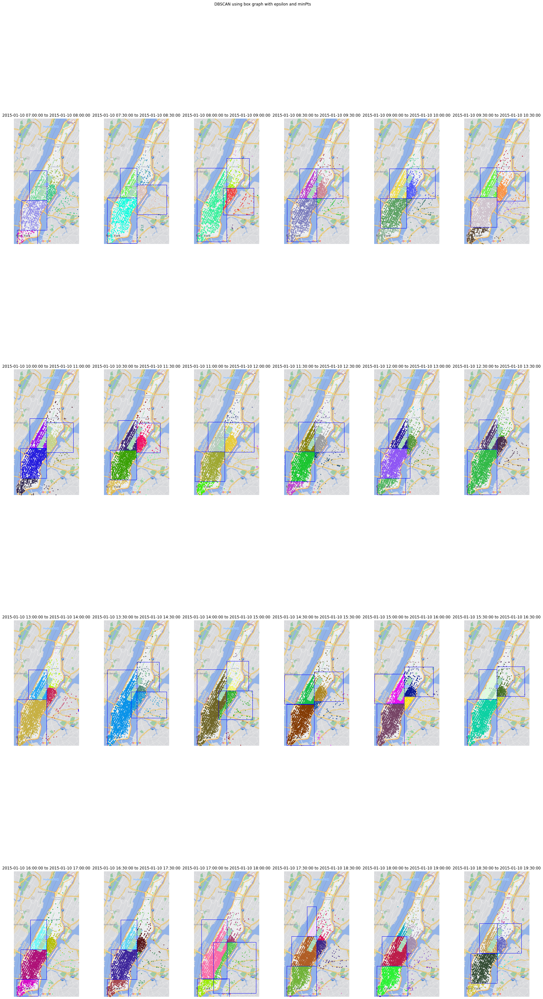

In [ ]:
from IPython.display import clear_output

def generate_bg(df, epsilon, min_pts):
    n, d = len(df.index), 2
    list_points = []
    for j in range(n):
        x, y = df.iloc[j,-4], df.iloc[j,-3]
        datetime_generated = df.iloc[j,1]
        list_points.append(ClusterPoint(d, [x,y], ID=j, datetime=datetime_generated))
    return BoxGraph(n, d, epsilon, min_pts, list_points)

def run_cluster_taxi_prob(bg):
    """
    Reads the input set, clusters the points and writes to output

    :param path_in:     location of the input set
    :param path_out:    location to print the output
    """
    # Step 1: read file and create box graph
    # bg = taxi_set(epsilon, min_pts)
    print('number of points:',len(bg.points))
    
    # Step 2: Compute the core points
    find_core_points(bg)

    # Step 3: cluster the core points
    nr_clusters = compute_cluster_cores(bg)

    # Step 4: assign border points to clusters
    assign_border_points(bg)
    
    # points = bg.points
    # plot_clusters_taxi(points)

    # print("Cluster counter:", nr_clusters, file=sys.stderr)

def plot_sliding_window_prob_many(df, begin_date, interval, w, column, eps, mpt, prob=0.2, unit='minute'):
    '''
        df: dataframes
        begin_date: datetime
        interval: int, the window move to begin_time+interval next time
        w: int, the size of the sliding window
        unit: string, the unit of the sliding window
        column: string, the name of the required column

        only plot, not return
    '''
    start_time = begin_date

    after_start_date = df[column] >= start_time
    before_end_date = df[column] < start_time + dt.timedelta(minutes=w)
    between_two_dates = after_start_date & before_end_date
    filtered_df = df.loc[between_two_dates]

    # choose it with probability
    n_samples = len(filtered_df.index)
    index_list = []
    for j in range(n_samples):
        b = np.random.uniform(0,1)        # Generate a random float from 0 to 1
        if b <= prob:
            index_list.append(j)
    sampled_df = filtered_df.iloc[np.array(index_list)]

    # initializing the window
    init_df = TimeWindow(w, start_time, sampled_df)
    filtered_tw = init_df
    latest_window = filtered_tw.window

    fig = plt.figure(figsize=(30, 50))
    fig.tight_layout()
    plt.subplots_adjust(wspace=0,hspace=1)
    fig.suptitle('DBSCAN using box graph with epsilon and minPts')

    #  plot Numerical Data
    row = 4  # number of rows
    n_col = 6  # number of columns
    order = 1  # initialize plot counter
    cnt = 0

    im = plt.imread('manhattan.png')
    dpi = 80
    height, width, depth = im.shape
    figsize = width / float(dpi), height / float(dpi)
    
    # generate the boxgraph for the window and run DBSCAN
    for _ in range(24):

        temp_bg = generate_bg(latest_window, eps, int(mpt*prob))
        run_cluster_taxi_prob(temp_bg)
        points = temp_bg.points

        label = [points[i].cluster_label for i in range(len(points))]
        label = np.array(label)

        colors = ['#'+("%06x" % random.randint(0, 0xFFFFFF)).upper() for _ in range(len(label))]
        
        # cmap = plt.get_cmap('gnuplot')
        # colors = [cmap(i) for i in np.linspace(0, 1, len(label))]
        colors = colors[:len(label)]
        # print('number of labels:', len(label))
        # print('labels:', np.unique(label))
        X = [np.array(points[i].coords) for i in range(len(points))]
        X = np.array(X)
        
        ax = fig.add_subplot(row, n_col, order+cnt)
        cnt += 1
        ax.imshow(im, cmap='gray')
        implot = plt.imshow(im)
        ax.axis('off')

        for idx, col in enumerate(colors):
            # print(idx, col)
            cluster_data = label == idx
            dots = ax.scatter(X[cluster_data, 0], X[cluster_data, 1],
                        c=col, marker='.', s=10)

        # currentAxis = plt.gca()
        # big_rect = rctgs[-1]
        cluster_rect = []
        for idx in range(1,len(np.unique(label))+1):
            cluster_data = label == idx
            # print(len(cluster_data),np.unique(cluster_data))
            if np.any(cluster_data):
                left, right = np.min(X[cluster_data,0]), np.max(X[cluster_data,0])
                bottom, top = np.min(X[cluster_data,1]), np.max(X[cluster_data,1])
                width, height = abs(right-left), abs(top-bottom)
                # currentAxis.add_patch(patches.Rectangle((left, bottom), width, height, linewidth=1, edgecolor='b', fill=None))
                temp_rect = Rectangle(0.5*(left+right), 0.5*(top+bottom), width, height)
                cluster_rect.append(temp_rect)
        
        k_rects, average_density = dense_rectangle(points, cluster_rect)
        print(len(k_rects), average_density)
        for r in k_rects:
            ax.add_patch(patches.Rectangle((r.x-r.width/2, r.y-r.height/2), r.width, r.height, linewidth=1, edgecolor='b', fill=None))

        title_str = str(start_time)+' to '+str(start_time+ dt.timedelta(minutes=w))
        plt.title(title_str)
        start_time += dt.timedelta(minutes=interval)
        
        # Hide spines, ticks, etc.
        ax.axis('off')

        # plt.scatter(core_points[:,0], core_points[:,1], c='b', s=50)
        # plt.title("DBScan clustering")
        # plt.xticks([])
        # plt.yticks([])

        filtered_tw = filtered_tw.sliding_with_prob(interval, df, column, prob)
        latest_window = filtered_tw.window
        # n_samples = len(latest_window.index)
        # index_list = []
        # for j in range(n_samples):
        #     b = np.random.uniform(0,1)        # Generate a random float from 0 to 1
        #     if b <= prob:
        #         index_list.append(j)
        # latest_window = latest_window.iloc[np.array(index_list)]

    plt.show()

plot_sliding_window_prob_many(data_oneday, s_datetime, 30, 60, 'tpep_pickup_datetime', 304, 50, 1/4)

number of points: 2077
3 [0.37109208979556213, 0.07119920789036789, 0.07029068548691317]
number of points: 2483
3 [0.3554843297334866, 0.17899983330727717, 0.11806822037525679]
number of points: 3019
3 [0.2594749194010364, 0.22462060563454514, 0.1123152974675482]
number of points: 3725
3 [0.2711334593858552, 0.21742555612456793, 0.09662521973893551]
number of points: 4485
3 [0.30829041865597034, 0.22536558256499714, 0.1287612982807861]
number of points: 4938
3 [0.2784892973502931, 0.2781311589485214, 0.1374814155131623]
number of points: 5204
3 [0.30193898791710916, 0.2707020577867167, 0.13122833503199052]
number of points: 5724
3 [0.31718279804919497, 0.2885331184571402, 0.2699963083651093]
number of points: 6144
3 [0.3748114333593217, 0.2722979034973219, 0.25028622915110976]
number of points: 6459
3 [0.39711085119933176, 0.24456387745883348, 0.23783916420605364]
number of points: 6720
3 [0.26444252320710687, 0.21864510823786185, 0.2169203207263929]
number of points: 6815
3 [0.2522476

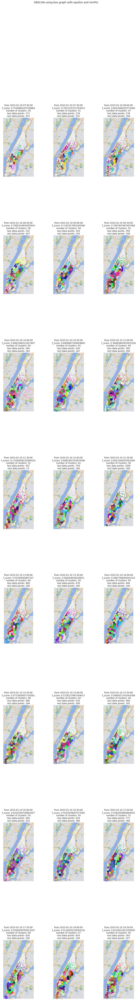

In [ ]:
from IPython.display import clear_output

def rectangle_set_list(n_samples, a, rctgs, datetime, interval):
    '''
        n_samples: int, number of points
        a: int list, the probability to be in the smaller rectangles
        rctgs: list of rectangles of class Rectangle, the first one is the biggest one
        datetime: datetime, 'yyyy-mm-dd hh:mm:ss'
        interval: int, the lasting time (e.g. 12 hours) from the starting time (i.e. date)
    '''
    list_points = []
    d = 2

    # insert 0 at the beginning and 1 at the end
    a = [0] + a
    for i in range(1, len(a)-1):
        a[i] = a[i-1] + a[i]

    for j in range(n_samples):
        b = np.random.uniform(0,1)        # Generate a random float from 0 to 1
        for i in range(len(a)-1):
            if a[i] < b <= a[i+1]:
                tmp_rctg = rctgs[i]
                x = np.random.uniform(low=tmp_rctg.x_min, high=tmp_rctg.x_min+tmp_rctg.width)
                y = np.random.uniform(low=tmp_rctg.y_min, high=tmp_rctg.y_min+tmp_rctg.height)
                hour_low = datetime.hour
                hour = np.random.randint(low=hour_low, high=hour_low+interval)
                year, month, day = datetime.year, datetime.month, datetime.day
                minute = np.random.randint(low=0, high=59)
                second = np.random.randint(low=0, high=59)
                day_month = day_of_month(year, month)
                if hour >= 24:
                    hour = hour % 24
                    if day<day_month:
                        day = day + 1
                    else:
                        day = (day + 1) % day_month
                # date_str = str(year)+'-'+str(month).zfill(2)+'-'+str(day).zfill(2)+' '+str(hour).zfill(2)+':'+str(minute).zfill(2)+':'+str(second).zfill(2)
                date_generated = dt.date(year, month, day)
                time_generated = dt.time(hour, minute, second)
                datetime_generated = dt.datetime.combine(date_generated, time_generated)
                list_points.append(ClusterPoint(d, [x,y],ID=j,datetime=datetime_generated,type_point='Rect'))
                break
    return list_points

def generate_bg_list(df):
    n, d = len(df.index), 2
    list_points = []
    for j in range(n):
        x, y = df.iloc[j,-4], df.iloc[j,-3]
        datetime_generated = df.iloc[j,1]
        list_points.append(ClusterPoint(d, [x,y], ID=j, datetime=datetime_generated,type_point='taxi'))
    return list_points

def run_cluster_taxi_and_rect_prob(bg):
    """
    Reads the input set, clusters the points and writes to output

    :param path_in:     location of the input set
    :param path_out:    location to print the output
    """
    # Step 1: read file and create box graph
    # bg = taxi_set(epsilon, min_pts)
    print('number of points:',len(bg.points))
    
    # Step 2: Compute the core points
    find_core_points(bg)

    # Step 3: cluster the core points
    nr_clusters = compute_cluster_cores(bg)

    # Step 4: assign border points to clusters
    assign_border_points(bg)
    
    # points = bg.points
    # plot_clusters_taxi(points)

    # print("Cluster counter:", nr_clusters, file=sys.stderr)

def plot_sliding_window_taxi_and_rect_prob_many(df, begin_date, interval, w, column, eps, mpt, prob=0.2, unit='minute'):
    '''
        df: dataframes
        begin_date: datetime
        interval: int, the window move to begin_time+interval next time
        w: int, the size of the sliding window
        unit: string, the unit of the sliding window
        column: string, the name of the required column

        only plot, not return
    '''
    start_time = begin_date

    after_start_date = df[column] >= start_time
    before_end_date = df[column] < start_time + dt.timedelta(minutes=w)
    between_two_dates = after_start_date & before_end_date
    filtered_df = df.loc[between_two_dates]

    # choose it with probability
    n_samples = len(filtered_df.index)
    index_list = []
    for j in range(n_samples):
        b = np.random.uniform(0,1)        # Generate a random float from 0 to 1
        if b <= prob:
            index_list.append(j)
    sampled_df = filtered_df.iloc[np.array(index_list)]

    # initializing the window
    init_df = TimeWindow(w, start_time, sampled_df)
    filtered_tw = init_df
    latest_window = filtered_tw.window

    rect_1 = Rectangle(130, 600, 30, 30)
    rect_2 = Rectangle(250, 550, 40, 40)
    rctgs = [rect_1, rect_2]

    date = dt.date(2015,3,15)
    time = dt.time(7,0,0)
    datetime = dt.datetime.combine(date,time)

    rect_set_list = rectangle_set_list(3000, [0.5,0.5], rctgs, datetime, interval)
    index_list = []
    for j in range(len(rect_set_list)):
        b = np.random.uniform(0,1)        # Generate a random float from 0 to 1
        if b <= prob:
            index_list.append(j)
    sampled_rect_set = list(map(rect_set_list.__getitem__, index_list))  # rect_set_list[np.array(index_list)]
    
    fig = plt.figure(figsize=(15, 70))
    fig.tight_layout()
    plt.subplots_adjust(wspace=0,hspace=1)
    fig.suptitle('DBSCAN using box graph with epsilon and minPts')

    #  plot Numerical Data
    row = 8  # number of rows
    n_col = 3  # number of columns
    order = 1  # initialize plot counter
    cnt = 0

    im = plt.imread('manhattan.png')
    dpi = 80
    height, width, depth = im.shape
    figsize = width / float(dpi), height / float(dpi)
    
    # generate the boxgraph for the window and run DBSCAN
    for _ in range(24):

        temp_point_list = generate_bg_list(latest_window) + sampled_rect_set
        temp_bg = BoxGraph(len(temp_point_list), 2, eps, int(mpt*prob), temp_point_list)
        run_cluster_taxi_and_rect_prob(temp_bg)
        points = temp_bg.points

        label = [points[i].cluster_label for i in range(len(points))]
        label = np.array(label)

        colors = ['#'+("%06x" % random.randint(0, 0xFFFFFF)).upper() for _ in range(len(label))]
        
        # cmap = plt.get_cmap('gnuplot')
        # colors = [cmap(i) for i in np.linspace(0, 1, len(label))]
        colors = colors[:len(label)]
        # print('number of labels:', len(label))
        # print('labels:', np.unique(label))
        X = [np.array(points[i].coords) for i in range(len(points))]
        X = np.array(X)
        
        ax = fig.add_subplot(row, n_col, order+cnt)
        cnt += 1
        ax.imshow(im, cmap='gray')
        implot = plt.imshow(im)
        ax.axis('off')

        for idx, col in enumerate(colors):
            # print(idx, col)
            cluster_data = label == idx
            dots = ax.scatter(X[cluster_data, 0], X[cluster_data, 1],
                        c=col, marker='.', s=10)

        # currentAxis = plt.gca()
        # big_rect = rctgs[-1]
        cluster_rect = []
        for idx in range(1,len(np.unique(label))+1):
            cluster_data = label == idx
            # print(len(cluster_data),np.unique(cluster_data))
            if np.any(cluster_data):
                left, right = np.min(X[cluster_data,0]), np.max(X[cluster_data,0])
                bottom, top = np.min(X[cluster_data,1]), np.max(X[cluster_data,1])
                width, height = abs(right-left), abs(top-bottom)
                # currentAxis.add_patch(patches.Rectangle((left, bottom), width, height, linewidth=1, edgecolor='b', fill=None))
                temp_rect = Rectangle(0.5*(left+right), 0.5*(top+bottom), width, height)
                cluster_rect.append(temp_rect)

        k_rects, average_density = dense_rectangle(points, cluster_rect, k=3)
        print(len(k_rects), average_density)
        n_rect_points = n_type_of_points_in_rectangle(k_rects, points, 'Rect')
        n_taxi_points = n_type_of_points_in_rectangle(k_rects, points, 'taxi')
        f_score, _, _ = f_score_points_in_rect(rctgs, k_rects, points)
        f_socre = round(f_score, 4)
        for r in k_rects:
            ax.add_patch(patches.Rectangle((r.x-r.width/2, r.y-r.height/2), r.width, r.height, linewidth=2, edgecolor='r', fill=None))
        for r in rctgs:
            ax.add_patch(patches.Rectangle((r.x-r.width/2, r.y-r.height/2), r.width, r.height, linewidth=1, edgecolor='b', fill=None))

        title_1 = 'from ' + str(start_time)+ '\n'
        title_2 = 'to '+str(start_time+ dt.timedelta(minutes=w)) + ' \n'
        title_3 = 'f_score: ' + str(f_score) + '\n'
        title_4 = 'number of clusters: '+str(len(cluster_rect)) + '\n'
        title_5 = 'taxi data points: ' + str(n_taxi_points) + '\n'
        title_6 = 'rect data points: ' + str(n_rect_points)
        title_str = title_1 + title_3 + title_4 + title_5 + title_6
        plt.title(title_str)
        start_time += dt.timedelta(minutes=interval)
        
        # Hide spines, ticks, etc.
        ax.axis('off')

        # plt.scatter(core_points[:,0], core_points[:,1], c='b', s=50)
        # plt.title("DBScan clustering")
        # plt.xticks([])
        # plt.yticks([])

        filtered_tw = filtered_tw.sliding_with_prob(interval, df, column, prob)
        latest_window = filtered_tw.window
        # n_samples = len(latest_window.index)
        # index_list = []
        # for j in range(n_samples):
        #     b = np.random.uniform(0,1)        # Generate a random float from 0 to 1
        #     if b <= prob:
        #         index_list.append(j)
        # latest_window = latest_window.iloc[np.array(index_list)]

    plt.show()

plot_sliding_window_taxi_and_rect_prob_many(data_oneday, s_datetime, 30, 60, 'tpep_pickup_datetime', 45, 590, 1/4)

In [ ]:
from IPython.display import clear_output

def rectangle_set_list(n_samples, a, rctgs, datetime, interval):
    '''
        n_samples: int, number of points
        a: int list, the probability to be in the smaller rectangles
        rctgs: list of rectangles of class Rectangle, the first one is the biggest one
        datetime: datetime, 'yyyy-mm-dd hh:mm:ss'
        interval: int, the lasting time (e.g. 12 hours) from the starting time (i.e. date)
    '''
    list_points = []
    d = 2

    # insert 0 at the beginning and 1 at the end
    a = [0] + a
    for i in range(1, len(a)):
        a[i] = a[i-1] + a[i]

    for j in range(n_samples):
        b = np.random.uniform(0,1)        # Generate a random float from 0 to 1
        for i in range(len(a)-1):
            if a[i] < b <= a[i+1]:
                tmp_rctg = rctgs[i]
                x = np.random.uniform(low=tmp_rctg.x_min, high=tmp_rctg.x_min+tmp_rctg.width)
                y = np.random.uniform(low=tmp_rctg.y_min, high=tmp_rctg.y_min+tmp_rctg.height)
                hour_low = datetime.hour
                hour = np.random.randint(low=hour_low, high=hour_low+interval)
                year, month, day = datetime.year, datetime.month, datetime.day
                minute = np.random.randint(low=0, high=59)
                second = np.random.randint(low=0, high=59)
                day_month = day_of_month(year, month)
                if hour >= 24:
                    hour = hour % 24
                    if day<day_month:
                        day = day + 1
                    else:
                        day = (day + 1) % day_month
                # date_str = str(year)+'-'+str(month).zfill(2)+'-'+str(day).zfill(2)+' '+str(hour).zfill(2)+':'+str(minute).zfill(2)+':'+str(second).zfill(2)
                date_generated = dt.date(year, month, day)
                time_generated = dt.time(hour, minute, second)
                datetime_generated = dt.datetime.combine(date_generated, time_generated)
                list_points.append(ClusterPoint(d, [x,y],ID=j,datetime=datetime_generated,type_point='Rect'))
                break
    return list_points

def generate_bg_list(df):
    n, d = len(df.index), 2
    list_points = []
    for j in range(n):
        x, y = df.iloc[j,-4], df.iloc[j,-3]
        datetime_generated = df.iloc[j,1]
        list_points.append(ClusterPoint(d, [x,y], ID=j, datetime=datetime_generated,type_point='taxi'))
    return list_points

def run_cluster_taxi_and_rect_prob(bg):
    """
    Reads the input set, clusters the points and writes to output

    :param path_in:     location of the input set
    :param path_out:    location to print the output
    """
    # Step 1: read file and create box graph
    # bg = taxi_set(epsilon, min_pts)
    print('number of points:',len(bg.points))
    
    # Step 2: Compute the core points
    find_core_points(bg)

    # Step 3: cluster the core points
    nr_clusters = compute_cluster_cores(bg)

    # Step 4: assign border points to clusters
    assign_border_points(bg)
    
    # points = bg.points
    # plot_clusters_taxi(points)

    # print("Cluster counter:", nr_clusters, file=sys.stderr)

def plot_sliding_window_taxi_and_rect_prob_one_by_one(df, begin_date, interval, w, column, eps, mpt, prob=0.2, unit='minute'):
    '''
        df: dataframes
        begin_date: datetime
        interval: int, the window move to begin_time+interval next time
        w: int, the size of the sliding window
        unit: string, the unit of the sliding window
        column: string, the name of the required column

        only plot, not return
    '''
    start_time = begin_date

    after_start_date = df[column] >= start_time
    before_end_date = df[column] < start_time + dt.timedelta(minutes=w)
    between_two_dates = after_start_date & before_end_date
    filtered_df = df.loc[between_two_dates]

    # choose it with probability
    n_samples = len(filtered_df.index)
    index_list = []
    for j in range(n_samples):
        b = np.random.uniform(0,1)        # Generate a random float from 0 to 1
        if b <= prob:
            index_list.append(j)
    sampled_df = filtered_df.iloc[np.array(index_list)]

    # initializing the window
    init_df = TimeWindow(w, start_time, sampled_df)
    filtered_tw = init_df
    latest_window = filtered_tw.window

    rect_1 = Rectangle(130, 600, 30, 30)
    rect_2 = Rectangle(250, 550, 40, 40)
    rctgs = [rect_1, rect_2]

    date = dt.date(2015,3,15)
    time = dt.time(7,0,0)
    datetime = dt.datetime.combine(date,time)

    rect_set_list = rectangle_set_list(1000, [0.5,0.5], rctgs, datetime, interval)

    #  plot Numerical Data
    row = 4  # number of rows
    n_col = 6  # number of columns
    order = 1  # initialize plot counter
    cnt = 0

    im = plt.imread('manhattan.png')
    dpi = 80
    height, width, depth = im.shape
    figsize = width / float(dpi), height / float(dpi)
    
    # fig.suptitle('DBSCAN using box graph with epsilon and minPts')
    
    # generate the boxgraph for the window and run DBSCAN
    for _ in range(24):

        temp_point_list = generate_bg_list(latest_window) + rect_set_list
        temp_bg = BoxGraph(len(temp_point_list), 2, eps, int(mpt*prob), temp_point_list)
        run_cluster_taxi_and_rect_prob(temp_bg)
        points = temp_bg.points

        label = [points[i].cluster_label for i in range(len(points))]
        label = np.array(label)

        colors = ['#'+("%06x" % random.randint(0, 0xFFFFFF)).upper() for _ in range(len(label))]
        
        # cmap = plt.get_cmap('gnuplot')
        # colors = [cmap(i) for i in np.linspace(0, 1, len(label))]
        colors = colors[:len(label)]
        # print('number of labels:', len(label))
        # print('labels:', np.unique(label))
        X = [np.array(points[i].coords) for i in range(len(points))]
        X = np.array(X)
        
        # ax = fig.add_subplot(row, n_col, order+cnt)
        fig = plt.figure(figsize=figsize)
        ax = fig.add_axes([0, 0, 1, 1])
        cnt += 1
        ax.imshow(im, cmap='gray')
        implot = plt.imshow(im)
        ax.axis('off')

        for idx, col in enumerate(colors):
            # print(idx, col)
            cluster_data = label == idx
            dots = ax.scatter(X[cluster_data, 0], X[cluster_data, 1],
                        c=col, marker='.', s=10)

        # currentAxis = plt.gca()
        # big_rect = rctgs[-1]
        cluster_rect = []
        for idx in range(1,len(np.unique(label))+1):
            cluster_data = label == idx
            # print(len(cluster_data),np.unique(cluster_data))
            if np.any(cluster_data):
                left, right = np.min(X[cluster_data,0]), np.max(X[cluster_data,0])
                bottom, top = np.min(X[cluster_data,1]), np.max(X[cluster_data,1])
                width, height = abs(right-left), abs(top-bottom)
                # currentAxis.add_patch(patches.Rectangle((left, bottom), width, height, linewidth=1, edgecolor='b', fill=None))
                temp_rect = Rectangle(0.5*(left+right), 0.5*(top+bottom), width, height)
                cluster_rect.append(temp_rect)

        k_rects, average_density = dense_rectangle(points, cluster_rect)
        print(len(k_rects), average_density)
        n_rect_points = n_type_of_points_in_rectangle(k_rects, points, 'Rect')
        n_taxi_points = n_type_of_points_in_rectangle(k_rects, points, 'taxi')
        f_score, _, _ = f_score_points_in_rect(rctgs, k_rects, points)
        f_socre = round(f_score, 4)
        for r in k_rects:
            ax.add_patch(patches.Rectangle((r.x-r.width/2, r.y-r.height/2), r.width, r.height, linewidth=2, edgecolor='r', fill=None))
        for r in rctgs:
            ax.add_patch(patches.Rectangle((r.x-r.width/2, r.y-r.height/2), r.width, r.height, linewidth=1, edgecolor='b', fill=None))

        title_1 = str(start_time)+' to '+str(start_time+ dt.timedelta(minutes=w)) + ' \n'
        title_3 = 'f_score: ' + str(f_score) + '\n'
        title_4 = 'number of clusters: '+str(len(cluster_rect)) + '\n'
        title_5 = 'number of original taxi data points: ' + str(n_taxi_points) + '\n'
        title_6 = 'number of generated rect data points: ' + str(n_rect_points)
        title_str = title_1 + title_3 + title_4 + title_5 + title_6
        plt.title(title_str)
        start_time += dt.timedelta(minutes=interval)
        
        # Hide spines, ticks, etc.
        ax.axis('off')

        # plt.scatter(core_points[:,0], core_points[:,1], c='b', s=50)
        # plt.title("DBScan clustering")
        # plt.xticks([])
        # plt.yticks([])

        filtered_tw = filtered_tw.sliding_with_prob(interval, df, column, prob)
        latest_window = filtered_tw.window

    plt.show()

plot_sliding_window_taxi_and_rect_prob_one_by_one(data_oneday, s_datetime, 30, 60, 'tpep_pickup_datetime', 45, 50, 1/4)

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
from IPython.display import clear_output

def rectangle_set_list(n_samples, a, rctgs, datetime, interval):
    '''
        n_samples: int, number of points
        a: int list, the probability to be in the smaller rectangles
        rctgs: list of rectangles of class Rectangle, the first one is the biggest one
        datetime: datetime, 'yyyy-mm-dd hh:mm:ss'
        interval: int, the lasting time (e.g. 12 hours) from the starting time (i.e. date)
    '''
    list_points = []
    d = 2

    # insert 0 at the beginning and 1 at the end
    a = [0] + a
    for i in range(1, len(a)):
        a[i] = a[i-1] + a[i]

    for j in range(n_samples):
        b = np.random.uniform(0,1)        # Generate a random float from 0 to 1
        for i in range(len(a)-1):
            if a[i] < b <= a[i+1]:
                tmp_rctg = rctgs[i]
                x = np.random.uniform(low=tmp_rctg.x_min, high=tmp_rctg.x_min+tmp_rctg.width)
                y = np.random.uniform(low=tmp_rctg.y_min, high=tmp_rctg.y_min+tmp_rctg.height)
                hour_low = datetime.hour
                hour = np.random.randint(low=hour_low, high=hour_low+interval)
                year, month, day = datetime.year, datetime.month, datetime.day
                minute = np.random.randint(low=0, high=59)
                second = np.random.randint(low=0, high=59)
                day_month = day_of_month(year, month)
                if hour >= 24:
                    hour = hour % 24
                    if day<day_month:
                        day = day + 1
                    else:
                        day = (day + 1) % day_month
                # date_str = str(year)+'-'+str(month).zfill(2)+'-'+str(day).zfill(2)+' '+str(hour).zfill(2)+':'+str(minute).zfill(2)+':'+str(second).zfill(2)
                date_generated = dt.date(year, month, day)
                time_generated = dt.time(hour, minute, second)
                datetime_generated = dt.datetime.combine(date_generated, time_generated)
                list_points.append(ClusterPoint(d, [x,y],ID=j,datetime=datetime_generated,type_point='Rect'))
                break
    return list_points

def n_type_of_points_in_rectangle(rects, points, type_req):
    '''
        p: one point of format (diemension, coords, cluster_label)
        q: one point of format (diemension, coords, cluster_label)
        points: list of points of format (diemension, coords, cluster_label)
    '''
    cnt = 0
    for i in range(len(points)):
        x,y = points[i].coords
        for r in rects:
            xl = r.x_min
            xr = r.x_max
            yl = r.y_min
            yr = r.y_max
            if xl <= x <= xr and yl <= y <= yr and points[i].type_point==type_req:
                cnt += 1
                break
    return cnt

def generate_bg_list(df):
    n, d = len(df.index), 2
    list_points = []
    for j in range(n):
        x, y = df.iloc[j,-4], df.iloc[j,-3]
        datetime_generated = df.iloc[j,1]
        list_points.append(ClusterPoint(d, [x,y], ID=j, datetime=datetime_generated,type_point='taxi'))
    return list_points

def run_cluster_taxi_and_rect_prob(bg):
    """
    Reads the input set, clusters the points and writes to output

    :param path_in:     location of the input set
    :param path_out:    location to print the output
    """
    # Step 1: read file and create box graph
    # bg = taxi_set(epsilon, min_pts)
    print('number of points:',len(bg.points))
    
    # Step 2: Compute the core points
    find_core_points(bg)

    # Step 3: cluster the core points
    nr_clusters = compute_cluster_cores(bg)

    # Step 4: assign border points to clusters
    assign_border_points(bg)
    
    # points = bg.points
    # plot_clusters_taxi(points)

    # print("Cluster counter:", nr_clusters, file=sys.stderr)

def plot_sliding_window_taxi_and_rect_prob_one_by_one(df, begin_date, interval, w, column, eps, mpt, prob=0.2, unit='minute'):
    '''
        df: dataframes
        begin_date: datetime
        interval: int, the window move to begin_time+interval next time
        w: int, the size of the sliding window
        unit: string, the unit of the sliding window
        column: string, the name of the required column

        only plot, not return
    '''
    start_time = begin_date

    after_start_date = df[column] >= start_time
    before_end_date = df[column] < start_time + dt.timedelta(minutes=w)
    between_two_dates = after_start_date & before_end_date
    filtered_df = df.loc[between_two_dates]

    # choose it with probability
    n_samples = len(filtered_df.index)
    index_list = []
    for j in range(n_samples):
        b = np.random.uniform(0,1)        # Generate a random float from 0 to 1
        if b <= prob:
            index_list.append(j)
    sampled_df = filtered_df.iloc[np.array(index_list)]

    # initializing the window
    init_df = TimeWindow(w, start_time, sampled_df)
    filtered_tw = init_df
    latest_window = filtered_tw.window

    rect_1 = Rectangle(130, 600, 30, 30)
    rect_2 = Rectangle(250, 550, 40, 40)
    rctgs = [rect_1, rect_2]

    date = dt.date(2015,3,15)
    time = dt.time(7,0,0)
    datetime = dt.datetime.combine(date,time)

    rect_set_list = rectangle_set_list(3000, [0.5,0.5], rctgs, datetime, interval)

    #  plot Numerical Data
    row = 4  # number of rows
    n_col = 6  # number of columns
    order = 1  # initialize plot counter
    cnt = 0

    im = plt.imread('manhattan.png')
    dpi = 80
    height, width, depth = im.shape
    figsize = width / float(dpi), height / float(dpi)
    
    # fig.suptitle('DBSCAN using box graph with epsilon and minPts')
    
    # generate the boxgraph for the window and run DBSCAN
    for _ in range(24):

        temp_point_list = generate_bg_list(latest_window) + rect_set_list
        temp_bg = BoxGraph(len(temp_point_list), 2, eps, int(mpt*prob), temp_point_list)
        run_cluster_taxi_and_rect_prob(temp_bg)
        points = temp_bg.points

        X_prob = [np.array(points[i].coords) for i in range(len(points))]
        X_prob = np.array(X_prob)
        label_prob = [points[i].cluster_label for i in range(len(points))]
        label_prob = np.array(label_prob)
        colors = ['#'+("%06x" % random.randint(0, 0xFFFFFF)).upper() for _ in range(len(label_prob))]

        # label = [points[i].cluster_label for i in range(len(points))]
        # label = np.array(label)

        df_not_prob = generate_bg_list(filtered_df) + rect_set_list
        X = [np.array(df_not_prob[i].coords) for i in range(len(df_not_prob))]
        X = np.array(X)
        label = [df_not_prob[i].cluster_label for i in range(len(df_not_prob))]
        label = np.array(label)
        
        # cmap = plt.get_cmap('gnuplot')
        # colors = [cmap(i) for i in np.linspace(0, 1, len(label))]
        
        # ax = fig.add_subplot(row, n_col, order+cnt)
        fig = plt.figure(figsize=figsize)
        ax = fig.add_axes([0, 0, 1, 1])
        cnt += 1
        ax.imshow(im, cmap='gray')
        implot = plt.imshow(im)
        ax.axis('off')

        # for idx, col in enumerate(colors):
        #     # print(idx, col)
        #     cluster_data = label == idx
        #     dots = ax.scatter(X[cluster_data, 0], X[cluster_data, 1],
        #                 c=col, marker='.', s=10)
        dots = ax.scatter(X[:, 0], X[:, 1],
                         marker='.', s=10)

        # currentAxis = plt.gca()
        # big_rect = rctgs[-1]
        cluster_rect = []
        for idx in range(1,len(np.unique(label_prob))+1):
            cluster_data = label_prob == idx
            # print(len(cluster_data),np.unique(cluster_data))
            if np.any(cluster_data):
                left, right = np.min(X_prob[cluster_data,0]), np.max(X_prob[cluster_data,0])
                bottom, top = np.min(X_prob[cluster_data,1]), np.max(X_prob[cluster_data,1])
                width, height = abs(right-left), abs(top-bottom)
                # currentAxis.add_patch(patches.Rectangle((left, bottom), width, height, linewidth=1, edgecolor='b', fill=None))
                temp_rect = Rectangle(0.5*(left+right), 0.5*(top+bottom), width, height)
                cluster_rect.append(temp_rect)

        k_rects, average_density = dense_rectangle(df_not_prob, cluster_rect)
        print(len(k_rects), average_density)
        n_rect_points = n_type_of_points_in_rectangle(k_rects, df_not_prob, 'Rect')
        n_taxi_points = n_type_of_points_in_rectangle(k_rects, df_not_prob, 'taxi')
        f_score, _, _ = f_score_points_in_rect(rctgs, k_rects, df_not_prob)
        f_socre = round(f_score, 4)
        for r in k_rects:
            ax.add_patch(patches.Rectangle((r.x-r.width/2, r.y-r.height/2), r.width, r.height, linewidth=2, edgecolor='r', fill=None))
        for r in rctgs:
            ax.add_patch(patches.Rectangle((r.x-r.width/2, r.y-r.height/2), r.width, r.height, linewidth=1, edgecolor='b', fill=None))

        title_1 = str(start_time)+' to '+str(start_time+ dt.timedelta(minutes=w)) + ' \n'
        title_3 = 'f_score: ' + str(f_score) + '\n'
        title_4 = 'number of clusters: '+str(len(cluster_rect)) + '\n'
        title_5 = 'number of original taxi data points: ' + str(n_taxi_points) + '\n'
        title_6 = 'number of generated rect data points: ' + str(n_rect_points)
        title_str = title_1 + title_3 + title_4 + title_5 + title_6
        plt.title(title_str)
        start_time += dt.timedelta(minutes=interval)
        
        # Hide spines, ticks, etc.
        ax.axis('off')

        # plt.scatter(core_points[:,0], core_points[:,1], c='b', s=50)
        # plt.title("DBScan clustering")
        # plt.xticks([])
        # plt.yticks([])

        filtered_tw = filtered_tw.sliding_with_prob(interval, df, column, prob)
        latest_window = filtered_tw.window
        filtered_df_tw = TimeWindow(w, start_time, filtered_df)
        filtered_df_tw = filtered_df_tw.sliding(interval, df, column)
        filtered_df = filtered_df_tw.window

        # filtered_tw = filtered_tw.sliding(interval, df, column)
        # latest_window = filtered_tw.window
        # n_samples = len(latest_window.index)
        # index_list = []
        # for j in range(n_samples):
        #     b = np.random.uniform(0,1)        # Generate a random float from 0 to 1
        #     if b <= prob:
        #         index_list.append(j)
        # latest_window = latest_window.iloc[np.array(index_list)]

    plt.show()

plot_sliding_window_taxi_and_rect_prob_one_by_one(data_oneday, s_datetime, 30, 60, 'tpep_pickup_datetime', 45, 50, 1/4)

Output hidden; open in https://colab.research.google.com to view.

number of points: 290
number of points: 307
number of points: 287
number of points: 282


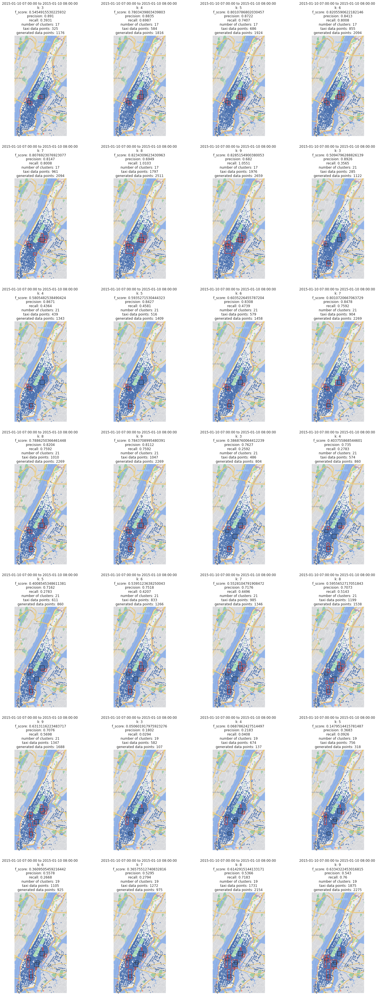

In [ ]:
from IPython.display import clear_output

def rectangle_set_list(n_samples, a, rctgs, datetime, interval):
    '''
        n_samples: int, number of points
        a: int list, the probability to be in the smaller rectangles
        rctgs: list of rectangles of class Rectangle, the first one is the biggest one
        datetime: datetime, 'yyyy-mm-dd hh:mm:ss'
        interval: int, the lasting time (e.g. 12 hours) from the starting time (i.e. date)
    '''
    list_points = []
    d = 2

    # insert 0 at the beginning and 1 at the end
    a = [0] + a
    for i in range(1, len(a)):
        a[i] = a[i-1] + a[i]

    for j in range(n_samples):
        b = np.random.uniform(0,1)        # Generate a random float from 0 to 1
        for i in range(len(a)-1):
            if a[i] < b <= a[i+1]:
                tmp_rctg = rctgs[i]
                x = np.random.uniform(low=tmp_rctg.x_min, high=tmp_rctg.x_min+tmp_rctg.width)
                y = np.random.uniform(low=tmp_rctg.y_min, high=tmp_rctg.y_min+tmp_rctg.height)
                hour_low = datetime.hour
                hour = np.random.randint(low=hour_low, high=hour_low+interval)
                year, month, day = datetime.year, datetime.month, datetime.day
                minute = np.random.randint(low=0, high=59)
                second = np.random.randint(low=0, high=59)
                day_month = day_of_month(year, month)
                if hour >= 24:
                    hour = hour % 24
                    if day<day_month:
                        day = day + 1
                    else:
                        day = (day + 1) % day_month
                # date_str = str(year)+'-'+str(month).zfill(2)+'-'+str(day).zfill(2)+' '+str(hour).zfill(2)+':'+str(minute).zfill(2)+':'+str(second).zfill(2)
                date_generated = dt.date(year, month, day)
                time_generated = dt.time(hour, minute, second)
                datetime_generated = dt.datetime.combine(date_generated, time_generated)
                list_points.append(ClusterPoint(d, [x,y],ID=j,datetime=datetime_generated,type_point='Rect'))
                break
    return list_points

def n_type_of_points_in_rectangle(rects, points, type_req):
    '''
        p: one point of format (diemension, coords, cluster_label)
        q: one point of format (diemension, coords, cluster_label)
        points: list of points of format (diemension, coords, cluster_label)
    '''
    cnt = 0
    for i in range(len(points)):
        x,y = points[i].coords
        for r in rects:
            xl = r.x_min
            xr = r.x_max
            yl = r.y_min
            yr = r.y_max
            if xl <= x <= xr and yl <= y <= yr and points[i].type_point==type_req:
                cnt += 1
                break
    return cnt

def generate_bg_list(df):
    n, d = len(df.index), 2
    list_points = []
    for j in range(n):
        x, y = df.iloc[j,-4], df.iloc[j,-3]
        datetime_generated = df.iloc[j,1]
        list_points.append(ClusterPoint(d, [x,y], ID=j, datetime=datetime_generated,type_point='taxi'))
    return list_points

def run_cluster_taxi_and_rect_prob(bg):
    """
    Reads the input set, clusters the points and writes to output

    :param path_in:     location of the input set
    :param path_out:    location to print the output
    """
    # Step 1: read file and create box graph
    # bg = taxi_set(epsilon, min_pts)
    print('number of points:',len(bg.points))
    
    # Step 2: Compute the core points
    find_core_points(bg)

    # Step 3: cluster the core points
    nr_clusters = compute_cluster_cores(bg)

    # Step 4: assign border points to clusters
    assign_border_points(bg)
    
    # points = bg.points
    # plot_clusters_taxi(points)

    # print("Cluster counter:", nr_clusters, file=sys.stderr)

def plot_sliding_window_taxi_and_rect_prob_one_by_one(df, begin_date, interval, w, column, rctgs_list, k_list, eps, mpt, prob=0.2, unit='minute'):
    '''
        df: dataframes
        begin_date: datetime
        interval: int, the window move to begin_time+interval next time
        w: int, the size of the sliding window
        unit: string, the unit of the sliding window
        column: string, the name of the required column

        only plot, not return
    '''
    start_time = begin_date

    after_start_date = df[column] >= start_time
    before_end_date = df[column] < start_time + dt.timedelta(minutes=w)
    between_two_dates = after_start_date & before_end_date
    filtered_df = df.loc[between_two_dates]

    # choose it with probability
    n_samples = len(filtered_df.index)
    index_list = []
    for j in range(n_samples):
        b = np.random.uniform(0,1)        # Generate a random float from 0 to 1
        if b <= prob:
            index_list.append(j)
    sampled_df = filtered_df.iloc[np.array(index_list)]

    # initializing the window
    init_df = TimeWindow(w, start_time, sampled_df)
    filtered_tw = init_df
    latest_window = filtered_tw.window

    date = dt.date(2015,3,15)
    time = dt.time(7,0,0)
    datetime = dt.datetime.combine(date,time)

    #  plot Numerical Data
    row = len(k_list)  # number of rows
    n_col = len(rctgs_list)  # number of columns
    order = 1  # initialize plot counter
    cnt = 0

    fig = plt.figure(figsize=(20,50))
    fig.tight_layout()
    plt.subplots_adjust(wspace=0,hspace=1.3)
    plt.rcParams["figure.figsize"] = [4.71, 9.07]
    plt.rcParams["figure.autolayout"] = True
    list_a = [[1/i]*i for i in range(2,6)]

    for i in range(len(rctgs_list)):
        rctgs = rctgs_list[i]
        rect_set_list = rectangle_set_list(3000, list_a[i], rctgs, datetime, interval)
        index_list = []
        for j in range(len(rect_set_list)):
            b = np.random.uniform(0,1)        # Generate a random float from 0 to 1
            if b <= prob:
                index_list.append(j)
        sampled_rect_set = list(map(rect_set_list.__getitem__, index_list))  # rect_set_list[np.array(index_list)]

        im = plt.imread('manhattan.png')
        dpi = 80
        height, width, depth = im.shape
        figsize = width / float(dpi), height / float(dpi)
        
        # fig.suptitle('DBSCAN using box graph with epsilon and minPts')
        
        # generate the boxgraph for the window and run DBSCAN
        # for _ in range(24):

        temp_point_list = generate_bg_list(latest_window) + sampled_rect_set
        temp_bg = BoxGraph(len(temp_point_list), 2, eps, int(mpt*prob), temp_point_list)
        run_cluster_taxi_and_rect_prob(temp_bg)
        points = temp_bg.points

        X_prob = [np.array(points[i].coords) for i in range(len(points))]
        X_prob = np.array(X_prob)
        label_prob = [points[i].cluster_label for i in range(len(points))]
        label_prob = np.array(label_prob)
        colors = ['#'+("%06x" % random.randint(0, 0xFFFFFF)).upper() for _ in range(len(label_prob))]

        # label = [points[i].cluster_label for i in range(len(points))]
        # label = np.array(label)

        df_not_prob = generate_bg_list(filtered_df) + rect_set_list
        X = [np.array(df_not_prob[i].coords) for i in range(len(df_not_prob))]
        X = np.array(X)
        label = [df_not_prob[i].cluster_label for i in range(len(df_not_prob))]
        label = np.array(label)
        
        # cmap = plt.get_cmap('gnuplot')
        # colors = [cmap(i) for i in np.linspace(0, 1, len(label))]

        # for idx, col in enumerate(colors):
        #     # print(idx, col)
        #     cluster_data = label == idx
        #     dots = ax.scatter(X[cluster_data, 0], X[cluster_data, 1],
        #                 c=col, marker='.', s=10)

        # currentAxis = plt.gca()
        # big_rect = rctgs[-1]
        cluster_rect = []
        for idx in range(1,len(np.unique(label_prob))+1):
            cluster_data = label_prob == idx
            # print(len(cluster_data),np.unique(cluster_data))
            if np.any(cluster_data):
                left, right = np.min(X_prob[cluster_data,0]), np.max(X_prob[cluster_data,0])
                bottom, top = np.min(X_prob[cluster_data,1]), np.max(X_prob[cluster_data,1])
                width, height = abs(right-left), abs(top-bottom)
                # currentAxis.add_patch(patches.Rectangle((left, bottom), width, height, linewidth=1, edgecolor='b', fill=None))
                temp_rect = Rectangle(0.5*(left+right), 0.5*(top+bottom), width, height)
                cluster_rect.append(temp_rect)

        for k in k_list:
            k_rects, average_density = dense_rectangle(points, cluster_rect, k)
            # print(len(k_rects), average_density)
            n_rect_points = n_type_of_points_in_rectangle(k_rects, df_not_prob, 'Rect')
            n_taxi_points = n_type_of_points_in_rectangle(k_rects, df_not_prob, 'taxi')
            f_score, precision, recall = f_score_points_in_rect(rctgs, k_rects, df_not_prob)
            f_socre = round(f_score, 4)

            ax = fig.add_subplot(row, n_col, order+cnt)
            # ax = fig.add_axes([0, 0, 1, 1])
            cnt += 1
            ax.imshow(im, cmap='gray')
            implot = plt.imshow(im)
            ax.axis('off')

            dots = ax.scatter(X[:, 0], X[:, 1],
                marker='.', s=10)

            for r in k_rects:
                ax.add_patch(patches.Rectangle((r.x-r.width/2, r.y-r.height/2), r.width, r.height, linewidth=2, edgecolor='r', fill=None))
            for r in rctgs:
                ax.add_patch(patches.Rectangle((r.x-r.width/2, r.y-r.height/2), r.width, r.height, linewidth=1, edgecolor='k', fill=None))

            title_1 = str(start_time)+' to '+str(start_time+ dt.timedelta(minutes=w)) + ' \n'
            title_2 = 'k: ' + str(k) + '\n'
            title_3 = 'f_score: ' + str(f_score) + '\n'
            title_3_2 = 'precision: ' + str(round(precision,4)) + '\n'
            title_3_3 = 'recall: ' + str(round(recall,4)) + '\n'
            title_4 = 'number of clusters: '+str(len(cluster_rect)) + '\n'
            title_5 = 'taxi data points: ' + str(n_taxi_points) + '\n'
            title_6 = 'generated data points: ' + str(n_rect_points)
            title_str = title_1 + title_2 + title_3 + title_3_2 + title_3_3 + title_4 + title_5 + title_6
            plt.title(title_str)
            # start_time += dt.timedelta(minutes=interval)
            
            # Hide spines, ticks, etc.
            ax.axis('off')

        # plt.scatter(core_points[:,0], core_points[:,1], c='b', s=50)
        # plt.title("DBScan clustering")
        # plt.xticks([])
        # plt.yticks([])

        # filtered_tw = filtered_tw.sliding_with_prob(interval, df, column, prob)
        # latest_window = filtered_tw.window
        # filtered_df_tw = TimeWindow(w, start_time, filtered_df)
        # filtered_df_tw = filtered_df_tw.sliding(interval, df, column)
        # filtered_df = filtered_df_tw.window

        # filtered_tw = filtered_tw.sliding(interval, df, column)
        # latest_window = filtered_tw.window
        # n_samples = len(latest_window.index)
        # index_list = []
        # for j in range(n_samples):
        #     b = np.random.uniform(0,1)        # Generate a random float from 0 to 1
        #     if b <= prob:
        #         index_list.append(j)
        # latest_window = latest_window.iloc[np.array(index_list)]

    plt.show()

if __name__ == '__main__':
    rect_1 = Rectangle(130, 600, 30, 30)
    rect_2 = Rectangle(250, 550, 40, 40)
    rctgs_2 = [rect_1, rect_2]

    rect_3 = Rectangle(150, 755, 30, 30)
    rctgs_3 = [rect_1, rect_2, rect_3]

    rect_4 = Rectangle(200, 650, 40, 40)
    rctgs_4 = [rect_1, rect_2, rect_3, rect_4]

    rect_5 = Rectangle(210, 630, 30, 30)
    rctgs_5 = [rect_1, rect_2, rect_3, rect_4, rect_5]

    rctgs_list = [rctgs_2, rctgs_3, rctgs_4, rctgs_5]
    k_list = list(range(3,10))

    plot_sliding_window_taxi_and_rect_prob_one_by_one(data_oneday, s_datetime, 30, 60, 'tpep_pickup_datetime', rctgs_list, k_list, 45, 590, 1/32)

number of points: 2525
number of points: 2517
number of points: 2534
number of points: 2493


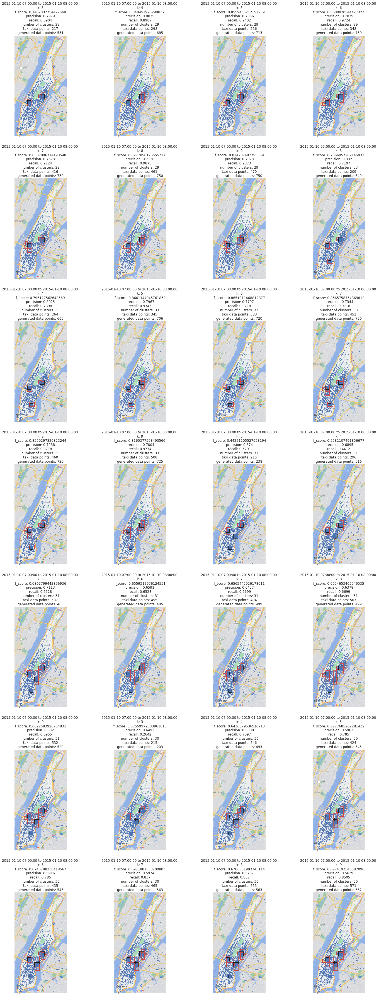

In [ ]:
from IPython.display import clear_output

def rectangle_set_list(n_samples, a, rctgs, datetime, interval):
    '''
        n_samples: int, number of points
        a: int list, the probability to be in the smaller rectangles
        rctgs: list of rectangles of class Rectangle, the first one is the biggest one
        datetime: datetime, 'yyyy-mm-dd hh:mm:ss'
        interval: int, the lasting time (e.g. 12 hours) from the starting time (i.e. date)
    '''
    list_points = []
    d = 2

    # insert 0 at the beginning and 1 at the end
    a = [0] + a
    for i in range(1, len(a)):
        a[i] = a[i-1] + a[i]

    for j in range(n_samples):
        b = np.random.uniform(0,1)        # Generate a random float from 0 to 1
        for i in range(len(a)-1):
            if a[i] < b <= a[i+1]:
                tmp_rctg = rctgs[i]
                x = np.random.uniform(low=tmp_rctg.x_min, high=tmp_rctg.x_min+tmp_rctg.width)
                y = np.random.uniform(low=tmp_rctg.y_min, high=tmp_rctg.y_min+tmp_rctg.height)
                hour_low = datetime.hour
                hour = np.random.randint(low=hour_low, high=hour_low+interval)
                year, month, day = datetime.year, datetime.month, datetime.day
                minute = np.random.randint(low=0, high=59)
                second = np.random.randint(low=0, high=59)
                day_month = day_of_month(year, month)
                if hour >= 24:
                    hour = hour % 24
                    if day<day_month:
                        day = day + 1
                    else:
                        day = (day + 1) % day_month
                # date_str = str(year)+'-'+str(month).zfill(2)+'-'+str(day).zfill(2)+' '+str(hour).zfill(2)+':'+str(minute).zfill(2)+':'+str(second).zfill(2)
                date_generated = dt.date(year, month, day)
                time_generated = dt.time(hour, minute, second)
                datetime_generated = dt.datetime.combine(date_generated, time_generated)
                list_points.append(ClusterPoint(d, [x,y],ID=j,datetime=datetime_generated,type_point='Rect'))
                break
    return list_points

def n_type_of_points_in_rectangle(rects, points, type_req):
    '''
        p: one point of format (diemension, coords, cluster_label)
        q: one point of format (diemension, coords, cluster_label)
        points: list of points of format (diemension, coords, cluster_label)
    '''
    cnt = 0
    for i in range(len(points)):
        x,y = points[i].coords
        for r in rects:
            xl = r.x_min
            xr = r.x_max
            yl = r.y_min
            yr = r.y_max
            if xl <= x <= xr and yl <= y <= yr and points[i].type_point==type_req:
                cnt += 1
                break
    return cnt

def generate_bg_list(df):
    n, d = len(df.index), 2
    list_points = []
    for j in range(n):
        x, y = df.iloc[j,-4], df.iloc[j,-3]
        datetime_generated = df.iloc[j,1]
        list_points.append(ClusterPoint(d, [x,y], ID=j, datetime=datetime_generated,type_point='taxi'))
    return list_points

def run_cluster_taxi_and_rect_prob(bg):
    """
    Reads the input set, clusters the points and writes to output

    :param path_in:     location of the input set
    :param path_out:    location to print the output
    """
    # Step 1: read file and create box graph
    # bg = taxi_set(epsilon, min_pts)
    print('number of points:',len(bg.points))
    
    # Step 2: Compute the core points
    find_core_points(bg)

    # Step 3: cluster the core points
    nr_clusters = compute_cluster_cores(bg)

    # Step 4: assign border points to clusters
    assign_border_points(bg)
    
    # points = bg.points
    # plot_clusters_taxi(points)

    # print("Cluster counter:", nr_clusters, file=sys.stderr)

def plot_sliding_window_taxi_and_rect_prob_one_by_one(df, begin_date, interval, w, column, rctgs_list, k_list, eps, mpt, prob=0.2, unit='minute'):
    '''
        df: dataframes
        begin_date: datetime
        interval: int, the window move to begin_time+interval next time
        w: int, the size of the sliding window
        unit: string, the unit of the sliding window
        column: string, the name of the required column

        only plot, not return
    '''
    start_time = begin_date

    after_start_date = df[column] >= start_time
    before_end_date = df[column] < start_time + dt.timedelta(minutes=w)
    between_two_dates = after_start_date & before_end_date
    filtered_df = df.loc[between_two_dates]

    # choose it with probability
    n_samples = len(filtered_df.index)
    index_list = []
    for j in range(n_samples):
        b = np.random.uniform(0,1)        # Generate a random float from 0 to 1
        if b <= prob:
            index_list.append(j)
    sampled_df = filtered_df.iloc[np.array(index_list)]

    # initializing the window
    init_df = TimeWindow(w, start_time, sampled_df)
    filtered_tw = init_df
    latest_window = filtered_tw.window

    date = dt.date(2015,3,15)
    time = dt.time(7,0,0)
    datetime = dt.datetime.combine(date,time)

    #  plot Numerical Data
    row = len(k_list)  # number of rows
    n_col = len(rctgs_list)  # number of columns
    order = 1  # initialize plot counter
    cnt = 0

    fig = plt.figure(figsize=(20,50))
    list_a = [[1/i]*i for i in range(2,6)]

    for i in range(len(rctgs_list)):
        rctgs = rctgs_list[i]
        rect_set_list = rectangle_set_list(3000, list_a[i], rctgs, datetime, interval)
        index_list = []
        for j in range(len(rect_set_list)):
            b = np.random.uniform(0,1)        # Generate a random float from 0 to 1
            if b <= prob:
                index_list.append(j)
        sampled_rect_set = list(map(rect_set_list.__getitem__, index_list))  # rect_set_list[np.array(index_list)]

        im = plt.imread('manhattan.png')
        dpi = 80
        height, width, depth = im.shape
        figsize = width / float(dpi), height / float(dpi)
        
        # fig.suptitle('DBSCAN using box graph with epsilon and minPts')
        
        # generate the boxgraph for the window and run DBSCAN
        # for _ in range(24):

        temp_point_list = generate_bg_list(latest_window) + sampled_rect_set
        temp_bg = BoxGraph(len(temp_point_list), 2, eps, int(mpt*prob), temp_point_list)
        run_cluster_taxi_and_rect_prob(temp_bg)
        points = temp_bg.points

        X_prob = [np.array(points[i].coords) for i in range(len(points))]
        X_prob = np.array(X_prob)
        label_prob = [points[i].cluster_label for i in range(len(points))]
        label_prob = np.array(label_prob)
        colors = ['#'+("%06x" % random.randint(0, 0xFFFFFF)).upper() for _ in range(len(label_prob))]

        # label = [points[i].cluster_label for i in range(len(points))]
        # label = np.array(label)

        # df_not_prob = generate_bg_list(filtered_df) + rect_set_list
        # X = [np.array(df_not_prob[i].coords) for i in range(len(df_not_prob))]
        # X = np.array(X)
        # label = [df_not_prob[i].cluster_label for i in range(len(df_not_prob))]
        # label = np.array(label)
        
        # cmap = plt.get_cmap('gnuplot')
        # colors = [cmap(i) for i in np.linspace(0, 1, len(label))]

        # for idx, col in enumerate(colors):
        #     # print(idx, col)
        #     cluster_data = label == idx
        #     dots = ax.scatter(X[cluster_data, 0], X[cluster_data, 1],
        #                 c=col, marker='.', s=10)

        # currentAxis = plt.gca()
        # big_rect = rctgs[-1]
        cluster_rect = []
        for idx in range(1,len(np.unique(label_prob))+1):
            cluster_data = label_prob == idx
            # print(len(cluster_data),np.unique(cluster_data))
            if np.any(cluster_data):
                left, right = np.min(X_prob[cluster_data,0]), np.max(X_prob[cluster_data,0])
                bottom, top = np.min(X_prob[cluster_data,1]), np.max(X_prob[cluster_data,1])
                width, height = abs(right-left), abs(top-bottom)
                # currentAxis.add_patch(patches.Rectangle((left, bottom), width, height, linewidth=1, edgecolor='b', fill=None))
                temp_rect = Rectangle(0.5*(left+right), 0.5*(top+bottom), width, height)
                cluster_rect.append(temp_rect)

        for k in k_list:
            k_rects, average_density = dense_rectangle(points, cluster_rect, k)
            # print(len(k_rects), average_density)
            n_rect_points = n_type_of_points_in_rectangle(k_rects, points, 'Rect')
            n_taxi_points = n_type_of_points_in_rectangle(k_rects, points, 'taxi')
            f_score, precision, recall = f_score_points_in_rect(rctgs, k_rects, points)
            f_socre, precision, recall = round(f_score, 4), round(precision,4), round(recall,4)

            ax = fig.add_subplot(row, n_col, order+cnt)
            # ax = fig.add_axes([0, 0, 1, 1])
            cnt += 1
            ax.imshow(im, cmap='gray')
            implot = plt.imshow(im)
            ax.axis('off')

            dots = ax.scatter(X_prob[:, 0], X_prob[:, 1],
                marker='.', s=10)

            for r in k_rects:
                ax.add_patch(patches.Rectangle((r.x-r.width/2, r.y-r.height/2), r.width, r.height, linewidth=2, edgecolor='r', fill=None))
            for r in rctgs:
                ax.add_patch(patches.Rectangle((r.x-r.width/2, r.y-r.height/2), r.width, r.height, linewidth=1, edgecolor='k', fill=None))

            title_1 = str(start_time)+' to '+str(start_time+ dt.timedelta(minutes=w)) + ' \n'
            title_2 = 'k: ' + str(k) + '\n'
            title_3 = 'f_score: ' + str(f_score) + '\n'
            title_3_2 = 'precision: ' + str(precision) + '\n'
            title_3_3 = 'recall: ' + str(recall) + '\n'
            title_4 = 'number of clusters: '+str(len(cluster_rect)) + '\n'
            title_5 = 'taxi data points: ' + str(n_taxi_points) + '\n'
            title_6 = 'generated data points: ' + str(n_rect_points)
            title_str = title_1 + title_2 + title_3 + title_3_2 + title_3_3 + title_4 + title_5 + title_6
            plt.title(title_str)
            # start_time += dt.timedelta(minutes=interval)
            
            # Hide spines, ticks, etc.
            ax.axis('off')

        # plt.scatter(core_points[:,0], core_points[:,1], c='b', s=50)
        # plt.title("DBScan clustering")
        # plt.xticks([])
        # plt.yticks([])

        # filtered_tw = filtered_tw.sliding_with_prob(interval, df, column, prob)
        # latest_window = filtered_tw.window
        # filtered_df_tw = TimeWindow(w, start_time, filtered_df)
        # filtered_df_tw = filtered_df_tw.sliding(interval, df, column)
        # filtered_df = filtered_df_tw.window

        # filtered_tw = filtered_tw.sliding(interval, df, column)
        # latest_window = filtered_tw.window
        # n_samples = len(latest_window.index)
        # index_list = []
        # for j in range(n_samples):
        #     b = np.random.uniform(0,1)        # Generate a random float from 0 to 1
        #     if b <= prob:
        #         index_list.append(j)
        # latest_window = latest_window.iloc[np.array(index_list)]

    plt.show()

if __name__ == '__main__':
    rect_1 = Rectangle(130, 600, 30, 30)
    rect_2 = Rectangle(250, 550, 40, 40)
    rctgs_2 = [rect_1, rect_2]

    rect_3 = Rectangle(150, 755, 30, 30)
    rctgs_3 = [rect_1, rect_2, rect_3]

    rect_4 = Rectangle(200, 650, 40, 40)
    rctgs_4 = [rect_1, rect_2, rect_3, rect_4]

    rect_5 = Rectangle(210, 630, 30, 30)
    rctgs_5 = [rect_1, rect_2, rect_3, rect_4, rect_5]

    rctgs_list = [rctgs_2, rctgs_3, rctgs_4, rctgs_5]
    k_list = list(range(3,10))

    plot_sliding_window_taxi_and_rect_prob_one_by_one(data_oneday, s_datetime, 30, 60, 'tpep_pickup_datetime', rctgs_list, k_list, 45, 590, 1/4)

In [ ]:
def rectangle_set_list(n_samples, a, rctgs, datetime, interval):
    '''
        n_samples: int, number of points
        a: int list, the probability to be in the smaller rectangles
        rctgs: list of rectangles of class Rectangle, the first one is the biggest one
        datetime: datetime, 'yyyy-mm-dd hh:mm:ss'
        interval: int, the lasting time (e.g. 12 hours) from the starting time (i.e. date)
    '''
    list_points = []
    d = 2

    # insert 0 at the beginning and 1 at the end
    a = [0] + a
    for i in range(1, len(a)):
        a[i] = a[i-1] + a[i]

    for j in range(n_samples):
        b = np.random.uniform(0,1)        # Generate a random float from 0 to 1
        for i in range(len(a)-1):
            if a[i] < b <= a[i+1]:
                tmp_rctg = rctgs[i]
                x = np.random.uniform(low=tmp_rctg.x_min, high=tmp_rctg.x_min+tmp_rctg.width)
                y = np.random.uniform(low=tmp_rctg.y_min, high=tmp_rctg.y_min+tmp_rctg.height)
                hour_low = datetime.hour
                hour = np.random.randint(low=hour_low, high=hour_low+interval)
                year, month, day = datetime.year, datetime.month, datetime.day
                minute = np.random.randint(low=0, high=59)
                second = np.random.randint(low=0, high=59)
                day_month = day_of_month(year, month)
                if hour >= 24:
                    hour = hour % 24
                    if day<day_month:
                        day = day + 1
                    else:
                        day = (day + 1) % day_month
                # date_str = str(year)+'-'+str(month).zfill(2)+'-'+str(day).zfill(2)+' '+str(hour).zfill(2)+':'+str(minute).zfill(2)+':'+str(second).zfill(2)
                date_generated = dt.date(year, month, day)
                time_generated = dt.time(hour, minute, second)
                datetime_generated = dt.datetime.combine(date_generated, time_generated)
                list_points.append(ClusterPoint(d, [x,y],ID=j,datetime=datetime_generated,type_point='Rect'))
                break
    return list_points

def n_type_of_points_in_rectangle(rects, points, type_req):
    '''
        p: one point of format (diemension, coords, cluster_label)
        q: one point of format (diemension, coords, cluster_label)
        points: list of points of format (diemension, coords, cluster_label)
    '''
    cnt = 0
    for i in range(len(points)):
        x,y = points[i].coords
        for r in rects:
            xl = r.x_min
            xr = r.x_max
            yl = r.y_min
            yr = r.y_max
            if xl <= x <= xr and yl <= y <= yr and points[i].type_point==type_req:
                cnt += 1
                break
    return cnt

# def generate_rectangle_set(n_points, d, eps, mpt, data_list):
#     """
#     Reads the input set, clusters the points and writes to output

#     :param path_in:     location of the input set
#     :param path_out:    location to print the output
#     """
#     # Step 1: read file and create box graph
#     bg = BoxGraph(n_points, d, eps, mpt, data_list)
    
#     # Step 2: Compute the core points
#     find_core_points(bg)

#     # Step 3: cluster the core points
#     nr_clusters = compute_cluster_cores(bg)

#     # Step 4: assign border points to clusters
#     assign_border_points(bg)

#     return bg

def generate_rectangle_set(n_points, a, rctgs, datetime, interval, d, eps, mpt, taxis):
    """
    Reads the input set, clusters the points and writes to output

    :param path_in:     location of the input set
    :param path_out:    location to print the output
    """
    # Step 1: read file and create box graph
    rects = rectangle_set_list(n_points, a, rctgs, datetime, interval)
    data_list = taxis + rects
    bg = BoxGraph(n_points, d, eps, mpt, data_list)

    # Step 2: Compute the core points
    find_core_points(bg)

    # Step 3: cluster the core points
    nr_clusters = compute_cluster_cores(bg)

    # Step 4: assign border points to clusters
    assign_border_points(bg)

    return bg

def generate_taxi(df):
    n, d = df.shape[0], 2
    points = []
    for j in range(n):
        x, y = df.iloc[j,-4], df.iloc[j,-3]
        datetime_generated = df.iloc[j,1]
        points.append(ClusterPoint(d, [x,y], ID=j, datetime=datetime_generated,type_point='taxi'))
    return points


def plot_clusters_taxi_many(data_onehour, n, a, rctgs, datetime, interval, epsilon_list, gamma_mpt):
    # Plot init seeds along side sample data=
    # color ="%06x" % random.randint(0, 0xFFFFFF)
    # color = '#'+color.upper()
    
    # fig = plt.figure(figsize=(30, 50))
    # fig.tight_layout()
    # plt.subplots_adjust(wspace=0,hspace=1)
    # fig.suptitle('DBSCAN using box graph with epsilon and minPts')

    #  plot Numerical Data
    row = len(epsilon_list) * 2  # number of rows
    column = 6  # number of columns
    order = 1  # initialize plot counter
    cnt = 0

    # plt.rcParams["figure.figsize"] = [4.71, 9.07]
    # plt.rcParams["figure.autolayout"] = True
    # im = plt.imread('manhattan.png')
    # dpi = 80
    # height, width, depth = im.shape
    # figsize = width / float(dpi), height / float(dpi)
    # ax = fig.add_axes([0, 0, 1, 1])

    # n_samples = 500
    # a = [0.5, 0.5]
    
    # rect_1 = Rectangle(130, 600, 30, 30)
    # rect_2 = Rectangle(250, 550, 40, 40)
    # rctgs = [rect_1, rect_2]

    # date = dt.date(2015,3,15)
    # time = dt.time(7,0,0)
    # datetime = dt.datetime.combine(date,time)

    # interval = 5

    # rect_set_list = rectangle_set_list(3000, [0.5,0.5], rctgs, datetime, interval)
    taxi_list = generate_taxi(data_onehour)
    max_avg_dens = 0
    eps_max_dens, mpt_max_dens = 0,0
    max_fscore = 0
    eps_max_fscore, mpt_max_fscore = 0,0

    for eps in epsilon_list:
        # bg = taxi_set_and_random_rectangle(n_samples, a, rctgs, datetime, interval, eps)
        # points = generate_bg_list(data_oneday) + rect_set_list
        n_points = len(taxi_list) + n
        max_pow_mpt = math.log(n_points, 1+gamma_mpt)
        min_pts_pow_list = np.array(range(0,int(max_pow_mpt)+1,5))
        min_pts_list = (1+gamma_mpt)**min_pts_pow_list
        for mpt in min_pts_list:      
            import time as tm
            start = tm.time()
            # bg = BoxGraph(n_points, 2, eps, mpt, points) 
            bg = generate_rectangle_set(n, a, rctgs, datetime, interval, 2, eps, mpt, taxi_list)
            points = bg.points

            label = [p.cluster_label for p in points]
            label = np.array(label)

            colors = ['#'+("%06x" % random.randint(0, 0xFFFFFF)).upper() for _ in range(len(np.unique(label)))]
            
            # print(len(np.unique(label)), 'labels:', np.unique(label))
            # print('the first 5 labels:', np.unique(label))
            X = [np.array(points[i].coords) for i in range(len(points))]
            X = np.array(X)
            # print('number of coords:', len(X))
            # print('the first 5 coords:', X[:5])

            # ax_im = fig.add_subplot(row, column, order+cnt)
            # cnt += 1
            # # Hide spines, ticks, etc.
            # ax_im.axis('off')
            # ax_im.imshow(im, cmap='gray')
            # implot = plt.imshow(im)

            # for idx, col in enumerate(colors,1):
            #     # print(idx, col)
            #     cluster_data = label == idx
            #     ax_im.scatter(X[cluster_data, 0], X[cluster_data, 1],
            #                 c=col, marker='.', s=10)
            
            # currentAxis = plt.gca()
            # big_rect = rctgs[-1]
            cluster_rect = []
            unique_label = np.unique(label)
            # unique_label = unique_label[unique_label != -1]
            # for idx, lbl in enumerate(np.unique(label),1):
            for idx in range(1,len(unique_label)+1):
                cluster_data = label == idx
                if np.any(cluster_data):
                    left, right = np.min(X[cluster_data,0]), np.max(X[cluster_data,0])
                    bottom, top = np.min(X[cluster_data,1]), np.max(X[cluster_data,1])
                    width, height = abs(right-left), abs(top-bottom)
                    # currentAxis.add_patch(patches.Rectangle((left, bottom), width, height, linewidth=1, edgecolor='b', fill=None))
                    temp_rect = Rectangle(0.5*(left+right), 0.5*(top+bottom), width, height)
                    # print(left, right, top,bottom)
                    # print('x:',temp_rect.x,'y:',temp_rect.y, temp_rect.x_min )
                    cluster_rect.append(temp_rect)
            
            # print('number of clusters:', len(cluster_rect))
            average_density = 0
            f_score = 0
            n_taxi_points = n_rect_points = 0
            if len(cluster_rect)>0:
                # print('number of clusters:',len(cluster_rect))
                k_rects, k_density = dense_rectangle(points, cluster_rect, 3, 1)
                n_rect_points = n_type_of_points_in_rectangle(k_rects, points, 'Rect')
                n_taxi_points = n_type_of_points_in_rectangle(k_rects, points, 'taxi')
                f_score, _, _ = f_score_points_in_rect(rctgs, k_rects, points)
                f_socre = round(f_score, 4)
                if len(k_density)>0: average_density = np.mean(k_density)
                else: average_density = 0
                if average_density > max_avg_dens: 
                    max_avg_dens = average_density
                    eps_max_dens, mpt_max_dens = eps, mpt
                if f_score > max_fscore: 
                    max_fscore = f_score
                    eps_max_fscore, mpt_max_fscore = eps, mpt
            #     for r in k_rects:
            #         currentAxis.add_patch(patches.Rectangle((r.x-r.width/2, r.y-r.height/2), r.width, r.height, linewidth=3, edgecolor='r', fill=None))
            # for r in rctgs:
            #     currentAxis.add_patch(patches.Rectangle((r.x-r.width/2, r.y-r.height/2), r.width, r.height, linewidth=1, edgecolor='b', fill=None))

            # print('the maximum average density:',max_avg_dens)
            end = tm.time()
            cost_time = end - start
            # title_1 = 'epsilon: ' + str(round(eps,2)) + '\n' + 'minPts: ' + str(round(mpt,2)) + '\n'
            # title_2 = 'It takes ' + str(round(cost_time, 4)) + ' seconds.' + '\n'
            # title_3_1 = 'average density: ' + str(round(average_density, 4))+'\n'
            # title_3 = 'f_score: ' + str(f_score) + '\n'
            # title_4 = 'number of clusters: '+str(len(cluster_rect)) + '\n'
            # title_5 = 'taxi data points: ' + str(n_taxi_points) + '\n'
            # title_6 = 'generated rect points: ' + str(n_rect_points)
            # title = title_1 + title_2 + title_3_1 + title_3 + title_4 + title_5 + title_6
            # ax_im.set_title(title)           
            # # ax_im.set_xlabel(xlabel)
            # ax_im.set_xticks([])
            # ax_im.set_yticks([])
            bg = None

    # plt.show()
    # print('maximum average density:', max_avg_dens, ', eps:', eps_max_dens, ', mpt:', mpt_max_dens)
    # print('maximum fscore:', max_fscore, ', eps:', eps_max_fscore, ', mpt:', mpt_max_fscore)
    return eps_max_fscore, mpt_max_fscore
    
if __name__ == "__main__":

    min_area = 4
    lambda_eps, gamma_mpt = 0.1, 0.2
    min_area_r = math.sqrt(min_area/math.pi) 
    min_pow_eps = lambda_eps * math.log(min_area_r,1+lambda_eps)     # math.log(x, base)

    w_image, h_image = 471, 907
    z = max(w_image, h_image)
    max_pow_eps = math.log(z, 1+lambda_eps)
    pow_eps = np.array(range(int(min_pow_eps), int(max_pow_eps)+1, 10))
    # epsilons = list(range(int((1+lambda_eps)**min_pow_eps), int((1+lambda_eps)**max_pow_eps)+1))
    epsilon_list = (1+lambda_eps)**pow_eps

    n = 2000
    a = [0.5, 0.5]
    
    rect_1 = Rectangle(130, 600, 30, 30)
    rect_2 = Rectangle(250, 550, 40, 40)
    rctgs = [rect_1, rect_2]

    date = dt.date(2015,3,15)
    time = dt.time(9,0,0)
    datetime = dt.datetime.combine(date,time)

    lasting_hours = 5

    import time 
    start = time.time()
    eps_opt, mpt_opt = plot_clusters_taxi_many(data_onehour, n, a, rctgs, datetime, lasting_hours, epsilon_list, gamma_mpt)
    end = time.time()
    print("Time taken:      {:.3f}s".format(end - start), file=sys.stderr)

In [ ]:
# data_12=pd.read_csv("yellow_tripdata_2015-12.csv")
# data_12['tpep_pickup_datetime']=pd.to_datetime(data_12['tpep_pickup_datetime'])
# data_12['tpep_dropoff_datetime']=pd.to_datetime(data_12['tpep_dropoff_datetime'])

# del data_12['store_and_fwd_flag']
# # del data_12['RateCodeID']
# # del data_12['payment_type']
# # del data_12['fare_amount'] 
# # del data_12['extra']
# # del data_12['mta_tax']
# # del data_12['tip_amount']
# # del data_12['tolls_amount']
# # del data_12['improvement_surcharge']
# # del data_12['total_amount']

# data_12['tpep_pickup_datetime']=pd.to_datetime(data_12['tpep_pickup_datetime'])
# data_12['tpep_dropoff_datetime']=pd.to_datetime(data_12['tpep_dropoff_datetime'])

# s_date = dt.date(2015,12,25)
# s_time = dt.time(0,0,0)
# s_datetime = dt.datetime.combine(s_date,s_time)
# data_chrismas = select_day(s_datetime, 24, data, 'tpep_pickup_datetime')
# data_chrismas['pickup_coords']=data_chrismas.apply(lambda x: latlngToScreenXY(x['pickup_latitude'], x['pickup_longitude']), axis=1)
# data_chrismas['dropoff_coords']=data_chrismas.apply(lambda x: latlngToScreenXY(x['dropoff_latitude'], x['dropoff_longitude']), axis=1)
# data_chrismas['pickup_x'] = data_chrismas['pickup_coords'].apply(lambda x: x['x'])
# data_chrismas['pickup_y'] = data_chrismas['pickup_coords'].apply(lambda x: x['y'])
# data_chrismas['dropoff_x'] = data_chrismas['dropoff_coords'].apply(lambda x: x['x'])
# data_chrismas['dropoff_y'] = data_chrismas['dropoff_coords'].apply(lambda x: x['y'])
# # data that fit in the image
# data_chrismas = data_chrismas[(data_chrismas['pickup_x'] >= 0) & (data_chrismas['pickup_x'] <= 471) & (data_chrismas['pickup_y'] <= 907) & (data_chrismas['pickup_y'] >= 0)]
data_chrismas.head()

,VendorID,tpep_pickup_datetime,tpep_dropoff_datetime,passenger_count,trip_distance,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude


the eps and mpt of boxgraph: 45 147
number of points: 2025
the eps and mpt of boxgraph: 45 147
number of points: 2356
the eps and mpt of boxgraph: 45 147
number of points: 2864
the eps and mpt of boxgraph: 45 147
number of points: 3397
the eps and mpt of boxgraph: 45 147
number of points: 3854
the eps and mpt of boxgraph: 45 147
number of points: 4423
the eps and mpt of boxgraph: 45 147
number of points: 5025
the eps and mpt of boxgraph: 45 147
number of points: 5573
the eps and mpt of boxgraph: 45 147
number of points: 5954
the eps and mpt of boxgraph: 45 147
number of points: 6322
the eps and mpt of boxgraph: 45 147
number of points: 6545
the eps and mpt of boxgraph: 45 147
number of points: 6723
the eps and mpt of boxgraph: 45 147
number of points: 6484
the eps and mpt of boxgraph: 45 147
number of points: 5969
the eps and mpt of boxgraph: 45 147
number of points: 5865
the eps and mpt of boxgraph: 45 147
number of points: 5828
the eps and mpt of boxgraph: 45 147
number of points: 58

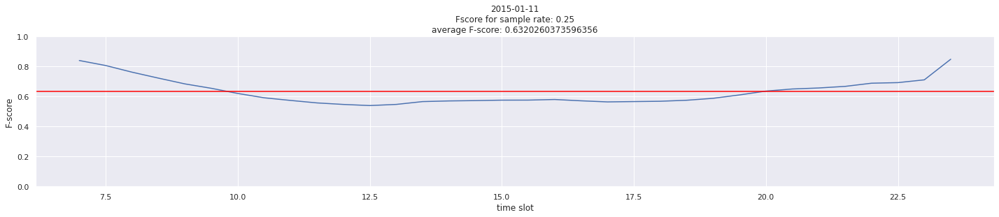

In [ ]:
from IPython.display import clear_output

def rectangle_set_list(n_samples, a, rctgs, datetime, interval):
    '''
        n_samples: int, number of points
        a: int list, the probability to be in the smaller rectangles
        rctgs: list of rectangles of class Rectangle, the first one is the biggest one
        datetime: datetime, 'yyyy-mm-dd hh:mm:ss'
        interval: int, the lasting time (e.g. 12 hours) from the starting time (i.e. date)
    '''
    list_points = []
    d = 2

    # insert 0 at the beginning and 1 at the end
    a = [0] + a
    for i in range(1, len(a)):
        a[i] = a[i-1] + a[i]

    for j in range(n_samples):
        b = np.random.uniform(0,1)        # Generate a random float from 0 to 1
        for i in range(len(a)-1):
            if a[i] < b <= a[i+1]:
                tmp_rctg = rctgs[i]
                x = np.random.uniform(low=tmp_rctg.x_min, high=tmp_rctg.x_min+tmp_rctg.width)
                y = np.random.uniform(low=tmp_rctg.y_min, high=tmp_rctg.y_min+tmp_rctg.height)
                hour_low = datetime.hour
                hour = np.random.randint(low=hour_low, high=hour_low+interval)
                year, month, day = datetime.year, datetime.month, datetime.day
                minute = np.random.randint(low=0, high=59)
                second = np.random.randint(low=0, high=59)
                day_month = day_of_month(year, month)
                if hour >= 24:
                    hour = hour % 24
                    if day<day_month:
                        day = day + 1
                    else:
                        day = (day + 1) % day_month
                # date_str = str(year)+'-'+str(month).zfill(2)+'-'+str(day).zfill(2)+' '+str(hour).zfill(2)+':'+str(minute).zfill(2)+':'+str(second).zfill(2)
                date_generated = dt.date(year, month, day)
                time_generated = dt.time(hour, minute, second)
                datetime_generated = dt.datetime.combine(date_generated, time_generated)
                list_points.append(ClusterPoint(d, [x,y],ID=j,datetime=datetime_generated,type_point='Rect'))
                break
    return list_points

def n_type_of_points_in_rectangle(rects, points, type_req):
    '''
        p: one point of format (diemension, coords, cluster_label)
        q: one point of format (diemension, coords, cluster_label)
        points: list of points of format (diemension, coords, cluster_label)
    '''
    cnt = 0
    for i in range(len(points)):
        x,y = points[i].coords
        for r in rects:
            xl = r.x_min
            xr = r.x_max
            yl = r.y_min
            yr = r.y_max
            if xl <= x <= xr and yl <= y <= yr and points[i].type_point==type_req:
                cnt += 1
                break
    return cnt

def generate_bg_list(df):
    n, d = len(df.index), 2
    list_points = []
    for j in range(n):
        x, y = df.iloc[j,-4], df.iloc[j,-3]
        datetime_generated = df.iloc[j,1]
        list_points.append(ClusterPoint(d, [x,y], ID=j, datetime=datetime_generated,type_point='taxi'))
    return list_points

def run_cluster_taxi_and_rect_prob(bg):
    """
    Reads the input set, clusters the points and writes to output

    :param path_in:     location of the input set
    :param path_out:    location to print the output
    """
    # Step 1: read file and create box graph
    # bg = taxi_set(epsilon, min_pts)
    print('number of points:',len(bg.points))
    
    # Step 2: Compute the core points
    find_core_points(bg)

    # Step 3: cluster the core points
    nr_clusters = compute_cluster_cores(bg)

    # Step 4: assign border points to clusters
    assign_border_points(bg)
    
    # points = bg.points
    # plot_clusters_taxi(points)

    # print("Cluster counter:", nr_clusters, file=sys.stderr)

def generate_data(taxi_df, rects, eps, mpt, prob=1):
    """
    Reads the input set, clusters the points and writes to output

    :param path_in:     location of the input set
    :param path_out:    location to print the output
    """
    # Step 1: read file and create box graph
    taxis = generate_bg_list(taxi_df)
    # rects = rectangle_set_list(n_points, a, rctgs, datetime, interval)
    if prob < 1:
        rect_prob = []
        for j in range(len(rects)):
            b = np.random.uniform(0,1)        # Generate a random float from 0 to 1
            if b <= prob:
                rect_prob.append(rects[j])
    else: rect_prob = rects
    data_list = taxis + rect_prob
    bg = BoxGraph(len(data_list), 2, eps, mpt, data_list)

    # Step 2: Compute the core points
    find_core_points(bg)

    # Step 3: cluster the core points
    nr_clusters = compute_cluster_cores(bg)

    # Step 4: assign border points to clusters
    assign_border_points(bg)

    return bg

def generate_data_set(taxis, n_points, a, rctgs, datetime, interval, eps, mpt, prob=1):
    """
    Reads the input set, clusters the points and writes to output

    :param path_in:     location of the input set
    :param path_out:    location to print the output
    """
    # Step 1: read file and create box graph
    # taxis = generate_bg_list(taxi_df)
    rects = rectangle_set_list(n_points, a, rctgs, datetime, interval)
    if prob < 1:
        rect_prob = []
        for j in range(len(rects)):
            b = np.random.uniform(0,1)        # Generate a random float from 0 to 1
            if b <= prob:
                rect_prob.append(rects[j])
    else: rect_prob = rects
    data_list = taxis + rect_prob
    bg = BoxGraph(len(data_list), 2, eps, mpt, data_list)

    # Step 2: Compute the core points
    find_core_points(bg)

    # Step 3: cluster the core points
    nr_clusters = compute_cluster_cores(bg)

    # Step 4: assign border points to clusters
    assign_border_points(bg)

    return bg, rects


def find_optimal_eps_mpt(taxi_df, rect_list, rctgs, prob):

    # fig = plt.figure(figsize=(30, 50))
    # fig.tight_layout()
    # plt.subplots_adjust(wspace=0,hspace=1)
    # fig.suptitle('DBSCAN using box graph with epsilon and minPts')

    min_area = 4
    lambda_eps, gamma_mpt = 0.1, 0.2
    min_area_r = math.sqrt(min_area/math.pi) 
    min_pow_eps = lambda_eps * math.log(min_area_r,1+lambda_eps)     # math.log(x, base)

    w_image, h_image = 471, 907
    z = max(w_image, h_image)
    max_pow_eps = math.log(z, 1+lambda_eps)
    pow_eps = np.array(range(int(min_pow_eps), int(max_pow_eps)+1, 10))
    # epsilons = list(range(int((1+lambda_eps)**min_pow_eps), int((1+lambda_eps)**max_pow_eps)+1))
    epsilon_list = (1+lambda_eps)**pow_eps
    epsilon_list = [epsilon_list[4]]

    # n = 2000
    # a = [0.5, 0.5]
    
    # rect_1 = Rectangle(130, 600, 30, 30)
    # rect_2 = Rectangle(250, 550, 40, 40)
    # rctgs = [rect_1, rect_2]

    # date = dt.date(2015,1,10)
    # time = dt.time(7,0,0)
    # datetime = dt.datetime.combine(date,time)

    # interval = 13

    max_avg_dens = 0
    eps_max_dens, mpt_max_dens = 0,0
    max_fscore = 0
    eps_max_fscore, mpt_max_fscore = 0,0

    #  plot Numerical Data
    row = len(epsilon_list) * 2  # number of rows
    column = 6  # number of columns
    order = 1  # initialize plot counter
    cnt = 0

    for eps in epsilon_list:
        # bg = taxi_set_and_random_rectangle(n_samples, a, rctgs, datetime, interval, eps)
        # points = generate_bg_list(data_oneday) + rect_set_list
        n_points = len(rect_list) + len(taxi_df.index)
        max_pow_mpt = math.log(n_points, 1+gamma_mpt)
        min_pts_pow_list = np.array(range(0,int(max_pow_mpt)+1,5))
        min_pts_list = (1+gamma_mpt)**min_pts_pow_list
        for mpt in min_pts_list:      
            import time as tm
            start = tm.time()
            # bg = BoxGraph(n_points, 2, eps, mpt, data_list) 
            # print('eps, mpt:', eps, mpt)
            bg = generate_data(taxi_df, rect_list, eps, mpt, prob)
            points = bg.points

            label = [p.cluster_label for p in points]
            label = np.array(label)

            colors = ['#'+("%06x" % random.randint(0, 0xFFFFFF)).upper() for _ in range(len(np.unique(label)))]
            
            # print(len(np.unique(label)), 'labels:', np.unique(label))
            # print('the first 5 labels:', np.unique(label))
            X = [np.array(points[i].coords) for i in range(len(points))]
            X = np.array(X)
            # print('number of coords:', len(X))
            # print('the first 5 coords:', X[:5])

            # ax_im = fig.add_subplot(row, column, order+cnt)
            # cnt += 1
            # # Hide spines, ticks, etc.
            # ax_im.axis('off')
            # ax_im.imshow(im, cmap='gray')
            # implot = plt.imshow(im)

            # for idx, col in enumerate(colors,1):
            #     # print(idx, col)
            #     cluster_data = label == idx
            #     ax_im.scatter(X[cluster_data, 0], X[cluster_data, 1],
            #                 c=col, marker='.', s=10)
            
            # currentAxis = plt.gca()
            # big_rect = rctgs[-1]
            cluster_rect = []
            unique_label = np.unique(label)
            # unique_label = unique_label[unique_label != -1]
            # for idx, lbl in enumerate(np.unique(label),1):
            for idx in range(1,len(unique_label)+1):
                cluster_data = label == idx
                if np.any(cluster_data):
                    left, right = np.min(X[cluster_data,0]), np.max(X[cluster_data,0])
                    bottom, top = np.min(X[cluster_data,1]), np.max(X[cluster_data,1])
                    width, height = abs(right-left), abs(top-bottom)
                    # currentAxis.add_patch(patches.Rectangle((left, bottom), width, height, linewidth=1, edgecolor='b', fill=None))
                    temp_rect = Rectangle(0.5*(left+right), 0.5*(top+bottom), width, height)
                    # print(left, right, top,bottom)
                    # print('x:',temp_rect.x,'y:',temp_rect.y, temp_rect.x_min )
                    cluster_rect.append(temp_rect)
            
            # print('number of clusters:', len(cluster_rect))
            average_density = 0
            f_score = 0
            n_taxi_points = n_rect_points = 0
            if len(cluster_rect)>0:
                # print('number of clusters:',len(cluster_rect))
                k_rects, k_density = dense_rectangle(points, cluster_rect, 3, 1)
                n_rect_points = n_type_of_points_in_rectangle(k_rects, points, 'Rect')
                n_taxi_points = n_type_of_points_in_rectangle(k_rects, points, 'taxi')
                f_score, _, _ = f_score_points_in_rect(rctgs, k_rects, points)
                f_socre = round(f_score, 4)
                if len(k_density)>0: average_density = np.mean(k_density)
                else: average_density = 0
                if average_density > max_avg_dens: 
                    max_avg_dens = average_density
                    eps_max_dens, mpt_max_dens = eps, mpt
                if f_score > max_fscore: 
                    max_fscore = f_score
                    eps_max_fscore, mpt_max_fscore = eps, mpt
            # print('f_score, eps, mpt', f_score, eps, mpt)
            #     for r in k_rects:
            #         currentAxis.add_patch(patches.Rectangle((r.x-r.width/2, r.y-r.height/2), r.width, r.height, linewidth=3, edgecolor='r', fill=None))
            # for r in rctgs:
            #     currentAxis.add_patch(patches.Rectangle((r.x-r.width/2, r.y-r.height/2), r.width, r.height, linewidth=1, edgecolor='b', fill=None))

            # print('the maximum average density:',max_avg_dens)
            end = tm.time()
            cost_time = end - start
            # title_1 = 'epsilon: ' + str(round(eps,2)) + '\n' + 'minPts: ' + str(round(mpt,2)) + '\n'
            # title_2 = 'It takes ' + str(round(cost_time, 4)) + ' seconds.' + '\n'
            # title_3_1 = 'average density: ' + str(round(average_density, 4))+'\n'
            # title_3 = 'f_score: ' + str(f_score) + '\n'
            # title_4 = 'number of clusters: '+str(len(cluster_rect)) + '\n'
            # title_5 = 'taxi data points: ' + str(n_taxi_points) + '\n'
            # title_6 = 'generated rect points: ' + str(n_rect_points)
            # title = title_1 + title_2 + title_3_1 + title_3 + title_4 + title_5 + title_6
            # ax_im.set_title(title)           
            # # ax_im.set_xlabel(xlabel)
            # ax_im.set_xticks([])
            # ax_im.set_yticks([])
            bg = None

    # plt.show()
    # print('maximum average density:', max_avg_dens, ', eps:', eps_max_dens, ', mpt:', mpt_max_dens)
    print('maximum fscore:', max_fscore, ', eps:', eps_max_fscore, ', mpt:', mpt_max_fscore)
    return eps_max_fscore, mpt_max_fscore
    
def plot_sliding_window_taxi_and_rect_multi_prob(df, begin_date, interval, w, column, eps, mpt, list_prob=[0.2], unit='minute'):
    '''
        df: dataframes
        begin_date: datetime
        interval: int, the window move to begin_time+interval next time
        w: int, the size of the sliding window
        unit: string, the unit of the sliding window
        column: string, the name of the required column

        only plot, not return
    '''

    rect_1 = Rectangle(130, 600, 30, 30)
    rect_2 = Rectangle(250, 550, 40, 40)
    rctgs = [rect_1, rect_2]

    rect_set_list = rectangle_set_list(3000, [0.5,0.5], rctgs, begin_date, interval)
    
    start_time = begin_date

    after_start_date = df[column] >= start_time
    before_end_date = df[column] < start_time + dt.timedelta(minutes=w)
    between_two_dates = after_start_date & before_end_date
    # filtered_df = df.loc[between_two_dates]
    origin_filtered_df = df.loc[between_two_dates]

    # choose it with probability
    fscore_list = []
    time_cost_list = []
    for prob in list_prob:
        index_list = []
        fscore_for_one_prob = []
        time_cost_for_each = []
        filtered_df = origin_filtered_df
        n_samples = len(filtered_df.index)
        for j in range(n_samples):
            b = np.random.uniform(0,1)        # Generate a random float from 0 to 1
            if b <= prob:
                index_list.append(j)
        sampled_df = filtered_df.iloc[np.array(index_list)]

        # initializing the window
        init_df = TimeWindow(w, start_time, sampled_df)
        filtered_tw = init_df
        latest_window = filtered_tw.window

        #  plot Numerical Data
        row = 4  # number of rows
        n_col = 6  # number of columns
        order = 1  # initialize plot counter
        cnt = 0

        im = plt.imread('manhattan.png')
        dpi = 80
        height, width, depth = im.shape
        figsize = width / float(dpi), height / float(dpi)
        
        update_start_time = start_time
        # fig.suptitle('DBSCAN using box graph with epsilon and minPts')
        
        # generate the boxgraph for the window and run DBSCAN
        for _ in range(34):

            import time
            time_cost_start = time.time()
            
            # if filtered_tw.start_time == begin_date+dt.timedelta(hours=3) or \
            #     filtered_tw.start_time == begin_date+dt.timedelta(hours=10) or \
            #     filtered_tw.start_time == begin_date+dt.timedelta(hours=12) or \
            #     filtered_tw.start_time == begin_date+dt.timedelta(hours=15):
            #     epsilon, minpts = find_optimal_eps_mpt(latest_window, rect_set_list, rctgs, prob)
            #     eps, mpt = epsilon, minpts

            temp_taxi_list = generate_bg_list(latest_window)
            # temp_bg = BoxGraph(len(temp_point_list), 2, eps, int(mpt*prob), temp_point_list)
            temp_bg, rect_set_list = generate_data_set(temp_taxi_list, 3000, [0.5,0.5], rctgs, begin_date, interval, eps, int(mpt*prob), prob)
            # temp_bg = generate_data_set(latest_window, rect_set_list, eps, int(mpt*prob))
            print('the eps and mpt of boxgraph:', temp_bg.eps, temp_bg.min_pts)
            run_cluster_taxi_and_rect_prob(temp_bg)
            points = temp_bg.points

            X_prob = [np.array(points[i].coords) for i in range(len(points))]
            X_prob = np.array(X_prob)
            label_prob = [points[i].cluster_label for i in range(len(points))]
            label_prob = np.array(label_prob)
            colors = ['#'+("%06x" % random.randint(0, 0xFFFFFF)).upper() for _ in range(len(label_prob))]

            # label = [points[i].cluster_label for i in range(len(points))]
            # label = np.array(label)

            df_not_prob = temp_taxi_list + rect_set_list
            X = [np.array(df_not_prob[i].coords) for i in range(len(df_not_prob))]
            X = np.array(X)
            label = [df_not_prob[i].cluster_label for i in range(len(df_not_prob))]
            label = np.array(label)
            
            # cmap = plt.get_cmap('gnuplot')
            # colors = [cmap(i) for i in np.linspace(0, 1, len(label))]
            
            # # ax = fig.add_subplot(row, n_col, order+cnt)
            # fig = plt.figure(figsize=figsize)
            # ax = fig.add_axes([0, 0, 1, 1])
            # cnt += 1
            # ax.imshow(im, cmap='gray')
            # implot = plt.imshow(im)
            # ax.axis('off')

            # # for idx, col in enumerate(colors):
            # #     # print(idx, col)
            # #     cluster_data = label == idx
            # #     dots = ax.scatter(X[cluster_data, 0], X[cluster_data, 1],
            # #                 c=col, marker='.', s=10)
            # dots = ax.scatter(X[:, 0], X[:, 1],
            #                 marker='.', s=10)

            # currentAxis = plt.gca()
            # big_rect = rctgs[-1]
            cluster_rect = []
            for idx in range(1,len(np.unique(label_prob))+1):
                cluster_data = label_prob == idx
                # print(len(cluster_data),np.unique(cluster_data))
                if np.any(cluster_data):
                    left, right = np.min(X_prob[cluster_data,0]), np.max(X_prob[cluster_data,0])
                    bottom, top = np.min(X_prob[cluster_data,1]), np.max(X_prob[cluster_data,1])
                    width, height = abs(right-left), abs(top-bottom)
                    # currentAxis.add_patch(patches.Rectangle((left, bottom), width, height, linewidth=1, edgecolor='b', fill=None))
                    temp_rect = Rectangle(0.5*(left+right), 0.5*(top+bottom), width, height)
                    cluster_rect.append(temp_rect)

            k_rects, average_density = dense_rectangle(df_not_prob, cluster_rect)
            # print(len(k_rects), average_density)
            points_in_rects = np.array(points_in_rect(k_rects, df_not_prob))
            n_rect_points = n_type_of_points_in_rectangle(k_rects, df_not_prob, 'Rect')
            n_taxi_points = n_type_of_points_in_rectangle(k_rects, df_not_prob, 'taxi')
            f_score, _, _ = f_score_points_in_rect_duplicate(rctgs, k_rects, df_not_prob)
            fscore_for_one_prob.append(f_score)
            f_socre = round(f_score, 4)

            # ax.scatter(X[:,0], X[:,1], s=2, c='grey')

            # for r in k_rects:
            #     ax.add_patch(patches.Rectangle((r.x-r.width/2, r.y-r.height/2), r.width, r.height, linewidth=2, edgecolor='r', fill=None))
            # for r in rctgs:
            #     ax.add_patch(patches.Rectangle((r.x-r.width/2, r.y-r.height/2), r.width, r.height, linewidth=1, edgecolor='b', fill=None))

            # if len(points_in_rects)>0:
            #     x, y = points_in_rects[:, 0], points_in_rects[:, 1]
            #     ax.plot(x, y, 'r.', markersize=2)
            #     from pandas import DataFrame
            #     pos = []
            #     for i in range(len(x)):
            #         pos.append([x[i], y[i]])
            #     df_predicted = DataFrame (pos,columns=['pos_x','pos_y'])
            #     contour = sns.kdeplot(data=df_predicted, x='pos_x', y='pos_y', fill=True)
            #     contour.collections[0].set_alpha(0)

            # title_1 = str(update_start_time)+' to '+str(update_start_time+ dt.timedelta(minutes=w)) + ' \n'
            # title_2 = 'sample rate:' + str(prob) + '\n'
            # title_3 = 'f_score: ' + str(f_score) + '\n'
            # title_4 = 'number of clusters: '+str(len(cluster_rect)) + '\n'
            # title_5 = 'number of original taxi data points: ' + str(n_taxi_points) + '\n'
            # title_6 = 'number of generated rect data points: ' + str(n_rect_points)
            # title_str = title_1 + title_3 + title_4 + title_5 + title_6
            # plt.title(title_str)
            # update_start_time += dt.timedelta(minutes=interval)
            
            # # Hide spines, ticks, etc.
            # ax.axis('off')

            # plt.scatter(core_points[:,0], core_points[:,1], c='b', s=50)
            # plt.title("DBScan clustering")
            # plt.xticks([])
            # plt.yticks([])

            filtered_tw = filtered_tw.sliding_with_prob(interval, df, column, prob)
            latest_window = filtered_tw.window
            filtered_df_tw = TimeWindow(w, update_start_time, filtered_df)
            filtered_df_tw = filtered_df_tw.sliding(interval, df, column)
            filtered_df = filtered_df_tw.window

            import time
            time_cost_end = time.time()
            time_cost = time_cost_end - time_cost_start
            time_cost_for_each.append(time_cost)

        fscore_list.append(np.array(fscore_for_one_prob))
        time_cost_list.append(np.array(time_cost_for_each))
    
    fscore_list = np.array(fscore_list)
    time_cost_list = np.array(time_cost_list)
    return fscore_list, time_cost_list
        
if __name__ == '__main__':

    date_sat = dt.date(2015,1,10)
    time = dt.time(7,0,0)
    datetime_sat = dt.datetime.combine(date_sat,time)
    date_fri = dt.date(2015,1,9)
    datetime_fri = dt.datetime.combine(date_fri,time)
    date_sun = dt.date(2015,1,11)
    datetime_sun = dt.datetime.combine(date_sun,time)
    date_mon = dt.date(2015,1,12)
    datetime_mon = dt.datetime.combine(date_mon,time)

    list_prob = [1/4]    
    # fscore_list_sat, time_cost_list_sat = plot_sliding_window_taxi_and_rect_multi_prob(data_sat, datetime_sat, 30, 60, 'tpep_pickup_datetime', 45, 590, list_prob)
    fscore_list_sun, time_cost_list_sun_no = plot_sliding_window_taxi_and_rect_multi_prob(data_sun, datetime_sun, 30, 60, 'tpep_pickup_datetime', 45, 590, list_prob)
    # fscore_list_fri, time_cost_list_fri = plot_sliding_window_taxi_and_rect_multi_prob(data_fri, datetime_fri, 30, 60, 'tpep_pickup_datetime', 45, 590, list_prob)
    # fscore_list_mon, time_cost_list_mon = plot_sliding_window_taxi_and_rect_multi_prob(data_mon, datetime_mon, 30, 60, 'tpep_pickup_datetime', 45, 590, list_prob)
    # fscore_list = [fscore_list_fri, fscore_list_sat, fscore_list_sun, fscore_list_mon]
    fscore_list_sun_no = np.array(fscore_list_sun)
    
    prob_row = 4
    prob_col = 1
    order = 1
    cnt = 0

    fig = plt.figure(figsize=(20, 15))
    list_time = np.arange(7,24,0.5)
    average_fscore_list_sun_no = np.mean(fscore_list_sun_no)
    for i in range(len(list_prob)):
        ax = fig.add_subplot(prob_row, prob_col, order+cnt)
        title = str(date_sun) + '\n' + 'Fscore for sample rate: ' + str(list_prob[i]) + '\n' + 'average F-score: ' + str(average_fscore_list_sun_no)
        ax.set_title(title)
        ax.plot(list_time, np.reshape(fscore_list_sun_no[i],(34,)), 'b')
        # ax.axvline(10,color='grey', ls='--')
        # ax.axvline(17,color='grey', ls='--')
        # ax.axvline(19,color='grey', ls='--')
        # ax.axvline(22,color='grey', ls='--')
        ax.axhline(average_fscore_list_sun_no,color='red')
        # ax.legend(loc = 'lower right')
        # ax.plot([0, 1], [0, 1],'r--')
        ax.set_xlim()
        ax.set_ylim([0, 1])
        ax.set_ylabel('F-score')
        ax.set_xlabel('time slot')
        cnt += 1

    # fig = plt.figure(figsize=(8, 5))
    # ax = fig.add_subplot(2, 1, 1)
    # ax.set_title('F-score for different sample rate')
    # average_fscore = np.mean(fscore_list, axis=1)
    # plt.plot(list_prob, average_fscore, 'b')
    # # plt.legend(loc = 'lower right')
    # # plt.plot([0, 1], [0, 1],'r--')
    # ax.set_xlim([0, 0.5])
    # ax.set_ylim([0, 1])
    # ax.set_ylabel('F-score')
    # ax.set_xlabel('sample rate')

    # fig = plt.figure(figsize=(8, 5))
    # ax = fig.add_subplot(2, 1, 2)
    # ax.set_title('F-score for different sample rate')
    # average_time_cost = np.mean(time_cost_list, axis=1)
    #  plt.plot(list_prob, average_time_cost, 'b')
    # # plt.legend(loc = 'lower right')
    # # plt.plot([0, 1], [0, 1],'r--')
    # ax.set_xlim([0, 0.5])
    # ax.set_ylim()
    # ax.set_ylabel('time_cost')
    # ax.set_xlabel('sample rate')

    plt.show()

the eps and mpt of boxgraph: 45 147
number of points: 2092
the eps and mpt of boxgraph: 45 147
number of points: 2447
the eps and mpt of boxgraph: 45 147
number of points: 2882
the eps and mpt of boxgraph: 45 147
number of points: 3344
the eps and mpt of boxgraph: 45 147
number of points: 3933
the eps and mpt of boxgraph: 45 147
number of points: 4506
maximum fscore: 0.34395329441201 , eps: 45.2592555681761 , mpt: 590.6682291542425
the eps and mpt of boxgraph: 45.2592555681761 147
number of points: 5072
the eps and mpt of boxgraph: 45.2592555681761 147
number of points: 5621
the eps and mpt of boxgraph: 45.2592555681761 147
number of points: 6064
the eps and mpt of boxgraph: 45.2592555681761 147
number of points: 6294
the eps and mpt of boxgraph: 45.2592555681761 147
number of points: 6522
the eps and mpt of boxgraph: 45.2592555681761 147
number of points: 6569
the eps and mpt of boxgraph: 45.2592555681761 147
number of points: 6258
the eps and mpt of boxgraph: 45.2592555681761 147
num

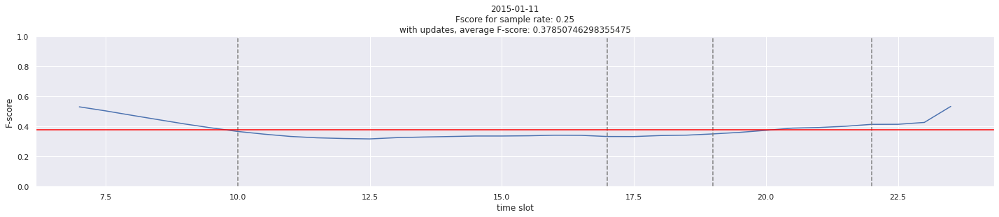

In [ ]:
from IPython.display import clear_output

def rectangle_set_list(n_samples, a, rctgs, datetime, interval):
    '''
        n_samples: int, number of points
        a: int list, the probability to be in the smaller rectangles
        rctgs: list of rectangles of class Rectangle, the first one is the biggest one
        datetime: datetime, 'yyyy-mm-dd hh:mm:ss'
        interval: int, the lasting time (e.g. 12 hours) from the starting time (i.e. date)
    '''
    list_points = []
    d = 2

    # insert 0 at the beginning and 1 at the end
    a = [0] + a
    for i in range(1, len(a)):
        a[i] = a[i-1] + a[i]

    for j in range(n_samples):
        b = np.random.uniform(0,1)        # Generate a random float from 0 to 1
        for i in range(len(a)-1):
            if a[i] < b <= a[i+1]:
                tmp_rctg = rctgs[i]
                x = np.random.uniform(low=tmp_rctg.x_min, high=tmp_rctg.x_min+tmp_rctg.width)
                y = np.random.uniform(low=tmp_rctg.y_min, high=tmp_rctg.y_min+tmp_rctg.height)
                hour_low = datetime.hour
                hour = np.random.randint(low=hour_low, high=hour_low+interval)
                year, month, day = datetime.year, datetime.month, datetime.day
                minute = np.random.randint(low=0, high=59)
                second = np.random.randint(low=0, high=59)
                day_month = day_of_month(year, month)
                if hour >= 24:
                    hour = hour % 24
                    if day<day_month:
                        day = day + 1
                    else:
                        day = (day + 1) % day_month
                # date_str = str(year)+'-'+str(month).zfill(2)+'-'+str(day).zfill(2)+' '+str(hour).zfill(2)+':'+str(minute).zfill(2)+':'+str(second).zfill(2)
                date_generated = dt.date(year, month, day)
                time_generated = dt.time(hour, minute, second)
                datetime_generated = dt.datetime.combine(date_generated, time_generated)
                list_points.append(ClusterPoint(d, [x,y],ID=j,datetime=datetime_generated,type_point='Rect'))
                break
    return list_points

def n_type_of_points_in_rectangle(rects, points, type_req):
    '''
        p: one point of format (diemension, coords, cluster_label)
        q: one point of format (diemension, coords, cluster_label)
        points: list of points of format (diemension, coords, cluster_label)
    '''
    cnt = 0
    for i in range(len(points)):
        x,y = points[i].coords
        for r in rects:
            xl = r.x_min
            xr = r.x_max
            yl = r.y_min
            yr = r.y_max
            if xl <= x <= xr and yl <= y <= yr and points[i].type_point==type_req:
                cnt += 1
                break
    return cnt

def generate_bg_list(df):
    n, d = len(df.index), 2
    list_points = []
    for j in range(n):
        x, y = df.iloc[j,-4], df.iloc[j,-3]
        datetime_generated = df.iloc[j,1]
        list_points.append(ClusterPoint(d, [x,y], ID=j, datetime=datetime_generated,type_point='taxi'))
    return list_points

def run_cluster_taxi_and_rect_prob(bg):
    """
    Reads the input set, clusters the points and writes to output

    :param path_in:     location of the input set
    :param path_out:    location to print the output
    """
    # Step 1: read file and create box graph
    # bg = taxi_set(epsilon, min_pts)
    print('number of points:',len(bg.points))
    
    # Step 2: Compute the core points
    find_core_points(bg)

    # Step 3: cluster the core points
    nr_clusters = compute_cluster_cores(bg)

    # Step 4: assign border points to clusters
    assign_border_points(bg)
    
    # points = bg.points
    # plot_clusters_taxi(points)

    # print("Cluster counter:", nr_clusters, file=sys.stderr)

def generate_data(taxi_df, rects, eps, mpt, prob=1):
    """
    Reads the input set, clusters the points and writes to output

    :param path_in:     location of the input set
    :param path_out:    location to print the output
    """
    # Step 1: read file and create box graph
    taxis = generate_bg_list(taxi_df)
    # rects = rectangle_set_list(n_points, a, rctgs, datetime, interval)
    if prob < 1:
        rect_prob = []
        for j in range(len(rects)):
            b = np.random.uniform(0,1)        # Generate a random float from 0 to 1
            if b <= prob:
                rect_prob.append(rects[j])
    else: rect_prob = rects
    data_list = taxis + rect_prob
    bg = BoxGraph(len(data_list), 2, eps, mpt, data_list)

    # Step 2: Compute the core points
    find_core_points(bg)

    # Step 3: cluster the core points
    nr_clusters = compute_cluster_cores(bg)

    # Step 4: assign border points to clusters
    assign_border_points(bg)

    return bg

def generate_data_set(taxis, n_points, a, rctgs, datetime, interval, eps, mpt, prob=1):
    """
    Reads the input set, clusters the points and writes to output

    :param path_in:     location of the input set
    :param path_out:    location to print the output
    """
    # Step 1: read file and create box graph
    # taxis = generate_bg_list(taxi_df)
    rects = rectangle_set_list(n_points, a, rctgs, datetime, interval)
    if prob < 1:
        rect_prob = []
        for j in range(len(rects)):
            b = np.random.uniform(0,1)        # Generate a random float from 0 to 1
            if b <= prob:
                rect_prob.append(rects[j])
    else: rect_prob = rects
    data_list = taxis + rect_prob
    bg = BoxGraph(len(data_list), 2, eps, mpt, data_list)

    # Step 2: Compute the core points
    find_core_points(bg)

    # Step 3: cluster the core points
    nr_clusters = compute_cluster_cores(bg)

    # Step 4: assign border points to clusters
    assign_border_points(bg)

    return bg, rects


def find_optimal_eps_mpt(taxi_df, rect_list, rctgs, prob):

    # fig = plt.figure(figsize=(30, 50))
    # fig.tight_layout()
    # plt.subplots_adjust(wspace=0,hspace=1)
    # fig.suptitle('DBSCAN using box graph with epsilon and minPts')

    min_area = 4
    lambda_eps, gamma_mpt = 0.1, 0.2
    min_area_r = math.sqrt(min_area/math.pi) 
    min_pow_eps = lambda_eps * math.log(min_area_r,1+lambda_eps)     # math.log(x, base)

    w_image, h_image = 471, 907
    z = max(w_image, h_image)
    max_pow_eps = math.log(z, 1+lambda_eps)
    pow_eps = np.array(range(int(min_pow_eps), int(max_pow_eps)+1, 10))
    # epsilons = list(range(int((1+lambda_eps)**min_pow_eps), int((1+lambda_eps)**max_pow_eps)+1))
    epsilon_list = (1+lambda_eps)**pow_eps
    epsilon_list = [epsilon_list[4]]

    # n = 2000
    # a = [0.5, 0.5]
    
    # rect_1 = Rectangle(130, 600, 30, 30)
    # rect_2 = Rectangle(250, 550, 40, 40)
    # rctgs = [rect_1, rect_2]

    # date = dt.date(2015,1,10)
    # time = dt.time(7,0,0)
    # datetime = dt.datetime.combine(date,time)

    # interval = 13

    max_avg_dens = 0
    eps_max_dens, mpt_max_dens = 0,0
    max_fscore = 0
    eps_max_fscore, mpt_max_fscore = 0,0

    #  plot Numerical Data
    row = len(epsilon_list) * 2  # number of rows
    column = 6  # number of columns
    order = 1  # initialize plot counter
    cnt = 0

    for eps in epsilon_list:
        # bg = taxi_set_and_random_rectangle(n_samples, a, rctgs, datetime, interval, eps)
        # points = generate_bg_list(data_oneday) + rect_set_list
        n_points = len(rect_list) + len(taxi_df.index)
        max_pow_mpt = math.log(n_points, 1+gamma_mpt)
        min_pts_pow_list = np.array(range(0,int(max_pow_mpt)+1,5))
        min_pts_list = (1+gamma_mpt)**min_pts_pow_list
        for mpt in min_pts_list:      
            import time as tm
            start = tm.time()
            # bg = BoxGraph(n_points, 2, eps, mpt, data_list) 
            # print('eps, mpt:', eps, mpt)
            bg = generate_data(taxi_df, rect_list, eps, mpt, prob)
            points = bg.points

            label = [p.cluster_label for p in points]
            label = np.array(label)

            colors = ['#'+("%06x" % random.randint(0, 0xFFFFFF)).upper() for _ in range(len(np.unique(label)))]
            
            # print(len(np.unique(label)), 'labels:', np.unique(label))
            # print('the first 5 labels:', np.unique(label))
            X = [np.array(points[i].coords) for i in range(len(points))]
            X = np.array(X)
            # print('number of coords:', len(X))
            # print('the first 5 coords:', X[:5])

            # ax_im = fig.add_subplot(row, column, order+cnt)
            # cnt += 1
            # # Hide spines, ticks, etc.
            # ax_im.axis('off')
            # ax_im.imshow(im, cmap='gray')
            # implot = plt.imshow(im)

            # for idx, col in enumerate(colors,1):
            #     # print(idx, col)
            #     cluster_data = label == idx
            #     ax_im.scatter(X[cluster_data, 0], X[cluster_data, 1],
            #                 c=col, marker='.', s=10)
            
            # currentAxis = plt.gca()
            # big_rect = rctgs[-1]
            cluster_rect = []
            unique_label = np.unique(label)
            # unique_label = unique_label[unique_label != -1]
            # for idx, lbl in enumerate(np.unique(label),1):
            for idx in range(1,len(unique_label)+1):
                cluster_data = label == idx
                if np.any(cluster_data):
                    left, right = np.min(X[cluster_data,0]), np.max(X[cluster_data,0])
                    bottom, top = np.min(X[cluster_data,1]), np.max(X[cluster_data,1])
                    width, height = abs(right-left), abs(top-bottom)
                    # currentAxis.add_patch(patches.Rectangle((left, bottom), width, height, linewidth=1, edgecolor='b', fill=None))
                    temp_rect = Rectangle(0.5*(left+right), 0.5*(top+bottom), width, height)
                    # print(left, right, top,bottom)
                    # print('x:',temp_rect.x,'y:',temp_rect.y, temp_rect.x_min )
                    cluster_rect.append(temp_rect)
            
            # print('number of clusters:', len(cluster_rect))
            average_density = 0
            f_score = 0
            n_taxi_points = n_rect_points = 0
            if len(cluster_rect)>0:
                # print('number of clusters:',len(cluster_rect))
                k_rects, k_density = dense_rectangle(points, cluster_rect, 3, 1)
                n_rect_points = n_type_of_points_in_rectangle(k_rects, points, 'Rect')
                n_taxi_points = n_type_of_points_in_rectangle(k_rects, points, 'taxi')
                f_score, _, _ = f_score_points_in_rect_duplicate(rctgs, k_rects, points)
                f_socre = round(f_score, 4)
                if len(k_density)>0: average_density = np.mean(k_density)
                else: average_density = 0
                if average_density > max_avg_dens: 
                    max_avg_dens = average_density
                    eps_max_dens, mpt_max_dens = eps, mpt
                if f_score > max_fscore: 
                    max_fscore = f_score
                    eps_max_fscore, mpt_max_fscore = eps, mpt
            # print('f_score, eps, mpt', f_score, eps, mpt)
            #     for r in k_rects:
            #         currentAxis.add_patch(patches.Rectangle((r.x-r.width/2, r.y-r.height/2), r.width, r.height, linewidth=3, edgecolor='r', fill=None))
            # for r in rctgs:
            #     currentAxis.add_patch(patches.Rectangle((r.x-r.width/2, r.y-r.height/2), r.width, r.height, linewidth=1, edgecolor='b', fill=None))

            # print('the maximum average density:',max_avg_dens)
            end = tm.time()
            cost_time = end - start
            # title_1 = 'epsilon: ' + str(round(eps,2)) + '\n' + 'minPts: ' + str(round(mpt,2)) + '\n'
            # title_2 = 'It takes ' + str(round(cost_time, 4)) + ' seconds.' + '\n'
            # title_3_1 = 'average density: ' + str(round(average_density, 4))+'\n'
            # title_3 = 'f_score: ' + str(f_score) + '\n'
            # title_4 = 'number of clusters: '+str(len(cluster_rect)) + '\n'
            # title_5 = 'taxi data points: ' + str(n_taxi_points) + '\n'
            # title_6 = 'generated rect points: ' + str(n_rect_points)
            # title = title_1 + title_2 + title_3_1 + title_3 + title_4 + title_5 + title_6
            # ax_im.set_title(title)           
            # # ax_im.set_xlabel(xlabel)
            # ax_im.set_xticks([])
            # ax_im.set_yticks([])
            bg = None

    # plt.show()
    # print('maximum average density:', max_avg_dens, ', eps:', eps_max_dens, ', mpt:', mpt_max_dens)
    print('maximum fscore:', max_fscore, ', eps:', eps_max_fscore, ', mpt:', mpt_max_fscore)
    return eps_max_fscore, mpt_max_fscore
    
def plot_sliding_window_taxi_and_rect_multi_prob(df, begin_date, interval, w, column, eps, mpt, list_prob=[0.2], unit='minute'):
    '''
        df: dataframes
        begin_date: datetime
        interval: int, the window move to begin_time+interval next time
        w: int, the size of the sliding window
        unit: string, the unit of the sliding window
        column: string, the name of the required column

        only plot, not return
    '''

    rect_1 = Rectangle(130, 600, 30, 30)
    rect_2 = Rectangle(250, 550, 40, 40)
    rctgs = [rect_1, rect_2]

    rect_set_list = rectangle_set_list(3000, [0.5,0.5], rctgs, begin_date, interval)
    
    start_time = begin_date

    after_start_date = df[column] >= start_time
    before_end_date = df[column] < start_time + dt.timedelta(minutes=w)
    between_two_dates = after_start_date & before_end_date
    # filtered_df = df.loc[between_two_dates]
    origin_filtered_df = df.loc[between_two_dates]

    # choose it with probability
    fscore_list = []
    time_cost_list = []
    for prob in list_prob:
        index_list = []
        fscore_for_one_prob = []
        time_cost_for_each = []
        filtered_df = origin_filtered_df
        n_samples = len(filtered_df.index)
        for j in range(n_samples):
            b = np.random.uniform(0,1)        # Generate a random float from 0 to 1
            if b <= prob:
                index_list.append(j)
        sampled_df = filtered_df.iloc[np.array(index_list)]

        # initializing the window
        init_df = TimeWindow(w, start_time, sampled_df)
        filtered_tw = init_df
        latest_window = filtered_tw.window

        #  plot Numerical Data
        row = 4  # number of rows
        n_col = 6  # number of columns
        order = 1  # initialize plot counter
        cnt = 0

        im = plt.imread('manhattan.png')
        dpi = 80
        height, width, depth = im.shape
        figsize = width / float(dpi), height / float(dpi)
        
        update_start_time = start_time
        # fig.suptitle('DBSCAN using box graph with epsilon and minPts')
        
        # generate the boxgraph for the window and run DBSCAN
        for _ in range(34):

            import time
            time_cost_start = time.time()
            
            if filtered_tw.start_time == begin_date+dt.timedelta(hours=3) or \
                filtered_tw.start_time == begin_date+dt.timedelta(hours=10) or \
                filtered_tw.start_time == begin_date+dt.timedelta(hours=12) or \
                filtered_tw.start_time == begin_date+dt.timedelta(hours=15):
                epsilon, minpts = find_optimal_eps_mpt(latest_window, rect_set_list, rctgs, prob)
                eps, mpt = epsilon, minpts

            temp_taxi_list = generate_bg_list(latest_window)
            # temp_bg = BoxGraph(len(temp_point_list), 2, eps, int(mpt*prob), temp_point_list)
            temp_bg, rect_set_list = generate_data_set(temp_taxi_list, 3000, [0.5,0.5], rctgs, begin_date, interval, eps, int(mpt*prob), prob)
            # temp_bg = generate_data_set(latest_window, rect_set_list, eps, int(mpt*prob))
            print('the eps and mpt of boxgraph:', temp_bg.eps, temp_bg.min_pts)
            run_cluster_taxi_and_rect_prob(temp_bg)
            points = temp_bg.points

            X_prob = [np.array(points[i].coords) for i in range(len(points))]
            X_prob = np.array(X_prob)
            label_prob = [points[i].cluster_label for i in range(len(points))]
            label_prob = np.array(label_prob)
            colors = ['#'+("%06x" % random.randint(0, 0xFFFFFF)).upper() for _ in range(len(label_prob))]

            # label = [points[i].cluster_label for i in range(len(points))]
            # label = np.array(label)

            df_not_prob = temp_taxi_list + rect_set_list
            X = [np.array(df_not_prob[i].coords) for i in range(len(df_not_prob))]
            X = np.array(X)
            label = [df_not_prob[i].cluster_label for i in range(len(df_not_prob))]
            label = np.array(label)
            
            # cmap = plt.get_cmap('gnuplot')
            # colors = [cmap(i) for i in np.linspace(0, 1, len(label))]
            
            # # ax = fig.add_subplot(row, n_col, order+cnt)
            # fig = plt.figure(figsize=figsize)
            # ax = fig.add_axes([0, 0, 1, 1])
            # cnt += 1
            # ax.imshow(im, cmap='gray')
            # implot = plt.imshow(im)
            # ax.axis('off')

            # # for idx, col in enumerate(colors):
            # #     # print(idx, col)
            # #     cluster_data = label == idx
            # #     dots = ax.scatter(X[cluster_data, 0], X[cluster_data, 1],
            # #                 c=col, marker='.', s=10)
            # dots = ax.scatter(X[:, 0], X[:, 1],
            #                 marker='.', s=10)

            # currentAxis = plt.gca()
            # big_rect = rctgs[-1]
            cluster_rect = []
            for idx in range(1,len(np.unique(label_prob))+1):
                cluster_data = label_prob == idx
                # print(len(cluster_data),np.unique(cluster_data))
                if np.any(cluster_data):
                    left, right = np.min(X_prob[cluster_data,0]), np.max(X_prob[cluster_data,0])
                    bottom, top = np.min(X_prob[cluster_data,1]), np.max(X_prob[cluster_data,1])
                    width, height = abs(right-left), abs(top-bottom)
                    # currentAxis.add_patch(patches.Rectangle((left, bottom), width, height, linewidth=1, edgecolor='b', fill=None))
                    temp_rect = Rectangle(0.5*(left+right), 0.5*(top+bottom), width, height)
                    cluster_rect.append(temp_rect)

            k_rects, average_density = dense_rectangle(df_not_prob, cluster_rect)
            # print(len(k_rects), average_density)
            points_in_rects = np.array(points_in_rect(k_rects, df_not_prob))
            n_rect_points = n_type_of_points_in_rectangle(k_rects, df_not_prob, 'Rect')
            n_taxi_points = n_type_of_points_in_rectangle(k_rects, df_not_prob, 'taxi')
            f_score, _, _ = f_score_points_in_rect(rctgs, k_rects, df_not_prob)
            fscore_for_one_prob.append(f_score)
            f_socre = round(f_score, 4)

            # ax.scatter(X[:,0], X[:,1], s=2, c='grey')

            # for r in k_rects:
            #     ax.add_patch(patches.Rectangle((r.x-r.width/2, r.y-r.height/2), r.width, r.height, linewidth=2, edgecolor='r', fill=None))
            # for r in rctgs:
            #     ax.add_patch(patches.Rectangle((r.x-r.width/2, r.y-r.height/2), r.width, r.height, linewidth=1, edgecolor='b', fill=None))

            # if len(points_in_rects)>0:
            #     x, y = points_in_rects[:, 0], points_in_rects[:, 1]
            #     ax.plot(x, y, 'r.', markersize=2)
            #     from pandas import DataFrame
            #     pos = []
            #     for i in range(len(x)):
            #         pos.append([x[i], y[i]])
            #     df_predicted = DataFrame (pos,columns=['pos_x','pos_y'])
            #     contour = sns.kdeplot(data=df_predicted, x='pos_x', y='pos_y', fill=True)
            #     contour.collections[0].set_alpha(0)

            # title_1 = str(update_start_time)+' to '+str(update_start_time+ dt.timedelta(minutes=w)) + ' \n'
            # title_2 = 'sample rate:' + str(prob) + '\n'
            # title_3 = 'f_score: ' + str(f_score) + '\n'
            # title_4 = 'number of clusters: '+str(len(cluster_rect)) + '\n'
            # title_5 = 'number of original taxi data points: ' + str(n_taxi_points) + '\n'
            # title_6 = 'number of generated rect data points: ' + str(n_rect_points)
            # title_str = title_1 + title_3 + title_4 + title_5 + title_6
            # plt.title(title_str)
            # update_start_time += dt.timedelta(minutes=interval)
            
            # # Hide spines, ticks, etc.
            # ax.axis('off')

            # plt.scatter(core_points[:,0], core_points[:,1], c='b', s=50)
            # plt.title("DBScan clustering")
            # plt.xticks([])
            # plt.yticks([])

            filtered_tw = filtered_tw.sliding_with_prob(interval, df, column, prob)
            latest_window = filtered_tw.window
            filtered_df_tw = TimeWindow(w, update_start_time, filtered_df)
            filtered_df_tw = filtered_df_tw.sliding(interval, df, column)
            filtered_df = filtered_df_tw.window

            import time
            time_cost_end = time.time()
            time_cost = time_cost_end - time_cost_start
            time_cost_for_each.append(time_cost)

        fscore_list.append(np.array(fscore_for_one_prob))
        time_cost_list.append(np.array(time_cost_for_each))
    
    fscore_list = np.array(fscore_list)
    time_cost_list = np.array(time_cost_list)
    return fscore_list, time_cost_list
        
if __name__ == '__main__':

    date_sat = dt.date(2015,1,10)
    time = dt.time(7,0,0)
    datetime_sat = dt.datetime.combine(date_sat,time)
    date_fri = dt.date(2015,1,9)
    datetime_fri = dt.datetime.combine(date_fri,time)
    date_sun = dt.date(2015,1,11)
    datetime_sun = dt.datetime.combine(date_sun,time)
    date_mon = dt.date(2015,1,12)
    datetime_mon = dt.datetime.combine(date_mon,time)

    list_prob = [1/4]    
    # fscore_list_sat, time_cost_list_sat = plot_sliding_window_taxi_and_rect_multi_prob(data_sat, datetime_sat, 30, 60, 'tpep_pickup_datetime', 45, 590, list_prob)
    fscore_list_sun, time_cost_list_sun_yes = plot_sliding_window_taxi_and_rect_multi_prob(data_sun, datetime_sun, 30, 60, 'tpep_pickup_datetime', 45, 590, list_prob)
    # fscore_list_fri, time_cost_list_fri = plot_sliding_window_taxi_and_rect_multi_prob(data_fri, datetime_fri, 30, 60, 'tpep_pickup_datetime', 45, 590, list_prob)
    # fscore_list_mon, time_cost_list_mon = plot_sliding_window_taxi_and_rect_multi_prob(data_mon, datetime_mon, 30, 60, 'tpep_pickup_datetime', 45, 590, list_prob)
    # fscore_list = [fscore_list_fri, fscore_list_sat, fscore_list_sun, fscore_list_mon]
    fscore_list_sun_yes = np.array(fscore_list_sun)
    
    prob_row = 4
    prob_col = 1
    order = 1
    cnt = 0

    fig = plt.figure(figsize=(20, 15))
    list_time = np.arange(7,24,0.5)
    average_fscore_list_sun_yes = np.mean(fscore_list_sun_yes)
    for i in range(len(list_prob)):
        ax = fig.add_subplot(prob_row, prob_col, order+cnt)
        title = str(date_sun) + '\n' + 'Fscore for sample rate: ' + str(list_prob[i]) + '\n' + 'with updates, average F-score: ' + str(average_fscore_list_sun_yes)
        ax.set_title(title)
        ax.plot(list_time, np.reshape(fscore_list_sun_yes[i],(34,)), 'b')
        ax.axvline(10,color='grey', ls='--')
        ax.axvline(17,color='grey', ls='--')
        ax.axvline(19,color='grey', ls='--')
        ax.axvline(22,color='grey', ls='--')
        ax.axhline(average_fscore_list_sun_yes,color='red')
        # ax.legend(loc = 'lower right')
        # ax.plot([0, 1], [0, 1],'r--')
        ax.set_xlim()
        ax.set_ylim([0, 1])
        ax.set_ylabel('F-score')
        ax.set_xlabel('time slot')
        cnt += 1

    # fig = plt.figure(figsize=(8, 5))
    # ax = fig.add_subplot(2, 1, 1)
    # ax.set_title('F-score for different sample rate')
    # average_fscore = np.mean(fscore_list, axis=1)
    # plt.plot(list_prob, average_fscore, 'b')
    # # plt.legend(loc = 'lower right')
    # # plt.plot([0, 1], [0, 1],'r--')
    # ax.set_xlim([0, 0.5])
    # ax.set_ylim([0, 1])
    # ax.set_ylabel('F-score')
    # ax.set_xlabel('sample rate')

    # fig = plt.figure(figsize=(8, 5))
    # ax = fig.add_subplot(2, 1, 2)
    # ax.set_title('F-score for different sample rate')
    # average_time_cost = np.mean(time_cost_list, axis=1)
    #  plt.plot(list_prob, average_time_cost, 'b')
    # # plt.legend(loc = 'lower right')
    # # plt.plot([0, 1], [0, 1],'r--')
    # ax.set_xlim([0, 0.5])
    # ax.set_ylim()
    # ax.set_ylabel('time_cost')
    # ax.set_xlabel('sample rate')

    plt.show()

流式输出内容被截断，只能显示最后 5000 行内容。
length of both: 0 0
length of both: 0 0
length of both: 0 0
length of both: 0 0
length of both: 0 0
length of both: 0 0
length of both: 0 0
length of both: 0 0
length of both: 0 0
length of both: 0 0
length of both: 0 0
length of both: 0 0
length of both: 0 0
length of both: 0 0
length of both: 0 0
length of both: 0 0
length of both: 0 0
length of both: 0 0
length of both: 0 0
length of both: 0 0
length of both: 0 0
length of both: 0 0
length of both: 0 0
length of both: 0 0
length of both: 0 0
length of both: 0 0
length of both: 0 0
length of both: 0 0
length of both: 0 0
length of both: 0 0
length of both: 0 0
length of both: 0 0
length of both: 0 0
length of both: 0 0
length of both: 0 0
length of both: 0 0
length of both: 0 0
length of both: 0 0
length of both: 0 0
length of both: 0 0
length of both: 0 0
length of both: 0 0
length of both: 0 0
length of both: 0 0
length of both: 0 0
length of both: 0 0
length of both: 0 0
length of both: 0 0
length of bot

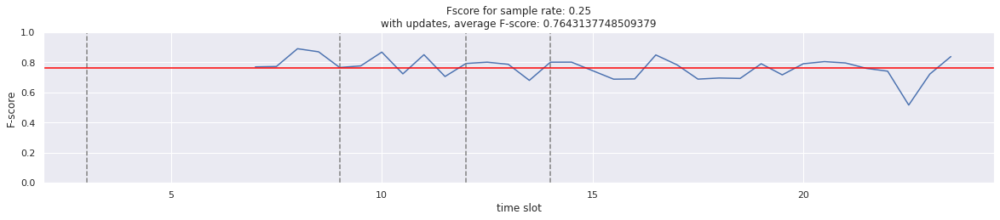

In [ ]:
from IPython.display import clear_output

def rectangle_set_list(n_samples, a, rctgs, datetime, interval):
    '''
        n_samples: int, number of points
        a: int list, the probability to be in the smaller rectangles
        rctgs: list of rectangles of class Rectangle, the first one is the biggest one
        datetime: datetime, 'yyyy-mm-dd hh:mm:ss'
        interval: int, the lasting time (e.g. 12 hours) from the starting time (i.e. date)
    '''
    list_points = []
    d = 2

    # insert 0 at the beginning and 1 at the end
    a = [0] + a
    for i in range(1, len(a)):
        a[i] = a[i-1] + a[i]

    for j in range(n_samples):
        b = np.random.uniform(0,1)        # Generate a random float from 0 to 1
        for i in range(len(a)-1):
            if a[i] < b <= a[i+1]:
                tmp_rctg = rctgs[i]
                x = np.random.uniform(low=tmp_rctg.x_min, high=tmp_rctg.x_min+tmp_rctg.width)
                y = np.random.uniform(low=tmp_rctg.y_min, high=tmp_rctg.y_min+tmp_rctg.height)
                hour_low = datetime.hour
                hour = np.random.randint(low=hour_low, high=hour_low+interval)
                year, month, day = datetime.year, datetime.month, datetime.day
                minute = np.random.randint(low=0, high=59)
                second = np.random.randint(low=0, high=59)
                day_month = day_of_month(year, month)
                if hour >= 24:
                    hour = hour % 24
                    if day<day_month:
                        day = day + 1
                    else:
                        day = (day + 1) % day_month
                # date_str = str(year)+'-'+str(month).zfill(2)+'-'+str(day).zfill(2)+' '+str(hour).zfill(2)+':'+str(minute).zfill(2)+':'+str(second).zfill(2)
                date_generated = dt.date(year, month, day)
                time_generated = dt.time(hour, minute, second)
                datetime_generated = dt.datetime.combine(date_generated, time_generated)
                list_points.append(ClusterPoint(d, [x,y],ID=j,datetime=datetime_generated,type_point='Rect'))
                break
    return list_points

def n_type_of_points_in_rectangle(rects, points, type_req):
    '''
        p: one point of format (diemension, coords, cluster_label)
        q: one point of format (diemension, coords, cluster_label)
        points: list of points of format (diemension, coords, cluster_label)
    '''
    cnt = 0
    for i in range(len(points)):
        x,y = points[i].coords
        for r in rects:
            xl = r.x_min
            xr = r.x_max
            yl = r.y_min
            yr = r.y_max
            if xl <= x <= xr and yl <= y <= yr and points[i].type_point==type_req:
                cnt += 1
                break
    return cnt

def generate_bg_list(df):
    n, d = len(df.index), 2
    list_points = []
    for j in range(n):
        x, y = df.iloc[j,-4], df.iloc[j,-3]
        datetime_generated = df.iloc[j,1]
        list_points.append(ClusterPoint(d, [x,y], ID=j, datetime=datetime_generated,type_point='taxi'))
    return list_points

def run_cluster_taxi_and_rect_prob(bg):
    """
    Reads the input set, clusters the points and writes to output

    :param path_in:     location of the input set
    :param path_out:    location to print the output
    """
    # Step 1: read file and create box graph
    # bg = taxi_set(epsilon, min_pts)
    print('number of points:',len(bg.points))
    
    # Step 2: Compute the core points
    find_core_points(bg)

    # Step 3: cluster the core points
    nr_clusters = compute_cluster_cores(bg)

    # Step 4: assign border points to clusters
    assign_border_points(bg)
    
    # points = bg.points
    # plot_clusters_taxi(points)

    # print("Cluster counter:", nr_clusters, file=sys.stderr)

def generate_data(taxi_df, rects, eps, mpt, prob=1):
    """
    Reads the input set, clusters the points and writes to output

    :param path_in:     location of the input set
    :param path_out:    location to print the output
    """
    # Step 1: read file and create box graph
    taxis = generate_bg_list(taxi_df)
    # rects = rectangle_set_list(n_points, a, rctgs, datetime, interval)
    if prob < 1:
        rect_prob = []
        for j in range(len(rects)):
            b = np.random.uniform(0,1)        # Generate a random float from 0 to 1
            if b <= prob:
                rect_prob.append(rects[j])
    else: rect_prob = rects
    data_list = taxis + rect_prob
    bg = BoxGraph(len(data_list), 2, eps, mpt, data_list)

    # Step 2: Compute the core points
    find_core_points(bg)

    # Step 3: cluster the core points
    nr_clusters = compute_cluster_cores(bg)

    # Step 4: assign border points to clusters
    assign_border_points(bg)

    return bg

def generate_data_set(taxis, n_points, a, rctgs, datetime, interval, eps, mpt, prob=1):
    """
    Reads the input set, clusters the points and writes to output

    :param path_in:     location of the input set
    :param path_out:    location to print the output
    """
    # Step 1: read file and create box graph
    # taxis = generate_bg_list(taxi_df)
    rects = rectangle_set_list(n_points, a, rctgs, datetime, interval)
    if prob < 1:
        rect_prob = []
        for j in range(len(rects)):
            b = np.random.uniform(0,1)        # Generate a random float from 0 to 1
            if b <= prob:
                rect_prob.append(rects[j])
    else: rect_prob = rects
    data_list = taxis + rect_prob
    bg = BoxGraph(len(data_list), 2, eps, mpt, data_list)

    # Step 2: Compute the core points
    find_core_points(bg)

    # Step 3: cluster the core points
    nr_clusters = compute_cluster_cores(bg)

    # Step 4: assign border points to clusters
    assign_border_points(bg)

    return bg, rects


def find_optimal_eps_mpt(taxi_df, rect_list, rctgs, prob):

    # fig = plt.figure(figsize=(30, 50))
    # fig.tight_layout()
    # plt.subplots_adjust(wspace=0,hspace=1)
    # fig.suptitle('DBSCAN using box graph with epsilon and minPts')

    min_area = 4
    lambda_eps, gamma_mpt = 0.1, 0.2
    min_area_r = math.sqrt(min_area/math.pi) 
    min_pow_eps = lambda_eps * math.log(min_area_r,1+lambda_eps)     # math.log(x, base)

    w_image, h_image = 471, 907
    z = max(w_image, h_image)
    max_pow_eps = math.log(z, 1+lambda_eps)
    pow_eps = np.array(range(int(min_pow_eps), int(max_pow_eps)+1, 10))
    # epsilons = list(range(int((1+lambda_eps)**min_pow_eps), int((1+lambda_eps)**max_pow_eps)+1))
    epsilon_list = (1+lambda_eps)**pow_eps
    epsilon_list = [epsilon_list[4]]

    # n = 2000
    # a = [0.5, 0.5]
    
    # rect_1 = Rectangle(130, 600, 30, 30)
    # rect_2 = Rectangle(250, 550, 40, 40)
    # rctgs = [rect_1, rect_2]

    # date = dt.date(2015,1,10)
    # time = dt.time(7,0,0)
    # datetime = dt.datetime.combine(date,time)

    # interval = 13

    max_avg_dens = 0
    eps_max_dens, mpt_max_dens = 0,0
    max_fscore = 0
    eps_max_fscore, mpt_max_fscore = 0,0

    #  plot Numerical Data
    row = len(epsilon_list) * 2  # number of rows
    column = 6  # number of columns
    order = 1  # initialize plot counter
    cnt = 0

    for eps in epsilon_list:
        # bg = taxi_set_and_random_rectangle(n_samples, a, rctgs, datetime, interval, eps)
        # points = generate_bg_list(data_oneday) + rect_set_list
        n_points = len(rect_list) + len(taxi_df.index)
        max_pow_mpt = math.log(n_points, 1+gamma_mpt)
        min_pts_pow_list = np.array(range(0,int(max_pow_mpt)+1,5))
        min_pts_list = (1+gamma_mpt)**min_pts_pow_list
        for mpt in min_pts_list:      
            import time as tm
            start = tm.time()
            # bg = BoxGraph(n_points, 2, eps, mpt, data_list) 
            # print('eps, mpt:', eps, mpt)
            bg = generate_data(taxi_df, rect_list, eps, mpt, prob)
            points = bg.points

            label = [p.cluster_label for p in points]
            label = np.array(label)

            colors = ['#'+("%06x" % random.randint(0, 0xFFFFFF)).upper() for _ in range(len(np.unique(label)))]
            
            # print(len(np.unique(label)), 'labels:', np.unique(label))
            # print('the first 5 labels:', np.unique(label))
            X = [np.array(points[i].coords) for i in range(len(points))]
            X = np.array(X)
            # print('number of coords:', len(X))
            # print('the first 5 coords:', X[:5])

            # ax_im = fig.add_subplot(row, column, order+cnt)
            # cnt += 1
            # # Hide spines, ticks, etc.
            # ax_im.axis('off')
            # ax_im.imshow(im, cmap='gray')
            # implot = plt.imshow(im)

            # for idx, col in enumerate(colors,1):
            #     # print(idx, col)
            #     cluster_data = label == idx
            #     ax_im.scatter(X[cluster_data, 0], X[cluster_data, 1],
            #                 c=col, marker='.', s=10)
            
            # currentAxis = plt.gca()
            # big_rect = rctgs[-1]
            cluster_rect = []
            unique_label = np.unique(label)
            # unique_label = unique_label[unique_label != -1]
            # for idx, lbl in enumerate(np.unique(label),1):
            for idx in range(1,len(unique_label)+1):
                cluster_data = label == idx
                if np.any(cluster_data):
                    left, right = np.min(X[cluster_data,0]), np.max(X[cluster_data,0])
                    bottom, top = np.min(X[cluster_data,1]), np.max(X[cluster_data,1])
                    width, height = abs(right-left), abs(top-bottom)
                    # currentAxis.add_patch(patches.Rectangle((left, bottom), width, height, linewidth=1, edgecolor='b', fill=None))
                    temp_rect = Rectangle(0.5*(left+right), 0.5*(top+bottom), width, height)
                    # print(left, right, top,bottom)
                    # print('x:',temp_rect.x,'y:',temp_rect.y, temp_rect.x_min )
                    cluster_rect.append(temp_rect)
            
            # print('number of clusters:', len(cluster_rect))
            average_density = 0
            f_score = 0
            n_taxi_points = n_rect_points = 0
            if len(cluster_rect)>0:
                # print('number of clusters:',len(cluster_rect))
                k_rects, k_density = dense_rectangle(points, cluster_rect, 3, 1)
                n_rect_points = n_type_of_points_in_rectangle(k_rects, points, 'Rect')
                n_taxi_points = n_type_of_points_in_rectangle(k_rects, points, 'taxi')
                f_score, _, _ = f_score_points_in_rect(rctgs, k_rects, points)
                f_socre = round(f_score, 4)
                if len(k_density)>0: average_density = np.mean(k_density)
                else: average_density = 0
                if average_density > max_avg_dens: 
                    max_avg_dens = average_density
                    eps_max_dens, mpt_max_dens = eps, mpt
                if f_score > max_fscore: 
                    max_fscore = f_score
                    eps_max_fscore, mpt_max_fscore = eps, mpt
            # print('f_score, eps, mpt', f_score, eps, mpt)
            #     for r in k_rects:
            #         currentAxis.add_patch(patches.Rectangle((r.x-r.width/2, r.y-r.height/2), r.width, r.height, linewidth=3, edgecolor='r', fill=None))
            # for r in rctgs:
            #     currentAxis.add_patch(patches.Rectangle((r.x-r.width/2, r.y-r.height/2), r.width, r.height, linewidth=1, edgecolor='b', fill=None))

            # print('the maximum average density:',max_avg_dens)
            end = tm.time()
            cost_time = end - start
            # title_1 = 'epsilon: ' + str(round(eps,2)) + '\n' + 'minPts: ' + str(round(mpt,2)) + '\n'
            # title_2 = 'It takes ' + str(round(cost_time, 4)) + ' seconds.' + '\n'
            # title_3_1 = 'average density: ' + str(round(average_density, 4))+'\n'
            # title_3 = 'f_score: ' + str(f_score) + '\n'
            # title_4 = 'number of clusters: '+str(len(cluster_rect)) + '\n'
            # title_5 = 'taxi data points: ' + str(n_taxi_points) + '\n'
            # title_6 = 'generated rect points: ' + str(n_rect_points)
            # title = title_1 + title_2 + title_3_1 + title_3 + title_4 + title_5 + title_6
            # ax_im.set_title(title)           
            # # ax_im.set_xlabel(xlabel)
            # ax_im.set_xticks([])
            # ax_im.set_yticks([])
            bg = None

    # plt.show()
    # print('maximum average density:', max_avg_dens, ', eps:', eps_max_dens, ', mpt:', mpt_max_dens)
    print('maximum fscore:', max_fscore, ', eps:', eps_max_fscore, ', mpt:', mpt_max_fscore)
    return eps_max_fscore, mpt_max_fscore
    
def plot_sliding_window_taxi_and_rect_multi_prob(df, begin_date, interval, w, column, eps, mpt, list_prob=[0.2], unit='minute'):
    '''
        df: dataframes
        begin_date: datetime
        interval: int, the window move to begin_time+interval next time
        w: int, the size of the sliding window
        unit: string, the unit of the sliding window
        column: string, the name of the required column

        only plot, not return
    '''

    rect_1 = Rectangle(130, 600, 30, 30)
    rect_2 = Rectangle(250, 550, 40, 40)
    rctgs = [rect_1, rect_2]

    rect_set_list = rectangle_set_list(3000, [0.5,0.5], rctgs, begin_date, interval)
    
    start_time = begin_date

    after_start_date = df[column] >= start_time
    before_end_date = df[column] < start_time + dt.timedelta(minutes=w)
    between_two_dates = after_start_date & before_end_date
    # filtered_df = df.loc[between_two_dates]
    origin_filtered_df = df.loc[between_two_dates]

    # choose it with probability
    fscore_list = []
    time_cost_list = []
    for prob in list_prob:
        index_list = []
        fscore_for_one_prob = []
        time_cost_for_each = []
        filtered_df = origin_filtered_df
        n_samples = len(filtered_df.index)
        for j in range(n_samples):
            b = np.random.uniform(0,1)        # Generate a random float from 0 to 1
            if b <= prob:
                index_list.append(j)
        sampled_df = filtered_df.iloc[np.array(index_list)]

        # initializing the window
        init_df = TimeWindow(w, start_time, sampled_df)
        filtered_tw = init_df
        latest_window = filtered_tw.window

        #  plot Numerical Data
        row = 4  # number of rows
        n_col = 6  # number of columns
        order = 1  # initialize plot counter
        cnt = 0

        im = plt.imread('manhattan.png')
        dpi = 80
        height, width, depth = im.shape
        figsize = width / float(dpi), height / float(dpi)
        
        update_start_time = start_time
        # fig.suptitle('DBSCAN using box graph with epsilon and minPts')
        
        # generate the boxgraph for the window and run DBSCAN
        for _ in range(34):

            import time
            time_cost_start = time.time()
            
            if filtered_tw.start_time == begin_date+dt.timedelta(hours=3) or \
                filtered_tw.start_time == begin_date+dt.timedelta(hours=9) or \
                filtered_tw.start_time == begin_date+dt.timedelta(hours=12) or \
                filtered_tw.start_time == begin_date+dt.timedelta(hours=14):
                epsilon, minpts = find_optimal_eps_mpt(latest_window, rect_set_list, rctgs, prob)
                eps, mpt = epsilon, minpts

            temp_taxi_list = generate_bg_list(latest_window)
            # temp_bg = BoxGraph(len(temp_point_list), 2, eps, int(mpt*prob), temp_point_list)
            temp_bg, rect_set_list = generate_data_set(temp_taxi_list, 3000, [0.5,0.5], rctgs, begin_date, interval, eps, int(mpt*prob), prob)
            # temp_bg = generate_data_set(latest_window, rect_set_list, eps, int(mpt*prob))
            print('the eps and mpt of boxgraph:', temp_bg.eps, temp_bg.min_pts)
            run_cluster_taxi_and_rect_prob(temp_bg)
            points = temp_bg.points

            X_prob = [np.array(points[i].coords) for i in range(len(points))]
            X_prob = np.array(X_prob)
            label_prob = [points[i].cluster_label for i in range(len(points))]
            label_prob = np.array(label_prob)
            colors = ['#'+("%06x" % random.randint(0, 0xFFFFFF)).upper() for _ in range(len(label_prob))]

            # label = [points[i].cluster_label for i in range(len(points))]
            # label = np.array(label)

            df_not_prob = temp_taxi_list + rect_set_list
            X = [np.array(df_not_prob[i].coords) for i in range(len(df_not_prob))]
            X = np.array(X)
            label = [df_not_prob[i].cluster_label for i in range(len(df_not_prob))]
            label = np.array(label)
            
            # cmap = plt.get_cmap('gnuplot')
            # colors = [cmap(i) for i in np.linspace(0, 1, len(label))]
            
            # # ax = fig.add_subplot(row, n_col, order+cnt)
            # fig = plt.figure(figsize=figsize)
            # ax = fig.add_axes([0, 0, 1, 1])
            # cnt += 1
            # ax.imshow(im, cmap='gray')
            # implot = plt.imshow(im)
            # ax.axis('off')

            # # for idx, col in enumerate(colors):
            # #     # print(idx, col)
            # #     cluster_data = label == idx
            # #     dots = ax.scatter(X[cluster_data, 0], X[cluster_data, 1],
            # #                 c=col, marker='.', s=10)
            # dots = ax.scatter(X[:, 0], X[:, 1],
            #                 marker='.', s=10)

            # currentAxis = plt.gca()
            # big_rect = rctgs[-1]
            cluster_rect = []
            for idx in range(1,len(np.unique(label_prob))+1):
                cluster_data = label_prob == idx
                # print(len(cluster_data),np.unique(cluster_data))
                if np.any(cluster_data):
                    left, right = np.min(X_prob[cluster_data,0]), np.max(X_prob[cluster_data,0])
                    bottom, top = np.min(X_prob[cluster_data,1]), np.max(X_prob[cluster_data,1])
                    width, height = abs(right-left), abs(top-bottom)
                    # currentAxis.add_patch(patches.Rectangle((left, bottom), width, height, linewidth=1, edgecolor='b', fill=None))
                    temp_rect = Rectangle(0.5*(left+right), 0.5*(top+bottom), width, height)
                    cluster_rect.append(temp_rect)

            k_rects, average_density = dense_rectangle(df_not_prob, cluster_rect)
            # print(len(k_rects), average_density)
            points_in_rects = np.array(points_in_rect(k_rects, df_not_prob))
            n_rect_points = n_type_of_points_in_rectangle(k_rects, df_not_prob, 'Rect')
            n_taxi_points = n_type_of_points_in_rectangle(k_rects, df_not_prob, 'taxi')
            f_score, _, _ = f_score_points_in_rect_duplicate(rctgs, k_rects, df_not_prob)
            fscore_for_one_prob.append(f_score)
            f_socre = round(f_score, 4)

            # ax.scatter(X[:,0], X[:,1], s=2, c='grey')

            # for r in k_rects:
            #     ax.add_patch(patches.Rectangle((r.x-r.width/2, r.y-r.height/2), r.width, r.height, linewidth=2, edgecolor='r', fill=None))
            # for r in rctgs:
            #     ax.add_patch(patches.Rectangle((r.x-r.width/2, r.y-r.height/2), r.width, r.height, linewidth=1, edgecolor='b', fill=None))

            # if len(points_in_rects)>0:
            #     x, y = points_in_rects[:, 0], points_in_rects[:, 1]
            #     ax.plot(x, y, 'r.', markersize=2)
            #     from pandas import DataFrame
            #     pos = []
            #     for i in range(len(x)):
            #         pos.append([x[i], y[i]])
            #     df_predicted = DataFrame (pos,columns=['pos_x','pos_y'])
            #     contour = sns.kdeplot(data=df_predicted, x='pos_x', y='pos_y', fill=True)
            #     contour.collections[0].set_alpha(0)

            # title_1 = str(update_start_time)+' to '+str(update_start_time+ dt.timedelta(minutes=w)) + ' \n'
            # title_2 = 'sample rate:' + str(prob) + '\n'
            # title_3 = 'f_score: ' + str(f_score) + '\n'
            # title_4 = 'number of clusters: '+str(len(cluster_rect)) + '\n'
            # title_5 = 'number of original taxi data points: ' + str(n_taxi_points) + '\n'
            # title_6 = 'number of generated rect data points: ' + str(n_rect_points)
            # title_str = title_1 + title_3 + title_4 + title_5 + title_6
            # plt.title(title_str)
            # update_start_time += dt.timedelta(minutes=interval)
            
            # # Hide spines, ticks, etc.
            # ax.axis('off')

            # plt.scatter(core_points[:,0], core_points[:,1], c='b', s=50)
            # plt.title("DBScan clustering")
            # plt.xticks([])
            # plt.yticks([])

            filtered_tw = filtered_tw.sliding_with_prob(interval, df, column, prob)
            latest_window = filtered_tw.window
            filtered_df_tw = TimeWindow(w, update_start_time, filtered_df)
            filtered_df_tw = filtered_df_tw.sliding(interval, df, column)
            filtered_df = filtered_df_tw.window

            import time
            time_cost_end = time.time()
            time_cost = time_cost_end - time_cost_start
            time_cost_for_each.append(time_cost)

        fscore_list.append(np.array(fscore_for_one_prob))
        time_cost_list.append(np.array(time_cost_for_each))
    
    fscore_list = np.array(fscore_list)
    time_cost_list = np.array(time_cost_list)
    return fscore_list, time_cost_list
        
if __name__ == '__main__':

    date_sat = dt.date(2015,1,10)
    time = dt.time(7,0,0)
    datetime_sat = dt.datetime.combine(date_sat,time)
    date_fri = dt.date(2015,1,9)
    datetime_fri = dt.datetime.combine(date_fri,time)
    date_sun = dt.date(2015,1,11)
    datetime_sun = dt.datetime.combine(date_sun,time)
    date_mon = dt.date(2015,1,12)
    datetime_mon = dt.datetime.combine(date_mon,time)

    list_prob = [1/4]    
    # fscore_list_sat, time_cost_list_sat = plot_sliding_window_taxi_and_rect_multi_prob(data_sat, datetime_sat, 30, 60, 'tpep_pickup_datetime', 45, 590, list_prob)
    # fscore_list_sun, time_cost_list_sun = plot_sliding_window_taxi_and_rect_multi_prob(data_sun, datetime_sun, 30, 60, 'tpep_pickup_datetime', 45, 590, list_prob)
    fscore_list_fri, time_cost_list_fri = plot_sliding_window_taxi_and_rect_multi_prob(data_fri, datetime_fri, 30, 60, 'tpep_pickup_datetime', 45, 590, list_prob)
    # fscore_list_mon, time_cost_list_mon = plot_sliding_window_taxi_and_rect_multi_prob(data_mon, datetime_mon, 30, 60, 'tpep_pickup_datetime', 45, 590, list_prob)
    # fscore_list = [fscore_list_fri, fscore_list_sat, fscore_list_sun, fscore_list_mon]
    fscore_list_fri_yes = np.array(fscore_list_fri)
    
    prob_row = 4
    prob_col = 1
    order = 1
    cnt = 0

    fig = plt.figure(figsize=(20, 15))
    list_time = np.arange(7,24,0.5)
    average_fscore_list_fri_yes = np.mean(fscore_list_fri_yes)
    for i in range(len(list_prob)):
        ax = fig.add_subplot(prob_row, prob_col, order+cnt)
        title = 'Fscore for sample rate: ' + str(list_prob[i]) + '\n' + 'with updates, average F-score: ' + str(average_fscore_list_fri_yes)
        ax.set_title(title)
        ax.plot(list_time, np.reshape(fscore_list_fri_yes[i],(34,)), 'b')
        # ax.legend(loc = 'lower right')
        # ax.plot([0, 1], [0, 1],'r--')
        ax.axvline(3,color='grey',ls='--')
        ax.axvline(9,color='grey',ls='--')
        ax.axvline(12,color='grey',ls='--')
        ax.axvline(14,color='grey',ls='--')
        ax.axhline(average_fscore_list_fri_yes,color='red')
        ax.set_xlim()
        ax.set_ylim([0, 1])
        ax.set_ylabel('F-score')
        ax.set_xlabel('time slot')
        cnt += 1

    # fig = plt.figure(figsize=(8, 5))
    # ax = fig.add_subplot(2, 1, 1)
    # ax.set_title('F-score for different sample rate')
    # average_fscore = np.mean(fscore_list, axis=1)
    # plt.plot(list_prob, average_fscore, 'b')
    # # plt.legend(loc = 'lower right')
    # # plt.plot([0, 1], [0, 1],'r--')
    # ax.set_xlim([0, 0.5])
    # ax.set_ylim([0, 1])
    # ax.set_ylabel('F-score')
    # ax.set_xlabel('sample rate')

    # fig = plt.figure(figsize=(8, 5))
    # ax = fig.add_subplot(2, 1, 2)
    # ax.set_title('F-score for different sample rate')
    # average_time_cost = np.mean(time_cost_list, axis=1)
    #  plt.plot(list_prob, average_time_cost, 'b')
    # # plt.legend(loc = 'lower right')
    # # plt.plot([0, 1], [0, 1],'r--')
    # ax.set_xlim([0, 0.5])
    # ax.set_ylim()
    # ax.set_ylabel('time_cost')
    # ax.set_xlabel('sample rate')

    plt.show()

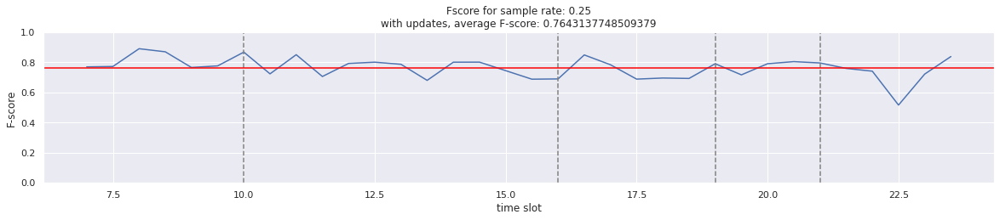

In [ ]:
fig = plt.figure(figsize=(20, 15))
average_fscore_list_fri_yes = np.mean(fscore_list_fri_yes)
ax = fig.add_subplot(prob_row, prob_col, order+cnt)
title = 'Fscore for sample rate: ' + str(list_prob[i]) + '\n' + 'with updates, average F-score: ' + str(average_fscore_list_fri_yes)
ax.set_title(title)
ax.plot(list_time, np.reshape(fscore_list_fri_yes[i],(34,)), 'b')
# ax.legend(loc = 'lower right')
# ax.plot([0, 1], [0, 1],'r--')
ax.axvline(10,color='grey',ls='--')
ax.axvline(16,color='grey',ls='--')
ax.axvline(19,color='grey',ls='--')
ax.axvline(21,color='grey',ls='--')
ax.axhline(average_fscore_list_fri_yes,color='red')
ax.set_xlim()
ax.set_ylim([0, 1])
ax.set_ylabel('F-score')
ax.set_xlabel('time slot')
plt.show()

流式输出内容被截断，只能显示最后 5000 行内容。
length of both: 0 0
length of both: 0 0
length of both: 0 0
length of both: 0 0
length of both: 0 0
length of both: 0 0
length of both: 0 0
length of both: 0 0
length of both: 0 0
length of both: 0 0
length of both: 0 0
length of both: 0 0
length of both: 0 0
length of both: 0 0
length of both: 0 0
length of both: 0 0
length of both: 0 0
length of both: 0 0
length of both: 0 0
length of both: 0 0
length of both: 0 0
length of both: 0 0
length of both: 0 0
length of both: 0 0
length of both: 0 0
length of both: 0 0
length of both: 0 0
length of both: 0 0
length of both: 0 0
length of both: 0 0
length of both: 0 0
length of both: 0 0
length of both: 0 0
length of both: 0 0
length of both: 0 0
length of both: 0 0
length of both: 0 0
length of both: 0 0
length of both: 0 0
length of both: 0 0
length of both: 0 0
length of both: 0 0
length of both: 0 0
length of both: 0 0
length of both: 0 0
length of both: 0 0
length of both: 0 0
length of both: 0 0
length of bot

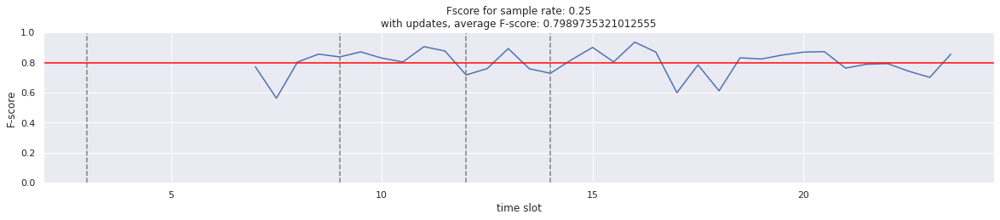

In [ ]:
from IPython.display import clear_output

def rectangle_set_list(n_samples, a, rctgs, datetime, interval):
    '''
        n_samples: int, number of points
        a: int list, the probability to be in the smaller rectangles
        rctgs: list of rectangles of class Rectangle, the first one is the biggest one
        datetime: datetime, 'yyyy-mm-dd hh:mm:ss'
        interval: int, the lasting time (e.g. 12 hours) from the starting time (i.e. date)
    '''
    list_points = []
    d = 2

    # insert 0 at the beginning and 1 at the end
    a = [0] + a
    for i in range(1, len(a)):
        a[i] = a[i-1] + a[i]

    for j in range(n_samples):
        b = np.random.uniform(0,1)        # Generate a random float from 0 to 1
        for i in range(len(a)-1):
            if a[i] < b <= a[i+1]:
                tmp_rctg = rctgs[i]
                x = np.random.uniform(low=tmp_rctg.x_min, high=tmp_rctg.x_min+tmp_rctg.width)
                y = np.random.uniform(low=tmp_rctg.y_min, high=tmp_rctg.y_min+tmp_rctg.height)
                hour_low = datetime.hour
                hour = np.random.randint(low=hour_low, high=hour_low+interval)
                year, month, day = datetime.year, datetime.month, datetime.day
                minute = np.random.randint(low=0, high=59)
                second = np.random.randint(low=0, high=59)
                day_month = day_of_month(year, month)
                if hour >= 24:
                    hour = hour % 24
                    if day<day_month:
                        day = day + 1
                    else:
                        day = (day + 1) % day_month
                # date_str = str(year)+'-'+str(month).zfill(2)+'-'+str(day).zfill(2)+' '+str(hour).zfill(2)+':'+str(minute).zfill(2)+':'+str(second).zfill(2)
                date_generated = dt.date(year, month, day)
                time_generated = dt.time(hour, minute, second)
                datetime_generated = dt.datetime.combine(date_generated, time_generated)
                list_points.append(ClusterPoint(d, [x,y],ID=j,datetime=datetime_generated,type_point='Rect'))
                break
    return list_points

def n_type_of_points_in_rectangle(rects, points, type_req):
    '''
        p: one point of format (diemension, coords, cluster_label)
        q: one point of format (diemension, coords, cluster_label)
        points: list of points of format (diemension, coords, cluster_label)
    '''
    cnt = 0
    for i in range(len(points)):
        x,y = points[i].coords
        for r in rects:
            xl = r.x_min
            xr = r.x_max
            yl = r.y_min
            yr = r.y_max
            if xl <= x <= xr and yl <= y <= yr and points[i].type_point==type_req:
                cnt += 1
                break
    return cnt

def generate_bg_list(df):
    n, d = len(df.index), 2
    list_points = []
    for j in range(n):
        x, y = df.iloc[j,-4], df.iloc[j,-3]
        datetime_generated = df.iloc[j,1]
        list_points.append(ClusterPoint(d, [x,y], ID=j, datetime=datetime_generated,type_point='taxi'))
    return list_points

def run_cluster_taxi_and_rect_prob(bg):
    """
    Reads the input set, clusters the points and writes to output

    :param path_in:     location of the input set
    :param path_out:    location to print the output
    """
    # Step 1: read file and create box graph
    # bg = taxi_set(epsilon, min_pts)
    print('number of points:',len(bg.points))
    
    # Step 2: Compute the core points
    find_core_points(bg)

    # Step 3: cluster the core points
    nr_clusters = compute_cluster_cores(bg)

    # Step 4: assign border points to clusters
    assign_border_points(bg)
    
    # points = bg.points
    # plot_clusters_taxi(points)

    # print("Cluster counter:", nr_clusters, file=sys.stderr)

def generate_data(taxi_df, rects, eps, mpt, prob=1):
    """
    Reads the input set, clusters the points and writes to output

    :param path_in:     location of the input set
    :param path_out:    location to print the output
    """
    # Step 1: read file and create box graph
    taxis = generate_bg_list(taxi_df)
    # rects = rectangle_set_list(n_points, a, rctgs, datetime, interval)
    if prob < 1:
        rect_prob = []
        for j in range(len(rects)):
            b = np.random.uniform(0,1)        # Generate a random float from 0 to 1
            if b <= prob:
                rect_prob.append(rects[j])
    else: rect_prob = rects
    data_list = taxis + rect_prob
    bg = BoxGraph(len(data_list), 2, eps, mpt, data_list)

    # Step 2: Compute the core points
    find_core_points(bg)

    # Step 3: cluster the core points
    nr_clusters = compute_cluster_cores(bg)

    # Step 4: assign border points to clusters
    assign_border_points(bg)

    return bg

def generate_data_set(taxis, n_points, a, rctgs, datetime, interval, eps, mpt, prob=1):
    """
    Reads the input set, clusters the points and writes to output

    :param path_in:     location of the input set
    :param path_out:    location to print the output
    """
    # Step 1: read file and create box graph
    # taxis = generate_bg_list(taxi_df)
    rects = rectangle_set_list(n_points, a, rctgs, datetime, interval)
    if prob < 1:
        rect_prob = []
        for j in range(len(rects)):
            b = np.random.uniform(0,1)        # Generate a random float from 0 to 1
            if b <= prob:
                rect_prob.append(rects[j])
    else: rect_prob = rects
    data_list = taxis + rect_prob
    bg = BoxGraph(len(data_list), 2, eps, mpt, data_list)

    # Step 2: Compute the core points
    find_core_points(bg)

    # Step 3: cluster the core points
    nr_clusters = compute_cluster_cores(bg)

    # Step 4: assign border points to clusters
    assign_border_points(bg)

    return bg, rects


def find_optimal_eps_mpt(taxi_df, rect_list, rctgs, prob):

    # fig = plt.figure(figsize=(30, 50))
    # fig.tight_layout()
    # plt.subplots_adjust(wspace=0,hspace=1)
    # fig.suptitle('DBSCAN using box graph with epsilon and minPts')

    min_area = 4
    lambda_eps, gamma_mpt = 0.1, 0.2
    min_area_r = math.sqrt(min_area/math.pi) 
    min_pow_eps = lambda_eps * math.log(min_area_r,1+lambda_eps)     # math.log(x, base)

    w_image, h_image = 471, 907
    z = max(w_image, h_image)
    max_pow_eps = math.log(z, 1+lambda_eps)
    pow_eps = np.array(range(int(min_pow_eps), int(max_pow_eps)+1, 10))
    # epsilons = list(range(int((1+lambda_eps)**min_pow_eps), int((1+lambda_eps)**max_pow_eps)+1))
    epsilon_list = (1+lambda_eps)**pow_eps
    epsilon_list = [epsilon_list[4]]

    # n = 2000
    # a = [0.5, 0.5]
    
    # rect_1 = Rectangle(130, 600, 30, 30)
    # rect_2 = Rectangle(250, 550, 40, 40)
    # rctgs = [rect_1, rect_2]

    # date = dt.date(2015,1,10)
    # time = dt.time(7,0,0)
    # datetime = dt.datetime.combine(date,time)

    # interval = 13

    max_avg_dens = 0
    eps_max_dens, mpt_max_dens = 0,0
    max_fscore = 0
    eps_max_fscore, mpt_max_fscore = 0,0

    #  plot Numerical Data
    row = len(epsilon_list) * 2  # number of rows
    column = 6  # number of columns
    order = 1  # initialize plot counter
    cnt = 0

    for eps in epsilon_list:
        # bg = taxi_set_and_random_rectangle(n_samples, a, rctgs, datetime, interval, eps)
        # points = generate_bg_list(data_oneday) + rect_set_list
        n_points = len(rect_list) + len(taxi_df.index)
        max_pow_mpt = math.log(n_points, 1+gamma_mpt)
        min_pts_pow_list = np.array(range(0,int(max_pow_mpt)+1,5))
        min_pts_list = (1+gamma_mpt)**min_pts_pow_list
        for mpt in min_pts_list:      
            import time as tm
            start = tm.time()
            # bg = BoxGraph(n_points, 2, eps, mpt, data_list) 
            # print('eps, mpt:', eps, mpt)
            bg = generate_data(taxi_df, rect_list, eps, mpt, prob)
            points = bg.points

            label = [p.cluster_label for p in points]
            label = np.array(label)

            colors = ['#'+("%06x" % random.randint(0, 0xFFFFFF)).upper() for _ in range(len(np.unique(label)))]
            
            # print(len(np.unique(label)), 'labels:', np.unique(label))
            # print('the first 5 labels:', np.unique(label))
            X = [np.array(points[i].coords) for i in range(len(points))]
            X = np.array(X)
            # print('number of coords:', len(X))
            # print('the first 5 coords:', X[:5])

            # ax_im = fig.add_subplot(row, column, order+cnt)
            # cnt += 1
            # # Hide spines, ticks, etc.
            # ax_im.axis('off')
            # ax_im.imshow(im, cmap='gray')
            # implot = plt.imshow(im)

            # for idx, col in enumerate(colors,1):
            #     # print(idx, col)
            #     cluster_data = label == idx
            #     ax_im.scatter(X[cluster_data, 0], X[cluster_data, 1],
            #                 c=col, marker='.', s=10)
            
            # currentAxis = plt.gca()
            # big_rect = rctgs[-1]
            cluster_rect = []
            unique_label = np.unique(label)
            # unique_label = unique_label[unique_label != -1]
            # for idx, lbl in enumerate(np.unique(label),1):
            for idx in range(1,len(unique_label)+1):
                cluster_data = label == idx
                if np.any(cluster_data):
                    left, right = np.min(X[cluster_data,0]), np.max(X[cluster_data,0])
                    bottom, top = np.min(X[cluster_data,1]), np.max(X[cluster_data,1])
                    width, height = abs(right-left), abs(top-bottom)
                    # currentAxis.add_patch(patches.Rectangle((left, bottom), width, height, linewidth=1, edgecolor='b', fill=None))
                    temp_rect = Rectangle(0.5*(left+right), 0.5*(top+bottom), width, height)
                    # print(left, right, top,bottom)
                    # print('x:',temp_rect.x,'y:',temp_rect.y, temp_rect.x_min )
                    cluster_rect.append(temp_rect)
            
            # print('number of clusters:', len(cluster_rect))
            average_density = 0
            f_score = 0
            n_taxi_points = n_rect_points = 0
            if len(cluster_rect)>0:
                # print('number of clusters:',len(cluster_rect))
                k_rects, k_density = dense_rectangle(points, cluster_rect, 3, 1)
                n_rect_points = n_type_of_points_in_rectangle(k_rects, points, 'Rect')
                n_taxi_points = n_type_of_points_in_rectangle(k_rects, points, 'taxi')
                f_score, _, _ = f_score_points_in_rect_duplicate(rctgs, k_rects, points)
                f_socre = round(f_score, 4)
                if len(k_density)>0: average_density = np.mean(k_density)
                else: average_density = 0
                if average_density > max_avg_dens: 
                    max_avg_dens = average_density
                    eps_max_dens, mpt_max_dens = eps, mpt
                if f_score > max_fscore: 
                    max_fscore = f_score
                    eps_max_fscore, mpt_max_fscore = eps, mpt
            # print('f_score, eps, mpt', f_score, eps, mpt)
            #     for r in k_rects:
            #         currentAxis.add_patch(patches.Rectangle((r.x-r.width/2, r.y-r.height/2), r.width, r.height, linewidth=3, edgecolor='r', fill=None))
            # for r in rctgs:
            #     currentAxis.add_patch(patches.Rectangle((r.x-r.width/2, r.y-r.height/2), r.width, r.height, linewidth=1, edgecolor='b', fill=None))

            # print('the maximum average density:',max_avg_dens)
            end = tm.time()
            cost_time = end - start
            # title_1 = 'epsilon: ' + str(round(eps,2)) + '\n' + 'minPts: ' + str(round(mpt,2)) + '\n'
            # title_2 = 'It takes ' + str(round(cost_time, 4)) + ' seconds.' + '\n'
            # title_3_1 = 'average density: ' + str(round(average_density, 4))+'\n'
            # title_3 = 'f_score: ' + str(f_score) + '\n'
            # title_4 = 'number of clusters: '+str(len(cluster_rect)) + '\n'
            # title_5 = 'taxi data points: ' + str(n_taxi_points) + '\n'
            # title_6 = 'generated rect points: ' + str(n_rect_points)
            # title = title_1 + title_2 + title_3_1 + title_3 + title_4 + title_5 + title_6
            # ax_im.set_title(title)           
            # # ax_im.set_xlabel(xlabel)
            # ax_im.set_xticks([])
            # ax_im.set_yticks([])
            bg = None

    # plt.show()
    # print('maximum average density:', max_avg_dens, ', eps:', eps_max_dens, ', mpt:', mpt_max_dens)
    print('maximum fscore:', max_fscore, ', eps:', eps_max_fscore, ', mpt:', mpt_max_fscore)
    return eps_max_fscore, mpt_max_fscore
    
def plot_sliding_window_taxi_and_rect_multi_prob(df, begin_date, interval, w, column, eps, mpt, list_prob=[0.2], unit='minute'):
    '''
        df: dataframes
        begin_date: datetime
        interval: int, the window move to begin_time+interval next time
        w: int, the size of the sliding window
        unit: string, the unit of the sliding window
        column: string, the name of the required column

        only plot, not return
    '''

    rect_1 = Rectangle(130, 600, 30, 30)
    rect_2 = Rectangle(250, 550, 40, 40)
    rctgs = [rect_1, rect_2]

    rect_set_list = rectangle_set_list(3000, [0.5,0.5], rctgs, begin_date, interval)
    
    start_time = begin_date

    after_start_date = df[column] >= start_time
    before_end_date = df[column] < start_time + dt.timedelta(minutes=w)
    between_two_dates = after_start_date & before_end_date
    # filtered_df = df.loc[between_two_dates]
    origin_filtered_df = df.loc[between_two_dates]

    # choose it with probability
    fscore_list = []
    time_cost_list = []
    for prob in list_prob:
        index_list = []
        fscore_for_one_prob = []
        time_cost_for_each = []
        filtered_df = origin_filtered_df
        n_samples = len(filtered_df.index)
        for j in range(n_samples):
            b = np.random.uniform(0,1)        # Generate a random float from 0 to 1
            if b <= prob:
                index_list.append(j)
        sampled_df = filtered_df.iloc[np.array(index_list)]

        # initializing the window
        init_df = TimeWindow(w, start_time, sampled_df)
        filtered_tw = init_df
        latest_window = filtered_tw.window

        #  plot Numerical Data
        row = 4  # number of rows
        n_col = 6  # number of columns
        order = 1  # initialize plot counter
        cnt = 0

        im = plt.imread('manhattan.png')
        dpi = 80
        height, width, depth = im.shape
        figsize = width / float(dpi), height / float(dpi)
        
        update_start_time = start_time
        # fig.suptitle('DBSCAN using box graph with epsilon and minPts')
        
        # generate the boxgraph for the window and run DBSCAN
        for _ in range(34):

            import time
            time_cost_start = time.time()
            
            # if filtered_tw.start_time == begin_date+dt.timedelta(hours=3) or \
            #     filtered_tw.start_time == begin_date+dt.timedelta(hours=9) or \
            #     filtered_tw.start_time == begin_date+dt.timedelta(hours=12) or \
            #     filtered_tw.start_time == begin_date+dt.timedelta(hours=14):
            #     epsilon, minpts = find_optimal_eps_mpt(latest_window, rect_set_list, rctgs, prob)
            #     eps, mpt = epsilon, minpts

            temp_taxi_list = generate_bg_list(latest_window)
            # temp_bg = BoxGraph(len(temp_point_list), 2, eps, int(mpt*prob), temp_point_list)
            temp_bg, rect_set_list = generate_data_set(temp_taxi_list, 3000, [0.5,0.5], rctgs, begin_date, interval, eps, int(mpt*prob), prob)
            # temp_bg = generate_data_set(latest_window, rect_set_list, eps, int(mpt*prob))
            print('the eps and mpt of boxgraph:', temp_bg.eps, temp_bg.min_pts)
            run_cluster_taxi_and_rect_prob(temp_bg)
            points = temp_bg.points

            X_prob = [np.array(points[i].coords) for i in range(len(points))]
            X_prob = np.array(X_prob)
            label_prob = [points[i].cluster_label for i in range(len(points))]
            label_prob = np.array(label_prob)
            colors = ['#'+("%06x" % random.randint(0, 0xFFFFFF)).upper() for _ in range(len(label_prob))]

            # label = [points[i].cluster_label for i in range(len(points))]
            # label = np.array(label)

            df_not_prob = temp_taxi_list + rect_set_list
            X = [np.array(df_not_prob[i].coords) for i in range(len(df_not_prob))]
            X = np.array(X)
            label = [df_not_prob[i].cluster_label for i in range(len(df_not_prob))]
            label = np.array(label)
            
            # cmap = plt.get_cmap('gnuplot')
            # colors = [cmap(i) for i in np.linspace(0, 1, len(label))]
            
            # # ax = fig.add_subplot(row, n_col, order+cnt)
            # fig = plt.figure(figsize=figsize)
            # ax = fig.add_axes([0, 0, 1, 1])
            # cnt += 1
            # ax.imshow(im, cmap='gray')
            # implot = plt.imshow(im)
            # ax.axis('off')

            # # for idx, col in enumerate(colors):
            # #     # print(idx, col)
            # #     cluster_data = label == idx
            # #     dots = ax.scatter(X[cluster_data, 0], X[cluster_data, 1],
            # #                 c=col, marker='.', s=10)
            # dots = ax.scatter(X[:, 0], X[:, 1],
            #                 marker='.', s=10)

            # currentAxis = plt.gca()
            # big_rect = rctgs[-1]
            cluster_rect = []
            for idx in range(1,len(np.unique(label_prob))+1):
                cluster_data = label_prob == idx
                # print(len(cluster_data),np.unique(cluster_data))
                if np.any(cluster_data):
                    left, right = np.min(X_prob[cluster_data,0]), np.max(X_prob[cluster_data,0])
                    bottom, top = np.min(X_prob[cluster_data,1]), np.max(X_prob[cluster_data,1])
                    width, height = abs(right-left), abs(top-bottom)
                    # currentAxis.add_patch(patches.Rectangle((left, bottom), width, height, linewidth=1, edgecolor='b', fill=None))
                    temp_rect = Rectangle(0.5*(left+right), 0.5*(top+bottom), width, height)
                    cluster_rect.append(temp_rect)

            k_rects, average_density = dense_rectangle(df_not_prob, cluster_rect)
            # print(len(k_rects), average_density)
            points_in_rects = np.array(points_in_rect(k_rects, df_not_prob))
            n_rect_points = n_type_of_points_in_rectangle(k_rects, df_not_prob, 'Rect')
            n_taxi_points = n_type_of_points_in_rectangle(k_rects, df_not_prob, 'taxi')
            f_score, _, _ = f_score_points_in_rect_duplicate(rctgs, k_rects, df_not_prob)
            fscore_for_one_prob.append(f_score)
            f_socre = round(f_score, 4)

            # ax.scatter(X[:,0], X[:,1], s=2, c='grey')

            # for r in k_rects:
            #     ax.add_patch(patches.Rectangle((r.x-r.width/2, r.y-r.height/2), r.width, r.height, linewidth=2, edgecolor='r', fill=None))
            # for r in rctgs:
            #     ax.add_patch(patches.Rectangle((r.x-r.width/2, r.y-r.height/2), r.width, r.height, linewidth=1, edgecolor='b', fill=None))

            # if len(points_in_rects)>0:
            #     x, y = points_in_rects[:, 0], points_in_rects[:, 1]
            #     ax.plot(x, y, 'r.', markersize=2)
            #     from pandas import DataFrame
            #     pos = []
            #     for i in range(len(x)):
            #         pos.append([x[i], y[i]])
            #     df_predicted = DataFrame (pos,columns=['pos_x','pos_y'])
            #     contour = sns.kdeplot(data=df_predicted, x='pos_x', y='pos_y', fill=True)
            #     contour.collections[0].set_alpha(0)

            # title_1 = str(update_start_time)+' to '+str(update_start_time+ dt.timedelta(minutes=w)) + ' \n'
            # title_2 = 'sample rate:' + str(prob) + '\n'
            # title_3 = 'f_score: ' + str(f_score) + '\n'
            # title_4 = 'number of clusters: '+str(len(cluster_rect)) + '\n'
            # title_5 = 'number of original taxi data points: ' + str(n_taxi_points) + '\n'
            # title_6 = 'number of generated rect data points: ' + str(n_rect_points)
            # title_str = title_1 + title_3 + title_4 + title_5 + title_6
            # plt.title(title_str)
            # update_start_time += dt.timedelta(minutes=interval)
            
            # # Hide spines, ticks, etc.
            # ax.axis('off')

            # plt.scatter(core_points[:,0], core_points[:,1], c='b', s=50)
            # plt.title("DBScan clustering")
            # plt.xticks([])
            # plt.yticks([])

            filtered_tw = filtered_tw.sliding_with_prob(interval, df, column, prob)
            latest_window = filtered_tw.window
            filtered_df_tw = TimeWindow(w, update_start_time, filtered_df)
            filtered_df_tw = filtered_df_tw.sliding(interval, df, column)
            filtered_df = filtered_df_tw.window

            import time
            time_cost_end = time.time()
            time_cost = time_cost_end - time_cost_start
            time_cost_for_each.append(time_cost)

        fscore_list.append(np.array(fscore_for_one_prob))
        time_cost_list.append(np.array(time_cost_for_each))
    
    fscore_list = np.array(fscore_list)
    time_cost_list = np.array(time_cost_list)
    return fscore_list, time_cost_list
        
if __name__ == '__main__':

    date_sat = dt.date(2015,1,10)
    time = dt.time(7,0,0)
    datetime_sat = dt.datetime.combine(date_sat,time)
    date_fri = dt.date(2015,1,9)
    datetime_fri = dt.datetime.combine(date_fri,time)
    date_sun = dt.date(2015,1,11)
    datetime_sun = dt.datetime.combine(date_sun,time)
    date_mon = dt.date(2015,1,12)
    datetime_mon = dt.datetime.combine(date_mon,time)

    list_prob = [1/4]    
    # fscore_list_sat, time_cost_list_sat = plot_sliding_window_taxi_and_rect_multi_prob(data_sat, datetime_sat, 30, 60, 'tpep_pickup_datetime', 45, 590, list_prob)
    # fscore_list_sun, time_cost_list_sun = plot_sliding_window_taxi_and_rect_multi_prob(data_sun, datetime_sun, 30, 60, 'tpep_pickup_datetime', 45, 590, list_prob)
    fscore_list_fri, time_cost_list_fri = plot_sliding_window_taxi_and_rect_multi_prob(data_fri, datetime_fri, 30, 60, 'tpep_pickup_datetime', 45, 590, list_prob)
    # fscore_list_mon, time_cost_list_mon = plot_sliding_window_taxi_and_rect_multi_prob(data_mon, datetime_mon, 30, 60, 'tpep_pickup_datetime', 45, 590, list_prob)
    # fscore_list = [fscore_list_fri, fscore_list_sat, fscore_list_sun, fscore_list_mon]
    fscore_list_fri_no = np.array(fscore_list_fri)
    
    prob_row = 4
    prob_col = 1
    order = 1
    cnt = 0

    fig = plt.figure(figsize=(20, 15))
    list_time = np.arange(7,24,0.5)
    average_fscore_list_fri_no = np.mean(fscore_list_fri_no)
    for i in range(len(list_prob)):
        ax = fig.add_subplot(prob_row, prob_col, order+cnt)
        title = 'Fscore for sample rate: ' + str(list_prob[i]) + '\n' + 'with updates, average F-score: ' + str(average_fscore_list_fri_no)
        ax.set_title(title)
        ax.plot(list_time, np.reshape(fscore_list_fri_no[i],(34,)), 'b')
        # ax.legend(loc = 'lower right')
        # ax.plot([0, 1], [0, 1],'r--')
        ax.axhline(average_fscore_list_fri_no,color='red')
        ax.set_xlim()
        ax.set_ylim([0, 1])
        ax.set_ylabel('F-score')
        ax.set_xlabel('time slot')
        cnt += 1

    # fig = plt.figure(figsize=(8, 5))
    # ax = fig.add_subplot(2, 1, 1)
    # ax.set_title('F-score for different sample rate')
    # average_fscore = np.mean(fscore_list, axis=1)
    # plt.plot(list_prob, average_fscore, 'b')
    # # plt.legend(loc = 'lower right')
    # # plt.plot([0, 1], [0, 1],'r--')
    # ax.set_xlim([0, 0.5])
    # ax.set_ylim([0, 1])
    # ax.set_ylabel('F-score')
    # ax.set_xlabel('sample rate')

    # fig = plt.figure(figsize=(8, 5))
    # ax = fig.add_subplot(2, 1, 2)
    # ax.set_title('F-score for different sample rate')
    # average_time_cost = np.mean(time_cost_list, axis=1)
    #  plt.plot(list_prob, average_time_cost, 'b')
    # # plt.legend(loc = 'lower right')
    # # plt.plot([0, 1], [0, 1],'r--')
    # ax.set_xlim([0, 0.5])
    # ax.set_ylim()
    # ax.set_ylabel('time_cost')
    # ax.set_xlabel('sample rate')

    plt.show()

Text(0.5, 0, 'time slot')

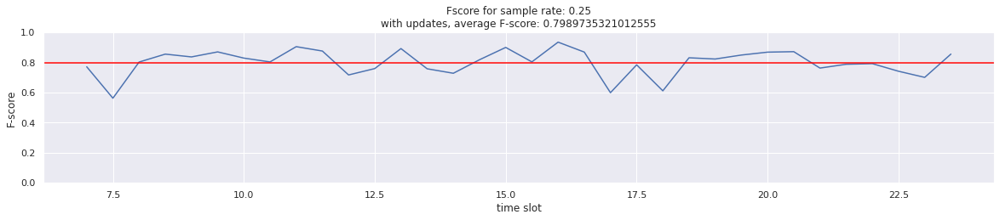

In [ ]:
fig = plt.figure(figsize=(20, 15))
list_time = np.arange(7,24,0.5)
average_fscore_list_fri_no = np.mean(fscore_list_fri_no)
ax = fig.add_subplot(prob_row, prob_col, order+cnt)
title = 'Fscore for sample rate: ' + str(list_prob[i]) + '\n' + 'with updates, average F-score: ' + str(average_fscore_list_fri_no)
ax.set_title(title)
ax.plot(list_time, np.reshape(fscore_list_fri_no[i],(34,)), 'b')
# ax.legend(loc = 'lower right')
# ax.plot([0, 1], [0, 1],'r--')
ax.axhline(average_fscore_list_fri_no,color='red')
ax.set_xlim()
ax.set_ylim([0, 1])
ax.set_ylabel('F-score')
ax.set_xlabel('time slot')

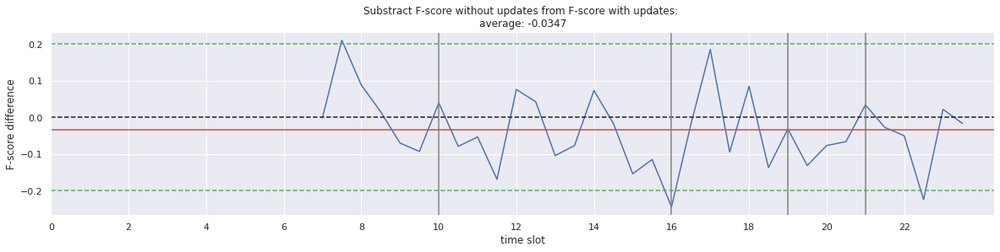

In [ ]:
# fscore_list_mon_adjust = np.reshape(fscore_list_mon_adjust,(34,))
# fscore_list_mon = np.reshape(fscore_list_mon,(34,))
fscore_list_fri_dif = np.subtract(fscore_list_fri_yes, fscore_list_fri_no)
fscore_list_fri_dif = np.reshape(fscore_list_fri_dif, (34,))
# print(fscore_list_mon)
# print(fscore_mon)

fig = plt.figure(figsize=(20, 4))
list_time = np.arange(7,24,0.5)
average_fscore_fri_dif = np.mean(fscore_list_fri_dif)
title = 'Substract F-score without updates from F-score with updates: ' + '\n' + 'average: ' + str(round(average_fscore_fri_dif,4))
plt.title(title)
plt.plot(list_time, fscore_list_fri_dif, 'b')
plt.axhline(y=0, color='k', ls='--')
plt.axhline(y=0.2, color='g', ls='--')
plt.axhline(y=-0.2, color='g', ls='--')
plt.axhline(y=average_fscore_fri_dif, color='r')
plt.axvline(x=10, color='grey')
plt.axvline(x=16, color='grey')
plt.axvline(x=19, color='grey')
plt.axvline(x=21, color='grey')
# ax.legend(loc = 'lower right')
# ax.plot([0, 1], [0, 1],'r--')
plt.xlim()
plt.xticks(np.arange(0,24,2))
# plt.ylim([0, 1])
plt.ylabel('F-score difference')
plt.xlabel('time slot')
plt.show()

In [ ]:

def f_score_points_in_rect_duplicate(true_rects, list_rect, points):
    '''
        list_rect: list - Rectangles
        input_obj: object with format (n,d,k,cluster_points), cluster_points - (diemension, coords, cluster_label)

        return -- float, accuracy
    '''
    # points = input_obj.cluster_points
    label = np.array([points[idx].cluster_label for idx in range(len(points))])
    # print(np.unique(label))
    # label_points = []
    # noise_points = []
    # for idx in range(len(points)):
    #     if points[idx].cluster_label==-1:
    #         noise_points.append(points[idx])
    #     else:
    #         label_points.append(points[idx])
    # points = [points[idx] for idx in range(len(points)) if points[idx]!=-1]
    # cluster_coords = np.array([np.array(label_points[idx].coords) for idx in range(len(label_points))])
    # noise_coords = np.array([np.array(noise_points[idx].coords) for idx in range(len(noise_points))])
    n_points = len(points)
    coords = np.array([np.array(points[idx].coords) for idx in range(n_points)])
    
    # the points in the predicted rectangle
    predicted_points = points_in_rect(list_rect, points)
    set_predicted_points = set(map(tuple, predicted_points))

    # all the points that are clusterd
    set_all_points = set(map(tuple, coords))

    # all the actual positive points
    true_points = points_in_rect(true_rects, points)
    set_true_points = set(map(tuple, true_points))

    # the points outside of the predicted rectangle
    negative_points = set_all_points - set_true_points
    # print('negative points:',len(negative_points),'= all points:',len(set_all_points),'- actual positive points:',len(set_true_points))
    
    # true positive
    tp_set = set_true_points & set_predicted_points
    # tp_list = list(map(list, tp_set))
    n_tp = len(tp_set)
    # print('true positvie points:',n_tp,'= actual positive points:',len(set_true_points),'& predicted points:',len(set_predicted_points))

    # false negative
    fn_set = set_true_points - set_predicted_points
    # fn_list = list(map(list, fn_set))
    n_fn = len(fn_set)
    # print('false positvie points:',n_fn,'= all actual positive points:',len(set_true_points),'- true positive points:',n_tp)
    
    # false positive
    fp_set = set_predicted_points & negative_points
    # fp_list = list(map(list, fp_set))
    n_fp = len(fp_set)
    # print('false positvie points:',n_fp,'= negative points:',len(negative_points),'& predicted points:',len(set_predicted_points))

    # precision = tp / (tp + fp)
    if n_tp + n_fp == 0 :
        precision = 0
    else: precision = n_tp / len(predicted_points)
    # print(precision, n_tp, n_fp)
    
    # recall = tp / (tp + fn)
    if (n_tp + n_fn) == 0:
        recall = 0
    else: recall = n_tp / len(true_points)
    # print(recall, n_tp, n_fn)

    # f_score = 2 * (p*r)/(p+r)
    if precision + recall == 0:
        f_score = 0
    else: f_score = 2 * ((precision*recall) / (precision+recall))

    return f_score, precision, recall

In [ ]:
from IPython.display import clear_output

def rectangle_set_list(n_samples, a, rctgs, datetime, interval):
    '''
        n_samples: int, number of points
        a: int list, the probability to be in the smaller rectangles
        rctgs: list of rectangles of class Rectangle, the first one is the biggest one
        datetime: datetime, 'yyyy-mm-dd hh:mm:ss'
        interval: int, the lasting time (e.g. 12 hours) from the starting time (i.e. date)
    '''
    list_points = []
    d = 2

    # insert 0 at the beginning and 1 at the end
    a = [0] + a
    for i in range(1, len(a)):
        a[i] = a[i-1] + a[i]

    for j in range(n_samples):
        b = np.random.uniform(0,1)        # Generate a random float from 0 to 1
        for i in range(len(a)-1):
            if a[i] < b <= a[i+1]:
                tmp_rctg = rctgs[i]
                x = np.random.uniform(low=tmp_rctg.x_min, high=tmp_rctg.x_min+tmp_rctg.width)
                y = np.random.uniform(low=tmp_rctg.y_min, high=tmp_rctg.y_min+tmp_rctg.height)
                hour_low = datetime.hour
                hour = np.random.randint(low=hour_low, high=hour_low+interval)
                year, month, day = datetime.year, datetime.month, datetime.day
                minute = np.random.randint(low=0, high=59)
                second = np.random.randint(low=0, high=59)
                day_month = day_of_month(year, month)
                if hour >= 24:
                    hour = hour % 24
                    if day<day_month:
                        day = day + 1
                    else:
                        day = (day + 1) % day_month
                # date_str = str(year)+'-'+str(month).zfill(2)+'-'+str(day).zfill(2)+' '+str(hour).zfill(2)+':'+str(minute).zfill(2)+':'+str(second).zfill(2)
                date_generated = dt.date(year, month, day)
                time_generated = dt.time(hour, minute, second)
                datetime_generated = dt.datetime.combine(date_generated, time_generated)
                list_points.append(ClusterPoint(d, [x,y],ID=j,datetime=datetime_generated,type_point='Rect'))
                break
    return list_points

def n_type_of_points_in_rectangle(rects, points, type_req):
    '''
        p: one point of format (diemension, coords, cluster_label)
        q: one point of format (diemension, coords, cluster_label)
        points: list of points of format (diemension, coords, cluster_label)
    '''
    cnt = 0
    for i in range(len(points)):
        x,y = points[i].coords
        for r in rects:
            xl = r.x_min
            xr = r.x_max
            yl = r.y_min
            yr = r.y_max
            if xl <= x <= xr and yl <= y <= yr and points[i].type_point==type_req:
                cnt += 1
                break
    return cnt

def generate_bg_list(df):
    n, d = len(df.index), 2
    list_points = []
    for j in range(n):
        x, y = df.iloc[j,-4], df.iloc[j,-3]
        datetime_generated = df.iloc[j,1]
        list_points.append(ClusterPoint(d, [x,y], ID=j, datetime=datetime_generated,type_point='taxi'))
    return list_points

def run_cluster_taxi_and_rect_prob(bg):
    """
    Reads the input set, clusters the points and writes to output

    :param path_in:     location of the input set
    :param path_out:    location to print the output
    """
    # Step 1: read file and create box graph
    # bg = taxi_set(epsilon, min_pts)
    print('number of points:',len(bg.points))
    
    # Step 2: Compute the core points
    find_core_points(bg)

    # Step 3: cluster the core points
    nr_clusters = compute_cluster_cores(bg)

    # Step 4: assign border points to clusters
    assign_border_points(bg)
    
    # points = bg.points
    # plot_clusters_taxi(points)

    # print("Cluster counter:", nr_clusters, file=sys.stderr)

def plot_sliding_window_taxi_and_rect_multi_prob(df, begin_date, interval, w, column, eps, mpt, list_prob=[0.2], unit='minute'):
    '''
        df: dataframes
        begin_date: datetime
        interval: int, the window move to begin_time+interval next time
        w: int, the size of the sliding window
        unit: string, the unit of the sliding window
        column: string, the name of the required column

        only plot, not return
    '''

    rect_1 = Rectangle(130, 600, 30, 30)
    rect_2 = Rectangle(250, 550, 40, 40)
    rctgs = [rect_1, rect_2]

    date = dt.date(2015,1,10)
    time = dt.time(7,0,0)
    datetime = dt.datetime.combine(date,time)

    rect_set_list = rectangle_set_list(3000, [0.5,0.5], rctgs, datetime, interval)
    
    start_time = begin_date

    after_start_date = df[column] >= start_time
    before_end_date = df[column] < start_time + dt.timedelta(minutes=w)
    between_two_dates = after_start_date & before_end_date
    # filtered_df = df.loc[between_two_dates]
    origin_filtered_df = df.loc[between_two_dates]

    # choose it with probability
    fscore_list = []
    time_cost_list = []
    for prob in list_prob:
        index_list = []
        fscore_for_one_prob = []
        time_cost_for_each = []
        filtered_df = origin_filtered_df
        n_samples = len(filtered_df.index)
        for j in range(n_samples):
            b = np.random.uniform(0,1)        # Generate a random float from 0 to 1
            if b <= prob:
                index_list.append(j)
        sampled_df = filtered_df.iloc[np.array(index_list)]

        # initializing the window
        init_df = TimeWindow(w, start_time, sampled_df)
        filtered_tw = init_df
        latest_window = filtered_tw.window

        #  plot Numerical Data
        row = 4  # number of rows
        n_col = 6  # number of columns
        order = 1  # initialize plot counter
        cnt = 0

        im = plt.imread('manhattan.png')
        dpi = 80
        height, width, depth = im.shape
        figsize = width / float(dpi), height / float(dpi)
        
        update_start_time = start_time
        # fig.suptitle('DBSCAN using box graph with epsilon and minPts')
        
        # generate the boxgraph for the window and run DBSCAN
        for _ in range(34):

            import time
            time_cost_start = time.time()
            
            # temp_point_list = generate_bg_list(latest_window) + rect_set_list
            # temp_bg = BoxGraph(len(temp_point_list), 2, eps, int(mpt*prob), temp_point_list)
            temp_taxi_list = generate_bg_list(latest_window)
            temp_bg, rect_set_list = generate_data_set(temp_taxi_list, 3000, [0.5,0.5], rctgs, begin_date, interval, eps, int(mpt*prob), prob)
            # temp_bg = generate_data_set(latest_window, rect_set_list, eps, int(mpt*prob))
            print('the eps and mpt of boxgraph:', temp_bg.eps, temp_bg.min_pts)
            run_cluster_taxi_and_rect_prob(temp_bg)
            points = temp_bg.points

            X_prob = [np.array(points[i].coords) for i in range(len(points))]
            X_prob = np.array(X_prob)
            label_prob = [points[i].cluster_label for i in range(len(points))]
            label_prob = np.array(label_prob)
            colors = ['#'+("%06x" % random.randint(0, 0xFFFFFF)).upper() for _ in range(len(label_prob))]

            # label = [points[i].cluster_label for i in range(len(points))]
            # label = np.array(label)

            df_not_prob = rect_set_list + temp_taxi_list
            X = [np.array(df_not_prob[i].coords) for i in range(len(df_not_prob))]
            X = np.array(X)
            label = [df_not_prob[i].cluster_label for i in range(len(df_not_prob))]
            label = np.array(label)
            
            # cmap = plt.get_cmap('gnuplot')
            # colors = [cmap(i) for i in np.linspace(0, 1, len(label))]
            
            # ax = fig.add_subplot(row, n_col, order+cnt)
            fig = plt.figure(figsize=figsize)
            ax = fig.add_axes([0, 0, 1, 1])
            cnt += 1
            ax.imshow(im, cmap='gray')
            implot = plt.imshow(im)
            ax.axis('off')

            # for idx, col in enumerate(colors):
            #     # print(idx, col)
            #     cluster_data = label == idx
            #     dots = ax.scatter(X[cluster_data, 0], X[cluster_data, 1],
            #                 c=col, marker='.', s=10)
            # dots = ax.scatter(X[:, 0], X[:, 1],
            #                 marker='.', s=10)

            # currentAxis = plt.gca()
            # big_rect = rctgs[-1]
            cluster_rect = []
            for idx in range(1,len(np.unique(label_prob))+1):
                cluster_data = label_prob == idx
                # print(len(cluster_data),np.unique(cluster_data))
                if np.any(cluster_data):
                    left, right = np.min(X_prob[cluster_data,0]), np.max(X_prob[cluster_data,0])
                    bottom, top = np.min(X_prob[cluster_data,1]), np.max(X_prob[cluster_data,1])
                    width, height = abs(right-left), abs(top-bottom)
                    # currentAxis.add_patch(patches.Rectangle((left, bottom), width, height, linewidth=1, edgecolor='b', fill=None))
                    temp_rect = Rectangle(0.5*(left+right), 0.5*(top+bottom), width, height)
                    cluster_rect.append(temp_rect)

            k_rects, average_density = dense_rectangle(df_not_prob, cluster_rect)
            # print(len(k_rects), average_density)
            points_in_rects = np.array(points_in_rect(k_rects, df_not_prob))
            n_rect_points = n_type_of_points_in_rectangle(k_rects, df_not_prob, 'Rect')
            n_taxi_points = n_type_of_points_in_rectangle(k_rects, df_not_prob, 'taxi')
            f_score, _, _ = f_score_points_in_rect_duplicate(rctgs, k_rects, df_not_prob)
            fscore_for_one_prob.append(f_score)
            f_socre = round(f_score, 4)

            # ax.scatter(X[:,0], X[:,1], s=2, c='grey')

            for r in k_rects:
                ax.add_patch(patches.Rectangle((r.x-r.width/2, r.y-r.height/2), r.width, r.height, linewidth=2, edgecolor='r', fill=None))
            for r in rctgs:
                ax.add_patch(patches.Rectangle((r.x-r.width/2, r.y-r.height/2), r.width, r.height, linewidth=1, edgecolor='b', fill=None))

            if len(points_in_rects)>0:
                x, y = points_in_rects[:, 0], points_in_rects[:, 1]
                ax.plot(x, y, 'r.', markersize=2)
                ax.plot(X_prob[:, 0], X_prob[:, 1], 'g.', markersize=2)
                from pandas import DataFrame
                pos = []
                for i in range(len(x)):
                    pos.append([x[i], y[i]])
                df_predicted = DataFrame (pos,columns=['pos_x','pos_y'])
                contour = sns.kdeplot(data=df_predicted, x='pos_x', y='pos_y', fill=True)
                contour.collections[0].set_alpha(0)

            title_1 = str(update_start_time)+' to '+str(update_start_time+ dt.timedelta(minutes=w)) + ' \n'
            title_2 = 'sample rate:' + str(prob) + '\n'
            title_3 = 'f_score: ' + str(f_score) + '\n'
            title_4 = 'number of clusters: '+str(len(cluster_rect)) + '\n'
            title_5 = 'number of original taxi data points: ' + str(n_taxi_points) + '\n'
            title_6 = 'number of generated rect data points: ' + str(n_rect_points)
            title_str = title_1 + title_3 + title_4 + title_5 + title_6
            plt.title(title_str)
            update_start_time += dt.timedelta(minutes=interval)
            
            # Hide spines, ticks, etc.
            ax.axis('off')

            # plt.scatter(core_points[:,0], core_points[:,1], c='b', s=50)
            # plt.title("DBScan clustering")
            # plt.xticks([])
            # plt.yticks([])

            filtered_tw = filtered_tw.sliding_with_prob(interval, df, column, prob)
            latest_window = filtered_tw.window
            filtered_df_tw = TimeWindow(w, update_start_time, filtered_df)
            filtered_df_tw = filtered_df_tw.sliding(interval, df, column)
            filtered_df = filtered_df_tw.window

            import time
            time_cost_end = time.time()
            time_cost = time_cost_end - time_cost_start
            time_cost_for_each.append(time_cost)

        fscore_list.append(np.array(fscore_for_one_prob))
        time_cost_list.append(np.array(time_cost_for_each))
    
    fscore_list = np.array(fscore_list)
    time_cost_list = np.array(time_cost_list)
    return fscore_list, time_cost_list
        
if __name__ == '__main__':
    list_prob = [1/2,1/4,1/8,1/16,1/32,1/64]    
    fscore_list, time_cost_list = plot_sliding_window_taxi_and_rect_multi_prob(data_sat, s_datetime, 30, 60, 'tpep_pickup_datetime', 45, 590, list_prob)
    prob_row = 1
    prob_col = len(list_prob)
    order = 1
    cnt = 0

    fig = plt.figure(figsize=(20, 5))
    list_time = np.arange(7,24,0.5)
    for i in range(len(list_prob)):
        ax = fig.add_subplot(prob_row, prob_col, order+cnt)
        title = 'Fscore for sample rate: ' + str(list_prob[i])
        ax.set_title(title)
        ax.plot(list_time, fscore_list[i], 'b')
        # ax.legend(loc = 'lower right')
        # ax.plot([0, 1], [0, 1],'r--')
        ax.set_xlim()
        ax.set_ylim([0, 1])
        ax.set_ylabel('F-score')
        ax.set_xlabel('time slot')
        cnt += 1

    fig = plt.figure(figsize=(8, 5))
    ax = fig.add_subplot(2, 1, 1)
    ax.set_title('F-score for different sample rate')
    average_fscore = np.mean(fscore_list, axis=1)
    plt.plot(list_prob, average_fscore, 'b')
    # plt.legend(loc = 'lower right')
    # plt.plot([0, 1], [0, 1],'r--')
    ax.set_xlim([0, 0.5])
    ax.set_ylim([0, 1])
    ax.set_ylabel('F-score')
    ax.set_xlabel('sample rate')

    fig = plt.figure(figsize=(8, 5))
    ax = fig.add_subplot(2, 1, 2)
    ax.set_title('F-score for different sample rate')
    average_time_cost = np.mean(time_cost_list, axis=1)
    plt.plot(list_prob, average_time_cost, 'b')
    # plt.legend(loc = 'lower right')
    # plt.plot([0, 1], [0, 1],'r--')
    ax.set_xlim([0, 0.5])
    ax.set_ylim()
    ax.set_ylabel('time_cost')
    ax.set_xlabel('sample rate')

    plt.show()

Output hidden; open in https://colab.research.google.com to view.

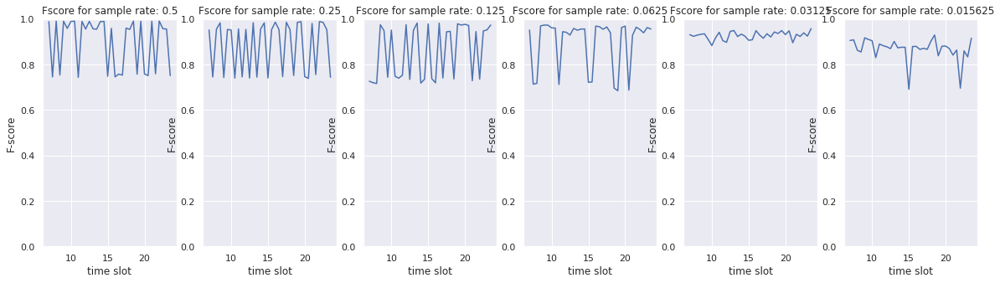

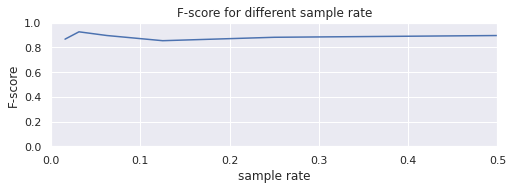

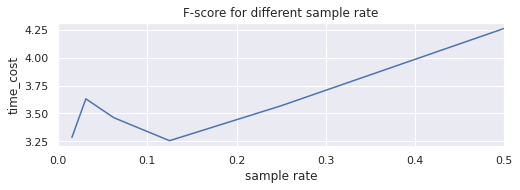

In [ ]:
prob_row = 1
prob_col = len(list_prob)
order = 1
cnt = 0
fig = plt.figure(figsize=(20, 5))
list_time = np.arange(7,24,0.5)
for i in range(len(list_prob)):
    ax = fig.add_subplot(prob_row, prob_col, order+cnt)
    title = 'Fscore for sample rate: ' + str(list_prob[i])
    ax.set_title(title)
    ax.plot(list_time, fscore_list[i], 'b')
    # ax.legend(loc = 'lower right')
    # ax.plot([0, 1], [0, 1],'r--')
    ax.set_xlim()
    ax.set_ylim([0, 1])
    ax.set_ylabel('F-score')
    ax.set_xlabel('time slot')
    cnt += 1

fig = plt.figure(figsize=(8, 5))
ax = fig.add_subplot(2, 1, 1)
ax.set_title('F-score for different sample rate')
average_fscore = np.mean(fscore_list, axis=1)
plt.plot(list_prob, average_fscore, 'b')
# plt.legend(loc = 'lower right')
# plt.plot([0, 1], [0, 1],'r--')
ax.set_xlim([0, 0.5])
ax.set_ylim([0, 1])
ax.set_ylabel('F-score')
ax.set_xlabel('sample rate')

fig = plt.figure(figsize=(8, 5))
ax = fig.add_subplot(2, 1, 2)
ax.set_title('running time(s) for different sample rate')
average_time_cost = np.mean(time_cost_list, axis=1)
plt.plot(list_prob, average_time_cost, 'b')
# plt.legend(loc = 'lower right')
# plt.plot([0, 1], [0, 1],'r--')
ax.set_xlim([0, 0.5])
ax.set_ylim()
ax.set_ylabel('time_cost')
ax.set_xlabel('sample rate')

plt.show()

the eps and mpt of boxgraph: 45 147
number of points: 5478
the eps and mpt of boxgraph: 45 147
number of points: 6051
the eps and mpt of boxgraph: 45 147
number of points: 6309
the eps and mpt of boxgraph: 45 147
number of points: 6362
the eps and mpt of boxgraph: 45 147
number of points: 6073
the eps and mpt of boxgraph: 45 147
number of points: 5645
the eps and mpt of boxgraph: 45 147
number of points: 5316
the eps and mpt of boxgraph: 45 147
number of points: 5147
the eps and mpt of boxgraph: 45 147
number of points: 5139
the eps and mpt of boxgraph: 45 147
number of points: 5525
the eps and mpt of boxgraph: 45 147
number of points: 5595
the eps and mpt of boxgraph: 45 147
number of points: 5359
the eps and mpt of boxgraph: 45 147
number of points: 5486
the eps and mpt of boxgraph: 45 147
number of points: 5679
the eps and mpt of boxgraph: 45 147
number of points: 5805
the eps and mpt of boxgraph: 45 147
number of points: 5985
the eps and mpt of boxgraph: 45 147
number of points: 56

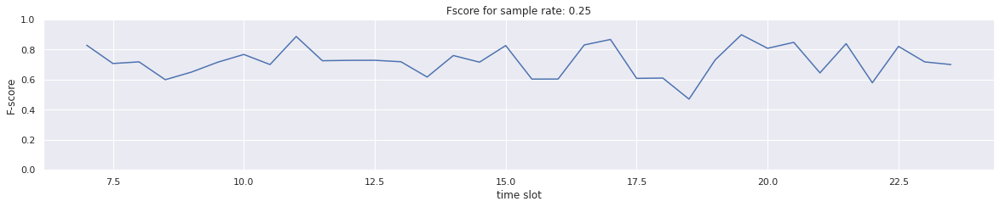

In [ ]:
from IPython.display import clear_output

def rectangle_set_list(n_samples, a, rctgs, datetime, interval):
    '''
        n_samples: int, number of points
        a: int list, the probability to be in the smaller rectangles
        rctgs: list of rectangles of class Rectangle, the first one is the biggest one
        datetime: datetime, 'yyyy-mm-dd hh:mm:ss'
        interval: int, the lasting time (e.g. 12 hours) from the starting time (i.e. date)
    '''
    list_points = []
    d = 2

    # insert 0 at the beginning and 1 at the end
    a = [0] + a
    for i in range(1, len(a)):
        a[i] = a[i-1] + a[i]

    for j in range(n_samples):
        b = np.random.uniform(0,1)        # Generate a random float from 0 to 1
        for i in range(len(a)-1):
            if a[i] < b <= a[i+1]:
                tmp_rctg = rctgs[i]
                x = np.random.uniform(low=tmp_rctg.x_min, high=tmp_rctg.x_min+tmp_rctg.width)
                y = np.random.uniform(low=tmp_rctg.y_min, high=tmp_rctg.y_min+tmp_rctg.height)
                hour_low = datetime.hour
                hour = np.random.randint(low=hour_low, high=hour_low+interval)
                year, month, day = datetime.year, datetime.month, datetime.day
                minute = np.random.randint(low=0, high=59)
                second = np.random.randint(low=0, high=59)
                day_month = day_of_month(year, month)
                if hour >= 24:
                    hour = hour % 24
                    if day<day_month:
                        day = day + 1
                    else:
                        day = (day + 1) % day_month
                # date_str = str(year)+'-'+str(month).zfill(2)+'-'+str(day).zfill(2)+' '+str(hour).zfill(2)+':'+str(minute).zfill(2)+':'+str(second).zfill(2)
                date_generated = dt.date(year, month, day)
                time_generated = dt.time(hour, minute, second)
                datetime_generated = dt.datetime.combine(date_generated, time_generated)
                list_points.append(ClusterPoint(d, [x,y],ID=j,datetime=datetime_generated,type_point='Rect'))
                break
    return list_points

def n_type_of_points_in_rectangle(rects, points, type_req):
    '''
        p: one point of format (diemension, coords, cluster_label)
        q: one point of format (diemension, coords, cluster_label)
        points: list of points of format (diemension, coords, cluster_label)
    '''
    cnt = 0
    for i in range(len(points)):
        x,y = points[i].coords
        for r in rects:
            xl = r.x_min
            xr = r.x_max
            yl = r.y_min
            yr = r.y_max
            if xl <= x <= xr and yl <= y <= yr and points[i].type_point==type_req:
                cnt += 1
                break
    return cnt

def generate_bg_list(df):
    n, d = len(df.index), 2
    list_points = []
    for j in range(n):
        x, y = df.iloc[j,-4], df.iloc[j,-3]
        datetime_generated = df.iloc[j,1]
        list_points.append(ClusterPoint(d, [x,y], ID=j, datetime=datetime_generated,type_point='taxi'))
    return list_points

def run_cluster_taxi_and_rect_prob(bg):
    """
    Reads the input set, clusters the points and writes to output

    :param path_in:     location of the input set
    :param path_out:    location to print the output
    """
    # Step 1: read file and create box graph
    # bg = taxi_set(epsilon, min_pts)
    print('number of points:',len(bg.points))
    
    # Step 2: Compute the core points
    find_core_points(bg)

    # Step 3: cluster the core points
    nr_clusters = compute_cluster_cores(bg)

    # Step 4: assign border points to clusters
    assign_border_points(bg)
    
    # points = bg.points
    # plot_clusters_taxi(points)

    # print("Cluster counter:", nr_clusters, file=sys.stderr)

def generate_data(taxi_df, rects, eps, mpt, prob=1):
    """
    Reads the input set, clusters the points and writes to output

    :param path_in:     location of the input set
    :param path_out:    location to print the output
    """
    # Step 1: read file and create box graph
    taxis = generate_bg_list(taxi_df)
    # rects = rectangle_set_list(n_points, a, rctgs, datetime, interval)
    if prob < 1:
        rect_prob = []
        for j in range(len(rects)):
            b = np.random.uniform(0,1)        # Generate a random float from 0 to 1
            if b <= prob:
                rect_prob.append(rects[j])
    else: rect_prob = rects
    data_list = taxis + rect_prob
    bg = BoxGraph(len(data_list), 2, eps, mpt, data_list)

    # Step 2: Compute the core points
    find_core_points(bg)

    # Step 3: cluster the core points
    nr_clusters = compute_cluster_cores(bg)

    # Step 4: assign border points to clusters
    assign_border_points(bg)

    return bg

def generate_data_set(taxis, n_points, a, rctgs, datetime, interval, eps, mpt, prob=1):
    """
    Reads the input set, clusters the points and writes to output

    :param path_in:     location of the input set
    :param path_out:    location to print the output
    """
    # Step 1: read file and create box graph
    # taxis = generate_bg_list(taxi_df)
    rects = rectangle_set_list(n_points, a, rctgs, datetime, interval)
    if prob < 1:
        rect_prob = []
        for j in range(len(rects)):
            b = np.random.uniform(0,1)        # Generate a random float from 0 to 1
            if b <= prob:
                rect_prob.append(rects[j])
    else: rect_prob = rects
    data_list = taxis + rect_prob
    bg = BoxGraph(len(data_list), 2, eps, mpt, data_list)

    # Step 2: Compute the core points
    find_core_points(bg)

    # Step 3: cluster the core points
    nr_clusters = compute_cluster_cores(bg)

    # Step 4: assign border points to clusters
    assign_border_points(bg)

    return bg, rects


def find_optimal_eps_mpt(taxi_df, rect_list, rctgs, prob):

    # fig = plt.figure(figsize=(30, 50))
    # fig.tight_layout()
    # plt.subplots_adjust(wspace=0,hspace=1)
    # fig.suptitle('DBSCAN using box graph with epsilon and minPts')

    min_area = 4
    lambda_eps, gamma_mpt = 0.1, 0.2
    min_area_r = math.sqrt(min_area/math.pi) 
    min_pow_eps = lambda_eps * math.log(min_area_r,1+lambda_eps)     # math.log(x, base)

    w_image, h_image = 471, 907
    z = max(w_image, h_image)
    max_pow_eps = math.log(z, 1+lambda_eps)
    pow_eps = np.array(range(int(min_pow_eps), int(max_pow_eps)+1, 10))
    # epsilons = list(range(int((1+lambda_eps)**min_pow_eps), int((1+lambda_eps)**max_pow_eps)+1))
    epsilon_list = (1+lambda_eps)**pow_eps
    epsilon_list = [epsilon_list[4]]

    # n = 2000
    # a = [0.5, 0.5]
    
    # rect_1 = Rectangle(130, 600, 30, 30)
    # rect_2 = Rectangle(250, 550, 40, 40)
    # rctgs = [rect_1, rect_2]

    # date = dt.date(2015,1,10)
    # time = dt.time(7,0,0)
    # datetime = dt.datetime.combine(date,time)

    # interval = 13

    max_avg_dens = 0
    eps_max_dens, mpt_max_dens = 0,0
    max_fscore = 0
    eps_max_fscore, mpt_max_fscore = 0,0

    #  plot Numerical Data
    row = len(epsilon_list) * 2  # number of rows
    column = 6  # number of columns
    order = 1  # initialize plot counter
    cnt = 0

    for eps in epsilon_list:
        # bg = taxi_set_and_random_rectangle(n_samples, a, rctgs, datetime, interval, eps)
        # points = generate_bg_list(data_oneday) + rect_set_list
        n_points = len(rect_list) + len(taxi_df.index)
        max_pow_mpt = math.log(n_points, 1+gamma_mpt)
        min_pts_pow_list = np.array(range(0,int(max_pow_mpt)+1,5))
        min_pts_list = (1+gamma_mpt)**min_pts_pow_list
        for mpt in min_pts_list:      
            import time as tm
            start = tm.time()
            # bg = BoxGraph(n_points, 2, eps, mpt, data_list) 
            # print('eps, mpt:', eps, mpt)
            bg = generate_data(taxi_df, rect_list, eps, mpt, prob)
            points = bg.points

            label = [p.cluster_label for p in points]
            label = np.array(label)

            colors = ['#'+("%06x" % random.randint(0, 0xFFFFFF)).upper() for _ in range(len(np.unique(label)))]
            
            # print(len(np.unique(label)), 'labels:', np.unique(label))
            # print('the first 5 labels:', np.unique(label))
            X = [np.array(points[i].coords) for i in range(len(points))]
            X = np.array(X)
            # print('number of coords:', len(X))
            # print('the first 5 coords:', X[:5])

            # ax_im = fig.add_subplot(row, column, order+cnt)
            # cnt += 1
            # # Hide spines, ticks, etc.
            # ax_im.axis('off')
            # ax_im.imshow(im, cmap='gray')
            # implot = plt.imshow(im)

            # for idx, col in enumerate(colors,1):
            #     # print(idx, col)
            #     cluster_data = label == idx
            #     ax_im.scatter(X[cluster_data, 0], X[cluster_data, 1],
            #                 c=col, marker='.', s=10)
            
            # currentAxis = plt.gca()
            # big_rect = rctgs[-1]
            cluster_rect = []
            unique_label = np.unique(label)
            # unique_label = unique_label[unique_label != -1]
            # for idx, lbl in enumerate(np.unique(label),1):
            for idx in range(1,len(unique_label)+1):
                cluster_data = label == idx
                if np.any(cluster_data):
                    left, right = np.min(X[cluster_data,0]), np.max(X[cluster_data,0])
                    bottom, top = np.min(X[cluster_data,1]), np.max(X[cluster_data,1])
                    width, height = abs(right-left), abs(top-bottom)
                    # currentAxis.add_patch(patches.Rectangle((left, bottom), width, height, linewidth=1, edgecolor='b', fill=None))
                    temp_rect = Rectangle(0.5*(left+right), 0.5*(top+bottom), width, height)
                    # print(left, right, top,bottom)
                    # print('x:',temp_rect.x,'y:',temp_rect.y, temp_rect.x_min )
                    cluster_rect.append(temp_rect)
            
            # print('number of clusters:', len(cluster_rect))
            average_density = 0
            f_score = 0
            n_taxi_points = n_rect_points = 0
            if len(cluster_rect)>0:
                # print('number of clusters:',len(cluster_rect))
                k_rects, k_density = dense_rectangle(points, cluster_rect, 3, 1)
                n_rect_points = n_type_of_points_in_rectangle(k_rects, points, 'Rect')
                n_taxi_points = n_type_of_points_in_rectangle(k_rects, points, 'taxi')
                f_score, _, _ = f_score_points_in_rect(rctgs, k_rects, points)
                f_socre = round(f_score, 4)
                if len(k_density)>0: average_density = np.mean(k_density)
                else: average_density = 0
                if average_density > max_avg_dens: 
                    max_avg_dens = average_density
                    eps_max_dens, mpt_max_dens = eps, mpt
                if f_score > max_fscore: 
                    max_fscore = f_score
                    eps_max_fscore, mpt_max_fscore = eps, mpt
            # print('f_score, eps, mpt', f_score, eps, mpt)
            #     for r in k_rects:
            #         currentAxis.add_patch(patches.Rectangle((r.x-r.width/2, r.y-r.height/2), r.width, r.height, linewidth=3, edgecolor='r', fill=None))
            # for r in rctgs:
            #     currentAxis.add_patch(patches.Rectangle((r.x-r.width/2, r.y-r.height/2), r.width, r.height, linewidth=1, edgecolor='b', fill=None))

            # print('the maximum average density:',max_avg_dens)
            end = tm.time()
            cost_time = end - start
            # title_1 = 'epsilon: ' + str(round(eps,2)) + '\n' + 'minPts: ' + str(round(mpt,2)) + '\n'
            # title_2 = 'It takes ' + str(round(cost_time, 4)) + ' seconds.' + '\n'
            # title_3_1 = 'average density: ' + str(round(average_density, 4))+'\n'
            # title_3 = 'f_score: ' + str(f_score) + '\n'
            # title_4 = 'number of clusters: '+str(len(cluster_rect)) + '\n'
            # title_5 = 'taxi data points: ' + str(n_taxi_points) + '\n'
            # title_6 = 'generated rect points: ' + str(n_rect_points)
            # title = title_1 + title_2 + title_3_1 + title_3 + title_4 + title_5 + title_6
            # ax_im.set_title(title)           
            # # ax_im.set_xlabel(xlabel)
            # ax_im.set_xticks([])
            # ax_im.set_yticks([])
            bg = None

    # plt.show()
    # print('maximum average density:', max_avg_dens, ', eps:', eps_max_dens, ', mpt:', mpt_max_dens)
    print('maximum fscore:', max_fscore, ', eps:', eps_max_fscore, ', mpt:', mpt_max_fscore)
    return eps_max_fscore, mpt_max_fscore
    
def plot_sliding_window_taxi_and_rect_multi_prob(df, begin_date, interval, w, column, eps, mpt, list_prob=[0.2], unit='minute'):
    '''
        df: dataframes
        begin_date: datetime
        interval: int, the window move to begin_time+interval next time
        w: int, the size of the sliding window
        unit: string, the unit of the sliding window
        column: string, the name of the required column

        only plot, not return
    '''

    rect_1 = Rectangle(130, 600, 30, 30)
    rect_2 = Rectangle(250, 550, 40, 40)
    rctgs = [rect_1, rect_2]

    rect_set_list = rectangle_set_list(3000, [0.5,0.5], rctgs, begin_date, interval)
    
    start_time = begin_date

    after_start_date = df[column] >= start_time
    before_end_date = df[column] < start_time + dt.timedelta(minutes=w)
    between_two_dates = after_start_date & before_end_date
    # filtered_df = df.loc[between_two_dates]
    origin_filtered_df = df.loc[between_two_dates]

    # choose it with probability
    fscore_list = []
    time_cost_list = []
    for prob in list_prob:
        index_list = []
        fscore_for_one_prob = []
        time_cost_for_each = []
        filtered_df = origin_filtered_df
        n_samples = len(filtered_df.index)
        for j in range(n_samples):
            b = np.random.uniform(0,1)        # Generate a random float from 0 to 1
            if b <= prob:
                index_list.append(j)
        sampled_df = filtered_df.iloc[np.array(index_list)]

        # initializing the window
        init_df = TimeWindow(w, start_time, sampled_df)
        filtered_tw = init_df
        latest_window = filtered_tw.window

        #  plot Numerical Data
        row = 4  # number of rows
        n_col = 6  # number of columns
        order = 1  # initialize plot counter
        cnt = 0

        im = plt.imread('manhattan.png')
        dpi = 80
        height, width, depth = im.shape
        figsize = width / float(dpi), height / float(dpi)
        
        update_start_time = start_time
        # fig.suptitle('DBSCAN using box graph with epsilon and minPts')
        
        # generate the boxgraph for the window and run DBSCAN
        for _ in range(34):

            import time
            time_cost_start = time.time()
            
            # if filtered_tw.start_time == begin_date+dt.timedelta(hours=3) or \
            #     filtered_tw.start_time == begin_date+dt.timedelta(hours=9) or \
            #     filtered_tw.start_time == begin_date+dt.timedelta(hours=12) or \
            #     filtered_tw.start_time == begin_date+dt.timedelta(hours=14):
            #     epsilon, minpts = find_optimal_eps_mpt(latest_window, rect_set_list, rctgs, prob)
            #     eps, mpt = epsilon, minpts

            temp_taxi_list = generate_bg_list(latest_window)
            # temp_bg = BoxGraph(len(temp_point_list), 2, eps, int(mpt*prob), temp_point_list)
            temp_bg, rect_set_list = generate_data_set(temp_taxi_list, 3000, [0.5,0.5], rctgs, begin_date, interval, eps, int(mpt*prob), prob)
            # temp_bg = generate_data_set(latest_window, rect_set_list, eps, int(mpt*prob))
            print('the eps and mpt of boxgraph:', temp_bg.eps, temp_bg.min_pts)
            run_cluster_taxi_and_rect_prob(temp_bg)
            points = temp_bg.points

            X_prob = [np.array(points[i].coords) for i in range(len(points))]
            X_prob = np.array(X_prob)
            label_prob = [points[i].cluster_label for i in range(len(points))]
            label_prob = np.array(label_prob)
            colors = ['#'+("%06x" % random.randint(0, 0xFFFFFF)).upper() for _ in range(len(label_prob))]

            # label = [points[i].cluster_label for i in range(len(points))]
            # label = np.array(label)

            df_not_prob = temp_taxi_list + rect_set_list
            X = [np.array(df_not_prob[i].coords) for i in range(len(df_not_prob))]
            X = np.array(X)
            label = [df_not_prob[i].cluster_label for i in range(len(df_not_prob))]
            label = np.array(label)
            
            # cmap = plt.get_cmap('gnuplot')
            # colors = [cmap(i) for i in np.linspace(0, 1, len(label))]
            
            # # ax = fig.add_subplot(row, n_col, order+cnt)
            # fig = plt.figure(figsize=figsize)
            # ax = fig.add_axes([0, 0, 1, 1])
            # cnt += 1
            # ax.imshow(im, cmap='gray')
            # implot = plt.imshow(im)
            # ax.axis('off')

            # # for idx, col in enumerate(colors):
            # #     # print(idx, col)
            # #     cluster_data = label == idx
            # #     dots = ax.scatter(X[cluster_data, 0], X[cluster_data, 1],
            # #                 c=col, marker='.', s=10)
            # dots = ax.scatter(X[:, 0], X[:, 1],
            #                 marker='.', s=10)

            # currentAxis = plt.gca()
            # big_rect = rctgs[-1]
            cluster_rect = []
            for idx in range(1,len(np.unique(label_prob))+1):
                cluster_data = label_prob == idx
                # print(len(cluster_data),np.unique(cluster_data))
                if np.any(cluster_data):
                    left, right = np.min(X_prob[cluster_data,0]), np.max(X_prob[cluster_data,0])
                    bottom, top = np.min(X_prob[cluster_data,1]), np.max(X_prob[cluster_data,1])
                    width, height = abs(right-left), abs(top-bottom)
                    # currentAxis.add_patch(patches.Rectangle((left, bottom), width, height, linewidth=1, edgecolor='b', fill=None))
                    temp_rect = Rectangle(0.5*(left+right), 0.5*(top+bottom), width, height)
                    cluster_rect.append(temp_rect)

            k_rects, average_density = dense_rectangle(df_not_prob, cluster_rect)
            # print(len(k_rects), average_density)
            points_in_rects = np.array(points_in_rect(k_rects, df_not_prob))
            n_rect_points = n_type_of_points_in_rectangle(k_rects, df_not_prob, 'Rect')
            n_taxi_points = n_type_of_points_in_rectangle(k_rects, df_not_prob, 'taxi')
            f_score, _, _ = f_score_points_in_rect_duplicate(rctgs, k_rects, df_not_prob)
            fscore_for_one_prob.append(f_score)
            f_socre = round(f_score, 4)

            # ax.scatter(X[:,0], X[:,1], s=2, c='grey')

            # for r in k_rects:
            #     ax.add_patch(patches.Rectangle((r.x-r.width/2, r.y-r.height/2), r.width, r.height, linewidth=2, edgecolor='r', fill=None))
            # for r in rctgs:
            #     ax.add_patch(patches.Rectangle((r.x-r.width/2, r.y-r.height/2), r.width, r.height, linewidth=1, edgecolor='b', fill=None))

            # if len(points_in_rects)>0:
            #     x, y = points_in_rects[:, 0], points_in_rects[:, 1]
            #     ax.plot(x, y, 'r.', markersize=2)
            #     from pandas import DataFrame
            #     pos = []
            #     for i in range(len(x)):
            #         pos.append([x[i], y[i]])
            #     df_predicted = DataFrame (pos,columns=['pos_x','pos_y'])
            #     contour = sns.kdeplot(data=df_predicted, x='pos_x', y='pos_y', fill=True)
            #     contour.collections[0].set_alpha(0)

            # title_1 = str(update_start_time)+' to '+str(update_start_time+ dt.timedelta(minutes=w)) + ' \n'
            # title_2 = 'sample rate:' + str(prob) + '\n'
            # title_3 = 'f_score: ' + str(f_score) + '\n'
            # title_4 = 'number of clusters: '+str(len(cluster_rect)) + '\n'
            # title_5 = 'number of original taxi data points: ' + str(n_taxi_points) + '\n'
            # title_6 = 'number of generated rect data points: ' + str(n_rect_points)
            # title_str = title_1 + title_3 + title_4 + title_5 + title_6
            # plt.title(title_str)
            # update_start_time += dt.timedelta(minutes=interval)
            
            # # Hide spines, ticks, etc.
            # ax.axis('off')

            # plt.scatter(core_points[:,0], core_points[:,1], c='b', s=50)
            # plt.title("DBScan clustering")
            # plt.xticks([])
            # plt.yticks([])

            filtered_tw = filtered_tw.sliding_with_prob(interval, df, column, prob)
            latest_window = filtered_tw.window
            filtered_df_tw = TimeWindow(w, update_start_time, filtered_df)
            filtered_df_tw = filtered_df_tw.sliding(interval, df, column)
            filtered_df = filtered_df_tw.window

            import time
            time_cost_end = time.time()
            time_cost = time_cost_end - time_cost_start
            time_cost_for_each.append(time_cost)

        fscore_list.append(np.array(fscore_for_one_prob))
        time_cost_list.append(np.array(time_cost_for_each))
    
    fscore_list = np.array(fscore_list)
    time_cost_list = np.array(time_cost_list)
    return fscore_for_one_prob, time_cost_for_each
        
if __name__ == '__main__':

    date_sat = dt.date(2015,1,10)
    time = dt.time(7,0,0)
    datetime_sat = dt.datetime.combine(date_sat,time)
    date_fri = dt.date(2015,1,9)
    datetime_fri = dt.datetime.combine(date_fri,time)
    date_sun = dt.date(2015,1,11)
    datetime_sun = dt.datetime.combine(date_sun,time)
    date_mon = dt.date(2015,1,12)
    datetime_mon = dt.datetime.combine(date_mon,time)

    list_prob = [1/4]    
    # fscore_list_sat, time_cost_list_sat = plot_sliding_window_taxi_and_rect_multi_prob(data_sat, datetime_sat, 30, 60, 'tpep_pickup_datetime', 45, 590, list_prob)
    # fscore_list_sun, time_cost_list_sun = plot_sliding_window_taxi_and_rect_multi_prob(data_sun, datetime_sun, 30, 60, 'tpep_pickup_datetime', 45, 590, list_prob)
    # fscore_list_fri, time_cost_list_fri = plot_sliding_window_taxi_and_rect_multi_prob(data_fri, datetime_fri, 30, 60, 'tpep_pickup_datetime', 45, 590, list_prob)
    fscore_list_mon, time_cost_list_mon = plot_sliding_window_taxi_and_rect_multi_prob(data_mon, datetime_mon, 30, 60, 'tpep_pickup_datetime', 45, 590, list_prob)
    # fscore_list = [fscore_list_fri, fscore_list_sat, fscore_list_sun, fscore_list_mon]
    fscore_list_mon_no = np.array(fscore_list_mon)
    
    prob_row = 4
    prob_col = 1
    order = 1
    cnt = 0

    fig = plt.figure(figsize=(20, 15))
    list_time = np.arange(7,24,0.5)
    average_fscore_list_mon_no = np.mean(fscore_list_mon_no)
    for i in range(len(list_prob)):
        ax = fig.add_subplot(prob_row, prob_col, order+cnt)
        title = 'Fscore for sample rate: ' + str(list_prob[i]) + '\n' + 'average F-score of Monday: ' + str(average_fscore_list_mon_no)
        ax.set_title(title)
        ax.plot(list_time, fscore_list_mon_no, 'b')
        # ax.legend(loc = 'lower right')
        # ax.plot([0, 1], [0, 1],'r--')
        ax.axhline(average_fscore_list_mon_no, color='red')
        ax.set_xlim()
        ax.set_ylim([0, 1])
        ax.set_ylabel('F-score')
        ax.set_xlabel('time slot')
        cnt += 1

    # fig = plt.figure(figsize=(8, 5))
    # ax = fig.add_subplot(2, 1, 1)
    # ax.set_title('F-score for different sample rate')
    # average_fscore = np.mean(fscore_list, axis=1)
    # plt.plot(list_prob, average_fscore, 'b')
    # # plt.legend(loc = 'lower right')
    # # plt.plot([0, 1], [0, 1],'r--')
    # ax.set_xlim([0, 0.5])
    # ax.set_ylim([0, 1])
    # ax.set_ylabel('F-score')
    # ax.set_xlabel('sample rate')

    # fig = plt.figure(figsize=(8, 5))
    # ax = fig.add_subplot(2, 1, 2)
    # ax.set_title('F-score for different sample rate')
    # average_time_cost = np.mean(time_cost_list, axis=1)
    #  plt.plot(list_prob, average_time_cost, 'b')
    # # plt.legend(loc = 'lower right')
    # # plt.plot([0, 1], [0, 1],'r--')
    # ax.set_xlim([0, 0.5])
    # ax.set_ylim()
    # ax.set_ylabel('time_cost')
    # ax.set_xlabel('sample rate')

    plt.show()

the eps and mpt of boxgraph: 45 147
number of points: 5476
the eps and mpt of boxgraph: 45 147
number of points: 6297
the eps and mpt of boxgraph: 45 147
number of points: 6437
the eps and mpt of boxgraph: 45 147
number of points: 6356
the eps and mpt of boxgraph: 45 147
number of points: 6026
the eps and mpt of boxgraph: 45 147
number of points: 5734
maximum fscore: 0.6643975493533015 , eps: 45.2592555681761 , mpt: 1469.7715679690843
the eps and mpt of boxgraph: 45.2592555681761 367
number of points: 5535
the eps and mpt of boxgraph: 45.2592555681761 367
number of points: 5186
the eps and mpt of boxgraph: 45.2592555681761 367
number of points: 5336
the eps and mpt of boxgraph: 45.2592555681761 367
number of points: 5564
the eps and mpt of boxgraph: 45.2592555681761 367
number of points: 5437
the eps and mpt of boxgraph: 45.2592555681761 367
number of points: 5341
the eps and mpt of boxgraph: 45.2592555681761 367
number of points: 5468
the eps and mpt of boxgraph: 45.2592555681761 367


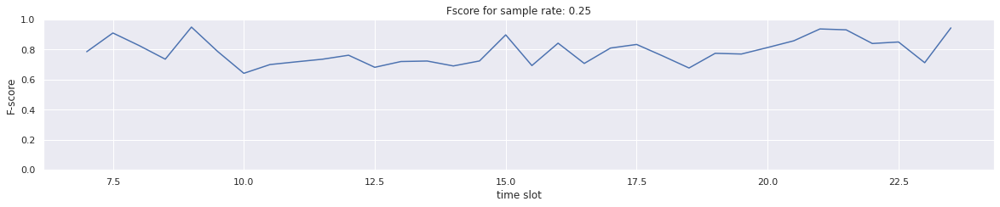

In [ ]:
from IPython.display import clear_output

def rectangle_set_list(n_samples, a, rctgs, datetime, interval):
    '''
        n_samples: int, number of points
        a: int list, the probability to be in the smaller rectangles
        rctgs: list of rectangles of class Rectangle, the first one is the biggest one
        datetime: datetime, 'yyyy-mm-dd hh:mm:ss'
        interval: int, the lasting time (e.g. 12 hours) from the starting time (i.e. date)
    '''
    list_points = []
    d = 2

    # insert 0 at the beginning and 1 at the end
    a = [0] + a
    for i in range(1, len(a)):
        a[i] = a[i-1] + a[i]

    for j in range(n_samples):
        b = np.random.uniform(0,1)        # Generate a random float from 0 to 1
        for i in range(len(a)-1):
            if a[i] < b <= a[i+1]:
                tmp_rctg = rctgs[i]
                x = np.random.uniform(low=tmp_rctg.x_min, high=tmp_rctg.x_min+tmp_rctg.width)
                y = np.random.uniform(low=tmp_rctg.y_min, high=tmp_rctg.y_min+tmp_rctg.height)
                hour_low = datetime.hour
                hour = np.random.randint(low=hour_low, high=hour_low+interval)
                year, month, day = datetime.year, datetime.month, datetime.day
                minute = np.random.randint(low=0, high=59)
                second = np.random.randint(low=0, high=59)
                day_month = day_of_month(year, month)
                if hour >= 24:
                    hour = hour % 24
                    if day<day_month:
                        day = day + 1
                    else:
                        day = (day + 1) % day_month
                # date_str = str(year)+'-'+str(month).zfill(2)+'-'+str(day).zfill(2)+' '+str(hour).zfill(2)+':'+str(minute).zfill(2)+':'+str(second).zfill(2)
                date_generated = dt.date(year, month, day)
                time_generated = dt.time(hour, minute, second)
                datetime_generated = dt.datetime.combine(date_generated, time_generated)
                list_points.append(ClusterPoint(d, [x,y],ID=j,datetime=datetime_generated,type_point='Rect'))
                break
    return list_points

def n_type_of_points_in_rectangle(rects, points, type_req):
    '''
        p: one point of format (diemension, coords, cluster_label)
        q: one point of format (diemension, coords, cluster_label)
        points: list of points of format (diemension, coords, cluster_label)
    '''
    cnt = 0
    for i in range(len(points)):
        x,y = points[i].coords
        for r in rects:
            xl = r.x_min
            xr = r.x_max
            yl = r.y_min
            yr = r.y_max
            if xl <= x <= xr and yl <= y <= yr and points[i].type_point==type_req:
                cnt += 1
                break
    return cnt

def generate_bg_list(df):
    n, d = len(df.index), 2
    list_points = []
    for j in range(n):
        x, y = df.iloc[j,-4], df.iloc[j,-3]
        datetime_generated = df.iloc[j,1]
        list_points.append(ClusterPoint(d, [x,y], ID=j, datetime=datetime_generated,type_point='taxi'))
    return list_points

def run_cluster_taxi_and_rect_prob(bg):
    """
    Reads the input set, clusters the points and writes to output

    :param path_in:     location of the input set
    :param path_out:    location to print the output
    """
    # Step 1: read file and create box graph
    # bg = taxi_set(epsilon, min_pts)
    print('number of points:',len(bg.points))
    
    # Step 2: Compute the core points
    find_core_points(bg)

    # Step 3: cluster the core points
    nr_clusters = compute_cluster_cores(bg)

    # Step 4: assign border points to clusters
    assign_border_points(bg)
    
    # points = bg.points
    # plot_clusters_taxi(points)

    # print("Cluster counter:", nr_clusters, file=sys.stderr)

def generate_data(taxi_df, rects, eps, mpt, prob=1):
    """
    Reads the input set, clusters the points and writes to output

    :param path_in:     location of the input set
    :param path_out:    location to print the output
    """
    # Step 1: read file and create box graph
    taxis = generate_bg_list(taxi_df)
    # rects = rectangle_set_list(n_points, a, rctgs, datetime, interval)
    if prob < 1:
        rect_prob = []
        for j in range(len(rects)):
            b = np.random.uniform(0,1)        # Generate a random float from 0 to 1
            if b <= prob:
                rect_prob.append(rects[j])
    else: rect_prob = rects
    data_list = taxis + rect_prob
    bg = BoxGraph(len(data_list), 2, eps, mpt, data_list)

    # Step 2: Compute the core points
    find_core_points(bg)

    # Step 3: cluster the core points
    nr_clusters = compute_cluster_cores(bg)

    # Step 4: assign border points to clusters
    assign_border_points(bg)

    return bg

def generate_data_set(taxis, n_points, a, rctgs, datetime, interval, eps, mpt, prob=1):
    """
    Reads the input set, clusters the points and writes to output

    :param path_in:     location of the input set
    :param path_out:    location to print the output
    """
    # Step 1: read file and create box graph
    # taxis = generate_bg_list(taxi_df)
    rects = rectangle_set_list(n_points, a, rctgs, datetime, interval)
    if prob < 1:
        rect_prob = []
        for j in range(len(rects)):
            b = np.random.uniform(0,1)        # Generate a random float from 0 to 1
            if b <= prob:
                rect_prob.append(rects[j])
    else: rect_prob = rects
    data_list = taxis + rect_prob
    bg = BoxGraph(len(data_list), 2, eps, mpt, data_list)

    # Step 2: Compute the core points
    find_core_points(bg)

    # Step 3: cluster the core points
    nr_clusters = compute_cluster_cores(bg)

    # Step 4: assign border points to clusters
    assign_border_points(bg)

    return bg, rects


def find_optimal_eps_mpt(taxi_df, rect_list, rctgs, prob):

    # fig = plt.figure(figsize=(30, 50))
    # fig.tight_layout()
    # plt.subplots_adjust(wspace=0,hspace=1)
    # fig.suptitle('DBSCAN using box graph with epsilon and minPts')

    min_area = 4
    lambda_eps, gamma_mpt = 0.1, 0.2
    min_area_r = math.sqrt(min_area/math.pi) 
    min_pow_eps = lambda_eps * math.log(min_area_r,1+lambda_eps)     # math.log(x, base)

    w_image, h_image = 471, 907
    z = max(w_image, h_image)
    max_pow_eps = math.log(z, 1+lambda_eps)
    pow_eps = np.array(range(int(min_pow_eps), int(max_pow_eps)+1, 10))
    # epsilons = list(range(int((1+lambda_eps)**min_pow_eps), int((1+lambda_eps)**max_pow_eps)+1))
    epsilon_list = (1+lambda_eps)**pow_eps
    epsilon_list = [epsilon_list[4]]

    # n = 2000
    # a = [0.5, 0.5]
    
    # rect_1 = Rectangle(130, 600, 30, 30)
    # rect_2 = Rectangle(250, 550, 40, 40)
    # rctgs = [rect_1, rect_2]

    # date = dt.date(2015,1,10)
    # time = dt.time(7,0,0)
    # datetime = dt.datetime.combine(date,time)

    # interval = 13

    max_avg_dens = 0
    eps_max_dens, mpt_max_dens = 0,0
    max_fscore = 0
    eps_max_fscore, mpt_max_fscore = 0,0

    #  plot Numerical Data
    row = len(epsilon_list) * 2  # number of rows
    column = 6  # number of columns
    order = 1  # initialize plot counter
    cnt = 0

    for eps in epsilon_list:
        # bg = taxi_set_and_random_rectangle(n_samples, a, rctgs, datetime, interval, eps)
        # points = generate_bg_list(data_oneday) + rect_set_list
        n_points = len(rect_list) + len(taxi_df.index)
        max_pow_mpt = math.log(n_points, 1+gamma_mpt)
        min_pts_pow_list = np.array(range(0,int(max_pow_mpt)+1,5))
        min_pts_list = (1+gamma_mpt)**min_pts_pow_list
        for mpt in min_pts_list:      
            import time as tm
            start = tm.time()
            # bg = BoxGraph(n_points, 2, eps, mpt, data_list) 
            # print('eps, mpt:', eps, mpt)
            bg = generate_data(taxi_df, rect_list, eps, mpt, prob)
            points = bg.points

            label = [p.cluster_label for p in points]
            label = np.array(label)

            colors = ['#'+("%06x" % random.randint(0, 0xFFFFFF)).upper() for _ in range(len(np.unique(label)))]
            
            # print(len(np.unique(label)), 'labels:', np.unique(label))
            # print('the first 5 labels:', np.unique(label))
            X = [np.array(points[i].coords) for i in range(len(points))]
            X = np.array(X)
            # print('number of coords:', len(X))
            # print('the first 5 coords:', X[:5])

            # ax_im = fig.add_subplot(row, column, order+cnt)
            # cnt += 1
            # # Hide spines, ticks, etc.
            # ax_im.axis('off')
            # ax_im.imshow(im, cmap='gray')
            # implot = plt.imshow(im)

            # for idx, col in enumerate(colors,1):
            #     # print(idx, col)
            #     cluster_data = label == idx
            #     ax_im.scatter(X[cluster_data, 0], X[cluster_data, 1],
            #                 c=col, marker='.', s=10)
            
            # currentAxis = plt.gca()
            # big_rect = rctgs[-1]
            cluster_rect = []
            unique_label = np.unique(label)
            # unique_label = unique_label[unique_label != -1]
            # for idx, lbl in enumerate(np.unique(label),1):
            for idx in range(1,len(unique_label)+1):
                cluster_data = label == idx
                if np.any(cluster_data):
                    left, right = np.min(X[cluster_data,0]), np.max(X[cluster_data,0])
                    bottom, top = np.min(X[cluster_data,1]), np.max(X[cluster_data,1])
                    width, height = abs(right-left), abs(top-bottom)
                    # currentAxis.add_patch(patches.Rectangle((left, bottom), width, height, linewidth=1, edgecolor='b', fill=None))
                    temp_rect = Rectangle(0.5*(left+right), 0.5*(top+bottom), width, height)
                    # print(left, right, top,bottom)
                    # print('x:',temp_rect.x,'y:',temp_rect.y, temp_rect.x_min )
                    cluster_rect.append(temp_rect)
            
            # print('number of clusters:', len(cluster_rect))
            average_density = 0
            f_score = 0
            n_taxi_points = n_rect_points = 0
            if len(cluster_rect)>0:
                # print('number of clusters:',len(cluster_rect))
                k_rects, k_density = dense_rectangle(points, cluster_rect, 3, 1)
                n_rect_points = n_type_of_points_in_rectangle(k_rects, points, 'Rect')
                n_taxi_points = n_type_of_points_in_rectangle(k_rects, points, 'taxi')
                f_score, _, _ = f_score_points_in_rect(rctgs, k_rects, points)
                f_socre = round(f_score, 4)
                if len(k_density)>0: average_density = np.mean(k_density)
                else: average_density = 0
                if average_density > max_avg_dens: 
                    max_avg_dens = average_density
                    eps_max_dens, mpt_max_dens = eps, mpt
                if f_score > max_fscore: 
                    max_fscore = f_score
                    eps_max_fscore, mpt_max_fscore = eps, mpt
            # print('f_score, eps, mpt', f_score, eps, mpt)
            #     for r in k_rects:
            #         currentAxis.add_patch(patches.Rectangle((r.x-r.width/2, r.y-r.height/2), r.width, r.height, linewidth=3, edgecolor='r', fill=None))
            # for r in rctgs:
            #     currentAxis.add_patch(patches.Rectangle((r.x-r.width/2, r.y-r.height/2), r.width, r.height, linewidth=1, edgecolor='b', fill=None))

            # print('the maximum average density:',max_avg_dens)
            end = tm.time()
            cost_time = end - start
            # title_1 = 'epsilon: ' + str(round(eps,2)) + '\n' + 'minPts: ' + str(round(mpt,2)) + '\n'
            # title_2 = 'It takes ' + str(round(cost_time, 4)) + ' seconds.' + '\n'
            # title_3_1 = 'average density: ' + str(round(average_density, 4))+'\n'
            # title_3 = 'f_score: ' + str(f_score) + '\n'
            # title_4 = 'number of clusters: '+str(len(cluster_rect)) + '\n'
            # title_5 = 'taxi data points: ' + str(n_taxi_points) + '\n'
            # title_6 = 'generated rect points: ' + str(n_rect_points)
            # title = title_1 + title_2 + title_3_1 + title_3 + title_4 + title_5 + title_6
            # ax_im.set_title(title)           
            # # ax_im.set_xlabel(xlabel)
            # ax_im.set_xticks([])
            # ax_im.set_yticks([])
            bg = None

    # plt.show()
    # print('maximum average density:', max_avg_dens, ', eps:', eps_max_dens, ', mpt:', mpt_max_dens)
    print('maximum fscore:', max_fscore, ', eps:', eps_max_fscore, ', mpt:', mpt_max_fscore)
    return eps_max_fscore, mpt_max_fscore
    
def plot_sliding_window_taxi_and_rect_multi_prob(df, begin_date, interval, w, column, eps, mpt, list_prob=[0.2], unit='minute'):
    '''
        df: dataframes
        begin_date: datetime
        interval: int, the window move to begin_time+interval next time
        w: int, the size of the sliding window
        unit: string, the unit of the sliding window
        column: string, the name of the required column

        only plot, not return
    '''

    rect_1 = Rectangle(130, 600, 30, 30)
    rect_2 = Rectangle(250, 550, 40, 40)
    rctgs = [rect_1, rect_2]

    rect_set_list = rectangle_set_list(3000, [0.5,0.5], rctgs, begin_date, interval)
    
    start_time = begin_date

    after_start_date = df[column] >= start_time
    before_end_date = df[column] < start_time + dt.timedelta(minutes=w)
    between_two_dates = after_start_date & before_end_date
    # filtered_df = df.loc[between_two_dates]
    origin_filtered_df = df.loc[between_two_dates]

    # choose it with probability
    fscore_list = []
    time_cost_list = []
    for prob in list_prob:
        index_list = []
        fscore_for_one_prob = []
        time_cost_for_each = []
        filtered_df = origin_filtered_df
        n_samples = len(filtered_df.index)
        for j in range(n_samples):
            b = np.random.uniform(0,1)        # Generate a random float from 0 to 1
            if b <= prob:
                index_list.append(j)
        sampled_df = filtered_df.iloc[np.array(index_list)]

        # initializing the window
        init_df = TimeWindow(w, start_time, sampled_df)
        filtered_tw = init_df
        latest_window = filtered_tw.window

        #  plot Numerical Data
        row = 4  # number of rows
        n_col = 6  # number of columns
        order = 1  # initialize plot counter
        cnt = 0

        im = plt.imread('manhattan.png')
        dpi = 80
        height, width, depth = im.shape
        figsize = width / float(dpi), height / float(dpi)
        
        update_start_time = start_time
        # fig.suptitle('DBSCAN using box graph with epsilon and minPts')
        
        # generate the boxgraph for the window and run DBSCAN
        for _ in range(34):

            import time
            time_cost_start = time.time()
            
            if filtered_tw.start_time == begin_date+dt.timedelta(hours=3) or \
                filtered_tw.start_time == begin_date+dt.timedelta(hours=9) or \
                filtered_tw.start_time == begin_date+dt.timedelta(hours=12) or \
                filtered_tw.start_time == begin_date+dt.timedelta(hours=14):
                epsilon, minpts = find_optimal_eps_mpt(latest_window, rect_set_list, rctgs, prob)
                eps, mpt = epsilon, minpts

            temp_taxi_list = generate_bg_list(latest_window)
            # temp_bg = BoxGraph(len(temp_point_list), 2, eps, int(mpt*prob), temp_point_list)
            temp_bg, rect_set_list = generate_data_set(temp_taxi_list, 3000, [0.5,0.5], rctgs, begin_date, interval, eps, int(mpt*prob), prob)
            # temp_bg = generate_data_set(latest_window, rect_set_list, eps, int(mpt*prob))
            print('the eps and mpt of boxgraph:', temp_bg.eps, temp_bg.min_pts)
            run_cluster_taxi_and_rect_prob(temp_bg)
            points = temp_bg.points

            X_prob = [np.array(points[i].coords) for i in range(len(points))]
            X_prob = np.array(X_prob)
            label_prob = [points[i].cluster_label for i in range(len(points))]
            label_prob = np.array(label_prob)
            colors = ['#'+("%06x" % random.randint(0, 0xFFFFFF)).upper() for _ in range(len(label_prob))]

            # label = [points[i].cluster_label for i in range(len(points))]
            # label = np.array(label)

            df_not_prob = temp_taxi_list + rect_set_list
            X = [np.array(df_not_prob[i].coords) for i in range(len(df_not_prob))]
            X = np.array(X)
            label = [df_not_prob[i].cluster_label for i in range(len(df_not_prob))]
            label = np.array(label)
            
            # cmap = plt.get_cmap('gnuplot')
            # colors = [cmap(i) for i in np.linspace(0, 1, len(label))]
            
            # # ax = fig.add_subplot(row, n_col, order+cnt)
            # fig = plt.figure(figsize=figsize)
            # ax = fig.add_axes([0, 0, 1, 1])
            # cnt += 1
            # ax.imshow(im, cmap='gray')
            # implot = plt.imshow(im)
            # ax.axis('off')

            # # for idx, col in enumerate(colors):
            # #     # print(idx, col)
            # #     cluster_data = label == idx
            # #     dots = ax.scatter(X[cluster_data, 0], X[cluster_data, 1],
            # #                 c=col, marker='.', s=10)
            # dots = ax.scatter(X[:, 0], X[:, 1],
            #                 marker='.', s=10)

            # currentAxis = plt.gca()
            # big_rect = rctgs[-1]
            cluster_rect = []
            for idx in range(1,len(np.unique(label_prob))+1):
                cluster_data = label_prob == idx
                # print(len(cluster_data),np.unique(cluster_data))
                if np.any(cluster_data):
                    left, right = np.min(X_prob[cluster_data,0]), np.max(X_prob[cluster_data,0])
                    bottom, top = np.min(X_prob[cluster_data,1]), np.max(X_prob[cluster_data,1])
                    width, height = abs(right-left), abs(top-bottom)
                    # currentAxis.add_patch(patches.Rectangle((left, bottom), width, height, linewidth=1, edgecolor='b', fill=None))
                    temp_rect = Rectangle(0.5*(left+right), 0.5*(top+bottom), width, height)
                    cluster_rect.append(temp_rect)

            k_rects, average_density = dense_rectangle(df_not_prob, cluster_rect)
            # print(len(k_rects), average_density)
            points_in_rects = np.array(points_in_rect(k_rects, df_not_prob))
            n_rect_points = n_type_of_points_in_rectangle(k_rects, df_not_prob, 'Rect')
            n_taxi_points = n_type_of_points_in_rectangle(k_rects, df_not_prob, 'taxi')
            f_score, _, _ = f_score_points_in_rect(rctgs, k_rects, df_not_prob)
            fscore_for_one_prob.append(f_score)
            f_socre = round(f_score, 4)

            # ax.scatter(X[:,0], X[:,1], s=2, c='grey')

            # for r in k_rects:
            #     ax.add_patch(patches.Rectangle((r.x-r.width/2, r.y-r.height/2), r.width, r.height, linewidth=2, edgecolor='r', fill=None))
            # for r in rctgs:
            #     ax.add_patch(patches.Rectangle((r.x-r.width/2, r.y-r.height/2), r.width, r.height, linewidth=1, edgecolor='b', fill=None))

            # if len(points_in_rects)>0:
            #     x, y = points_in_rects[:, 0], points_in_rects[:, 1]
            #     ax.plot(x, y, 'r.', markersize=2)
            #     from pandas import DataFrame
            #     pos = []
            #     for i in range(len(x)):
            #         pos.append([x[i], y[i]])
            #     df_predicted = DataFrame (pos,columns=['pos_x','pos_y'])
            #     contour = sns.kdeplot(data=df_predicted, x='pos_x', y='pos_y', fill=True)
            #     contour.collections[0].set_alpha(0)

            # title_1 = str(update_start_time)+' to '+str(update_start_time+ dt.timedelta(minutes=w)) + ' \n'
            # title_2 = 'sample rate:' + str(prob) + '\n'
            # title_3 = 'f_score: ' + str(f_score) + '\n'
            # title_4 = 'number of clusters: '+str(len(cluster_rect)) + '\n'
            # title_5 = 'number of original taxi data points: ' + str(n_taxi_points) + '\n'
            # title_6 = 'number of generated rect data points: ' + str(n_rect_points)
            # title_str = title_1 + title_3 + title_4 + title_5 + title_6
            # plt.title(title_str)
            # update_start_time += dt.timedelta(minutes=interval)
            
            # # Hide spines, ticks, etc.
            # ax.axis('off')

            # plt.scatter(core_points[:,0], core_points[:,1], c='b', s=50)
            # plt.title("DBScan clustering")
            # plt.xticks([])
            # plt.yticks([])

            filtered_tw = filtered_tw.sliding_with_prob(interval, df, column, prob)
            latest_window = filtered_tw.window
            filtered_df_tw = TimeWindow(w, update_start_time, filtered_df)
            filtered_df_tw = filtered_df_tw.sliding(interval, df, column)
            filtered_df = filtered_df_tw.window

            import time
            time_cost_end = time.time()
            time_cost = time_cost_end - time_cost_start
            time_cost_for_each.append(time_cost)

        fscore_list.append(np.array(fscore_for_one_prob))
        time_cost_list.append(np.array(time_cost_for_each))
    
    fscore_list = np.array(fscore_list)
    time_cost_list = np.array(time_cost_list)
    return fscore_list, time_cost_list
        
if __name__ == '__main__':

    date_sat = dt.date(2015,1,10)
    time = dt.time(7,0,0)
    datetime_sat = dt.datetime.combine(date_sat,time)
    date_fri = dt.date(2015,1,9)
    datetime_fri = dt.datetime.combine(date_fri,time)
    date_sun = dt.date(2015,1,11)
    datetime_sun = dt.datetime.combine(date_sun,time)
    date_mon = dt.date(2015,1,12)
    datetime_mon = dt.datetime.combine(date_mon,time)

    list_prob = [1/4]    
    # fscore_list_sat, time_cost_list_sat = plot_sliding_window_taxi_and_rect_multi_prob(data_sat, datetime_sat, 30, 60, 'tpep_pickup_datetime', 45, 590, list_prob)
    # fscore_list_sun, time_cost_list_sun = plot_sliding_window_taxi_and_rect_multi_prob(data_sun, datetime_sun, 30, 60, 'tpep_pickup_datetime', 45, 590, list_prob)
    # fscore_list_fri, time_cost_list_fri = plot_sliding_window_taxi_and_rect_multi_prob(data_fri, datetime_fri, 30, 60, 'tpep_pickup_datetime', 45, 590, list_prob)
    fscore_list_mon, time_cost_list_mon = plot_sliding_window_taxi_and_rect_multi_prob(data_mon, datetime_mon, 30, 60, 'tpep_pickup_datetime', 45, 590, list_prob)
    # fscore_list = [fscore_list_fri, fscore_list_sat, fscore_list_sun, fscore_list_mon]
    fscore_list_mon_adjust = [fscore_list_mon]
    fscore_list_mon_adjust = np.array(fscore_list_mon_adjust)
    
    prob_row = 4
    prob_col = 1
    order = 1
    cnt = 0

    fig = plt.figure(figsize=(20, 15))
    list_time = np.arange(7,24,0.5)
    for i in range(len(list_prob)):
        ax = fig.add_subplot(prob_row, prob_col, order+cnt)
        title = 'Fscore for sample rate: ' + str(list_prob[i])
        ax.set_title(title)
        ax.plot(list_time, np.reshape(fscore_list_mon_adjust[i],(34,)), 'b')
        # ax.legend(loc = 'lower right')
        # ax.plot([0, 1], [0, 1],'r--')
        ax.set_xlim()
        ax.set_ylim([0, 1])
        ax.set_ylabel('F-score')
        ax.set_xlabel('time slot')
        cnt += 1

    # fig = plt.figure(figsize=(8, 5))
    # ax = fig.add_subplot(2, 1, 1)
    # ax.set_title('F-score for different sample rate')
    # average_fscore = np.mean(fscore_list, axis=1)
    # plt.plot(list_prob, average_fscore, 'b')
    # # plt.legend(loc = 'lower right')
    # # plt.plot([0, 1], [0, 1],'r--')
    # ax.set_xlim([0, 0.5])
    # ax.set_ylim([0, 1])
    # ax.set_ylabel('F-score')
    # ax.set_xlabel('sample rate')

    # fig = plt.figure(figsize=(8, 5))
    # ax = fig.add_subplot(2, 1, 2)
    # ax.set_title('F-score for different sample rate')
    # average_time_cost = np.mean(time_cost_list, axis=1)
    #  plt.plot(list_prob, average_time_cost, 'b')
    # # plt.legend(loc = 'lower right')
    # # plt.plot([0, 1], [0, 1],'r--')
    # ax.set_xlim([0, 0.5])
    # ax.set_ylim()
    # ax.set_ylabel('time_cost')
    # ax.set_xlabel('sample rate')

    plt.show()

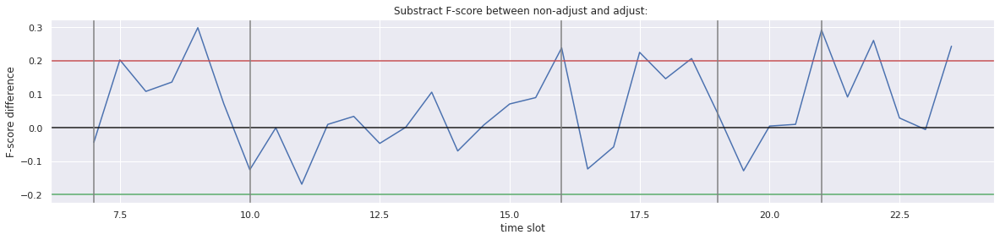

In [ ]:
fscore_list_mon_adjust = np.reshape(fscore_list_mon_adjust,(34,))
# fscore_list_mon = np.reshape(fscore_list_mon,(34,))
fscore_list_mon_dif = np.subtract(fscore_list_mon_adjust, fscore_mon)
# print(fscore_list_mon)
# print(fscore_mon)

fig = plt.figure(figsize=(20, 4))
list_time = np.arange(7,24,0.5)
title = 'Substract F-score between non-adjust and adjust: '
plt.title(title)
plt.plot(list_time, fscore_list_mon_dif, 'b')
plt.axhline(y=0, color='k')
plt.axhline(y=0.2, color='r')
plt.axhline(y=-0.2, color='g')
plt.axvline(x=7, color='grey')
plt.axvline(x=10, color='grey')
plt.axvline(x=16, color='grey')
plt.axvline(x=19, color='grey')
plt.axvline(x=21, color='grey')
# ax.legend(loc = 'lower right')
# ax.plot([0, 1], [0, 1],'r--')
plt.xlim()
# plt.ylim([0, 1])
plt.ylabel('F-score difference')
plt.xlabel('time slot')
plt.show()

the eps and mpt of boxgraph: 45 147
number of points: 4832
the eps and mpt of boxgraph: 45 147
number of points: 4979
the eps and mpt of boxgraph: 45 147
number of points: 5158
the eps and mpt of boxgraph: 45 147
number of points: 5383
the eps and mpt of boxgraph: 45 147
number of points: 5419
the eps and mpt of boxgraph: 45 147
number of points: 5277
the eps and mpt of boxgraph: 45 147
number of points: 5188
the eps and mpt of boxgraph: 45 147
number of points: 5070
the eps and mpt of boxgraph: 45 147
number of points: 5218
the eps and mpt of boxgraph: 45 147
number of points: 5416
the eps and mpt of boxgraph: 45 147
number of points: 5386
the eps and mpt of boxgraph: 45 147
number of points: 5357
the eps and mpt of boxgraph: 45 147
number of points: 5411
the eps and mpt of boxgraph: 45 147
number of points: 5555
the eps and mpt of boxgraph: 45 147
number of points: 5852
the eps and mpt of boxgraph: 45 147
number of points: 5956
the eps and mpt of boxgraph: 45 147
number of points: 56

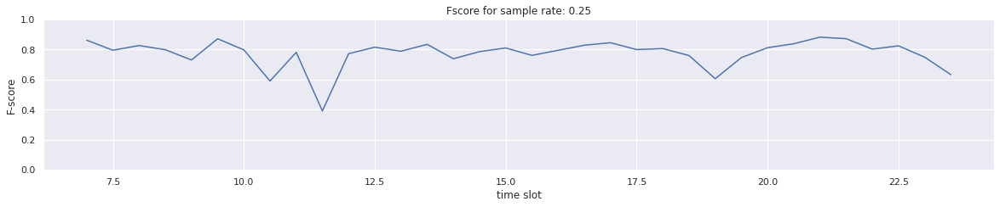

In [ ]:
from IPython.display import clear_output

def rectangle_set_list(n_samples, a, rctgs, datetime, interval):
    '''
        n_samples: int, number of points
        a: int list, the probability to be in the smaller rectangles
        rctgs: list of rectangles of class Rectangle, the first one is the biggest one
        datetime: datetime, 'yyyy-mm-dd hh:mm:ss'
        interval: int, the lasting time (e.g. 12 hours) from the starting time (i.e. date)
    '''
    list_points = []
    d = 2

    # insert 0 at the beginning and 1 at the end
    a = [0] + a
    for i in range(1, len(a)):
        a[i] = a[i-1] + a[i]

    for j in range(n_samples):
        b = np.random.uniform(0,1)        # Generate a random float from 0 to 1
        for i in range(len(a)-1):
            if a[i] < b <= a[i+1]:
                tmp_rctg = rctgs[i]
                x = np.random.uniform(low=tmp_rctg.x_min, high=tmp_rctg.x_min+tmp_rctg.width)
                y = np.random.uniform(low=tmp_rctg.y_min, high=tmp_rctg.y_min+tmp_rctg.height)
                hour_low = datetime.hour
                hour = np.random.randint(low=hour_low, high=hour_low+interval)
                year, month, day = datetime.year, datetime.month, datetime.day
                minute = np.random.randint(low=0, high=59)
                second = np.random.randint(low=0, high=59)
                day_month = day_of_month(year, month)
                if hour >= 24:
                    hour = hour % 24
                    if day<day_month:
                        day = day + 1
                    else:
                        day = (day + 1) % day_month
                # date_str = str(year)+'-'+str(month).zfill(2)+'-'+str(day).zfill(2)+' '+str(hour).zfill(2)+':'+str(minute).zfill(2)+':'+str(second).zfill(2)
                date_generated = dt.date(year, month, day)
                time_generated = dt.time(hour, minute, second)
                datetime_generated = dt.datetime.combine(date_generated, time_generated)
                list_points.append(ClusterPoint(d, [x,y],ID=j,datetime=datetime_generated,type_point='Rect'))
                break
    return list_points

def n_type_of_points_in_rectangle(rects, points, type_req):
    '''
        p: one point of format (diemension, coords, cluster_label)
        q: one point of format (diemension, coords, cluster_label)
        points: list of points of format (diemension, coords, cluster_label)
    '''
    cnt = 0
    for i in range(len(points)):
        x,y = points[i].coords
        for r in rects:
            xl = r.x_min
            xr = r.x_max
            yl = r.y_min
            yr = r.y_max
            if xl <= x <= xr and yl <= y <= yr and points[i].type_point==type_req:
                cnt += 1
                break
    return cnt

def generate_bg_list(df):
    n, d = len(df.index), 2
    list_points = []
    for j in range(n):
        x, y = df.iloc[j,-4], df.iloc[j,-3]
        datetime_generated = df.iloc[j,1]
        list_points.append(ClusterPoint(d, [x,y], ID=j, datetime=datetime_generated,type_point='taxi'))
    return list_points

def run_cluster_taxi_and_rect_prob(bg):
    """
    Reads the input set, clusters the points and writes to output

    :param path_in:     location of the input set
    :param path_out:    location to print the output
    """
    # Step 1: read file and create box graph
    # bg = taxi_set(epsilon, min_pts)
    print('number of points:',len(bg.points))
    
    # Step 2: Compute the core points
    find_core_points(bg)

    # Step 3: cluster the core points
    nr_clusters = compute_cluster_cores(bg)

    # Step 4: assign border points to clusters
    assign_border_points(bg)
    
    # points = bg.points
    # plot_clusters_taxi(points)

    # print("Cluster counter:", nr_clusters, file=sys.stderr)

def generate_data(taxi_df, rects, eps, mpt, prob=1):
    """
    Reads the input set, clusters the points and writes to output

    :param path_in:     location of the input set
    :param path_out:    location to print the output
    """
    # Step 1: read file and create box graph
    taxis = generate_bg_list(taxi_df)
    # rects = rectangle_set_list(n_points, a, rctgs, datetime, interval)
    if prob < 1:
        rect_prob = []
        for j in range(len(rects)):
            b = np.random.uniform(0,1)        # Generate a random float from 0 to 1
            if b <= prob:
                rect_prob.append(rects[j])
    else: rect_prob = rects
    data_list = taxis + rect_prob
    bg = BoxGraph(len(data_list), 2, eps, mpt, data_list)

    # Step 2: Compute the core points
    find_core_points(bg)

    # Step 3: cluster the core points
    nr_clusters = compute_cluster_cores(bg)

    # Step 4: assign border points to clusters
    assign_border_points(bg)

    return bg

def generate_data_set(taxis, n_points, a, rctgs, datetime, interval, eps, mpt, prob=1):
    """
    Reads the input set, clusters the points and writes to output

    :param path_in:     location of the input set
    :param path_out:    location to print the output
    """
    # Step 1: read file and create box graph
    # taxis = generate_bg_list(taxi_df)
    rects = rectangle_set_list(n_points, a, rctgs, datetime, interval)
    if prob < 1:
        rect_prob = []
        for j in range(len(rects)):
            b = np.random.uniform(0,1)        # Generate a random float from 0 to 1
            if b <= prob:
                rect_prob.append(rects[j])
    else: rect_prob = rects
    data_list = taxis + rect_prob
    bg = BoxGraph(len(data_list), 2, eps, mpt, data_list)

    # Step 2: Compute the core points
    find_core_points(bg)

    # Step 3: cluster the core points
    nr_clusters = compute_cluster_cores(bg)

    # Step 4: assign border points to clusters
    assign_border_points(bg)

    return bg, rects


def find_optimal_eps_mpt(taxi_df, rect_list, rctgs, prob):

    # fig = plt.figure(figsize=(30, 50))
    # fig.tight_layout()
    # plt.subplots_adjust(wspace=0,hspace=1)
    # fig.suptitle('DBSCAN using box graph with epsilon and minPts')

    min_area = 4
    lambda_eps, gamma_mpt = 0.1, 0.2
    min_area_r = math.sqrt(min_area/math.pi) 
    min_pow_eps = lambda_eps * math.log(min_area_r,1+lambda_eps)     # math.log(x, base)

    w_image, h_image = 471, 907
    z = max(w_image, h_image)
    max_pow_eps = math.log(z, 1+lambda_eps)
    pow_eps = np.array(range(int(min_pow_eps), int(max_pow_eps)+1, 10))
    # epsilons = list(range(int((1+lambda_eps)**min_pow_eps), int((1+lambda_eps)**max_pow_eps)+1))
    epsilon_list = (1+lambda_eps)**pow_eps
    epsilon_list = [epsilon_list[4]]

    # n = 2000
    # a = [0.5, 0.5]
    
    # rect_1 = Rectangle(130, 600, 30, 30)
    # rect_2 = Rectangle(250, 550, 40, 40)
    # rctgs = [rect_1, rect_2]

    # date = dt.date(2015,1,10)
    # time = dt.time(7,0,0)
    # datetime = dt.datetime.combine(date,time)

    # interval = 13

    max_avg_dens = 0
    eps_max_dens, mpt_max_dens = 0,0
    max_fscore = 0
    eps_max_fscore, mpt_max_fscore = 0,0

    #  plot Numerical Data
    row = len(epsilon_list) * 2  # number of rows
    column = 6  # number of columns
    order = 1  # initialize plot counter
    cnt = 0

    for eps in epsilon_list:
        # bg = taxi_set_and_random_rectangle(n_samples, a, rctgs, datetime, interval, eps)
        # points = generate_bg_list(data_oneday) + rect_set_list
        n_points = len(rect_list) + len(taxi_df.index)
        max_pow_mpt = math.log(n_points, 1+gamma_mpt)
        min_pts_pow_list = np.array(range(0,int(max_pow_mpt)+1,5))
        min_pts_list = (1+gamma_mpt)**min_pts_pow_list
        for mpt in min_pts_list:      
            import time as tm
            start = tm.time()
            # bg = BoxGraph(n_points, 2, eps, mpt, data_list) 
            # print('eps, mpt:', eps, mpt)
            bg = generate_data(taxi_df, rect_list, eps, mpt, prob)
            points = bg.points

            label = [p.cluster_label for p in points]
            label = np.array(label)

            colors = ['#'+("%06x" % random.randint(0, 0xFFFFFF)).upper() for _ in range(len(np.unique(label)))]
            
            # print(len(np.unique(label)), 'labels:', np.unique(label))
            # print('the first 5 labels:', np.unique(label))
            X = [np.array(points[i].coords) for i in range(len(points))]
            X = np.array(X)
            # print('number of coords:', len(X))
            # print('the first 5 coords:', X[:5])

            # ax_im = fig.add_subplot(row, column, order+cnt)
            # cnt += 1
            # # Hide spines, ticks, etc.
            # ax_im.axis('off')
            # ax_im.imshow(im, cmap='gray')
            # implot = plt.imshow(im)

            # for idx, col in enumerate(colors,1):
            #     # print(idx, col)
            #     cluster_data = label == idx
            #     ax_im.scatter(X[cluster_data, 0], X[cluster_data, 1],
            #                 c=col, marker='.', s=10)
            
            # currentAxis = plt.gca()
            # big_rect = rctgs[-1]
            cluster_rect = []
            unique_label = np.unique(label)
            # unique_label = unique_label[unique_label != -1]
            # for idx, lbl in enumerate(np.unique(label),1):
            for idx in range(1,len(unique_label)+1):
                cluster_data = label == idx
                if np.any(cluster_data):
                    left, right = np.min(X[cluster_data,0]), np.max(X[cluster_data,0])
                    bottom, top = np.min(X[cluster_data,1]), np.max(X[cluster_data,1])
                    width, height = abs(right-left), abs(top-bottom)
                    # currentAxis.add_patch(patches.Rectangle((left, bottom), width, height, linewidth=1, edgecolor='b', fill=None))
                    temp_rect = Rectangle(0.5*(left+right), 0.5*(top+bottom), width, height)
                    # print(left, right, top,bottom)
                    # print('x:',temp_rect.x,'y:',temp_rect.y, temp_rect.x_min )
                    cluster_rect.append(temp_rect)
            
            # print('number of clusters:', len(cluster_rect))
            average_density = 0
            f_score = 0
            n_taxi_points = n_rect_points = 0
            if len(cluster_rect)>0:
                # print('number of clusters:',len(cluster_rect))
                k_rects, k_density = dense_rectangle(points, cluster_rect, 3, 1)
                n_rect_points = n_type_of_points_in_rectangle(k_rects, points, 'Rect')
                n_taxi_points = n_type_of_points_in_rectangle(k_rects, points, 'taxi')
                f_score, _, _ = f_score_points_in_rect(rctgs, k_rects, points)
                f_socre = round(f_score, 4)
                if len(k_density)>0: average_density = np.mean(k_density)
                else: average_density = 0
                if average_density > max_avg_dens: 
                    max_avg_dens = average_density
                    eps_max_dens, mpt_max_dens = eps, mpt
                if f_score > max_fscore: 
                    max_fscore = f_score
                    eps_max_fscore, mpt_max_fscore = eps, mpt
            # print('f_score, eps, mpt', f_score, eps, mpt)
            #     for r in k_rects:
            #         currentAxis.add_patch(patches.Rectangle((r.x-r.width/2, r.y-r.height/2), r.width, r.height, linewidth=3, edgecolor='r', fill=None))
            # for r in rctgs:
            #     currentAxis.add_patch(patches.Rectangle((r.x-r.width/2, r.y-r.height/2), r.width, r.height, linewidth=1, edgecolor='b', fill=None))

            # print('the maximum average density:',max_avg_dens)
            end = tm.time()
            cost_time = end - start
            # title_1 = 'epsilon: ' + str(round(eps,2)) + '\n' + 'minPts: ' + str(round(mpt,2)) + '\n'
            # title_2 = 'It takes ' + str(round(cost_time, 4)) + ' seconds.' + '\n'
            # title_3_1 = 'average density: ' + str(round(average_density, 4))+'\n'
            # title_3 = 'f_score: ' + str(f_score) + '\n'
            # title_4 = 'number of clusters: '+str(len(cluster_rect)) + '\n'
            # title_5 = 'taxi data points: ' + str(n_taxi_points) + '\n'
            # title_6 = 'generated rect points: ' + str(n_rect_points)
            # title = title_1 + title_2 + title_3_1 + title_3 + title_4 + title_5 + title_6
            # ax_im.set_title(title)           
            # # ax_im.set_xlabel(xlabel)
            # ax_im.set_xticks([])
            # ax_im.set_yticks([])
            bg = None

    # plt.show()
    # print('maximum average density:', max_avg_dens, ', eps:', eps_max_dens, ', mpt:', mpt_max_dens)
    print('maximum fscore:', max_fscore, ', eps:', eps_max_fscore, ', mpt:', mpt_max_fscore)
    return eps_max_fscore, mpt_max_fscore
    
def plot_sliding_window_taxi_and_rect_multi_prob(df, begin_date, interval, w, column, eps, mpt, list_prob=[0.2], unit='minute'):
    '''
        df: dataframes
        begin_date: datetime
        interval: int, the window move to begin_time+interval next time
        w: int, the size of the sliding window
        unit: string, the unit of the sliding window
        column: string, the name of the required column

        only plot, not return
    '''

    rect_1 = Rectangle(130, 600, 30, 30)
    rect_2 = Rectangle(250, 550, 40, 40)
    rctgs = [rect_1, rect_2]

    rect_set_list = rectangle_set_list(3000, [0.5,0.5], rctgs, begin_date, interval)
    
    start_time = begin_date

    after_start_date = df[column] >= start_time
    before_end_date = df[column] < start_time + dt.timedelta(minutes=w)
    between_two_dates = after_start_date & before_end_date
    # filtered_df = df.loc[between_two_dates]
    origin_filtered_df = df.loc[between_two_dates]

    # choose it with probability
    fscore_list = []
    time_cost_list = []
    for prob in list_prob:
        index_list = []
        fscore_for_one_prob = []
        time_cost_for_each = []
        filtered_df = origin_filtered_df
        n_samples = len(filtered_df.index)
        for j in range(n_samples):
            b = np.random.uniform(0,1)        # Generate a random float from 0 to 1
            if b <= prob:
                index_list.append(j)
        sampled_df = filtered_df.iloc[np.array(index_list)]

        # initializing the window
        init_df = TimeWindow(w, start_time, sampled_df)
        filtered_tw = init_df
        latest_window = filtered_tw.window

        #  plot Numerical Data
        row = 4  # number of rows
        n_col = 6  # number of columns
        order = 1  # initialize plot counter
        cnt = 0

        im = plt.imread('manhattan.png')
        dpi = 80
        height, width, depth = im.shape
        figsize = width / float(dpi), height / float(dpi)
        
        update_start_time = start_time
        # fig.suptitle('DBSCAN using box graph with epsilon and minPts')
        
        # generate the boxgraph for the window and run DBSCAN
        for _ in range(34):

            import time
            time_cost_start = time.time()
            
            # if filtered_tw.start_time == begin_date+dt.timedelta(hours=3) or \
            #     filtered_tw.start_time == begin_date+dt.timedelta(hours=9) or \
            #     filtered_tw.start_time == begin_date+dt.timedelta(hours=12) or \
            #     filtered_tw.start_time == begin_date+dt.timedelta(hours=14):
            #     epsilon, minpts = find_optimal_eps_mpt(latest_window, rect_set_list, rctgs, prob)
            #     eps, mpt = epsilon, minpts

            temp_taxi_list = generate_bg_list(latest_window)
            # temp_bg = BoxGraph(len(temp_point_list), 2, eps, int(mpt*prob), temp_point_list)
            temp_bg, rect_set_list = generate_data_set(temp_taxi_list, 3000, [0.5,0.5], rctgs, begin_date, interval, eps, int(mpt*prob), prob)
            # temp_bg = generate_data_set(latest_window, rect_set_list, eps, int(mpt*prob))
            print('the eps and mpt of boxgraph:', temp_bg.eps, temp_bg.min_pts)
            run_cluster_taxi_and_rect_prob(temp_bg)
            points = temp_bg.points

            X_prob = [np.array(points[i].coords) for i in range(len(points))]
            X_prob = np.array(X_prob)
            label_prob = [points[i].cluster_label for i in range(len(points))]
            label_prob = np.array(label_prob)
            colors = ['#'+("%06x" % random.randint(0, 0xFFFFFF)).upper() for _ in range(len(label_prob))]

            # label = [points[i].cluster_label for i in range(len(points))]
            # label = np.array(label)

            df_not_prob = temp_taxi_list + rect_set_list
            X = [np.array(df_not_prob[i].coords) for i in range(len(df_not_prob))]
            X = np.array(X)
            label = [df_not_prob[i].cluster_label for i in range(len(df_not_prob))]
            label = np.array(label)
            
            # cmap = plt.get_cmap('gnuplot')
            # colors = [cmap(i) for i in np.linspace(0, 1, len(label))]
            
            # # ax = fig.add_subplot(row, n_col, order+cnt)
            # fig = plt.figure(figsize=figsize)
            # ax = fig.add_axes([0, 0, 1, 1])
            # cnt += 1
            # ax.imshow(im, cmap='gray')
            # implot = plt.imshow(im)
            # ax.axis('off')

            # # for idx, col in enumerate(colors):
            # #     # print(idx, col)
            # #     cluster_data = label == idx
            # #     dots = ax.scatter(X[cluster_data, 0], X[cluster_data, 1],
            # #                 c=col, marker='.', s=10)
            # dots = ax.scatter(X[:, 0], X[:, 1],
            #                 marker='.', s=10)

            # currentAxis = plt.gca()
            # big_rect = rctgs[-1]
            cluster_rect = []
            for idx in range(1,len(np.unique(label_prob))+1):
                cluster_data = label_prob == idx
                # print(len(cluster_data),np.unique(cluster_data))
                if np.any(cluster_data):
                    left, right = np.min(X_prob[cluster_data,0]), np.max(X_prob[cluster_data,0])
                    bottom, top = np.min(X_prob[cluster_data,1]), np.max(X_prob[cluster_data,1])
                    width, height = abs(right-left), abs(top-bottom)
                    # currentAxis.add_patch(patches.Rectangle((left, bottom), width, height, linewidth=1, edgecolor='b', fill=None))
                    temp_rect = Rectangle(0.5*(left+right), 0.5*(top+bottom), width, height)
                    cluster_rect.append(temp_rect)

            k_rects, average_density = dense_rectangle(df_not_prob, cluster_rect)
            # print(len(k_rects), average_density)
            points_in_rects = np.array(points_in_rect(k_rects, df_not_prob))
            n_rect_points = n_type_of_points_in_rectangle(k_rects, df_not_prob, 'Rect')
            n_taxi_points = n_type_of_points_in_rectangle(k_rects, df_not_prob, 'taxi')
            f_score, _, _ = f_score_points_in_rect_duplicate(rctgs, k_rects, df_not_prob)
            fscore_for_one_prob.append(f_score)
            f_socre = round(f_score, 4)

            # ax.scatter(X[:,0], X[:,1], s=2, c='grey')

            # for r in k_rects:
            #     ax.add_patch(patches.Rectangle((r.x-r.width/2, r.y-r.height/2), r.width, r.height, linewidth=2, edgecolor='r', fill=None))
            # for r in rctgs:
            #     ax.add_patch(patches.Rectangle((r.x-r.width/2, r.y-r.height/2), r.width, r.height, linewidth=1, edgecolor='b', fill=None))

            # if len(points_in_rects)>0:
            #     x, y = points_in_rects[:, 0], points_in_rects[:, 1]
            #     ax.plot(x, y, 'r.', markersize=2)
            #     from pandas import DataFrame
            #     pos = []
            #     for i in range(len(x)):
            #         pos.append([x[i], y[i]])
            #     df_predicted = DataFrame (pos,columns=['pos_x','pos_y'])
            #     contour = sns.kdeplot(data=df_predicted, x='pos_x', y='pos_y', fill=True)
            #     contour.collections[0].set_alpha(0)

            # title_1 = str(update_start_time)+' to '+str(update_start_time+ dt.timedelta(minutes=w)) + ' \n'
            # title_2 = 'sample rate:' + str(prob) + '\n'
            # title_3 = 'f_score: ' + str(f_score) + '\n'
            # title_4 = 'number of clusters: '+str(len(cluster_rect)) + '\n'
            # title_5 = 'number of original taxi data points: ' + str(n_taxi_points) + '\n'
            # title_6 = 'number of generated rect data points: ' + str(n_rect_points)
            # title_str = title_1 + title_3 + title_4 + title_5 + title_6
            # plt.title(title_str)
            # update_start_time += dt.timedelta(minutes=interval)
            
            # # Hide spines, ticks, etc.
            # ax.axis('off')

            # plt.scatter(core_points[:,0], core_points[:,1], c='b', s=50)
            # plt.title("DBScan clustering")
            # plt.xticks([])
            # plt.yticks([])

            filtered_tw = filtered_tw.sliding_with_prob(interval, df, column, prob)
            latest_window = filtered_tw.window
            filtered_df_tw = TimeWindow(w, update_start_time, filtered_df)
            filtered_df_tw = filtered_df_tw.sliding(interval, df, column)
            filtered_df = filtered_df_tw.window

            import time
            time_cost_end = time.time()
            time_cost = time_cost_end - time_cost_start
            time_cost_for_each.append(time_cost)

        fscore_list.append(np.array(fscore_for_one_prob))
        time_cost_list.append(np.array(time_cost_for_each))
    
    fscore_list = np.array(fscore_list)
    time_cost_list = np.array(time_cost_list)
    return fscore_list, time_cost_list
        
if __name__ == '__main__':

    date_sat = dt.date(2015,1,10)
    time = dt.time(7,0,0)
    datetime_sat = dt.datetime.combine(date_sat,time)
    date_fri = dt.date(2015,1,9)
    datetime_fri = dt.datetime.combine(date_fri,time)
    date_sun = dt.date(2015,1,11)
    datetime_sun = dt.datetime.combine(date_sun,time)
    date_mon = dt.date(2015,1,12)
    datetime_mon = dt.datetime.combine(date_mon,time)

    list_prob = [1/4]    
    # fscore_list_sat, time_cost_list_sat = plot_sliding_window_taxi_and_rect_multi_prob(data_sat, datetime_sat, 30, 60, 'tpep_pickup_datetime', 45, 590, list_prob)
    # fscore_list_sun, time_cost_list_sun = plot_sliding_window_taxi_and_rect_multi_prob(data_sun, datetime_sun, 30, 60, 'tpep_pickup_datetime', 45, 590, list_prob)
    fscore_list_fri, time_cost_list_fri = plot_sliding_window_taxi_and_rect_multi_prob(data_fri, datetime_fri, 30, 60, 'tpep_pickup_datetime', 45, 590, list_prob)
    # fscore_list_mon, time_cost_list_mon = plot_sliding_window_taxi_and_rect_multi_prob(data_mon, datetime_mon, 30, 60, 'tpep_pickup_datetime', 45, 590, list_prob)
    # fscore_list = [fscore_list_fri, fscore_list_sat, fscore_list_sun, fscore_list_mon]
    fscore_list = [fscore_list_fri]
    fscore_list = np.array(fscore_list)
    
    prob_row = 4
    prob_col = 1
    order = 1
    cnt = 0

    fig = plt.figure(figsize=(20, 15))
    list_time = np.arange(7,24,0.5)
    for i in range(len(list_prob)):
        ax = fig.add_subplot(prob_row, prob_col, order+cnt)
        title = 'Fscore for sample rate: ' + str(list_prob[i])
        ax.set_title(title)
        ax.plot(list_time, np.reshape(fscore_list[i],(34,)), 'b')
        # ax.legend(loc = 'lower right')
        # ax.plot([0, 1], [0, 1],'r--')
        ax.set_xlim()
        ax.set_ylim([0, 1])
        ax.set_ylabel('F-score')
        ax.set_xlabel('time slot')
        cnt += 1

    # fig = plt.figure(figsize=(8, 5))
    # ax = fig.add_subplot(2, 1, 1)
    # ax.set_title('F-score for different sample rate')
    # average_fscore = np.mean(fscore_list, axis=1)
    # plt.plot(list_prob, average_fscore, 'b')
    # # plt.legend(loc = 'lower right')
    # # plt.plot([0, 1], [0, 1],'r--')
    # ax.set_xlim([0, 0.5])
    # ax.set_ylim([0, 1])
    # ax.set_ylabel('F-score')
    # ax.set_xlabel('sample rate')

    # fig = plt.figure(figsize=(8, 5))
    # ax = fig.add_subplot(2, 1, 2)
    # ax.set_title('F-score for different sample rate')
    # average_time_cost = np.mean(time_cost_list, axis=1)
    #  plt.plot(list_prob, average_time_cost, 'b')
    # # plt.legend(loc = 'lower right')
    # # plt.plot([0, 1], [0, 1],'r--')
    # ax.set_xlim([0, 0.5])
    # ax.set_ylim()
    # ax.set_ylabel('time_cost')
    # ax.set_xlabel('sample rate')

    plt.show()

the eps and mpt of boxgraph: 45 147
number of points: 2030
the eps and mpt of boxgraph: 45 147
number of points: 2346
the eps and mpt of boxgraph: 45 147
number of points: 2892
the eps and mpt of boxgraph: 45 147
number of points: 3466
the eps and mpt of boxgraph: 45 147
number of points: 3960
the eps and mpt of boxgraph: 45 147
number of points: 4516
the eps and mpt of boxgraph: 45 147
number of points: 5098
the eps and mpt of boxgraph: 45 147
number of points: 5605
the eps and mpt of boxgraph: 45 147
number of points: 6004
the eps and mpt of boxgraph: 45 147
number of points: 6275
the eps and mpt of boxgraph: 45 147
number of points: 6391
the eps and mpt of boxgraph: 45 147
number of points: 6593
the eps and mpt of boxgraph: 45 147
number of points: 6378
the eps and mpt of boxgraph: 45 147
number of points: 6024
the eps and mpt of boxgraph: 45 147
number of points: 5897
the eps and mpt of boxgraph: 45 147
number of points: 5874
the eps and mpt of boxgraph: 45 147
number of points: 58

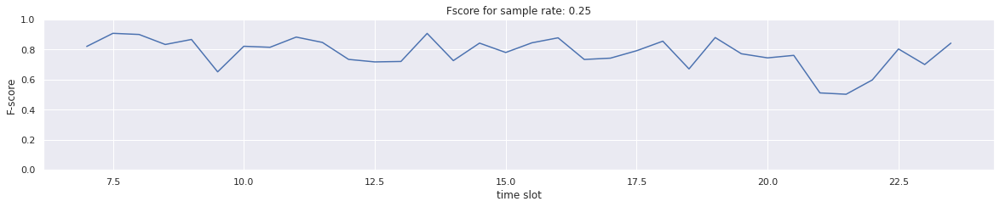

In [ ]:
from IPython.display import clear_output

def rectangle_set_list(n_samples, a, rctgs, datetime, interval):
    '''
        n_samples: int, number of points
        a: int list, the probability to be in the smaller rectangles
        rctgs: list of rectangles of class Rectangle, the first one is the biggest one
        datetime: datetime, 'yyyy-mm-dd hh:mm:ss'
        interval: int, the lasting time (e.g. 12 hours) from the starting time (i.e. date)
    '''
    list_points = []
    d = 2

    # insert 0 at the beginning and 1 at the end
    a = [0] + a
    for i in range(1, len(a)):
        a[i] = a[i-1] + a[i]

    for j in range(n_samples):
        b = np.random.uniform(0,1)        # Generate a random float from 0 to 1
        for i in range(len(a)-1):
            if a[i] < b <= a[i+1]:
                tmp_rctg = rctgs[i]
                x = np.random.uniform(low=tmp_rctg.x_min, high=tmp_rctg.x_min+tmp_rctg.width)
                y = np.random.uniform(low=tmp_rctg.y_min, high=tmp_rctg.y_min+tmp_rctg.height)
                hour_low = datetime.hour
                hour = np.random.randint(low=hour_low, high=hour_low+interval)
                year, month, day = datetime.year, datetime.month, datetime.day
                minute = np.random.randint(low=0, high=59)
                second = np.random.randint(low=0, high=59)
                day_month = day_of_month(year, month)
                if hour >= 24:
                    hour = hour % 24
                    if day<day_month:
                        day = day + 1
                    else:
                        day = (day + 1) % day_month
                # date_str = str(year)+'-'+str(month).zfill(2)+'-'+str(day).zfill(2)+' '+str(hour).zfill(2)+':'+str(minute).zfill(2)+':'+str(second).zfill(2)
                date_generated = dt.date(year, month, day)
                time_generated = dt.time(hour, minute, second)
                datetime_generated = dt.datetime.combine(date_generated, time_generated)
                list_points.append(ClusterPoint(d, [x,y],ID=j,datetime=datetime_generated,type_point='Rect'))
                break
    return list_points

def n_type_of_points_in_rectangle(rects, points, type_req):
    '''
        p: one point of format (diemension, coords, cluster_label)
        q: one point of format (diemension, coords, cluster_label)
        points: list of points of format (diemension, coords, cluster_label)
    '''
    cnt = 0
    for i in range(len(points)):
        x,y = points[i].coords
        for r in rects:
            xl = r.x_min
            xr = r.x_max
            yl = r.y_min
            yr = r.y_max
            if xl <= x <= xr and yl <= y <= yr and points[i].type_point==type_req:
                cnt += 1
                break
    return cnt

def generate_bg_list(df):
    n, d = len(df.index), 2
    list_points = []
    for j in range(n):
        x, y = df.iloc[j,-4], df.iloc[j,-3]
        datetime_generated = df.iloc[j,1]
        list_points.append(ClusterPoint(d, [x,y], ID=j, datetime=datetime_generated,type_point='taxi'))
    return list_points

def run_cluster_taxi_and_rect_prob(bg):
    """
    Reads the input set, clusters the points and writes to output

    :param path_in:     location of the input set
    :param path_out:    location to print the output
    """
    # Step 1: read file and create box graph
    # bg = taxi_set(epsilon, min_pts)
    print('number of points:',len(bg.points))
    
    # Step 2: Compute the core points
    find_core_points(bg)

    # Step 3: cluster the core points
    nr_clusters = compute_cluster_cores(bg)

    # Step 4: assign border points to clusters
    assign_border_points(bg)
    
    # points = bg.points
    # plot_clusters_taxi(points)

    # print("Cluster counter:", nr_clusters, file=sys.stderr)

def generate_data(taxi_df, rects, eps, mpt, prob=1):
    """
    Reads the input set, clusters the points and writes to output

    :param path_in:     location of the input set
    :param path_out:    location to print the output
    """
    # Step 1: read file and create box graph
    taxis = generate_bg_list(taxi_df)
    # rects = rectangle_set_list(n_points, a, rctgs, datetime, interval)
    if prob < 1:
        rect_prob = []
        for j in range(len(rects)):
            b = np.random.uniform(0,1)        # Generate a random float from 0 to 1
            if b <= prob:
                rect_prob.append(rects[j])
    else: rect_prob = rects
    data_list = taxis + rect_prob
    bg = BoxGraph(len(data_list), 2, eps, mpt, data_list)

    # Step 2: Compute the core points
    find_core_points(bg)

    # Step 3: cluster the core points
    nr_clusters = compute_cluster_cores(bg)

    # Step 4: assign border points to clusters
    assign_border_points(bg)

    return bg

def generate_data_set(taxis, n_points, a, rctgs, datetime, interval, eps, mpt, prob=1):
    """
    Reads the input set, clusters the points and writes to output

    :param path_in:     location of the input set
    :param path_out:    location to print the output
    """
    # Step 1: read file and create box graph
    # taxis = generate_bg_list(taxi_df)
    rects = rectangle_set_list(n_points, a, rctgs, datetime, interval)
    if prob < 1:
        rect_prob = []
        for j in range(len(rects)):
            b = np.random.uniform(0,1)        # Generate a random float from 0 to 1
            if b <= prob:
                rect_prob.append(rects[j])
    else: rect_prob = rects
    data_list = taxis + rect_prob
    bg = BoxGraph(len(data_list), 2, eps, mpt, data_list)

    # Step 2: Compute the core points
    find_core_points(bg)

    # Step 3: cluster the core points
    nr_clusters = compute_cluster_cores(bg)

    # Step 4: assign border points to clusters
    assign_border_points(bg)

    return bg, rects


def find_optimal_eps_mpt(taxi_df, rect_list, rctgs, prob):

    # fig = plt.figure(figsize=(30, 50))
    # fig.tight_layout()
    # plt.subplots_adjust(wspace=0,hspace=1)
    # fig.suptitle('DBSCAN using box graph with epsilon and minPts')

    min_area = 4
    lambda_eps, gamma_mpt = 0.1, 0.2
    min_area_r = math.sqrt(min_area/math.pi) 
    min_pow_eps = lambda_eps * math.log(min_area_r,1+lambda_eps)     # math.log(x, base)

    w_image, h_image = 471, 907
    z = max(w_image, h_image)
    max_pow_eps = math.log(z, 1+lambda_eps)
    pow_eps = np.array(range(int(min_pow_eps), int(max_pow_eps)+1, 10))
    # epsilons = list(range(int((1+lambda_eps)**min_pow_eps), int((1+lambda_eps)**max_pow_eps)+1))
    epsilon_list = (1+lambda_eps)**pow_eps
    epsilon_list = [epsilon_list[4]]

    # n = 2000
    # a = [0.5, 0.5]
    
    # rect_1 = Rectangle(130, 600, 30, 30)
    # rect_2 = Rectangle(250, 550, 40, 40)
    # rctgs = [rect_1, rect_2]

    # date = dt.date(2015,1,10)
    # time = dt.time(7,0,0)
    # datetime = dt.datetime.combine(date,time)

    # interval = 13

    max_avg_dens = 0
    eps_max_dens, mpt_max_dens = 0,0
    max_fscore = 0
    eps_max_fscore, mpt_max_fscore = 0,0

    #  plot Numerical Data
    row = len(epsilon_list) * 2  # number of rows
    column = 6  # number of columns
    order = 1  # initialize plot counter
    cnt = 0

    for eps in epsilon_list:
        # bg = taxi_set_and_random_rectangle(n_samples, a, rctgs, datetime, interval, eps)
        # points = generate_bg_list(data_oneday) + rect_set_list
        n_points = len(rect_list) + len(taxi_df.index)
        max_pow_mpt = math.log(n_points, 1+gamma_mpt)
        min_pts_pow_list = np.array(range(0,int(max_pow_mpt)+1,5))
        min_pts_list = (1+gamma_mpt)**min_pts_pow_list
        for mpt in min_pts_list:      
            import time as tm
            start = tm.time()
            # bg = BoxGraph(n_points, 2, eps, mpt, data_list) 
            # print('eps, mpt:', eps, mpt)
            bg = generate_data(taxi_df, rect_list, eps, mpt, prob)
            points = bg.points

            label = [p.cluster_label for p in points]
            label = np.array(label)

            colors = ['#'+("%06x" % random.randint(0, 0xFFFFFF)).upper() for _ in range(len(np.unique(label)))]
            
            # print(len(np.unique(label)), 'labels:', np.unique(label))
            # print('the first 5 labels:', np.unique(label))
            X = [np.array(points[i].coords) for i in range(len(points))]
            X = np.array(X)
            # print('number of coords:', len(X))
            # print('the first 5 coords:', X[:5])

            # ax_im = fig.add_subplot(row, column, order+cnt)
            # cnt += 1
            # # Hide spines, ticks, etc.
            # ax_im.axis('off')
            # ax_im.imshow(im, cmap='gray')
            # implot = plt.imshow(im)

            # for idx, col in enumerate(colors,1):
            #     # print(idx, col)
            #     cluster_data = label == idx
            #     ax_im.scatter(X[cluster_data, 0], X[cluster_data, 1],
            #                 c=col, marker='.', s=10)
            
            # currentAxis = plt.gca()
            # big_rect = rctgs[-1]
            cluster_rect = []
            unique_label = np.unique(label)
            # unique_label = unique_label[unique_label != -1]
            # for idx, lbl in enumerate(np.unique(label),1):
            for idx in range(1,len(unique_label)+1):
                cluster_data = label == idx
                if np.any(cluster_data):
                    left, right = np.min(X[cluster_data,0]), np.max(X[cluster_data,0])
                    bottom, top = np.min(X[cluster_data,1]), np.max(X[cluster_data,1])
                    width, height = abs(right-left), abs(top-bottom)
                    # currentAxis.add_patch(patches.Rectangle((left, bottom), width, height, linewidth=1, edgecolor='b', fill=None))
                    temp_rect = Rectangle(0.5*(left+right), 0.5*(top+bottom), width, height)
                    # print(left, right, top,bottom)
                    # print('x:',temp_rect.x,'y:',temp_rect.y, temp_rect.x_min )
                    cluster_rect.append(temp_rect)
            
            # print('number of clusters:', len(cluster_rect))
            average_density = 0
            f_score = 0
            n_taxi_points = n_rect_points = 0
            if len(cluster_rect)>0:
                # print('number of clusters:',len(cluster_rect))
                k_rects, k_density = dense_rectangle(points, cluster_rect, 3, 1)
                n_rect_points = n_type_of_points_in_rectangle(k_rects, points, 'Rect')
                n_taxi_points = n_type_of_points_in_rectangle(k_rects, points, 'taxi')
                f_score, _, _ = f_score_points_in_rect(rctgs, k_rects, points)
                f_socre = round(f_score, 4)
                if len(k_density)>0: average_density = np.mean(k_density)
                else: average_density = 0
                if average_density > max_avg_dens: 
                    max_avg_dens = average_density
                    eps_max_dens, mpt_max_dens = eps, mpt
                if f_score > max_fscore: 
                    max_fscore = f_score
                    eps_max_fscore, mpt_max_fscore = eps, mpt
            # print('f_score, eps, mpt', f_score, eps, mpt)
            #     for r in k_rects:
            #         currentAxis.add_patch(patches.Rectangle((r.x-r.width/2, r.y-r.height/2), r.width, r.height, linewidth=3, edgecolor='r', fill=None))
            # for r in rctgs:
            #     currentAxis.add_patch(patches.Rectangle((r.x-r.width/2, r.y-r.height/2), r.width, r.height, linewidth=1, edgecolor='b', fill=None))

            # print('the maximum average density:',max_avg_dens)
            end = tm.time()
            cost_time = end - start
            # title_1 = 'epsilon: ' + str(round(eps,2)) + '\n' + 'minPts: ' + str(round(mpt,2)) + '\n'
            # title_2 = 'It takes ' + str(round(cost_time, 4)) + ' seconds.' + '\n'
            # title_3_1 = 'average density: ' + str(round(average_density, 4))+'\n'
            # title_3 = 'f_score: ' + str(f_score) + '\n'
            # title_4 = 'number of clusters: '+str(len(cluster_rect)) + '\n'
            # title_5 = 'taxi data points: ' + str(n_taxi_points) + '\n'
            # title_6 = 'generated rect points: ' + str(n_rect_points)
            # title = title_1 + title_2 + title_3_1 + title_3 + title_4 + title_5 + title_6
            # ax_im.set_title(title)           
            # # ax_im.set_xlabel(xlabel)
            # ax_im.set_xticks([])
            # ax_im.set_yticks([])
            bg = None

    # plt.show()
    # print('maximum average density:', max_avg_dens, ', eps:', eps_max_dens, ', mpt:', mpt_max_dens)
    print('maximum fscore:', max_fscore, ', eps:', eps_max_fscore, ', mpt:', mpt_max_fscore)
    return eps_max_fscore, mpt_max_fscore
    
def plot_sliding_window_taxi_and_rect_multi_prob(df, begin_date, interval, w, column, eps, mpt, list_prob=[0.2], unit='minute'):
    '''
        df: dataframes
        begin_date: datetime
        interval: int, the window move to begin_time+interval next time
        w: int, the size of the sliding window
        unit: string, the unit of the sliding window
        column: string, the name of the required column

        only plot, not return
    '''

    rect_1 = Rectangle(130, 600, 30, 30)
    rect_2 = Rectangle(250, 550, 40, 40)
    rctgs = [rect_1, rect_2]

    rect_set_list = rectangle_set_list(3000, [0.5,0.5], rctgs, begin_date, interval)
    
    start_time = begin_date

    after_start_date = df[column] >= start_time
    before_end_date = df[column] < start_time + dt.timedelta(minutes=w)
    between_two_dates = after_start_date & before_end_date
    # filtered_df = df.loc[between_two_dates]
    origin_filtered_df = df.loc[between_two_dates]

    # choose it with probability
    fscore_list = []
    time_cost_list = []
    for prob in list_prob:
        index_list = []
        fscore_for_one_prob = []
        time_cost_for_each = []
        filtered_df = origin_filtered_df
        n_samples = len(filtered_df.index)
        for j in range(n_samples):
            b = np.random.uniform(0,1)        # Generate a random float from 0 to 1
            if b <= prob:
                index_list.append(j)
        sampled_df = filtered_df.iloc[np.array(index_list)]

        # initializing the window
        init_df = TimeWindow(w, start_time, sampled_df)
        filtered_tw = init_df
        latest_window = filtered_tw.window

        #  plot Numerical Data
        row = 4  # number of rows
        n_col = 6  # number of columns
        order = 1  # initialize plot counter
        cnt = 0

        im = plt.imread('manhattan.png')
        dpi = 80
        height, width, depth = im.shape
        figsize = width / float(dpi), height / float(dpi)
        
        update_start_time = start_time
        # fig.suptitle('DBSCAN using box graph with epsilon and minPts')
        
        # generate the boxgraph for the window and run DBSCAN
        for _ in range(34):

            import time
            time_cost_start = time.time()
            
            # if filtered_tw.start_time == begin_date+dt.timedelta(hours=3) or \
            #     filtered_tw.start_time == begin_date+dt.timedelta(hours=9) or \
            #     filtered_tw.start_time == begin_date+dt.timedelta(hours=12) or \
            #     filtered_tw.start_time == begin_date+dt.timedelta(hours=14):
            #     epsilon, minpts = find_optimal_eps_mpt(latest_window, rect_set_list, rctgs, prob)
            #     eps, mpt = epsilon, minpts

            temp_taxi_list = generate_bg_list(latest_window)
            # temp_bg = BoxGraph(len(temp_point_list), 2, eps, int(mpt*prob), temp_point_list)
            temp_bg, rect_set_list = generate_data_set(temp_taxi_list, 3000, [0.5,0.5], rctgs, begin_date, interval, eps, int(mpt*prob), prob)
            # temp_bg = generate_data_set(latest_window, rect_set_list, eps, int(mpt*prob))
            print('the eps and mpt of boxgraph:', temp_bg.eps, temp_bg.min_pts)
            run_cluster_taxi_and_rect_prob(temp_bg)
            points = temp_bg.points

            X_prob = [np.array(points[i].coords) for i in range(len(points))]
            X_prob = np.array(X_prob)
            label_prob = [points[i].cluster_label for i in range(len(points))]
            label_prob = np.array(label_prob)
            colors = ['#'+("%06x" % random.randint(0, 0xFFFFFF)).upper() for _ in range(len(label_prob))]

            # label = [points[i].cluster_label for i in range(len(points))]
            # label = np.array(label)

            df_not_prob = temp_taxi_list + rect_set_list
            X = [np.array(df_not_prob[i].coords) for i in range(len(df_not_prob))]
            X = np.array(X)
            label = [df_not_prob[i].cluster_label for i in range(len(df_not_prob))]
            label = np.array(label)
            
            # cmap = plt.get_cmap('gnuplot')
            # colors = [cmap(i) for i in np.linspace(0, 1, len(label))]
            
            # # ax = fig.add_subplot(row, n_col, order+cnt)
            # fig = plt.figure(figsize=figsize)
            # ax = fig.add_axes([0, 0, 1, 1])
            # cnt += 1
            # ax.imshow(im, cmap='gray')
            # implot = plt.imshow(im)
            # ax.axis('off')

            # # for idx, col in enumerate(colors):
            # #     # print(idx, col)
            # #     cluster_data = label == idx
            # #     dots = ax.scatter(X[cluster_data, 0], X[cluster_data, 1],
            # #                 c=col, marker='.', s=10)
            # dots = ax.scatter(X[:, 0], X[:, 1],
            #                 marker='.', s=10)

            # currentAxis = plt.gca()
            # big_rect = rctgs[-1]
            cluster_rect = []
            for idx in range(1,len(np.unique(label_prob))+1):
                cluster_data = label_prob == idx
                # print(len(cluster_data),np.unique(cluster_data))
                if np.any(cluster_data):
                    left, right = np.min(X_prob[cluster_data,0]), np.max(X_prob[cluster_data,0])
                    bottom, top = np.min(X_prob[cluster_data,1]), np.max(X_prob[cluster_data,1])
                    width, height = abs(right-left), abs(top-bottom)
                    # currentAxis.add_patch(patches.Rectangle((left, bottom), width, height, linewidth=1, edgecolor='b', fill=None))
                    temp_rect = Rectangle(0.5*(left+right), 0.5*(top+bottom), width, height)
                    cluster_rect.append(temp_rect)

            k_rects, average_density = dense_rectangle(df_not_prob, cluster_rect)
            # print(len(k_rects), average_density)
            points_in_rects = np.array(points_in_rect(k_rects, df_not_prob))
            n_rect_points = n_type_of_points_in_rectangle(k_rects, df_not_prob, 'Rect')
            n_taxi_points = n_type_of_points_in_rectangle(k_rects, df_not_prob, 'taxi')
            f_score, _, _ = f_score_points_in_rect_duplicate(rctgs, k_rects, df_not_prob)
            fscore_for_one_prob.append(f_score)
            f_socre = round(f_score, 4)

            # ax.scatter(X[:,0], X[:,1], s=2, c='grey')

            # for r in k_rects:
            #     ax.add_patch(patches.Rectangle((r.x-r.width/2, r.y-r.height/2), r.width, r.height, linewidth=2, edgecolor='r', fill=None))
            # for r in rctgs:
            #     ax.add_patch(patches.Rectangle((r.x-r.width/2, r.y-r.height/2), r.width, r.height, linewidth=1, edgecolor='b', fill=None))

            # if len(points_in_rects)>0:
            #     x, y = points_in_rects[:, 0], points_in_rects[:, 1]
            #     ax.plot(x, y, 'r.', markersize=2)
            #     from pandas import DataFrame
            #     pos = []
            #     for i in range(len(x)):
            #         pos.append([x[i], y[i]])
            #     df_predicted = DataFrame (pos,columns=['pos_x','pos_y'])
            #     contour = sns.kdeplot(data=df_predicted, x='pos_x', y='pos_y', fill=True)
            #     contour.collections[0].set_alpha(0)

            # title_1 = str(update_start_time)+' to '+str(update_start_time+ dt.timedelta(minutes=w)) + ' \n'
            # title_2 = 'sample rate:' + str(prob) + '\n'
            # title_3 = 'f_score: ' + str(f_score) + '\n'
            # title_4 = 'number of clusters: '+str(len(cluster_rect)) + '\n'
            # title_5 = 'number of original taxi data points: ' + str(n_taxi_points) + '\n'
            # title_6 = 'number of generated rect data points: ' + str(n_rect_points)
            # title_str = title_1 + title_3 + title_4 + title_5 + title_6
            # plt.title(title_str)
            # update_start_time += dt.timedelta(minutes=interval)
            
            # # Hide spines, ticks, etc.
            # ax.axis('off')

            # plt.scatter(core_points[:,0], core_points[:,1], c='b', s=50)
            # plt.title("DBScan clustering")
            # plt.xticks([])
            # plt.yticks([])

            filtered_tw = filtered_tw.sliding_with_prob(interval, df, column, prob)
            latest_window = filtered_tw.window
            filtered_df_tw = TimeWindow(w, update_start_time, filtered_df)
            filtered_df_tw = filtered_df_tw.sliding(interval, df, column)
            filtered_df = filtered_df_tw.window

            import time
            time_cost_end = time.time()
            time_cost = time_cost_end - time_cost_start
            time_cost_for_each.append(time_cost)

        fscore_list.append(np.array(fscore_for_one_prob))
        time_cost_list.append(np.array(time_cost_for_each))
    
    fscore_list = np.array(fscore_list)
    time_cost_list = np.array(time_cost_list)
    return fscore_list, time_cost_list
        
if __name__ == '__main__':

    date_sat = dt.date(2015,1,10)
    time = dt.time(7,0,0)
    datetime_sat = dt.datetime.combine(date_sat,time)
    date_fri = dt.date(2015,1,9)
    datetime_fri = dt.datetime.combine(date_fri,time)
    date_sun = dt.date(2015,1,11)
    datetime_sun = dt.datetime.combine(date_sun,time)
    date_mon = dt.date(2015,1,12)
    datetime_mon = dt.datetime.combine(date_mon,time)

    list_prob = [1/4]    
    # fscore_list_sat, time_cost_list_sat = plot_sliding_window_taxi_and_rect_multi_prob(data_sat, datetime_sat, 30, 60, 'tpep_pickup_datetime', 45, 590, list_prob)
    fscore_list_sun, time_cost_list_sun = plot_sliding_window_taxi_and_rect_multi_prob(data_sun, datetime_sun, 30, 60, 'tpep_pickup_datetime', 45, 590, list_prob)
    # fscore_list_fri, time_cost_list_fri = plot_sliding_window_taxi_and_rect_multi_prob(data_fri, datetime_fri, 30, 60, 'tpep_pickup_datetime', 45, 590, list_prob)
    # fscore_list_mon, time_cost_list_mon = plot_sliding_window_taxi_and_rect_multi_prob(data_mon, datetime_mon, 30, 60, 'tpep_pickup_datetime', 45, 590, list_prob)
    # fscore_list = [fscore_list_fri, fscore_list_sat, fscore_list_sun, fscore_list_mon]
    fscore_list = [fscore_list_sun]
    fscore_list = np.array(fscore_list)
    
    prob_row = 4
    prob_col = 1
    order = 1
    cnt = 0

    fig = plt.figure(figsize=(20, 15))
    list_time = np.arange(7,24,0.5)
    for i in range(len(list_prob)):
        ax = fig.add_subplot(prob_row, prob_col, order+cnt)
        title = 'Fscore for sample rate: ' + str(list_prob[i])
        ax.set_title(title)
        ax.plot(list_time, np.reshape(fscore_list[i],(34,)), 'b')
        # ax.legend(loc = 'lower right')
        # ax.plot([0, 1], [0, 1],'r--')
        ax.set_xlim()
        ax.set_ylim([0, 1])
        ax.set_ylabel('F-score')
        ax.set_xlabel('time slot')
        cnt += 1

    # fig = plt.figure(figsize=(8, 5))
    # ax = fig.add_subplot(2, 1, 1)
    # ax.set_title('F-score for different sample rate')
    # average_fscore = np.mean(fscore_list, axis=1)
    # plt.plot(list_prob, average_fscore, 'b')
    # # plt.legend(loc = 'lower right')
    # # plt.plot([0, 1], [0, 1],'r--')
    # ax.set_xlim([0, 0.5])
    # ax.set_ylim([0, 1])
    # ax.set_ylabel('F-score')
    # ax.set_xlabel('sample rate')

    # fig = plt.figure(figsize=(8, 5))
    # ax = fig.add_subplot(2, 1, 2)
    # ax.set_title('F-score for different sample rate')
    # average_time_cost = np.mean(time_cost_list, axis=1)
    #  plt.plot(list_prob, average_time_cost, 'b')
    # # plt.legend(loc = 'lower right')
    # # plt.plot([0, 1], [0, 1],'r--')
    # ax.set_xlim([0, 0.5])
    # ax.set_ylim()
    # ax.set_ylabel('time_cost')
    # ax.set_xlabel('sample rate')

    plt.show()

the eps and mpt of boxgraph: 45 147
number of points: 2434
the eps and mpt of boxgraph: 45 147
number of points: 2807
the eps and mpt of boxgraph: 45 147
number of points: 3363
the eps and mpt of boxgraph: 45 147
number of points: 4024
the eps and mpt of boxgraph: 45 147
number of points: 4848
the eps and mpt of boxgraph: 45 147
number of points: 5322
maximum fscore: 0.8104366347177849 , eps: 45.2592555681761 , mpt: 1469.7715679690843
the eps and mpt of boxgraph: 45.2592555681761 367
number of points: 5741
the eps and mpt of boxgraph: 45.2592555681761 367
number of points: 6189
the eps and mpt of boxgraph: 45.2592555681761 367
number of points: 6431
the eps and mpt of boxgraph: 45.2592555681761 367
number of points: 6885
maximum fscore: 0.6273917421953675 , eps: 45.2592555681761 , mpt: 590.6682291542425
the eps and mpt of boxgraph: 45.2592555681761 147
number of points: 7146
the eps and mpt of boxgraph: 45.2592555681761 147
number of points: 7197
the eps and mpt of boxgraph: 45.2592555

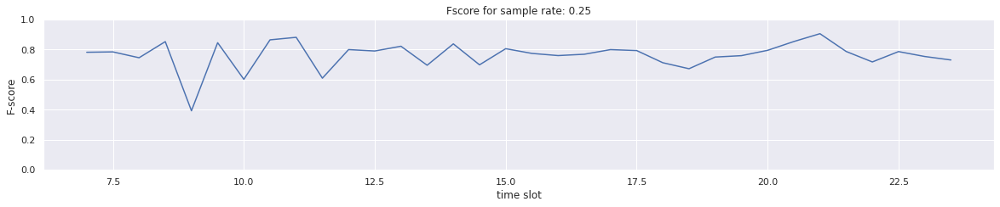

In [ ]:
from IPython.display import clear_output

def rectangle_set_list(n_samples, a, rctgs, datetime, interval):
    '''
        n_samples: int, number of points
        a: int list, the probability to be in the smaller rectangles
        rctgs: list of rectangles of class Rectangle, the first one is the biggest one
        datetime: datetime, 'yyyy-mm-dd hh:mm:ss'
        interval: int, the lasting time (e.g. 12 hours) from the starting time (i.e. date)
    '''
    list_points = []
    d = 2

    # insert 0 at the beginning and 1 at the end
    a = [0] + a
    for i in range(1, len(a)):
        a[i] = a[i-1] + a[i]

    for j in range(n_samples):
        b = np.random.uniform(0,1)        # Generate a random float from 0 to 1
        for i in range(len(a)-1):
            if a[i] < b <= a[i+1]:
                tmp_rctg = rctgs[i]
                x = np.random.uniform(low=tmp_rctg.x_min, high=tmp_rctg.x_min+tmp_rctg.width)
                y = np.random.uniform(low=tmp_rctg.y_min, high=tmp_rctg.y_min+tmp_rctg.height)
                hour_low = datetime.hour
                hour = np.random.randint(low=hour_low, high=hour_low+interval)
                year, month, day = datetime.year, datetime.month, datetime.day
                minute = np.random.randint(low=0, high=59)
                second = np.random.randint(low=0, high=59)
                day_month = day_of_month(year, month)
                if hour >= 24:
                    hour = hour % 24
                    if day<day_month:
                        day = day + 1
                    else:
                        day = (day + 1) % day_month
                # date_str = str(year)+'-'+str(month).zfill(2)+'-'+str(day).zfill(2)+' '+str(hour).zfill(2)+':'+str(minute).zfill(2)+':'+str(second).zfill(2)
                date_generated = dt.date(year, month, day)
                time_generated = dt.time(hour, minute, second)
                datetime_generated = dt.datetime.combine(date_generated, time_generated)
                list_points.append(ClusterPoint(d, [x,y],ID=j,datetime=datetime_generated,type_point='Rect'))
                break
    return list_points

def n_type_of_points_in_rectangle(rects, points, type_req):
    '''
        p: one point of format (diemension, coords, cluster_label)
        q: one point of format (diemension, coords, cluster_label)
        points: list of points of format (diemension, coords, cluster_label)
    '''
    cnt = 0
    for i in range(len(points)):
        x,y = points[i].coords
        for r in rects:
            xl = r.x_min
            xr = r.x_max
            yl = r.y_min
            yr = r.y_max
            if xl <= x <= xr and yl <= y <= yr and points[i].type_point==type_req:
                cnt += 1
                break
    return cnt

def generate_bg_list(df):
    n, d = len(df.index), 2
    list_points = []
    for j in range(n):
        x, y = df.iloc[j,-4], df.iloc[j,-3]
        datetime_generated = df.iloc[j,1]
        list_points.append(ClusterPoint(d, [x,y], ID=j, datetime=datetime_generated,type_point='taxi'))
    return list_points

def run_cluster_taxi_and_rect_prob(bg):
    """
    Reads the input set, clusters the points and writes to output

    :param path_in:     location of the input set
    :param path_out:    location to print the output
    """
    # Step 1: read file and create box graph
    # bg = taxi_set(epsilon, min_pts)
    print('number of points:',len(bg.points))
    
    # Step 2: Compute the core points
    find_core_points(bg)

    # Step 3: cluster the core points
    nr_clusters = compute_cluster_cores(bg)

    # Step 4: assign border points to clusters
    assign_border_points(bg)
    
    # points = bg.points
    # plot_clusters_taxi(points)

    # print("Cluster counter:", nr_clusters, file=sys.stderr)

def generate_data(taxi_df, rects, eps, mpt, prob=1):
    """
    Reads the input set, clusters the points and writes to output

    :param path_in:     location of the input set
    :param path_out:    location to print the output
    """
    # Step 1: read file and create box graph
    taxis = generate_bg_list(taxi_df)
    # rects = rectangle_set_list(n_points, a, rctgs, datetime, interval)
    if prob < 1:
        rect_prob = []
        for j in range(len(rects)):
            b = np.random.uniform(0,1)        # Generate a random float from 0 to 1
            if b <= prob:
                rect_prob.append(rects[j])
    else: rect_prob = rects
    data_list = taxis + rect_prob
    bg = BoxGraph(len(data_list), 2, eps, mpt, data_list)

    # Step 2: Compute the core points
    find_core_points(bg)

    # Step 3: cluster the core points
    nr_clusters = compute_cluster_cores(bg)

    # Step 4: assign border points to clusters
    assign_border_points(bg)

    return bg

def generate_data_set(taxis, n_points, a, rctgs, datetime, interval, eps, mpt, prob=1):
    """
    Reads the input set, clusters the points and writes to output

    :param path_in:     location of the input set
    :param path_out:    location to print the output
    """
    # Step 1: read file and create box graph
    # taxis = generate_bg_list(taxi_df)
    rects = rectangle_set_list(n_points, a, rctgs, datetime, interval)
    if prob < 1:
        rect_prob = []
        for j in range(len(rects)):
            b = np.random.uniform(0,1)        # Generate a random float from 0 to 1
            if b <= prob:
                rect_prob.append(rects[j])
    else: rect_prob = rects
    data_list = taxis + rect_prob
    bg = BoxGraph(len(data_list), 2, eps, mpt, data_list)

    # Step 2: Compute the core points
    find_core_points(bg)

    # Step 3: cluster the core points
    nr_clusters = compute_cluster_cores(bg)

    # Step 4: assign border points to clusters
    assign_border_points(bg)

    return bg, rects


def find_optimal_eps_mpt(taxi_df, rect_list, rctgs, prob):

    # fig = plt.figure(figsize=(30, 50))
    # fig.tight_layout()
    # plt.subplots_adjust(wspace=0,hspace=1)
    # fig.suptitle('DBSCAN using box graph with epsilon and minPts')

    min_area = 4
    lambda_eps, gamma_mpt = 0.1, 0.2
    min_area_r = math.sqrt(min_area/math.pi) 
    min_pow_eps = lambda_eps * math.log(min_area_r,1+lambda_eps)     # math.log(x, base)

    w_image, h_image = 471, 907
    z = max(w_image, h_image)
    max_pow_eps = math.log(z, 1+lambda_eps)
    pow_eps = np.array(range(int(min_pow_eps), int(max_pow_eps)+1, 10))
    # epsilons = list(range(int((1+lambda_eps)**min_pow_eps), int((1+lambda_eps)**max_pow_eps)+1))
    epsilon_list = (1+lambda_eps)**pow_eps
    epsilon_list = [epsilon_list[4]]

    # n = 2000
    # a = [0.5, 0.5]
    
    # rect_1 = Rectangle(130, 600, 30, 30)
    # rect_2 = Rectangle(250, 550, 40, 40)
    # rctgs = [rect_1, rect_2]

    # date = dt.date(2015,1,10)
    # time = dt.time(7,0,0)
    # datetime = dt.datetime.combine(date,time)

    # interval = 13

    max_avg_dens = 0
    eps_max_dens, mpt_max_dens = 0,0
    max_fscore = 0
    eps_max_fscore, mpt_max_fscore = 0,0

    #  plot Numerical Data
    row = len(epsilon_list) * 2  # number of rows
    column = 6  # number of columns
    order = 1  # initialize plot counter
    cnt = 0

    for eps in epsilon_list:
        # bg = taxi_set_and_random_rectangle(n_samples, a, rctgs, datetime, interval, eps)
        # points = generate_bg_list(data_oneday) + rect_set_list
        n_points = len(rect_list) + len(taxi_df.index)
        max_pow_mpt = math.log(n_points, 1+gamma_mpt)
        min_pts_pow_list = np.array(range(0,int(max_pow_mpt)+1,5))
        min_pts_list = (1+gamma_mpt)**min_pts_pow_list
        for mpt in min_pts_list[:-1]:      
            import time as tm
            start = tm.time()
            # bg = BoxGraph(n_points, 2, eps, mpt, data_list) 
            # print('eps, mpt:', eps, mpt)
            bg = generate_data(taxi_df, rect_list, eps, mpt, prob)
            points = bg.points

            label = [p.cluster_label for p in points]
            label = np.array(label)

            colors = ['#'+("%06x" % random.randint(0, 0xFFFFFF)).upper() for _ in range(len(np.unique(label)))]
            
            # print(len(np.unique(label)), 'labels:', np.unique(label))
            # print('the first 5 labels:', np.unique(label))
            X = [np.array(points[i].coords) for i in range(len(points))]
            X = np.array(X)
            # print('number of coords:', len(X))
            # print('the first 5 coords:', X[:5])

            # ax_im = fig.add_subplot(row, column, order+cnt)
            # cnt += 1
            # # Hide spines, ticks, etc.
            # ax_im.axis('off')
            # ax_im.imshow(im, cmap='gray')
            # implot = plt.imshow(im)

            # for idx, col in enumerate(colors,1):
            #     # print(idx, col)
            #     cluster_data = label == idx
            #     ax_im.scatter(X[cluster_data, 0], X[cluster_data, 1],
            #                 c=col, marker='.', s=10)
            
            # currentAxis = plt.gca()
            # big_rect = rctgs[-1]
            cluster_rect = []
            unique_label = np.unique(label)
            # unique_label = unique_label[unique_label != -1]
            # for idx, lbl in enumerate(np.unique(label),1):
            for idx in range(1,len(unique_label)+1):
                cluster_data = label == idx
                if np.any(cluster_data):
                    left, right = np.min(X[cluster_data,0]), np.max(X[cluster_data,0])
                    bottom, top = np.min(X[cluster_data,1]), np.max(X[cluster_data,1])
                    width, height = abs(right-left), abs(top-bottom)
                    # currentAxis.add_patch(patches.Rectangle((left, bottom), width, height, linewidth=1, edgecolor='b', fill=None))
                    temp_rect = Rectangle(0.5*(left+right), 0.5*(top+bottom), width, height)
                    # print(left, right, top,bottom)
                    # print('x:',temp_rect.x,'y:',temp_rect.y, temp_rect.x_min )
                    cluster_rect.append(temp_rect)
            
            # print('number of clusters:', len(cluster_rect))
            average_density = 0
            f_score = 0
            n_taxi_points = n_rect_points = 0
            if len(cluster_rect)>0:
                # print('number of clusters:',len(cluster_rect))
                k_rects, k_density = dense_rectangle(points, cluster_rect, 3, 1)
                n_rect_points = n_type_of_points_in_rectangle(k_rects, points, 'Rect')
                n_taxi_points = n_type_of_points_in_rectangle(k_rects, points, 'taxi')
                f_score, _, _ = f_score_points_in_rect(rctgs, k_rects, points)
                f_socre = round(f_score, 4)
                if len(k_density)>0: average_density = np.mean(k_density)
                else: average_density = 0
                if average_density > max_avg_dens: 
                    max_avg_dens = average_density
                    eps_max_dens, mpt_max_dens = eps, mpt
                if f_score > max_fscore: 
                    max_fscore = f_score
                    eps_max_fscore, mpt_max_fscore = eps, mpt
            # print('f_score, eps, mpt', f_score, eps, mpt)
            #     for r in k_rects:
            #         currentAxis.add_patch(patches.Rectangle((r.x-r.width/2, r.y-r.height/2), r.width, r.height, linewidth=3, edgecolor='r', fill=None))
            # for r in rctgs:
            #     currentAxis.add_patch(patches.Rectangle((r.x-r.width/2, r.y-r.height/2), r.width, r.height, linewidth=1, edgecolor='b', fill=None))

            # print('the maximum average density:',max_avg_dens)
            end = tm.time()
            cost_time = end - start
            # title_1 = 'epsilon: ' + str(round(eps,2)) + '\n' + 'minPts: ' + str(round(mpt,2)) + '\n'
            # title_2 = 'It takes ' + str(round(cost_time, 4)) + ' seconds.' + '\n'
            # title_3_1 = 'average density: ' + str(round(average_density, 4))+'\n'
            # title_3 = 'f_score: ' + str(f_score) + '\n'
            # title_4 = 'number of clusters: '+str(len(cluster_rect)) + '\n'
            # title_5 = 'taxi data points: ' + str(n_taxi_points) + '\n'
            # title_6 = 'generated rect points: ' + str(n_rect_points)
            # title = title_1 + title_2 + title_3_1 + title_3 + title_4 + title_5 + title_6
            # ax_im.set_title(title)           
            # # ax_im.set_xlabel(xlabel)
            # ax_im.set_xticks([])
            # ax_im.set_yticks([])
            bg = None

    # plt.show()
    # print('maximum average density:', max_avg_dens, ', eps:', eps_max_dens, ', mpt:', mpt_max_dens)
    print('maximum fscore:', max_fscore, ', eps:', eps_max_fscore, ', mpt:', mpt_max_fscore)
    return eps_max_fscore, mpt_max_fscore
    
def plot_sliding_window_taxi_and_rect_multi_prob(df, begin_date, interval, w, column, eps, mpt, list_prob=[0.2], unit='minute'):
    '''
        df: dataframes
        begin_date: datetime
        interval: int, the window move to begin_time+interval next time
        w: int, the size of the sliding window
        unit: string, the unit of the sliding window
        column: string, the name of the required column

        only plot, not return
    '''

    rect_1 = Rectangle(130, 600, 30, 30)
    rect_2 = Rectangle(250, 550, 40, 40)
    rctgs = [rect_1, rect_2]

    rect_set_list = rectangle_set_list(3000, [0.5,0.5], rctgs, begin_date, interval)
    
    start_time = begin_date

    after_start_date = df[column] >= start_time
    before_end_date = df[column] < start_time + dt.timedelta(minutes=w)
    between_two_dates = after_start_date & before_end_date
    # filtered_df = df.loc[between_two_dates]
    origin_filtered_df = df.loc[between_two_dates]

    # choose it with probability
    fscore_list = []
    time_cost_list = []
    for prob in list_prob:
        index_list = []
        fscore_for_one_prob = []
        time_cost_for_each = []
        filtered_df = origin_filtered_df
        n_samples = len(filtered_df.index)
        for j in range(n_samples):
            b = np.random.uniform(0,1)        # Generate a random float from 0 to 1
            if b <= prob:
                index_list.append(j)
        sampled_df = filtered_df.iloc[np.array(index_list)]

        # initializing the window
        init_df = TimeWindow(w, start_time, sampled_df)
        filtered_tw = init_df
        latest_window = filtered_tw.window

        #  plot Numerical Data
        row = 4  # number of rows
        n_col = 6  # number of columns
        order = 1  # initialize plot counter
        cnt = 0

        im = plt.imread('manhattan.png')
        dpi = 80
        height, width, depth = im.shape
        figsize = width / float(dpi), height / float(dpi)
        
        update_start_time = start_time
        # fig.suptitle('DBSCAN using box graph with epsilon and minPts')
        
        # generate the boxgraph for the window and run DBSCAN
        for _ in range(34):

            import time
            time_cost_start = time.time()
            
            if filtered_tw.start_time == begin_date+dt.timedelta(hours=3) or \
                filtered_tw.start_time == begin_date+dt.timedelta(hours=5) or \
                filtered_tw.start_time == begin_date+dt.timedelta(hours=9) or \
                filtered_tw.start_time == begin_date+dt.timedelta(hours=12):
                epsilon, minpts = find_optimal_eps_mpt(latest_window, rect_set_list, rctgs, prob)
                eps, mpt = epsilon, minpts

            temp_taxi_list = generate_bg_list(latest_window)
            # temp_bg = BoxGraph(len(temp_point_list), 2, eps, int(mpt*prob), temp_point_list)
            temp_bg, rect_set_list = generate_data_set(temp_taxi_list, 3000, [0.5,0.5], rctgs, begin_date, interval, eps, int(mpt*prob), prob)
            # temp_bg = generate_data_set(latest_window, rect_set_list, eps, int(mpt*prob))
            print('the eps and mpt of boxgraph:', temp_bg.eps, temp_bg.min_pts)
            run_cluster_taxi_and_rect_prob(temp_bg)
            points = temp_bg.points

            X_prob = [np.array(points[i].coords) for i in range(len(points))]
            X_prob = np.array(X_prob)
            label_prob = [points[i].cluster_label for i in range(len(points))]
            label_prob = np.array(label_prob)
            colors = ['#'+("%06x" % random.randint(0, 0xFFFFFF)).upper() for _ in range(len(label_prob))]

            # label = [points[i].cluster_label for i in range(len(points))]
            # label = np.array(label)

            df_not_prob = temp_taxi_list + rect_set_list
            X = [np.array(df_not_prob[i].coords) for i in range(len(df_not_prob))]
            X = np.array(X)
            label = [df_not_prob[i].cluster_label for i in range(len(df_not_prob))]
            label = np.array(label)
            
            # cmap = plt.get_cmap('gnuplot')
            # colors = [cmap(i) for i in np.linspace(0, 1, len(label))]
            
            # # ax = fig.add_subplot(row, n_col, order+cnt)
            # fig = plt.figure(figsize=figsize)
            # ax = fig.add_axes([0, 0, 1, 1])
            # cnt += 1
            # ax.imshow(im, cmap='gray')
            # implot = plt.imshow(im)
            # ax.axis('off')

            # # for idx, col in enumerate(colors):
            # #     # print(idx, col)
            # #     cluster_data = label == idx
            # #     dots = ax.scatter(X[cluster_data, 0], X[cluster_data, 1],
            # #                 c=col, marker='.', s=10)
            # dots = ax.scatter(X[:, 0], X[:, 1],
            #                 marker='.', s=10)

            # currentAxis = plt.gca()
            # big_rect = rctgs[-1]
            cluster_rect = []
            for idx in range(1,len(np.unique(label_prob))+1):
                cluster_data = label_prob == idx
                # print(len(cluster_data),np.unique(cluster_data))
                if np.any(cluster_data):
                    left, right = np.min(X_prob[cluster_data,0]), np.max(X_prob[cluster_data,0])
                    bottom, top = np.min(X_prob[cluster_data,1]), np.max(X_prob[cluster_data,1])
                    width, height = abs(right-left), abs(top-bottom)
                    # currentAxis.add_patch(patches.Rectangle((left, bottom), width, height, linewidth=1, edgecolor='b', fill=None))
                    temp_rect = Rectangle(0.5*(left+right), 0.5*(top+bottom), width, height)
                    cluster_rect.append(temp_rect)

            k_rects, average_density = dense_rectangle(df_not_prob, cluster_rect)
            # print(len(k_rects), average_density)
            points_in_rects = np.array(points_in_rect(k_rects, df_not_prob))
            n_rect_points = n_type_of_points_in_rectangle(k_rects, df_not_prob, 'Rect')
            n_taxi_points = n_type_of_points_in_rectangle(k_rects, df_not_prob, 'taxi')
            f_score, _, _ = f_score_points_in_rect(rctgs, k_rects, df_not_prob)
            fscore_for_one_prob.append(f_score)
            f_socre = round(f_score, 4)

            # ax.scatter(X[:,0], X[:,1], s=2, c='grey')

            # for r in k_rects:
            #     ax.add_patch(patches.Rectangle((r.x-r.width/2, r.y-r.height/2), r.width, r.height, linewidth=2, edgecolor='r', fill=None))
            # for r in rctgs:
            #     ax.add_patch(patches.Rectangle((r.x-r.width/2, r.y-r.height/2), r.width, r.height, linewidth=1, edgecolor='b', fill=None))

            # if len(points_in_rects)>0:
            #     x, y = points_in_rects[:, 0], points_in_rects[:, 1]
            #     ax.plot(x, y, 'r.', markersize=2)
            #     from pandas import DataFrame
            #     pos = []
            #     for i in range(len(x)):
            #         pos.append([x[i], y[i]])
            #     df_predicted = DataFrame (pos,columns=['pos_x','pos_y'])
            #     contour = sns.kdeplot(data=df_predicted, x='pos_x', y='pos_y', fill=True)
            #     contour.collections[0].set_alpha(0)

            # title_1 = str(update_start_time)+' to '+str(update_start_time+ dt.timedelta(minutes=w)) + ' \n'
            # title_2 = 'sample rate:' + str(prob) + '\n'
            # title_3 = 'f_score: ' + str(f_score) + '\n'
            # title_4 = 'number of clusters: '+str(len(cluster_rect)) + '\n'
            # title_5 = 'number of original taxi data points: ' + str(n_taxi_points) + '\n'
            # title_6 = 'number of generated rect data points: ' + str(n_rect_points)
            # title_str = title_1 + title_3 + title_4 + title_5 + title_6
            # plt.title(title_str)
            # update_start_time += dt.timedelta(minutes=interval)
            
            # # Hide spines, ticks, etc.
            # ax.axis('off')

            # plt.scatter(core_points[:,0], core_points[:,1], c='b', s=50)
            # plt.title("DBScan clustering")
            # plt.xticks([])
            # plt.yticks([])

            filtered_tw = filtered_tw.sliding_with_prob(interval, df, column, prob)
            latest_window = filtered_tw.window
            filtered_df_tw = TimeWindow(w, update_start_time, filtered_df)
            filtered_df_tw = filtered_df_tw.sliding(interval, df, column)
            filtered_df = filtered_df_tw.window

            import time
            time_cost_end = time.time()
            time_cost = time_cost_end - time_cost_start
            time_cost_for_each.append(time_cost)

        fscore_list.append(np.array(fscore_for_one_prob))
        time_cost_list.append(np.array(time_cost_for_each))
    
    fscore_list = np.array(fscore_list)
    time_cost_list = np.array(time_cost_list)
    return fscore_list, time_cost_list
        
if __name__ == '__main__':

    date_sat = dt.date(2015,1,10)
    time = dt.time(7,0,0)
    datetime_sat = dt.datetime.combine(date_sat,time)
    date_fri = dt.date(2015,1,9)
    datetime_fri = dt.datetime.combine(date_fri,time)
    date_sun = dt.date(2015,1,11)
    datetime_sun = dt.datetime.combine(date_sun,time)
    date_mon = dt.date(2015,1,12)
    datetime_mon = dt.datetime.combine(date_mon,time)

    list_prob = [1/4]    
    fscore_list_sat, time_cost_list_sat = plot_sliding_window_taxi_and_rect_multi_prob(data_sat, datetime_sat, 30, 60, 'tpep_pickup_datetime', 45, 590, list_prob)
    # fscore_list_sun, time_cost_list_sun = plot_sliding_window_taxi_and_rect_multi_prob(data_sun, datetime_sun, 30, 60, 'tpep_pickup_datetime', 45, 590, list_prob)
    # fscore_list_fri, time_cost_list_fri = plot_sliding_window_taxi_and_rect_multi_prob(data_fri, datetime_fri, 30, 60, 'tpep_pickup_datetime', 45, 590, list_prob)
    # fscore_list_mon, time_cost_list_mon = plot_sliding_window_taxi_and_rect_multi_prob(data_mon, datetime_mon, 30, 60, 'tpep_pickup_datetime', 45, 590, list_prob)
    # fscore_list = [fscore_list_fri, fscore_list_sat, fscore_list_sun, fscore_list_mon]
    fscore_list = [fscore_list_sat]
    fscore_list = np.array(fscore_list)
    
    prob_row = 4
    prob_col = 1
    order = 1
    cnt = 0

    fig = plt.figure(figsize=(20, 15))
    list_time = np.arange(7,24,0.5)
    for i in range(len(list_prob)):
        ax = fig.add_subplot(prob_row, prob_col, order+cnt)
        title = 'Fscore for sample rate: ' + str(list_prob[i])
        ax.set_title(title)
        ax.plot(list_time, np.reshape(fscore_list[i],(34,)), 'b')
        # ax.legend(loc = 'lower right')
        # ax.plot([0, 1], [0, 1],'r--')
        ax.set_xlim()
        ax.set_ylim([0, 1])
        ax.set_ylabel('F-score')
        ax.set_xlabel('time slot')
        cnt += 1

    # fig = plt.figure(figsize=(8, 5))
    # ax = fig.add_subplot(2, 1, 1)
    # ax.set_title('F-score for different sample rate')
    # average_fscore = np.mean(fscore_list, axis=1)
    # plt.plot(list_prob, average_fscore, 'b')
    # # plt.legend(loc = 'lower right')
    # # plt.plot([0, 1], [0, 1],'r--')
    # ax.set_xlim([0, 0.5])
    # ax.set_ylim([0, 1])
    # ax.set_ylabel('F-score')
    # ax.set_xlabel('sample rate')

    # fig = plt.figure(figsize=(8, 5))
    # ax = fig.add_subplot(2, 1, 2)
    # ax.set_title('F-score for different sample rate')
    # average_time_cost = np.mean(time_cost_list, axis=1)
    #  plt.plot(list_prob, average_time_cost, 'b')
    # # plt.legend(loc = 'lower right')
    # # plt.plot([0, 1], [0, 1],'r--')
    # ax.set_xlim([0, 0.5])
    # ax.set_ylim()
    # ax.set_ylabel('time_cost')
    # ax.set_xlabel('sample rate')

    plt.show()

the eps and mpt of boxgraph: 45 147
number of points: 2423
the eps and mpt of boxgraph: 45 147
number of points: 2843
the eps and mpt of boxgraph: 45 147
number of points: 3416
the eps and mpt of boxgraph: 45 147
number of points: 4156
the eps and mpt of boxgraph: 45 147
number of points: 4889
the eps and mpt of boxgraph: 45 147
number of points: 5311
the eps and mpt of boxgraph: 45 147
number of points: 5632
the eps and mpt of boxgraph: 45 147
number of points: 6200
the eps and mpt of boxgraph: 45 147
number of points: 6509
the eps and mpt of boxgraph: 45 147
number of points: 6838
the eps and mpt of boxgraph: 45 147
number of points: 6990
the eps and mpt of boxgraph: 45 147
number of points: 7048
the eps and mpt of boxgraph: 45 147
number of points: 6976
the eps and mpt of boxgraph: 45 147
number of points: 6700
the eps and mpt of boxgraph: 45 147
number of points: 6617
the eps and mpt of boxgraph: 45 147
number of points: 6831
the eps and mpt of boxgraph: 45 147
number of points: 70

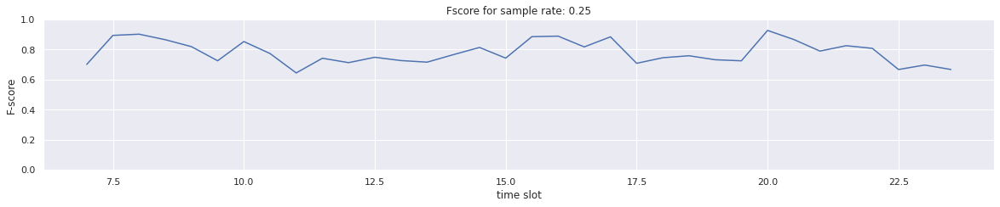

In [ ]:
from IPython.display import clear_output

def rectangle_set_list(n_samples, a, rctgs, datetime, interval):
    '''
        n_samples: int, number of points
        a: int list, the probability to be in the smaller rectangles
        rctgs: list of rectangles of class Rectangle, the first one is the biggest one
        datetime: datetime, 'yyyy-mm-dd hh:mm:ss'
        interval: int, the lasting time (e.g. 12 hours) from the starting time (i.e. date)
    '''
    list_points = []
    d = 2

    # insert 0 at the beginning and 1 at the end
    a = [0] + a
    for i in range(1, len(a)):
        a[i] = a[i-1] + a[i]

    for j in range(n_samples):
        b = np.random.uniform(0,1)        # Generate a random float from 0 to 1
        for i in range(len(a)-1):
            if a[i] < b <= a[i+1]:
                tmp_rctg = rctgs[i]
                x = np.random.uniform(low=tmp_rctg.x_min, high=tmp_rctg.x_min+tmp_rctg.width)
                y = np.random.uniform(low=tmp_rctg.y_min, high=tmp_rctg.y_min+tmp_rctg.height)
                hour_low = datetime.hour
                hour = np.random.randint(low=hour_low, high=hour_low+interval)
                year, month, day = datetime.year, datetime.month, datetime.day
                minute = np.random.randint(low=0, high=59)
                second = np.random.randint(low=0, high=59)
                day_month = day_of_month(year, month)
                if hour >= 24:
                    hour = hour % 24
                    if day<day_month:
                        day = day + 1
                    else:
                        day = (day + 1) % day_month
                # date_str = str(year)+'-'+str(month).zfill(2)+'-'+str(day).zfill(2)+' '+str(hour).zfill(2)+':'+str(minute).zfill(2)+':'+str(second).zfill(2)
                date_generated = dt.date(year, month, day)
                time_generated = dt.time(hour, minute, second)
                datetime_generated = dt.datetime.combine(date_generated, time_generated)
                list_points.append(ClusterPoint(d, [x,y],ID=j,datetime=datetime_generated,type_point='Rect'))
                break
    return list_points

def n_type_of_points_in_rectangle(rects, points, type_req):
    '''
        p: one point of format (diemension, coords, cluster_label)
        q: one point of format (diemension, coords, cluster_label)
        points: list of points of format (diemension, coords, cluster_label)
    '''
    cnt = 0
    for i in range(len(points)):
        x,y = points[i].coords
        for r in rects:
            xl = r.x_min
            xr = r.x_max
            yl = r.y_min
            yr = r.y_max
            if xl <= x <= xr and yl <= y <= yr and points[i].type_point==type_req:
                cnt += 1
                break
    return cnt

def generate_bg_list(df):
    n, d = len(df.index), 2
    list_points = []
    for j in range(n):
        x, y = df.iloc[j,-4], df.iloc[j,-3]
        datetime_generated = df.iloc[j,1]
        list_points.append(ClusterPoint(d, [x,y], ID=j, datetime=datetime_generated,type_point='taxi'))
    return list_points

def run_cluster_taxi_and_rect_prob(bg):
    """
    Reads the input set, clusters the points and writes to output

    :param path_in:     location of the input set
    :param path_out:    location to print the output
    """
    # Step 1: read file and create box graph
    # bg = taxi_set(epsilon, min_pts)
    print('number of points:',len(bg.points))
    
    # Step 2: Compute the core points
    find_core_points(bg)

    # Step 3: cluster the core points
    nr_clusters = compute_cluster_cores(bg)

    # Step 4: assign border points to clusters
    assign_border_points(bg)
    
    # points = bg.points
    # plot_clusters_taxi(points)

    # print("Cluster counter:", nr_clusters, file=sys.stderr)

def generate_data(taxi_df, rects, eps, mpt, prob=1):
    """
    Reads the input set, clusters the points and writes to output

    :param path_in:     location of the input set
    :param path_out:    location to print the output
    """
    # Step 1: read file and create box graph
    taxis = generate_bg_list(taxi_df)
    # rects = rectangle_set_list(n_points, a, rctgs, datetime, interval)
    if prob < 1:
        rect_prob = []
        for j in range(len(rects)):
            b = np.random.uniform(0,1)        # Generate a random float from 0 to 1
            if b <= prob:
                rect_prob.append(rects[j])
    else: rect_prob = rects
    data_list = taxis + rect_prob
    bg = BoxGraph(len(data_list), 2, eps, mpt, data_list)

    # Step 2: Compute the core points
    find_core_points(bg)

    # Step 3: cluster the core points
    nr_clusters = compute_cluster_cores(bg)

    # Step 4: assign border points to clusters
    assign_border_points(bg)

    return bg

def generate_data_set(taxis, n_points, a, rctgs, datetime, interval, eps, mpt, prob=1):
    """
    Reads the input set, clusters the points and writes to output

    :param path_in:     location of the input set
    :param path_out:    location to print the output
    """
    # Step 1: read file and create box graph
    # taxis = generate_bg_list(taxi_df)
    rects = rectangle_set_list(n_points, a, rctgs, datetime, interval)
    if prob < 1:
        rect_prob = []
        for j in range(len(rects)):
            b = np.random.uniform(0,1)        # Generate a random float from 0 to 1
            if b <= prob:
                rect_prob.append(rects[j])
    else: rect_prob = rects
    data_list = taxis + rect_prob
    bg = BoxGraph(len(data_list), 2, eps, mpt, data_list)

    # Step 2: Compute the core points
    find_core_points(bg)

    # Step 3: cluster the core points
    nr_clusters = compute_cluster_cores(bg)

    # Step 4: assign border points to clusters
    assign_border_points(bg)

    return bg, rects


def find_optimal_eps_mpt(taxi_df, rect_list, rctgs, prob):

    # fig = plt.figure(figsize=(30, 50))
    # fig.tight_layout()
    # plt.subplots_adjust(wspace=0,hspace=1)
    # fig.suptitle('DBSCAN using box graph with epsilon and minPts')

    min_area = 4
    lambda_eps, gamma_mpt = 0.1, 0.2
    min_area_r = math.sqrt(min_area/math.pi) 
    min_pow_eps = lambda_eps * math.log(min_area_r,1+lambda_eps)     # math.log(x, base)

    w_image, h_image = 471, 907
    z = max(w_image, h_image)
    max_pow_eps = math.log(z, 1+lambda_eps)
    pow_eps = np.array(range(int(min_pow_eps), int(max_pow_eps)+1, 10))
    # epsilons = list(range(int((1+lambda_eps)**min_pow_eps), int((1+lambda_eps)**max_pow_eps)+1))
    epsilon_list = (1+lambda_eps)**pow_eps
    epsilon_list = [epsilon_list[4]]

    # n = 2000
    # a = [0.5, 0.5]
    
    # rect_1 = Rectangle(130, 600, 30, 30)
    # rect_2 = Rectangle(250, 550, 40, 40)
    # rctgs = [rect_1, rect_2]

    # date = dt.date(2015,1,10)
    # time = dt.time(7,0,0)
    # datetime = dt.datetime.combine(date,time)

    # interval = 13

    max_avg_dens = 0
    eps_max_dens, mpt_max_dens = 0,0
    max_fscore = 0
    eps_max_fscore, mpt_max_fscore = 0,0

    #  plot Numerical Data
    row = len(epsilon_list) * 2  # number of rows
    column = 6  # number of columns
    order = 1  # initialize plot counter
    cnt = 0

    for eps in epsilon_list:
        # bg = taxi_set_and_random_rectangle(n_samples, a, rctgs, datetime, interval, eps)
        # points = generate_bg_list(data_oneday) + rect_set_list
        n_points = len(rect_list) + len(taxi_df.index)
        max_pow_mpt = math.log(n_points, 1+gamma_mpt)
        min_pts_pow_list = np.array(range(0,int(max_pow_mpt)+1,5))
        min_pts_list = (1+gamma_mpt)**min_pts_pow_list
        for mpt in min_pts_list:      
            import time as tm
            start = tm.time()
            # bg = BoxGraph(n_points, 2, eps, mpt, data_list) 
            # print('eps, mpt:', eps, mpt)
            bg = generate_data(taxi_df, rect_list, eps, mpt, prob)
            points = bg.points

            label = [p.cluster_label for p in points]
            label = np.array(label)

            colors = ['#'+("%06x" % random.randint(0, 0xFFFFFF)).upper() for _ in range(len(np.unique(label)))]
            
            # print(len(np.unique(label)), 'labels:', np.unique(label))
            # print('the first 5 labels:', np.unique(label))
            X = [np.array(points[i].coords) for i in range(len(points))]
            X = np.array(X)
            # print('number of coords:', len(X))
            # print('the first 5 coords:', X[:5])

            # ax_im = fig.add_subplot(row, column, order+cnt)
            # cnt += 1
            # # Hide spines, ticks, etc.
            # ax_im.axis('off')
            # ax_im.imshow(im, cmap='gray')
            # implot = plt.imshow(im)

            # for idx, col in enumerate(colors,1):
            #     # print(idx, col)
            #     cluster_data = label == idx
            #     ax_im.scatter(X[cluster_data, 0], X[cluster_data, 1],
            #                 c=col, marker='.', s=10)
            
            # currentAxis = plt.gca()
            # big_rect = rctgs[-1]
            cluster_rect = []
            unique_label = np.unique(label)
            # unique_label = unique_label[unique_label != -1]
            # for idx, lbl in enumerate(np.unique(label),1):
            for idx in range(1,len(unique_label)+1):
                cluster_data = label == idx
                if np.any(cluster_data):
                    left, right = np.min(X[cluster_data,0]), np.max(X[cluster_data,0])
                    bottom, top = np.min(X[cluster_data,1]), np.max(X[cluster_data,1])
                    width, height = abs(right-left), abs(top-bottom)
                    # currentAxis.add_patch(patches.Rectangle((left, bottom), width, height, linewidth=1, edgecolor='b', fill=None))
                    temp_rect = Rectangle(0.5*(left+right), 0.5*(top+bottom), width, height)
                    # print(left, right, top,bottom)
                    # print('x:',temp_rect.x,'y:',temp_rect.y, temp_rect.x_min )
                    cluster_rect.append(temp_rect)
            
            # print('number of clusters:', len(cluster_rect))
            average_density = 0
            f_score = 0
            n_taxi_points = n_rect_points = 0
            if len(cluster_rect)>0:
                # print('number of clusters:',len(cluster_rect))
                k_rects, k_density = dense_rectangle(points, cluster_rect, 3, 1)
                n_rect_points = n_type_of_points_in_rectangle(k_rects, points, 'Rect')
                n_taxi_points = n_type_of_points_in_rectangle(k_rects, points, 'taxi')
                f_score, _, _ = f_score_points_in_rect(rctgs, k_rects, points)
                f_socre = round(f_score, 4)
                if len(k_density)>0: average_density = np.mean(k_density)
                else: average_density = 0
                if average_density > max_avg_dens: 
                    max_avg_dens = average_density
                    eps_max_dens, mpt_max_dens = eps, mpt
                if f_score > max_fscore: 
                    max_fscore = f_score
                    eps_max_fscore, mpt_max_fscore = eps, mpt
            # print('f_score, eps, mpt', f_score, eps, mpt)
            #     for r in k_rects:
            #         currentAxis.add_patch(patches.Rectangle((r.x-r.width/2, r.y-r.height/2), r.width, r.height, linewidth=3, edgecolor='r', fill=None))
            # for r in rctgs:
            #     currentAxis.add_patch(patches.Rectangle((r.x-r.width/2, r.y-r.height/2), r.width, r.height, linewidth=1, edgecolor='b', fill=None))

            # print('the maximum average density:',max_avg_dens)
            end = tm.time()
            cost_time = end - start
            # title_1 = 'epsilon: ' + str(round(eps,2)) + '\n' + 'minPts: ' + str(round(mpt,2)) + '\n'
            # title_2 = 'It takes ' + str(round(cost_time, 4)) + ' seconds.' + '\n'
            # title_3_1 = 'average density: ' + str(round(average_density, 4))+'\n'
            # title_3 = 'f_score: ' + str(f_score) + '\n'
            # title_4 = 'number of clusters: '+str(len(cluster_rect)) + '\n'
            # title_5 = 'taxi data points: ' + str(n_taxi_points) + '\n'
            # title_6 = 'generated rect points: ' + str(n_rect_points)
            # title = title_1 + title_2 + title_3_1 + title_3 + title_4 + title_5 + title_6
            # ax_im.set_title(title)           
            # # ax_im.set_xlabel(xlabel)
            # ax_im.set_xticks([])
            # ax_im.set_yticks([])
            bg = None

    # plt.show()
    # print('maximum average density:', max_avg_dens, ', eps:', eps_max_dens, ', mpt:', mpt_max_dens)
    print('maximum fscore:', max_fscore, ', eps:', eps_max_fscore, ', mpt:', mpt_max_fscore)
    return eps_max_fscore, mpt_max_fscore
    
def plot_sliding_window_taxi_and_rect_multi_prob(df, begin_date, interval, w, column, eps, mpt, list_prob=[0.2], unit='minute'):
    '''
        df: dataframes
        begin_date: datetime
        interval: int, the window move to begin_time+interval next time
        w: int, the size of the sliding window
        unit: string, the unit of the sliding window
        column: string, the name of the required column

        only plot, not return
    '''

    rect_1 = Rectangle(130, 600, 30, 30)
    rect_2 = Rectangle(250, 550, 40, 40)
    rctgs = [rect_1, rect_2]

    rect_set_list = rectangle_set_list(3000, [0.5,0.5], rctgs, begin_date, interval)
    
    start_time = begin_date

    after_start_date = df[column] >= start_time
    before_end_date = df[column] < start_time + dt.timedelta(minutes=w)
    between_two_dates = after_start_date & before_end_date
    # filtered_df = df.loc[between_two_dates]
    origin_filtered_df = df.loc[between_two_dates]

    # choose it with probability
    fscore_list = []
    time_cost_list = []
    for prob in list_prob:
        index_list = []
        fscore_for_one_prob = []
        time_cost_for_each = []
        filtered_df = origin_filtered_df
        n_samples = len(filtered_df.index)
        for j in range(n_samples):
            b = np.random.uniform(0,1)        # Generate a random float from 0 to 1
            if b <= prob:
                index_list.append(j)
        sampled_df = filtered_df.iloc[np.array(index_list)]

        # initializing the window
        init_df = TimeWindow(w, start_time, sampled_df)
        filtered_tw = init_df
        latest_window = filtered_tw.window

        #  plot Numerical Data
        row = 4  # number of rows
        n_col = 6  # number of columns
        order = 1  # initialize plot counter
        cnt = 0

        im = plt.imread('manhattan.png')
        dpi = 80
        height, width, depth = im.shape
        figsize = width / float(dpi), height / float(dpi)
        
        update_start_time = start_time
        # fig.suptitle('DBSCAN using box graph with epsilon and minPts')
        
        # generate the boxgraph for the window and run DBSCAN
        for _ in range(34):

            import time
            time_cost_start = time.time()
            
            # if filtered_tw.start_time == begin_date+dt.timedelta(hours=3) or \
            #     filtered_tw.start_time == begin_date+dt.timedelta(hours=9) or \
            #     filtered_tw.start_time == begin_date+dt.timedelta(hours=12) or \
            #     filtered_tw.start_time == begin_date+dt.timedelta(hours=14):
            #     epsilon, minpts = find_optimal_eps_mpt(latest_window, rect_set_list, rctgs, prob)
            #     eps, mpt = epsilon, minpts

            temp_taxi_list = generate_bg_list(latest_window)
            # temp_bg = BoxGraph(len(temp_point_list), 2, eps, int(mpt*prob), temp_point_list)
            temp_bg, rect_set_list = generate_data_set(temp_taxi_list, 3000, [0.5,0.5], rctgs, begin_date, interval, eps, int(mpt*prob), prob)
            # temp_bg = generate_data_set(latest_window, rect_set_list, eps, int(mpt*prob))
            print('the eps and mpt of boxgraph:', temp_bg.eps, temp_bg.min_pts)
            run_cluster_taxi_and_rect_prob(temp_bg)
            points = temp_bg.points

            X_prob = [np.array(points[i].coords) for i in range(len(points))]
            X_prob = np.array(X_prob)
            label_prob = [points[i].cluster_label for i in range(len(points))]
            label_prob = np.array(label_prob)
            colors = ['#'+("%06x" % random.randint(0, 0xFFFFFF)).upper() for _ in range(len(label_prob))]

            # label = [points[i].cluster_label for i in range(len(points))]
            # label = np.array(label)

            df_not_prob = temp_taxi_list + rect_set_list
            X = [np.array(df_not_prob[i].coords) for i in range(len(df_not_prob))]
            X = np.array(X)
            label = [df_not_prob[i].cluster_label for i in range(len(df_not_prob))]
            label = np.array(label)
            
            # cmap = plt.get_cmap('gnuplot')
            # colors = [cmap(i) for i in np.linspace(0, 1, len(label))]
            
            # # ax = fig.add_subplot(row, n_col, order+cnt)
            # fig = plt.figure(figsize=figsize)
            # ax = fig.add_axes([0, 0, 1, 1])
            # cnt += 1
            # ax.imshow(im, cmap='gray')
            # implot = plt.imshow(im)
            # ax.axis('off')

            # # for idx, col in enumerate(colors):
            # #     # print(idx, col)
            # #     cluster_data = label == idx
            # #     dots = ax.scatter(X[cluster_data, 0], X[cluster_data, 1],
            # #                 c=col, marker='.', s=10)
            # dots = ax.scatter(X[:, 0], X[:, 1],
            #                 marker='.', s=10)

            # currentAxis = plt.gca()
            # big_rect = rctgs[-1]
            cluster_rect = []
            for idx in range(1,len(np.unique(label_prob))+1):
                cluster_data = label_prob == idx
                # print(len(cluster_data),np.unique(cluster_data))
                if np.any(cluster_data):
                    left, right = np.min(X_prob[cluster_data,0]), np.max(X_prob[cluster_data,0])
                    bottom, top = np.min(X_prob[cluster_data,1]), np.max(X_prob[cluster_data,1])
                    width, height = abs(right-left), abs(top-bottom)
                    # currentAxis.add_patch(patches.Rectangle((left, bottom), width, height, linewidth=1, edgecolor='b', fill=None))
                    temp_rect = Rectangle(0.5*(left+right), 0.5*(top+bottom), width, height)
                    cluster_rect.append(temp_rect)

            k_rects, average_density = dense_rectangle(df_not_prob, cluster_rect)
            # print(len(k_rects), average_density)
            points_in_rects = np.array(points_in_rect(k_rects, df_not_prob))
            n_rect_points = n_type_of_points_in_rectangle(k_rects, df_not_prob, 'Rect')
            n_taxi_points = n_type_of_points_in_rectangle(k_rects, df_not_prob, 'taxi')
            f_score, _, _ = f_score_points_in_rect_duplicate(rctgs, k_rects, df_not_prob)
            fscore_for_one_prob.append(f_score)
            f_socre = round(f_score, 4)

            # ax.scatter(X[:,0], X[:,1], s=2, c='grey')

            # for r in k_rects:
            #     ax.add_patch(patches.Rectangle((r.x-r.width/2, r.y-r.height/2), r.width, r.height, linewidth=2, edgecolor='r', fill=None))
            # for r in rctgs:
            #     ax.add_patch(patches.Rectangle((r.x-r.width/2, r.y-r.height/2), r.width, r.height, linewidth=1, edgecolor='b', fill=None))

            # if len(points_in_rects)>0:
            #     x, y = points_in_rects[:, 0], points_in_rects[:, 1]
            #     ax.plot(x, y, 'r.', markersize=2)
            #     from pandas import DataFrame
            #     pos = []
            #     for i in range(len(x)):
            #         pos.append([x[i], y[i]])
            #     df_predicted = DataFrame (pos,columns=['pos_x','pos_y'])
            #     contour = sns.kdeplot(data=df_predicted, x='pos_x', y='pos_y', fill=True)
            #     contour.collections[0].set_alpha(0)

            # title_1 = str(update_start_time)+' to '+str(update_start_time+ dt.timedelta(minutes=w)) + ' \n'
            # title_2 = 'sample rate:' + str(prob) + '\n'
            # title_3 = 'f_score: ' + str(f_score) + '\n'
            # title_4 = 'number of clusters: '+str(len(cluster_rect)) + '\n'
            # title_5 = 'number of original taxi data points: ' + str(n_taxi_points) + '\n'
            # title_6 = 'number of generated rect data points: ' + str(n_rect_points)
            # title_str = title_1 + title_3 + title_4 + title_5 + title_6
            # plt.title(title_str)
            # update_start_time += dt.timedelta(minutes=interval)
            
            # # Hide spines, ticks, etc.
            # ax.axis('off')

            # plt.scatter(core_points[:,0], core_points[:,1], c='b', s=50)
            # plt.title("DBScan clustering")
            # plt.xticks([])
            # plt.yticks([])

            filtered_tw = filtered_tw.sliding_with_prob(interval, df, column, prob)
            latest_window = filtered_tw.window
            filtered_df_tw = TimeWindow(w, update_start_time, filtered_df)
            filtered_df_tw = filtered_df_tw.sliding(interval, df, column)
            filtered_df = filtered_df_tw.window

            import time
            time_cost_end = time.time()
            time_cost = time_cost_end - time_cost_start
            time_cost_for_each.append(time_cost)

        fscore_list.append(np.array(fscore_for_one_prob))
        time_cost_list.append(np.array(time_cost_for_each))
    
    fscore_list = np.array(fscore_list)
    time_cost_list = np.array(time_cost_list)
    return fscore_list, time_cost_list
        
if __name__ == '__main__':

    date_sat = dt.date(2015,1,10)
    time = dt.time(7,0,0)
    datetime_sat = dt.datetime.combine(date_sat,time)
    date_fri = dt.date(2015,1,9)
    datetime_fri = dt.datetime.combine(date_fri,time)
    date_sun = dt.date(2015,1,11)
    datetime_sun = dt.datetime.combine(date_sun,time)
    date_mon = dt.date(2015,1,12)
    datetime_mon = dt.datetime.combine(date_mon,time)

    list_prob = [1/4]    
    fscore_list_sat, time_cost_list_sat = plot_sliding_window_taxi_and_rect_multi_prob(data_sat, datetime_sat, 30, 60, 'tpep_pickup_datetime', 45, 590, list_prob)
    # fscore_list_sun, time_cost_list_sun = plot_sliding_window_taxi_and_rect_multi_prob(data_sun, datetime_sun, 30, 60, 'tpep_pickup_datetime', 45, 590, list_prob)
    # fscore_list_fri, time_cost_list_fri = plot_sliding_window_taxi_and_rect_multi_prob(data_fri, datetime_fri, 30, 60, 'tpep_pickup_datetime', 45, 590, list_prob)
    # fscore_list_mon, time_cost_list_mon = plot_sliding_window_taxi_and_rect_multi_prob(data_mon, datetime_mon, 30, 60, 'tpep_pickup_datetime', 45, 590, list_prob)
    # fscore_list = [fscore_list_fri, fscore_list_sat, fscore_list_sun, fscore_list_mon]
    fscore_list = [fscore_list_sat]
    fscore_list = np.array(fscore_list)
    
    prob_row = 4
    prob_col = 1
    order = 1
    cnt = 0

    fig = plt.figure(figsize=(20, 15))
    list_time = np.arange(7,24,0.5)
    for i in range(len(list_prob)):
        ax = fig.add_subplot(prob_row, prob_col, order+cnt)
        title = 'Fscore for sample rate: ' + str(list_prob[i])
        ax.set_title(title)
        ax.plot(list_time, np.reshape(fscore_list[i],(34,)), 'b')
        # ax.legend(loc = 'lower right')
        # ax.plot([0, 1], [0, 1],'r--')
        ax.set_xlim()
        ax.set_ylim([0, 1])
        ax.set_ylabel('F-score')
        ax.set_xlabel('time slot')
        cnt += 1

    # fig = plt.figure(figsize=(8, 5))
    # ax = fig.add_subplot(2, 1, 1)
    # ax.set_title('F-score for different sample rate')
    # average_fscore = np.mean(fscore_list, axis=1)
    # plt.plot(list_prob, average_fscore, 'b')
    # # plt.legend(loc = 'lower right')
    # # plt.plot([0, 1], [0, 1],'r--')
    # ax.set_xlim([0, 0.5])
    # ax.set_ylim([0, 1])
    # ax.set_ylabel('F-score')
    # ax.set_xlabel('sample rate')

    # fig = plt.figure(figsize=(8, 5))
    # ax = fig.add_subplot(2, 1, 2)
    # ax.set_title('F-score for different sample rate')
    # average_time_cost = np.mean(time_cost_list, axis=1)
    #  plt.plot(list_prob, average_time_cost, 'b')
    # # plt.legend(loc = 'lower right')
    # # plt.plot([0, 1], [0, 1],'r--')
    # ax.set_xlim([0, 0.5])
    # ax.set_ylim()
    # ax.set_ylabel('time_cost')
    # ax.set_xlabel('sample rate')

    plt.show()

number of points: 5022
number of points: 5765
number of points: 6825
number of points: 8378
number of points: 9818
number of points: 10651
number of points: 11360
number of points: 12209
number of points: 13207
number of points: 14041
number of points: 14273
number of points: 14298
number of points: 13900
number of points: 13339
number of points: 13352
number of points: 13901
number of points: 14119
number of points: 14002
number of points: 13102
number of points: 12631
number of points: 13784
number of points: 15380
number of points: 16160
number of points: 8901
number of points: 2458
number of points: 2874
number of points: 3381
number of points: 4205
number of points: 4863
number of points: 5262
number of points: 5704
number of points: 6144
number of points: 6527
number of points: 6851
number of points: 7194
number of points: 7259
number of points: 6900
number of points: 6710
number of points: 6877
number of points: 7104
number of points: 7257
number of points: 7216
number of points

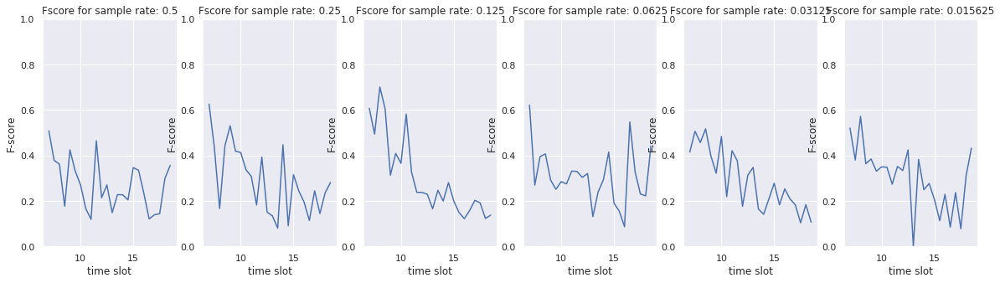

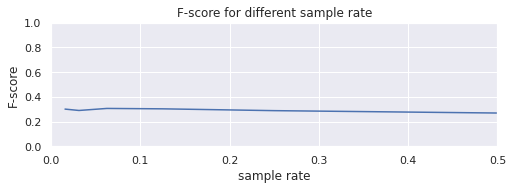

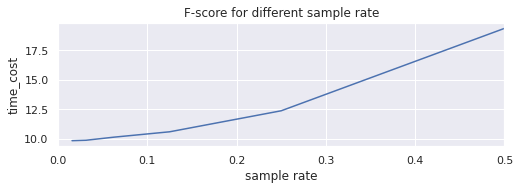

In [ ]:
from IPython.display import clear_output

def rectangle_set_list(n_samples, a, rctgs, datetime, interval):
    '''
        n_samples: int, number of points
        a: int list, the probability to be in the smaller rectangles
        rctgs: list of rectangles of class Rectangle, the first one is the biggest one
        datetime: datetime, 'yyyy-mm-dd hh:mm:ss'
        interval: int, the lasting time (e.g. 12 hours) from the starting time (i.e. date)
    '''
    list_points = []
    d = 2

    # insert 0 at the beginning and 1 at the end
    a = [0] + a
    for i in range(1, len(a)):
        a[i] = a[i-1] + a[i]

    for j in range(n_samples):
        b = np.random.uniform(0,1)        # Generate a random float from 0 to 1
        for i in range(len(a)-1):
            if a[i] < b <= a[i+1]:
                tmp_rctg = rctgs[i]
                x = np.random.uniform(low=tmp_rctg.x_min, high=tmp_rctg.x_min+tmp_rctg.width)
                y = np.random.uniform(low=tmp_rctg.y_min, high=tmp_rctg.y_min+tmp_rctg.height)
                hour_low = datetime.hour
                hour = np.random.randint(low=hour_low, high=hour_low+interval)
                year, month, day = datetime.year, datetime.month, datetime.day
                minute = np.random.randint(low=0, high=59)
                second = np.random.randint(low=0, high=59)
                day_month = day_of_month(year, month)
                if hour >= 24:
                    hour = hour % 24
                    if day<day_month:
                        day = day + 1
                    else:
                        day = (day + 1) % day_month
                # date_str = str(year)+'-'+str(month).zfill(2)+'-'+str(day).zfill(2)+' '+str(hour).zfill(2)+':'+str(minute).zfill(2)+':'+str(second).zfill(2)
                date_generated = dt.date(year, month, day)
                time_generated = dt.time(hour, minute, second)
                datetime_generated = dt.datetime.combine(date_generated, time_generated)
                list_points.append(ClusterPoint(d, [x,y],ID=j,datetime=datetime_generated,type_point='Rect'))
                break
    return list_points

def n_type_of_points_in_rectangle(rects, points, type_req):
    '''
        p: one point of format (diemension, coords, cluster_label)
        q: one point of format (diemension, coords, cluster_label)
        points: list of points of format (diemension, coords, cluster_label)
    '''
    cnt = 0
    for i in range(len(points)):
        x,y = points[i].coords
        for r in rects:
            xl = r.x_min
            xr = r.x_max
            yl = r.y_min
            yr = r.y_max
            if xl <= x <= xr and yl <= y <= yr and points[i].type_point==type_req:
                cnt += 1
                break
    return cnt

def generate_bg_list(df):
    n, d = len(df.index), 2
    list_points = []
    for j in range(n):
        x, y = df.iloc[j,-4], df.iloc[j,-3]
        datetime_generated = df.iloc[j,1]
        list_points.append(ClusterPoint(d, [x,y], ID=j, datetime=datetime_generated,type_point='taxi'))
    return list_points

def run_cluster_taxi_and_rect_prob(bg):
    """
    Reads the input set, clusters the points and writes to output

    :param path_in:     location of the input set
    :param path_out:    location to print the output
    """
    # Step 1: read file and create box graph
    # bg = taxi_set(epsilon, min_pts)
    print('number of points:',len(bg.points))
    
    # Step 2: Compute the core points
    find_core_points(bg)

    # Step 3: cluster the core points
    nr_clusters = compute_cluster_cores(bg)

    # Step 4: assign border points to clusters
    assign_border_points(bg)
    
    # points = bg.points
    # plot_clusters_taxi(points)

    # print("Cluster counter:", nr_clusters, file=sys.stderr)

def dense_rectangle_pq(points, n_pairs, n_return_points):
    '''
        n: int - the number of rectangles
        input_obj: object with format (n,d,k,cluster_points)
    '''
    c = n_pairs
    k = n_return_points
    # k = int(math.sqrt(c))
    # k = 2 * n**2 + n
    # c = 4 * k**2 + k    # the function with k
    list_rectangles = []
    list_densities = []
    # points = input_obj.cluster_points
    cnt = 0

    for i in range(c):
    # while len(list_rectangles) < c:
        p, q = random.choices(points, k=2)
        center_x, center_y = (p.coords[0]+q.coords[0])/2, (p.coords[1]+q.coords[1])/2
        center_width, center_height = abs(p.coords[0]-q.coords[0]), abs(p.coords[1]-q.coords[1])
        rect_pq = Rectangle(center_x, center_y, center_width, center_height)
        if rect_pq.area>1:
            density_pq = n_of_points_in_rectangle_pq(p,q,points) / (rect_pq.area+EPS)
            list_rectangles.append(rect_pq)
            list_densities.append(density_pq)

    # zip and sort
    sorted_densities, sorted_rectangles = (list(t) for t in zip(*sorted(zip(list_densities, list_rectangles),key=itemgetter(0))))
    sorted_densities, sorted_rectangles = sorted_densities[::-1], sorted_rectangles[::-1]
    return sorted_rectangles[:k], sorted_densities[:k]

def plot_sliding_window_taxi_and_rect_multi_prob(df, begin_date, interval, w, column, eps, mpt, list_prob=[0.2], unit='minute'):
    '''
        df: dataframes
        begin_date: datetime
        interval: int, the window move to begin_time+interval next time
        w: int, the size of the sliding window
        unit: string, the unit of the sliding window
        column: string, the name of the required column

        only plot, not return
    '''

    rect_1 = Rectangle(130, 600, 30, 30)
    rect_2 = Rectangle(250, 550, 40, 40)
    rctgs = [rect_1, rect_2]

    date = dt.date(2015,1,10)
    time = dt.time(7,0,0)
    datetime = dt.datetime.combine(date,time)

    rect_set_list = rectangle_set_list(3000, [0.5,0.5], rctgs, datetime, interval)
    
    start_time = begin_date

    after_start_date = df[column] >= start_time
    before_end_date = df[column] < start_time + dt.timedelta(minutes=w)
    between_two_dates = after_start_date & before_end_date
    # filtered_df = df.loc[between_two_dates]
    origin_filtered_df = df.loc[between_two_dates]

    # choose it with probability
    fscore_list = []
    time_cost_list = []
    for prob in list_prob:
        index_list = []
        fscore_for_one_prob = []
        time_cost_for_each = []
        filtered_df = origin_filtered_df
        n_samples = len(filtered_df.index)
        for j in range(n_samples):
            b = np.random.uniform(0,1)        # Generate a random float from 0 to 1
            if b <= prob:
                index_list.append(j)
        sampled_df = filtered_df.iloc[np.array(index_list)]

        index_list = []
        for j in range(len(rect_set_list)):
            b = np.random.uniform(0,1)        # Generate a random float from 0 to 1
            if b <= prob:
                index_list.append(j)
        sampled_rect_set = list(map(rect_set_list.__getitem__, index_list))  # rect_set_list[np.array(index_list)]
    
        # initializing the window
        init_df = TimeWindow(w, start_time, sampled_df)
        filtered_tw = init_df
        latest_window = filtered_tw.window

        #  plot Numerical Data
        row = 4  # number of rows
        n_col = 6  # number of columns
        order = 1  # initialize plot counter
        cnt = 0

        im = plt.imread('manhattan.png')
        dpi = 80
        height, width, depth = im.shape
        figsize = width / float(dpi), height / float(dpi)
        
        update_start_time = start_time
        # fig.suptitle('DBSCAN using box graph with epsilon and minPts')
        
        # generate the boxgraph for the window and run DBSCAN
        for _ in range(24):

            import time
            time_cost_start = time.time()
            
            temp_point_list = generate_bg_list(latest_window) + sampled_rect_set
            temp_bg = BoxGraph(len(temp_point_list), 2, eps, int(mpt*prob), temp_point_list)
            run_cluster_taxi_and_rect_prob(temp_bg)
            points = temp_bg.points

            X_prob = [np.array(points[i].coords) for i in range(len(points))]
            X_prob = np.array(X_prob)
            label_prob = [points[i].cluster_label for i in range(len(points))]
            label_prob = np.array(label_prob)
            colors = ['#'+("%06x" % random.randint(0, 0xFFFFFF)).upper() for _ in range(len(label_prob))]

            # label = [points[i].cluster_label for i in range(len(points))]
            # label = np.array(label)

            df_not_prob = generate_bg_list(filtered_df) + rect_set_list
            X = [np.array(df_not_prob[i].coords) for i in range(len(df_not_prob))]
            X = np.array(X)
            label = [df_not_prob[i].cluster_label for i in range(len(df_not_prob))]
            label = np.array(label)
            
            # cmap = plt.get_cmap('gnuplot')
            # colors = [cmap(i) for i in np.linspace(0, 1, len(label))]
            
            # # ax = fig.add_subplot(row, n_col, order+cnt)
            # fig = plt.figure(figsize=figsize)
            # ax = fig.add_axes([0, 0, 1, 1])
            # cnt += 1
            # ax.imshow(im, cmap='gray')
            # implot = plt.imshow(im)
            # ax.axis('off')

            # # for idx, col in enumerate(colors):
            # #     # print(idx, col)
            # #     cluster_data = label == idx
            # #     dots = ax.scatter(X[cluster_data, 0], X[cluster_data, 1],
            # #                 c=col, marker='.', s=10)
            # dots = ax.scatter(X[:, 0], X[:, 1],
            #                 marker='.', s=10)

            # currentAxis = plt.gca()
            # big_rect = rctgs[-1]
            # cluster_rect = []
            # for idx in range(1,len(np.unique(label_prob))+1):
            #     cluster_data = label_prob == idx
            #     # print(len(cluster_data),np.unique(cluster_data))
            #     if np.any(cluster_data):
            #         left, right = np.min(X_prob[cluster_data,0]), np.max(X_prob[cluster_data,0])
            #         bottom, top = np.min(X_prob[cluster_data,1]), np.max(X_prob[cluster_data,1])
            #         width, height = abs(right-left), abs(top-bottom)
            #         # currentAxis.add_patch(patches.Rectangle((left, bottom), width, height, linewidth=1, edgecolor='b', fill=None))
            #         temp_rect = Rectangle(0.5*(left+right), 0.5*(top+bottom), width, height)
            #         cluster_rect.append(temp_rect)

            # k_rects, average_density = dense_rectangle(temp_point_list, cluster_rect)
            k_rects, average_density = dense_rectangle_pq(points, 10, 5)
            # print(len(k_rects), average_density)
            points_in_rects = np.array(points_in_rect(k_rects, df_not_prob))
            n_rect_points = n_type_of_points_in_rectangle(k_rects, df_not_prob, 'Rect')
            n_taxi_points = n_type_of_points_in_rectangle(k_rects, df_not_prob, 'taxi')
            f_score, _, _ = f_score_points_in_rect(rctgs, k_rects, df_not_prob)
            fscore_for_one_prob.append(f_score)
            f_socre = round(f_score, 4)

            # ax.scatter(X[:,0], X[:,1], s=2, c='grey')

            # for r in k_rects:
            #     ax.add_patch(patches.Rectangle((r.x-r.width/2, r.y-r.height/2), r.width, r.height, linewidth=2, edgecolor='r', fill=None))
            # for r in rctgs:
            #     ax.add_patch(patches.Rectangle((r.x-r.width/2, r.y-r.height/2), r.width, r.height, linewidth=1, edgecolor='b', fill=None))

            # if len(points_in_rects)>0:
            #     x, y = points_in_rects[:, 0], points_in_rects[:, 1]
            #     ax.plot(x, y, 'r.', markersize=2)
            #     from pandas import DataFrame
            #     pos = []
            #     for i in range(len(x)):
            #         pos.append([x[i], y[i]])
            #     df_predicted = DataFrame (pos,columns=['pos_x','pos_y'])
            #     contour = sns.kdeplot(data=df_predicted, x='pos_x', y='pos_y', fill=True)
            #     contour.collections[0].set_alpha(0)

            # title_1 = str(update_start_time)+' to '+str(update_start_time+ dt.timedelta(minutes=w)) + ' \n'
            # title_2 = 'sample rate:' + str(prob) + '\n'
            # title_3 = 'f_score: ' + str(f_score) + '\n'
            # title_4 = 'number of clusters: '+str(len(cluster_rect)) + '\n'
            # title_5 = 'number of original taxi data points: ' + str(n_taxi_points) + '\n'
            # title_6 = 'number of generated rect data points: ' + str(n_rect_points)
            # title_str = title_1 + title_3 + title_4 + title_5 + title_6
            # plt.title(title_str)
            # update_start_time += dt.timedelta(minutes=interval)
            
            # # Hide spines, ticks, etc.
            # ax.axis('off')

            # plt.scatter(core_points[:,0], core_points[:,1], c='b', s=50)
            # plt.title("DBScan clustering")
            # plt.xticks([])
            # plt.yticks([])

            filtered_tw = filtered_tw.sliding_with_prob(interval, df, column, prob)
            latest_window = filtered_tw.window
            filtered_df_tw = TimeWindow(w, update_start_time, filtered_df)
            filtered_df_tw = filtered_df_tw.sliding(interval, df, column)
            filtered_df = filtered_df_tw.window

            import time
            time_cost_end = time.time()
            time_cost = time_cost_end - time_cost_start
            time_cost_for_each.append(time_cost)

        fscore_list.append(np.array(fscore_for_one_prob))
        time_cost_list.append(np.array(time_cost_for_each))
    
    fscore_list = np.array(fscore_list)
    time_cost_list = np.array(time_cost_list)
    return fscore_list, time_cost_list
        
if __name__ == '__main__':
    list_prob = [1/2,1/4,1/8,1/16,1/32,1/64]    
    fscore_list, time_cost_list = plot_sliding_window_taxi_and_rect_multi_prob(data_oneday, s_datetime, 30, 60, 'tpep_pickup_datetime', 45, 50, list_prob)
    prob_row = 1
    prob_col = len(list_prob)
    order = 1
    cnt = 0

    fig = plt.figure(figsize=(20, 5))
    list_time = np.arange(7,19,0.5)
    for i in range(len(list_prob)):
        ax = fig.add_subplot(prob_row, prob_col, order+cnt)
        title = 'Fscore for sample rate: ' + str(list_prob[i])
        ax.set_title(title)
        ax.plot(list_time, fscore_list[i], 'b')
        # ax.legend(loc = 'lower right')
        # ax.plot([0, 1], [0, 1],'r--')
        ax.set_xlim()
        ax.set_ylim([0, 1])
        ax.set_ylabel('F-score')
        ax.set_xlabel('time slot')
        cnt += 1

    fig = plt.figure(figsize=(8, 5))
    ax = fig.add_subplot(2, 1, 1)
    ax.set_title('F-score for different sample rate')
    average_fscore = np.mean(fscore_list, axis=1)
    plt.plot(list_prob, average_fscore, 'b')
    # plt.legend(loc = 'lower right')
    # plt.plot([0, 1], [0, 1],'r--')
    ax.set_xlim([0, 0.5])
    ax.set_ylim([0, 1])
    ax.set_ylabel('F-score')
    ax.set_xlabel('sample rate')

    fig = plt.figure(figsize=(8, 5))
    ax = fig.add_subplot(2, 1, 2)
    ax.set_title('F-score for different sample rate')
    average_time_cost = np.mean(time_cost_list, axis=1)
    plt.plot(list_prob, average_time_cost, 'b')
    # plt.legend(loc = 'lower right')
    # plt.plot([0, 1], [0, 1],'r--')
    ax.set_xlim([0, 0.5])
    ax.set_ylim()
    ax.set_ylabel('time_cost')
    ax.set_xlabel('sample rate')

    plt.show()

In [ ]:
from IPython.display import clear_output

def rectangle_set_list(n_samples, a, rctgs, datetime, interval):
    '''
        n_samples: int, number of points
        a: int list, the probability to be in the smaller rectangles
        rctgs: list of rectangles of class Rectangle, the first one is the biggest one
        datetime: datetime, 'yyyy-mm-dd hh:mm:ss'
        interval: int, the lasting time (e.g. 12 hours) from the starting time (i.e. date)
    '''
    list_points = []
    d = 2

    # insert 0 at the beginning and 1 at the end
    a = [0] + a
    for i in range(1, len(a)):
        a[i] = a[i-1] + a[i]

    for j in range(n_samples):
        b = np.random.uniform(0,1)        # Generate a random float from 0 to 1
        for i in range(len(a)-1):
            if a[i] < b <= a[i+1]:
                tmp_rctg = rctgs[i]
                x = np.random.uniform(low=tmp_rctg.x_min, high=tmp_rctg.x_min+tmp_rctg.width)
                y = np.random.uniform(low=tmp_rctg.y_min, high=tmp_rctg.y_min+tmp_rctg.height)
                hour_low = datetime.hour
                hour = np.random.randint(low=hour_low, high=hour_low+interval)
                year, month, day = datetime.year, datetime.month, datetime.day
                minute = np.random.randint(low=0, high=59)
                second = np.random.randint(low=0, high=59)
                day_month = day_of_month(year, month)
                if hour >= 24:
                    hour = hour % 24
                    if day<day_month:
                        day = day + 1
                    else:
                        day = (day + 1) % day_month
                # date_str = str(year)+'-'+str(month).zfill(2)+'-'+str(day).zfill(2)+' '+str(hour).zfill(2)+':'+str(minute).zfill(2)+':'+str(second).zfill(2)
                date_generated = dt.date(year, month, day)
                time_generated = dt.time(hour, minute, second)
                datetime_generated = dt.datetime.combine(date_generated, time_generated)
                list_points.append(ClusterPoint(d, [x,y],ID=j,datetime=datetime_generated,type_point='Rect'))
                break
    return list_points

def n_type_of_points_in_rectangle(rects, points, type_req):
    '''
        p: one point of format (diemension, coords, cluster_label)
        q: one point of format (diemension, coords, cluster_label)
        points: list of points of format (diemension, coords, cluster_label)
    '''
    cnt = 0
    for i in range(len(points)):
        x,y = points[i].coords
        for r in rects:
            xl = r.x_min
            xr = r.x_max
            yl = r.y_min
            yr = r.y_max
            if xl <= x <= xr and yl <= y <= yr and points[i].type_point==type_req:
                cnt += 1
                break
    return cnt

def generate_bg_list(df):
    n, d = len(df.index), 2
    list_points = []
    for j in range(n):
        x, y = df.iloc[j,-4], df.iloc[j,-3]
        datetime_generated = df.iloc[j,1]
        list_points.append(ClusterPoint(d, [x,y], ID=j, datetime=datetime_generated,type_point='taxi'))
    return list_points

def dense_disjoint_rectangle(list_rect,percent):
    '''
        list_rect: list - Rectangle, sorted by density (descentding)
        list_dens: list - float
        percent: float - the maximum overlap percentage
    '''
    disjoint_rect = random.choice(list_rect)
    for r in list_rect:
        flag_disjoint = True
        for dr in disjoint_rect:
            if intersect_area(r, dr) > percent*r.area or intersect_area(r, dr) > percent*dr.area:
                flag_disjoint = False
        if flag_disjoint:
            disjoint_rect.append(r)
    return disjoint_rect

def dense_rectangle_pq(points, n_pairs, n_return_points):
    '''
        n: int - the number of rectangles
        input_obj: object with format (n,d,k,cluster_points)
    '''
    c = n_pairs
    k = n_return_points
    # k = int(math.sqrt(c))
    # k = 2 * n**2 + n
    # c = 4 * k**2 + k    # the function with k
    list_rectangles = []
    list_densities = []
    # points = input_obj.cluster_points
    cnt = 0

    for i in range(c):
    # while len(list_rectangles) < c:
        p, q = random.choices(points, k=2)
        center_x, center_y = (p.coords[0]+q.coords[0])/2, (p.coords[1]+q.coords[1])/2
        center_width, center_height = abs(p.coords[0]-q.coords[0]), abs(p.coords[1]-q.coords[1])
        rect_pq = Rectangle(center_x, center_y, center_width, center_height)
        if rect_pq.area>1:
            density_pq = n_of_points_in_rectangle_pq(p,q,points) / (rect_pq.area+EPS)
            list_rectangles.append(rect_pq)
            list_densities.append(density_pq)
        if len(list_rectangle) >= k and len(list_densities) >= k:
            break

    # zip and sort
    sorted_densities, sorted_rectangles = (list(t) for t in zip(*sorted(zip(list_densities, list_rectangles),key=itemgetter(0))))
    sorted_densities, sorted_rectangles = sorted_densities[::-1], sorted_rectangles[::-1]
    return sorted_rectangles[:k], sorted_densities[:k]

def plot_sliding_window_taxi_and_rect_prob_sampling(df,list_n, list_a, rctgs_extra, begin_date, interval, w, column, eps, mpt, prob=0.2, unit='minute'):
    '''
        df: dataframes
        begin_date: datetime
        interval: int, the window move to begin_time+interval next time
        w: int, the size of the sliding window
        unit: string, the unit of the sliding window
        column: string, the name of the required column

        only plot, not return
    '''
    start_time = begin_date

    after_start_date = df[column] >= start_time
    before_end_date = df[column] < start_time + dt.timedelta(minutes=w)
    between_two_dates = after_start_date & before_end_date
    filtered_df = df.loc[between_two_dates]

    # choose it with probability
    n_samples = len(filtered_df.index)
    index_list = []
    for j in range(n_samples):
        b = np.random.uniform(0,1)        # Generate a random float from 0 to 1
        if b <= prob:
            index_list.append(j)
    sampled_df = filtered_df.iloc[np.array(index_list)]

    # initializing the window
    init_df = TimeWindow(w, start_time, sampled_df)
    filtered_tw = init_df
    latest_window = filtered_tw.window

    lasting_hours = 12

    rect_set_list = rectangle_set_list(list_n, list_a, rctgs_extra, datetime, interval)
    index_list = []
    for j in range(len(rect_set_list)):
        b = np.random.uniform(0,1)        # Generate a random float from 0 to 1
        if b <= prob:
            index_list.append(j)
    sampled_rect_set = list(map(rect_set_list.__getitem__, index_list))  # rect_set_list[np.array(index_list)]
    
    #  plot Numerical Data
    row = 4  # number of rows
    n_col = 6  # number of columns
    order = 1  # initialize plot counter
    cnt = 0

    im = plt.imread('manhattan.png')
    dpi = 80
    height, width, depth = im.shape
    figsize = width / float(dpi), height / float(dpi)
    
    # fig.suptitle('DBSCAN using box graph with epsilon and minPts')
    
    # generate the boxgraph for the window and run DBSCAN
    for _ in range(24):

        temp_point_list = generate_bg_list(latest_window) + sampled_rect_set
        temp_bg = BoxGraph(len(temp_point_list), 2, eps, int(mpt*prob), temp_point_list)
        find_core_points(temp_bg)
        nr_clusters = compute_cluster_cores(temp_bg)
        assign_border_points(temp_bg)
        points = temp_bg.points

        X_prob = [np.array(points[i].coords) for i in range(len(points))]
        X_prob = np.array(X_prob)
        label_prob = [points[i].cluster_label for i in range(len(points))]
        label_prob = np.array(label_prob)
        colors = ['#'+("%06x" % random.randint(0, 0xFFFFFF)).upper() for _ in range(len(label_prob))]

        # label = [points[i].cluster_label for i in range(len(points))]
        # label = np.array(label)

        df_not_prob = generate_bg_list(filtered_df) + rect_set_list
        X = [np.array(df_not_prob[i].coords) for i in range(len(df_not_prob))]
        X = np.array(X)
        label = [df_not_prob[i].cluster_label for i in range(len(df_not_prob))]
        label = np.array(label)
        
        # cmap = plt.get_cmap('gnuplot')
        # colors = [cmap(i) for i in np.linspace(0, 1, len(label))]
        
        # ax = fig.add_subplot(row, n_col, order+cnt)
        fig = plt.figure(figsize=figsize)
        ax = fig.add_axes([0, 0, 1, 1])
        cnt += 1
        ax.imshow(im, cmap='gray')
        implot = plt.imshow(im)
        ax.axis('off')

        # dots = ax.scatter(X[:, 0], X[:, 1],
        #                  marker='.', s=10)

        # currentAxis = plt.gca()
        # big_rect = rctgs[-1]
        cluster_rect = []
        for idx in range(1,len(np.unique(label_prob))+1):
            cluster_data = label_prob == idx
            # print(len(cluster_data),np.unique(cluster_data))
            if np.any(cluster_data):
                left, right = np.min(X_prob[cluster_data,0]), np.max(X_prob[cluster_data,0])
                bottom, top = np.min(X_prob[cluster_data,1]), np.max(X_prob[cluster_data,1])
                width, height = abs(right-left), abs(top-bottom)
                # currentAxis.add_patch(patches.Rectangle((left, bottom), width, height, linewidth=1, edgecolor='b', fill=None))
                temp_rect = Rectangle(0.5*(left+right), 0.5*(top+bottom), width, height)
                cluster_rect.append(temp_rect)

        import time
        start = time.time()
        k_rects, average_density = dense_rectangle(points, cluster_rect)
        # print(len(k_rects), average_density)
        db = 0.5
        # if len(k_rects)>0:
        #     disjoint_rects = dense_disjoint_rectangle(k_rects, db)
        #     points_in_rects = np.array(points_in_rect(disjoint_rects, df_not_prob))
        points_in_rects = np.array(points_in_rect(k_rects, df_not_prob))
        n_rect_points = n_type_of_points_in_rectangle(k_rects, df_not_prob, 'Rect')
        n_taxi_points = n_type_of_points_in_rectangle(k_rects, df_not_prob, 'taxi')
        f_score, _, _ = f_score_points_in_rect(rctgs_extra, k_rects, df_not_prob)
        f_socre = round(f_score, 4)

        if len(points_in_rects)>0:
            x, y = points_in_rects[:, 0], points_in_rects[:, 1]
            # ax.plot(x, y, 'r.', markersize=2)
            # ax.scatter(X[:,0], X[:,1], s=2, c='grey')
            from pandas import DataFrame
            pos = []
            for i in range(len(x)):
                pos.append([x[i], y[i]])
            df_predicted = DataFrame (pos,columns=['pos_x','pos_y'])
            contour = sns.kdeplot(data=df_predicted, x='pos_x', y='pos_y', fill=True)
            contour.collections[0].set_alpha(0)
            # xmin, xmax = x.min(), x.max()
            # ymin, ymax = y.min(), y.max()
            # X_, Y_ = np.mgrid[xmin:xmax:100j, ymin:ymax:100j]
            # positions = np.vstack([X_.ravel(), Y_.ravel()])
            # values = np.vstack([x, y])
            # from scipy import stats
            # kernel = stats.gaussian_kde(values)
            # Z_ = np.reshape(kernel(positions).T, X_.shape)
            # ax.imshow(np.rot90(Z_), cmap=plt.cm.gist_earth_r,
            # extent=[xmin, xmax, ymin, ymax])

        # ax.plot(X[:,0], X[:,1], 'grey.', markersize=2)
        
        # contour.imshow(im,aspect = contour.get_aspect(),
        #   zorder = 1)
        currentAxis = plt.gca()
        # for r in disjoint_rects:
        #     currentAxis.add_patch(patches.Rectangle((r.x_min, r.y_min), r.width, r.height, linewidth=1, edgecolor='g', fill=None))
        ax.set_title("Sample Algorithm")
        import time
        end = time.time()
        cost_time = end-start

        # for r in k_rects:
        #     ax.add_patch(patches.Rectangle((r.x-r.width/2, r.y-r.height/2), r.width, r.height, linewidth=2, edgecolor='r', fill=None))
        for r in rctgs_extra:
            ax.add_patch(patches.Rectangle((r.x-r.width/2, r.y-r.height/2), r.width, r.height, linewidth=1, edgecolor='k', fill=None))

        title_1 = str(start_time)+' to '+str(start_time+ dt.timedelta(minutes=w)) + ' \n'
        title_3 = 'f_score: ' + str(f_score) + '\n'
        title_4 = 'number of clusters: '+str(len(cluster_rect)) + '\n'
        title_5 = 'number of original taxi data points: ' + str(n_taxi_points) + '\n'
        title_6 = 'number of generated rect data points: ' + str(n_rect_points)
        title_str = title_1 + title_3 + title_4 + title_5 + title_6
        plt.title(title_str)
        start_time += dt.timedelta(minutes=interval)
        
        # Hide spines, ticks, etc.
        ax.axis('off')

        # plt.scatter(core_points[:,0], core_points[:,1], c='b', s=50)
        # plt.title("DBScan clustering")
        # plt.xticks([])
        # plt.yticks([])

        filtered_tw = filtered_tw.sliding_with_prob(interval, df, 'tpep_pickup_datetime', prob)
        latest_window = filtered_tw.window
        filtered_df_tw = TimeWindow(w, start_time, filtered_df)
        filtered_df_tw = filtered_df_tw.sliding(interval, df, column)
        filtered_df = filtered_df_tw.window

    plt.show()

if __name__ == "__main__":

    rect_1 = Rectangle(130, 600, 30, 30)
    rect_2 = Rectangle(250, 550, 40, 40)
    rctgs = [rect_1, rect_2]

    k = 3
    a = [0.5, 0.5]

    n = 2000

    date = dt.date(2015,3,15)
    time = dt.time(7,0,0)
    datetime = dt.datetime.combine(date,time)
    lasting_hours = 12

    min_area = 1
    lambda_eps, gamma_mpt = 0.1, 0.2
    min_area_r = math.sqrt(min_area/math.pi) 
    min_pow_eps = lambda_eps * math.log(min_area_r,1+lambda_eps)     # math.log(x, base)

    w_image, h_image = 10, 10
    z = max(w_image, h_image)
    max_pow_eps = math.log(z, 1+lambda_eps)
    pow_eps = np.array(range(int(min_pow_eps), int(max_pow_eps)+1))
    # epsilons = list(range(int((1+lambda_eps)**min_pow_eps), int((1+lambda_eps)**max_pow_eps)+1))
    epsilon_list = (1+lambda_eps)**pow_eps

    import time 
    start = time.time()
    plot_sliding_window_taxi_and_rect_prob_sampling(data_oneday, n, a, rctgs, s_datetime, 30, 60, 'tpep_pickup_datetime', 45, 50, 1/4)
    end = time.time()
    print("Time taken:      {:.3f}s".format(end - start), file=sys.stderr)

Output hidden; open in https://colab.research.google.com to view.

[-1]
negative points: 983 = all points: 1900 - actual positive points: 917
true positvie points: 685 = actual positive points: 917 & predicted points: 870
false positvie points: 232 = all actual positive points: 917 - true positive points: 685
false positvie points: 185 = negative points: 983 & predicted points: 870
0.7873563218390804 685 185
0.7470010905125409 685 232
extra rects: [[2, 8, 1, 1], [8, 2, 2, 2], [5, 2, 2, 2]]
origin rects: [[9, 9, 1, 1], [2, 2, 2, 2], [6, 5, 4, 4], [5, 5, 10, 10]]


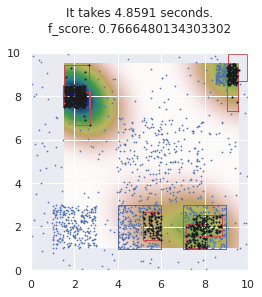

Time taken:      5.272s


In [ ]:
#@title
def sample_points_pq(n, points):
    '''
        n: int - the number of points that is required to sample
        points: list - the point set
    '''
    index = np.random.randint(len(points), size=n)
    sampled_points = []
    for i in range(n):
        sampled_points.append(points[index[i]])
    return sampled_points

def n_of_points_in_rectangle_pq(p, q, points):
    '''
        p: one point of format (diemension, coords, cluster_label)
        q: one point of format (diemension, coords, cluster_label)
        points: list of points of format (diemension, coords, cluster_label)
    '''
    cnt = 0
    xp, yp = p.coords
    xq, yq = q.coords
    xl, xr = min(xp, xq), max(xp, xq)
    yl, yr = min(yp, yq), max(yp, yq)
    for i in range(len(points)):
        x,y = points[i].coords
        if xl <= x <= xr and yl <= y <= yr:
            cnt += 1
    return cnt

def intersect_area_pq(a, b):  # returns 0 if rectangles don't intersect
    '''
        a, b: Rectangles
    '''
    dx = min(a.x_max, b.x_max) - max(a.x_min, b.x_min)
    dy = min(a.y_max, b.y_max) - max(a.y_min, b.y_min)
    if (dx>=0) and (dy>=0):
        return dx*dy
    else: 
        return 0
    
def dense_rectangle_pq(points, n_pairs, n_return_points):
    '''
        n: int - the number of rectangles
        input_obj: object with format (n,d,k,cluster_points)
    '''
    c = n_pairs
    k = n_return_points
    # k = int(math.sqrt(c))
    # k = 2 * n**2 + n
    # c = 4 * k**2 + k    # the function with k
    list_rectangles = []
    list_densities = []
    # points = input_obj.cluster_points
    cnt = 0

    for i in range(c):
    # while len(list_rectangles) < c:
        p, q = sample_points_pq(2, points)
        center_x, center_y = (p.coords[0]+q.coords[0])/2, (p.coords[1]+q.coords[1])/2
        center_width, center_height = abs(p.coords[0]-q.coords[0]), abs(p.coords[1]-q.coords[1])
        rect_pq = Rectangle(center_x, center_y, center_width, center_height)
        if rect_pq.area>1:
            density_pq = n_of_points_in_rectangle_pq(p,q,points) / (rect_pq.area+EPS)
            list_rectangles.append(rect_pq)
            list_densities.append(density_pq)

    # zip and sort
    sorted_densities, sorted_rectangles = (list(t) for t in zip(*sorted(zip(list_densities, list_rectangles),key=itemgetter(0))))
    sorted_densities, sorted_rectangles = sorted_densities[::-1], sorted_rectangles[::-1]
    return sorted_rectangles[:k], sorted_densities[:k]

def dense_disjoint_rectangle_pq(list_rect,percent):
    '''
        list_rect: list - Rectangle, sorted by density (descentding)
        list_dens: list - float
        percent: float - the maximum overlap percentage
    '''
    disjoint_rect = [list_rect[0]]
    for r in list_rect:
        flag_disjoint = True
        for dr in disjoint_rect:
            if intersect_area(r, dr) > percent*r.area or intersect_area(r, dr) > percent*dr.area:
                flag_disjoint = False
        if flag_disjoint:
            disjoint_rect.append(r)
    return disjoint_rect

def points_in_rect_pq(list_rect, points):
    '''
        list_rect: list - Rectangles
        input_obj: object with format (n,d,k,cluster_points), cluster_points - (diemension, coords, cluster_label)

        return -- list of coords that lay in the rectangle
    '''
    # points = input_obj.cluster_points
    X = np.array([np.array(points[idx].coords) for idx in range(len(points))])
    res_points = []
    for r in list_rect:
        x_l, x_r = r.x_min, r.x_max
        y_b, y_t = r.y_min, r.y_max
        points_obtained = []
        for x in X:
            if x_l <= x[0] <= x_r and y_b <= x[1] <= y_t:
                points_obtained.append(x)
        res_points.extend(points_obtained)
    return res_points

def f_score_points_in_rect_pq(true_rects, list_rect, points):
    '''
        list_rect: list - Rectangles
        input_obj: object with format (n,d,k,cluster_points), cluster_points - (diemension, coords, cluster_label)

        return -- float, accuracy
    '''
    # points = input_obj.cluster_points
    label = np.array([points[idx].cluster_label for idx in range(len(points))])
    print(np.unique(label))
    # label_points = []
    # noise_points = []
    # for idx in range(len(points)):
    #     if points[idx].cluster_label==-1:
    #         noise_points.append(points[idx])
    #     else:
    #         label_points.append(points[idx])
    # points = [points[idx] for idx in range(len(points)) if points[idx]!=-1]
    # cluster_coords = np.array([np.array(label_points[idx].coords) for idx in range(len(label_points))])
    # noise_coords = np.array([np.array(noise_points[idx].coords) for idx in range(len(noise_points))])
    n_points = len(points)
    coords = np.array([np.array(points[idx].coords) for idx in range(n_points)])
    
    # the points in the predicted rectangle
    predicted_points = points_in_rect(list_rect, points)
    set_predicted_points = set(map(tuple, predicted_points))

    # all the points that are clusterd
    set_all_points = set(map(tuple, coords))

    # all the true positive points
    true_points = points_in_rect(true_rects, points)
    set_true_points = set(map(tuple, true_points))

    # the points outside of the predicted rectangle
    negative_points = set_all_points - set_true_points
    print('negative points:',len(negative_points),'= all points:',len(set_all_points),'- actual positive points:',len(set_true_points))
    
    # true positive
    tp_set = set_true_points & set_predicted_points
    # tp_list = list(map(list, tp_set))
    n_tp = len(tp_set)
    print('true positvie points:',n_tp,'= actual positive points:',len(set_true_points),'& predicted points:',len(set_predicted_points))

    # false negative
    fn_set = set_true_points - tp_set
    # fn_list = list(map(list, fn_set))
    n_fn = len(fn_set)
    print('false positvie points:',n_fn,'= all actual positive points:',len(set_true_points),'- true positive points:',n_tp)
    
    # false positive
    fp_set = set_predicted_points & negative_points
    # fp_list = list(map(list, fp_set))
    n_fp = len(fp_set)
    print('false positvie points:',n_fp,'= negative points:',len(negative_points),'& predicted points:',len(set_predicted_points))

    # precision = tp / (tp + fp)
    if n_tp + n_fp == 0 :
        precision = 0
    else: precision = n_tp / (n_tp + n_fp)
    print(precision, n_tp, n_fp)
    
    # recall = tp / (tp + fn)
    if (n_tp + n_fn) == 0:
        recall = 0
    else: recall = n_tp / (n_tp + n_fn)
    print(recall, n_tp, n_fn)

    # f_score = 2 * (p*r)/(p+r)
    if precision + recall == 0:
        f_score = 0
    else: f_score = 2 * ((precision*recall) / (precision+recall))

    return f_score, precision, recall

def plot_clusters_two_rect_sampling(list_n, list_a, rctgs_origin, rctgs_extra, datetime, lasting_hours, disjoint_bound=0.5):

    fig, ax = plt.subplots()
    # fig.tight_layout()
    # plt.subplots_adjust(wspace=0,hspace=1)
    # fig.suptitle('rectangles: DBSCAN using box graph with epsilon and minPts')

    # #  plot Numerical Data
    # row = 10  # number of rows
    # column = len(epsilon_list)  # number of columns
    # order = 1  # initialize plot counter
    # cnt = 0

    date = dt.date(2015,3,15)
    time = dt.time(7,0,0)
    datetime = dt.datetime.combine(date,time)

    interval = 30

    eps, mpt = 45, 90

    # for eps in epsilon_list:
    bg_origin = rectangle_set(list_n[0], list_a[0], rctgs_origin, datetime, interval, eps)
    bg_extra = rectangle_set(list_n[1], list_a[1], rctgs_extra, datetime, interval, eps)
    points = []
    points.extend(bg_origin.points)
    points.extend(bg_extra.points)
    n_points = sum(list_n)
    # bg = BoxGraph(n_points, 2, eps, mpt, points)
    # number_of_points = len(bg.points)
    # max_pow_mpt = math.log(number_of_points, 1+gamma_mpt)
    # min_pts_pow_list = np.array(range(0,int(max_pow_mpt)+1,5))
    # min_pts_list = (1+gamma_mpt)**min_pts_pow_list
    # for mpt in min_pts_list:
    # import time as tm
    # start = tm.time()
    # bg.min_pts = mpt
    # find_core_points(bg)
    # nr_clusters = compute_cluster_cores(bg)
    # assign_border_points(bg)
    # end = tm.time()
    # cost_time = end - start

    label = [points[i].cluster_label for i in range(len(points))]
    label = np.array(label)

    colors = ['#'+("%06x" % random.randint(0, 0xFFFFFF)).upper() for _ in range(len(np.unique(label)))]
    
    # print('labels:', np.unique(label))
    # print('the first 5 labels:', label[:5])
    X = [np.array(points[i].coords) for i in range(len(points))]
    X = np.array(X)
    # print('number of coords:', len(X))
    # print('the first 5 coords:', X[:5])

    # ax = fig.add_subplot(row, column, order+cnt)
    # cnt += 1
    # ax = fig.add_axes([0, 0, 1, 1])
    # Hide spines, ticks, etc.

    # for idx, col in enumerate(colors,1):
    #     # print(idx, col)
    #     cluster_data = label == idx
    #     ax.scatter(X[cluster_data, 0], X[cluster_data, 1],
    #                 c=col, marker='.', s=10)
    
    currentAxis = plt.gca()
    big_rect = rctgs_origin[-1]
    
    #### plot sample algorithm  ####
    db = disjoint_bound
    import time
    start = time.time()
    list_rect, list_dens = dense_rectangle_pq(points, 5*n_points, 25)
    disjoint_rects = dense_disjoint_rectangle_pq(list_rect, db)
    points_in_rects = np.array(points_in_rect_pq(disjoint_rects, points))
    f_score, _, _ = f_score_points_in_rect_pq(rctgs_extra, list_rect, points)
    f_socre = round(f_score, 4)
    # ax = fig.add_subplot(a,b,c+j)
    x_extra = [[r.x, r.y, r.width, r.height] for r in rctgs_extra]
    x_origin = [[r.x, r.y, r.width, r.height] for r in rctgs_origin]
    print('extra rects:', x_extra)
    print('origin rects:', x_origin)

    x, y = points_in_rects[:, 0], points_in_rects[:, 1]
    xmin, xmax = x.min(), x.max()
    ymin, ymax = y.min(), y.max()
    X_, Y_ = np.mgrid[xmin:xmax:100j, ymin:ymax:100j]
    positions = np.vstack([X_.ravel(), Y_.ravel()])
    values = np.vstack([x, y])
    from scipy import stats
    kernel = stats.gaussian_kde(values)
    Z_ = np.reshape(kernel(positions).T, X_.shape)
    ax.imshow(np.rot90(Z_), cmap=plt.cm.gist_earth_r,
    extent=[xmin, xmax, ymin, ymax])
    ax.plot(x, y, 'k.', markersize=2)

    ax.scatter(X[:,0], X[:,1], marker='.', s=2)
    currentAxis = plt.gca()
    for r in disjoint_rects:
        currentAxis.add_patch(patches.Rectangle((r.x_min, r.y_min), r.width, r.height, linewidth=1, edgecolor='r', fill=None))
    ax.set_title("Sample Algorithm")
    end = time.time()
    cost_time = end-start
    # str_db = 'disjoint bound:'+str(db)+'\n'
    # str_dist = 'mean square distance: '+str(round(input_obj.avg_score(centroids),3))+'\n'
    # str_duration = 'time taken:'+str(round(cost_time,3))+'\n'
    # str_f_score = 'F-score: '+str(f_score)
    # ax.set_xlabel(str_db+str_duration+str_f_score)
    # ax.set_ylabel(ns)
    # ax.set_xticks([X[:,0].min(), X[:,0].max()])
    # ax.set_yticks([X[:,1].min(), X[:,1].max()])

    for r in rctgs_extra:
        currentAxis.add_patch(patches.Rectangle((r.x-r.width/2, r.y-r.height/2), r.width, r.height, linewidth=1, edgecolor='b', fill=None))

    # print(max_avg_dens)
    # title_1 = 'epsilon: ' + str(round(eps,2)) + '\n' + 'minPts: ' + str(round(mpt,2)) + '\n'
    title_2 = 'It takes ' + str(round(cost_time, 4)) + ' seconds.' + '\n'
    # titile_3 = 'average density: ' + str(round(average_density, 4))+'\n'
    title_3 = 'f_score: ' + str(f_score) + '\n'
    # title_4 = 'number of clusters: '+str(len(cluster_rect)) + '\n'
    # title_5 = 'original taxi points: ' + str(n_taxi_points) + '\n'
    # title_6 = 'generated rect points: ' + str(n_rect_points)
    title = title_2 + title_3
    ax.set_title(title)           
    # ax.set_xlabel(xlabel)
    min_x, max_x = big_rect.x-big_rect.width/2, big_rect.x+big_rect.width/2
    min_y, max_y = big_rect.y-big_rect.height/2, big_rect.y+big_rect.height/2
    ax.set_xlim([min_x, max_x])
    ax.set_ylim([min_y, max_y])

    plt.show()

if __name__ == "__main__":

    r_a = Rectangle(9,9,1,1)
    r_b = Rectangle(2,2,2,2)
    r_c = Rectangle(6,5,4,4)
    r_d = Rectangle(5,5,10,10)
    rctgs_origin = [r_a, r_b, r_c, r_d]

    r_1 = Rectangle(2,8,1,1)
    r_2 = Rectangle(8,2,2,2)
    r_3 = Rectangle(5,2,2,2)
    rctgs_extra = [r_1, r_2, r_3]

    k = 3
    list_a = [[0.25,0.25,0.25], [1/3,1/3,1/3]]

    list_n = [1000, 900]

    date = dt.date(2015,3,15)
    time = dt.time(7,0,0)
    datetime = dt.datetime.combine(date,time)
    lasting_hours = 12

    min_area = 1
    lambda_eps, gamma_mpt = 0.1, 0.2
    min_area_r = math.sqrt(min_area/math.pi) 
    min_pow_eps = lambda_eps * math.log(min_area_r,1+lambda_eps)     # math.log(x, base)

    w_image, h_image = 10, 10
    z = max(w_image, h_image)
    max_pow_eps = math.log(z, 1+lambda_eps)
    pow_eps = np.array(range(int(min_pow_eps), int(max_pow_eps)+1))
    # epsilons = list(range(int((1+lambda_eps)**min_pow_eps), int((1+lambda_eps)**max_pow_eps)+1))
    epsilon_list = (1+lambda_eps)**pow_eps

    import time 
    start = time.time()
    plot_clusters_two_rect_sampling(list_n, list_a, rctgs_origin, rctgs_extra, datetime, lasting_hours)
    end = time.time()
    print("Time taken:      {:.3f}s".format(end - start), file=sys.stderr)

[-1]
negative points: 1182 = all points: 2000 - actual positive points: 818
true positvie points: 446 = actual positive points: 818 & predicted points: 1139
false positvie points: 372 = all actual positive points: 818 - true positive points: 446
false positvie points: 693 = negative points: 1182 & predicted points: 1139
0.3915715539947322 446 693
0.5452322738386308 446 372


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


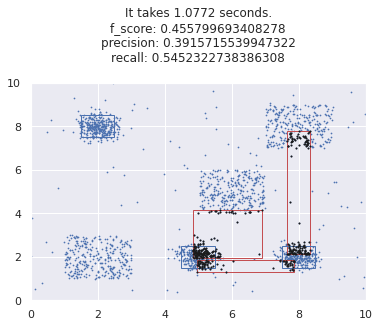

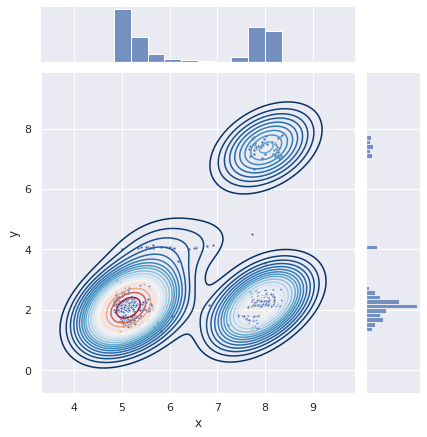

Time taken:      2.242s


In [ ]:
def n_of_points_in_rectangle_pq(p, q, points):
    '''
        p: one point of format (diemension, coords, cluster_label)
        q: one point of format (diemension, coords, cluster_label)
        points: list of points of format (diemension, coords, cluster_label)
    '''
    cnt = 0
    xp, yp = p.coords
    xq, yq = q.coords
    xl, xr = min(xp, xq), max(xp, xq)
    yl, yr = min(yp, yq), max(yp, yq)
    for i in range(len(points)):
        x,y = points[i].coords
        if xl <= x <= xr and yl <= y <= yr:
            cnt += 1
    return cnt

def intersect_area_pq(a, b):  # returns 0 if rectangles don't intersect
    '''
        a, b: Rectangles
    '''
    dx = min(a.x_max, b.x_max) - max(a.x_min, b.x_min)
    dy = min(a.y_max, b.y_max) - max(a.y_min, b.y_min)
    if (dx>=0) and (dy>=0):
        return dx*dy
    else: 
        return 0
    
def dense_rectangle_pq(points, n_pairs, n_return_points):
    '''
        n: int - the number of rectangles
        input_obj: object with format (n,d,k,cluster_points)
    '''
    c = n_pairs
    k = n_return_points
    # k = int(math.sqrt(c))
    # k = 2 * n**2 + n
    # c = 4 * k**2 + k    # the function with k
    list_rectangles = []
    list_densities = []
    # points = input_obj.cluster_points
    cnt = 0
    n = len(points)

    for i in range(c):
    # while len(list_rectangles) < c:
        pick = np.random.randint(low=0,high=4)
        if pick == 1:
            p = random.choice(points[:int(0.25*n)])
        elif pick == 2:
            p = random.choice(points[int(0.25*n):int(0.5*n)])
        elif pick == 3:
            p = random.choice(points[int(0.5*n):int(0.75*n)])
        else:
            p = random.choice(points[int(0.75*n):])
        q = random.choice(points)
        center_x, center_y = (p.coords[0]+q.coords[0])/2, (p.coords[1]+q.coords[1])/2
        center_width, center_height = abs(p.coords[0]-q.coords[0]), abs(p.coords[1]-q.coords[1])
        rect_pq = Rectangle(center_x, center_y, center_width, center_height)
        if rect_pq.area>1:
            density_pq = n_of_points_in_rectangle_pq(p,q,points) / (rect_pq.area+EPS)
            list_rectangles.append(rect_pq)
            list_densities.append(density_pq)

    # zip and sort
    sorted_densities, sorted_rectangles = (list(t) for t in zip(*sorted(zip(list_densities, list_rectangles),key=itemgetter(0))))
    sorted_densities, sorted_rectangles = sorted_densities[::-1], sorted_rectangles[::-1]
    return sorted_rectangles[:k], sorted_densities[:k]

def dense_disjoint_rectangle_pq(list_rect,percent):
    '''
        list_rect: list - Rectangle, sorted by density (descentding)
        list_dens: list - float
        percent: float - the maximum overlap percentage
    '''
    disjoint_rect = random.choice(list_rect)
    for r in list_rect:
        flag_disjoint = True
        for dr in disjoint_rect:
            if intersect_area(r, dr) > percent*r.area or intersect_area(r, dr) > percent*dr.area:
                flag_disjoint = False
        if flag_disjoint:
            disjoint_rect.append(r)
    return disjoint_rect

def points_in_rect_pq(list_rect, points):
    '''
        list_rect: list - Rectangles
        input_obj: object with format (n,d,k,cluster_points), cluster_points - (diemension, coords, cluster_label)

        return -- list of coords that lay in the rectangle
    '''
    # points = input_obj.cluster_points
    X = np.array([np.array(points[idx].coords) for idx in range(len(points))])
    res_points = []
    for r in list_rect:
        x_l, x_r = r.x_min, r.x_max
        y_b, y_t = r.y_min, r.y_max
        points_obtained = []
        for x in X:
            if x_l <= x[0] <= x_r and y_b <= x[1] <= y_t:
                points_obtained.append(x)
        res_points.extend(points_obtained)
    return res_points

    
def f_score_points_in_rect_pq(true_rects, list_rect, points):
    '''
        list_rect: list - Rectangles
        input_obj: object with format (n,d,k,cluster_points), cluster_points - (diemension, coords, cluster_label)

        return -- float, accuracy
    '''
    # points = input_obj.cluster_points
    label = np.array([points[idx].cluster_label for idx in range(len(points))])
    print(np.unique(label))
    # label_points = []
    # noise_points = []
    # for idx in range(len(points)):
    #     if points[idx].cluster_label==-1:
    #         noise_points.append(points[idx])
    #     else:
    #         label_points.append(points[idx])
    # points = [points[idx] for idx in range(len(points)) if points[idx]!=-1]
    # cluster_coords = np.array([np.array(label_points[idx].coords) for idx in range(len(label_points))])
    # noise_coords = np.array([np.array(noise_points[idx].coords) for idx in range(len(noise_points))])
    n_points = len(points)
    coords = np.array([np.array(points[idx].coords) for idx in range(n_points)])
    
    # the points in the predicted rectangle
    predicted_points = points_in_rect(list_rect, points)
    set_predicted_points = set(map(tuple, predicted_points))

    # all the points that are clusterd
    set_all_points = set(map(tuple, coords))

    # all the true positive points
    true_points = points_in_rect(true_rects, points)
    set_true_points = set(map(tuple, true_points))

    # the points outside of the predicted rectangle
    negative_points = set_all_points - set_true_points
    print('negative points:',len(negative_points),'= all points:',len(set_all_points),'- actual positive points:',len(set_true_points))
    
    # true positive
    tp_set = set_true_points & set_predicted_points
    # tp_list = list(map(list, tp_set))
    n_tp = len(tp_set)
    print('true positvie points:',n_tp,'= actual positive points:',len(set_true_points),'& predicted points:',len(set_predicted_points))

    # false negative
    fn_set = set_true_points - tp_set
    # fn_list = list(map(list, fn_set))
    n_fn = len(fn_set)
    print('false positvie points:',n_fn,'= all actual positive points:',len(set_true_points),'- true positive points:',n_tp)
    
    # false positive
    fp_set = set_predicted_points & negative_points
    # fp_list = list(map(list, fp_set))
    n_fp = len(fp_set)
    print('false positvie points:',n_fp,'= negative points:',len(negative_points),'& predicted points:',len(set_predicted_points))

    # precision = tp / (tp + fp)
    if n_tp + n_fp == 0 :
        precision = 0
    else: precision = n_tp / (n_tp + n_fp)
    print(precision, n_tp, n_fp)
    
    # recall = tp / (tp + fn)
    if (n_tp + n_fn) == 0:
        recall = 0
    else: recall = n_tp / (n_tp + n_fn)
    print(recall, n_tp, n_fn)

    # f_score = 2 * (p*r)/(p+r)
    if precision + recall == 0:
        f_score = 0
    else: f_score = 2 * ((precision*recall) / (precision+recall))

    return f_score, precision, recall


def plot_clusters_two_rect_sampling(list_n, a, rctgs_origin, rctgs_extra, datetime, lasting_hours, disjoint_bound=0.5):

    fig, ax = plt.subplots()
    # fig.tight_layout()
    # plt.subplots_adjust(wspace=0,hspace=1)
    # fig.suptitle('rectangles: DBSCAN using box graph with epsilon and minPts')

    # #  plot Numerical Data
    # row = 10  # number of rows
    # column = len(epsilon_list)  # number of columns
    # order = 1  # initialize plot counter
    # cnt = 0

    date = dt.date(2015,3,15)
    time = dt.time(7,0,0)
    datetime = dt.datetime.combine(date,time)

    interval = 30

    eps, mpt = 45, 90

    # for eps in epsilon_list:
    bg_origin = rectangle_set(list_n[0], a[0], rctgs_origin, datetime, interval, eps)
    bg_extra = rectangle_set_gaussian(list_n[1], a[1], rctgs_extra, datetime, interval, eps)
    points = []
    points.extend(bg_origin.points)
    points.extend(bg_extra.points)
    n_points = sum(list_n)
    # bg = BoxGraph(n_points, 2, eps, mpt, points)
    # number_of_points = len(bg.points)
    # max_pow_mpt = math.log(number_of_points, 1+gamma_mpt)
    # min_pts_pow_list = np.array(range(0,int(max_pow_mpt)+1,5))
    # min_pts_list = (1+gamma_mpt)**min_pts_pow_list
    # for mpt in min_pts_list:
    # import time as tm
    # start = tm.time()
    # bg.min_pts = mpt
    # find_core_points(bg)
    # nr_clusters = compute_cluster_cores(bg)
    # assign_border_points(bg)
    # end = tm.time()
    # cost_time = end - start

    label = [points[i].cluster_label for i in range(len(points))]
    label = np.array(label)

    colors = ['#'+("%06x" % random.randint(0, 0xFFFFFF)).upper() for _ in range(len(np.unique(label)))]
    
    # print('labels:', np.unique(label))
    # print('the first 5 labels:', label[:5])
    X = [np.array(points[i].coords) for i in range(len(points))]
    X = np.array(X)
    # print('number of coords:', len(X))
    # print('the first 5 coords:', X[:5])

    # ax = fig.add_subplot(row, column, order+cnt)
    # cnt += 1
    # ax = fig.add_axes([0, 0, 1, 1])
    # Hide spines, ticks, etc.

    # for idx, col in enumerate(colors,1):
    #     # print(idx, col)
    #     cluster_data = label == idx
    #     ax.scatter(X[cluster_data, 0], X[cluster_data, 1],
    #                 c=col, marker='.', s=10)
    
    currentAxis = plt.gca()
    big_rect = rctgs_origin[-1]
    
    #### plot sample algorithm  ####
    db = disjoint_bound
    import time
    start = time.time()
    list_rect, list_dens = dense_rectangle_pq(points, 10, 5)
    disjoint_rects = dense_disjoint_rectangle_pq(list_rect, db)
    points_in_rects = np.array(points_in_rect_pq(disjoint_rects, points))
    points_in_predicted_rects = np.array(points_in_rect_pq(list_rect, points))
    f_score, pcs, rcl = f_score_points_in_rect_pq(rctgs_extra,list_rect, points)
    f_socre = round(f_score, 4)
    # ax = fig.add_subplot(a,b,c+j)

    x, y = points_in_rects[:, 0], points_in_rects[:, 1]
    from pandas import DataFrame
    pos = []
    for i in range(len(x)):
        pos.append([x[i], y[i]])
    df = DataFrame (pos,columns=['pos_x','pos_y'])
    # x_pred, y_pred = points_in_predicted_rects[:, 0], points_in_predicted_rects[:, 1]
    # pos_pred = []
    # for i in range(len(x)):
    #     pos_pred.append([x_pred[i], y_pred[i]])
    # df_pred = DataFrame(pos_pred, columns=['pos_x','pos_y'])
    # sns.kdeplot(data=df_pred, x='pos_x', y='pos_y', shade=True, cmap='Reds')
    # sns.kdeplot(data=df, x='pos_x', y='pos_y', shade=True, cmap='Blues')
    f = (sns.jointplot(x, y, marker='.').plot_joint(sns.kdeplot, n_levels=20, cmap="RdBu_r")).set_axis_labels('x', 'y')
    # sns.kdeplot(data=df_pred, x='pos_x', y='pos_y', ax=ax, shade=True, cmap='Blues')
    # xmin, xmax = x.min(), x.max()
    # ymin, ymax = y.min(), y.max()
    # X_, Y_ = np.mgrid[xmin:xmax:100j, ymin:ymax:100j]
    # positions = np.vstack([X_.ravel(), Y_.ravel()])
    # values = np.vstack([x, y])
    # from scipy import stats
    # kernel = stats.gaussian_kde(values)
    # Z_ = np.reshape(kernel(positions).T, X_.shape)
    # ax.imshow(np.rot90(Z_), cmap=plt.cm.gist_earth_r,
    # extent=[xmin, xmax, ymin, ymax])
    ax.plot(x, y, 'k.', markersize=2)

    ax.scatter(X[:,0], X[:,1], marker='.', s=2)
    currentAxis = plt.gca()
    for r in disjoint_rects:
        ax.add_patch(patches.Rectangle((r.x_min, r.y_min), r.width, r.height, linewidth=1, edgecolor='r', fill=None))
    ax.set_title("Sample Algorithm")
    end = time.time()
    cost_time = end-start
    # str_db = 'disjoint bound:'+str(db)+'\n'
    # str_dist = 'mean square distance: '+str(round(input_obj.avg_score(centroids),3))+'\n'
    # str_duration = 'time taken:'+str(round(cost_time,3))+'\n'
    # str_f_score = 'F-score: '+str(f_score)
    # ax.set_xlabel(str_db+str_duration+str_f_score)
    # ax.set_ylabel(ns)
    # ax.set_xticks([X[:,0].min(), X[:,0].max()])
    # ax.set_yticks([X[:,1].min(), X[:,1].max()])

    for r in rctgs_extra:
        ax.add_patch(patches.Rectangle((r.x-r.width/2, r.y-r.height/2), r.width, r.height, linewidth=1, edgecolor='b', fill=None))

    # print(max_avg_dens)
    # title_1 = 'epsilon: ' + str(round(eps,2)) + '\n' + 'minPts: ' + str(round(mpt,2)) + '\n'
    title_2 = 'It takes ' + str(round(cost_time, 4)) + ' seconds.' + '\n'
    # titile_3 = 'average density: ' + str(round(average_density, 4))+'\n'
    title_4 = 'precision: ' + str(pcs) + '\n'
    title_3 = 'f_score: ' + str(f_score) + '\n'
    title_5 = 'recall: ' + str(rcl) + '\n'
    # title_4 = 'number of clusters: '+str(len(cluster_rect)) + '\n'
    # title_5 = 'original taxi points: ' + str(n_taxi_points) + '\n'
    # title_6 = 'generated rect points: ' + str(n_rect_points)
    title = title_2 + title_3 + title_4 + title_5
    ax.set_title(title)           
    # ax.set_xlabel(xlabel)
    min_x, max_x = big_rect.x-big_rect.width/2, big_rect.x+big_rect.width/2
    min_y, max_y = big_rect.y-big_rect.height/2, big_rect.y+big_rect.height/2
    ax.set_xlim([min_x, max_x])
    ax.set_ylim([min_y, max_y])

    plt.show()

if __name__ == "__main__":

    r_a = Rectangle(8,8,2,2)
    r_b = Rectangle(2,2,2,2)
    r_c = Rectangle(6,5,2,2)
    r_d = Rectangle(5,5,10,10)
    rctgs_origin = [r_a, r_b, r_c, r_d]

    r_1 = Rectangle(2,8,1,1)
    r_2 = Rectangle(8,2,1,1)
    r_3 = Rectangle(5,2,1,1)
    rctgs_extra = [r_1, r_2, r_3]

    k = 3
    a = [[0.3,0.3,0.3],[1/3,1/3,1/3]]

    list_n = [1000, 1000]

    date = dt.date(2015,3,15)
    time = dt.time(7,0,0)
    datetime = dt.datetime.combine(date,time)
    lasting_hours = 12

    min_area = 1
    lambda_eps, gamma_mpt = 0.1, 0.2
    min_area_r = math.sqrt(min_area/math.pi) 
    min_pow_eps = lambda_eps * math.log(min_area_r,1+lambda_eps)     # math.log(x, base)

    w_image, h_image = 10, 10
    z = max(w_image, h_image)
    max_pow_eps = math.log(z, 1+lambda_eps)
    pow_eps = np.array(range(int(min_pow_eps), int(max_pow_eps)+1))
    # epsilons = list(range(int((1+lambda_eps)**min_pow_eps), int((1+lambda_eps)**max_pow_eps)+1))
    epsilon_list = (1+lambda_eps)**pow_eps

    import time 
    start = time.time()
    plot_clusters_two_rect_sampling(list_n, a, rctgs_origin, rctgs_extra, datetime, lasting_hours)
    end = time.time()
    print("Time taken:      {:.3f}s".format(end - start), file=sys.stderr)

In [ ]:
import random

def compute_labels(points, centroids):
    # Give centroids labels:
    for i in range(len(centroids)):
        centroids[i].cluster_label = i

    # Give points labels
    for p in points:
        mindist = sys.maxsize
        for c in centroids:
            dist = p.sq_distance_to(c)
            if dist < mindist:
                mindist = dist
                p.cluster_label = c.cluster_label


def compute_centroids(points, centroids):
    cluster_sizes = [0 for i in range(len(centroids))]
    new_centroids = [ClusterPoint(centroids[i].dimension, [0 for _ in range(centroids[i].dimension)], i) for i in range(len(centroids))]
    for p in points:
        cluster_sizes[p.cluster_label] += 1     # 对于每个点，对应cluster大小+1
        new_centroids[p.cluster_label].add(p)     # 对于每个点，对应cluster的centroid加上这个点的坐标
    # print('size of the new centroids:', len(new_centroids))
    for i in range(len(new_centroids)):
        new_centroids[i].div(cluster_sizes[i])
    return new_centroids

def choice(data, dist, n=1):
    sum_dist = np.sum(dist)
    p = dist / sum_dist
    # coords = np.array([data[i].coords for i in range(len(data))])
    # label = [data[i].cluster_label for i in range(len(data))]
    idx = np.random.choice(np.arange(len(data)), size=n, replace=False, p=p)
    # print(idx)
    sample = []
    for i in range(len(idx)):
        sample.append(data[idx[i]])
    return sample

def initialize_centroids(points, k=3):
    """
    Calculates the initial centroid placement

    :param input_obj:   the input object
    :return:            a list of k centroids in the plane
    """

    # samplelist = random.sample(input_obj.cluster_points,input_obj.k)
    samplelist = []
    samplelist.append(points[int(np.random.randint(len(points)))])
    
    ## compute remaining k - 1 centroids
    for c_id in range(k - 1):
          
        ## initialize a list to store distances of data
        ## points from nearest centroid
        dist = []
        for i in range(len(points)):
            point = points[i]
            d = sys.maxsize
              
            ## compute distance of 'point' from each of the previously
            ## selected centroid and store the minimum distance
            for j in range(len(samplelist)):
                # print(len(samplelist), j, samplelist[j], samplelist[j].dimension)
                temp_dist = point.sq_distance_to(samplelist[j])
                d = min(d, temp_dist)
            dist.append(d)
              
        ## select data point with maximum distance as our next centroid
        dist = np.array(dist)
        # probability = dist / sum(dist)
        next_centroid = choice(points, dist)
        samplelist.append(next_centroid[0])
    centroids = [CentroidPoint(p.dimension, list(p.coords)) for p in samplelist]

    return centroids

def f_score(points, centroids):
    sum = 0
    for p in points:
        assert p.is_labeled(), "Point p=({}) is not labelled.".format(p)
        sum = sum + p.sq_distance_to(centroids[p.cluster_label])
    return sum

def cluster(points, k=3):
    """
    Perform k-means clustering on the input set

    :param input_obj:   the input object
    :return:            a list of k centroids in the plane
    """    

    # Initialize centroids
    centroids = initialize_centroids(points, k)
    compute_labels(points, centroids)
    score = f_score(points, centroids)
    
    iterationcount = 0
    hasChanged = True
    while hasChanged:
        iterationcount  += 1
        compute_labels(points, centroids)
        new_centroids = compute_centroids(points, centroids)
        new_score = f_score(points, new_centroids)
        hasChanged = new_score + EPS < score
        score, centroids = new_score, new_centroids
    print('w\o local search iterationcount:', iterationcount)
    
    centroids = [CentroidPoint(c.dimension, c.coords) for c in centroids]
    
    return centroids

def clustering(points, centroids, k=3, local_search_=False):
    # centroids = cluster(input_obj)
    if local_search_:
        score = f_score(points,centroids)
        isChanged = True
        iterationcount = 0
        ### choose the new centroid
        while k>0 and isChanged:
            iterationcount  += 1
            isChanged = False
            k -= 1
            dist = []
            for i in range(len(points)):
                point = points[i]
                d = sys.maxsize
                
                ## compute distance of 'point' from each of the previously
                ## selected centroid and store the minimum distance
                for j in range(len(centroids)):
                    temp_dist = point.sq_distance_to(centroids[j])
                    d = min(d, temp_dist)
                dist.append(d)
            dist = np.array(dist)
            # select the next centroid with probability = dist / sum(dist)
            next_centroids = choice(points, dist, 2)

            ### delete two points which makes the cost minimize
            min_score = sys.maxsize
            centroids.extend(next_centroids)
            d1, d2 = -1, -2         # the index of the deleted centroids

            # delete and add 2 new centroids
            for i in range(len(centroids)-2):
                new_centroids = centroids.copy()
                new_centroids.pop(i)
                # print('第',i,'次删除第一个点：', len(new_centroids))
                tmp_c = new_centroids.copy()
                for j in range(i, len(centroids)-3):
                    new_centroids = tmp_c.copy()
                    new_centroids.pop(j)
                    compute_labels(points, new_centroids)
                    new_score = f_score(points,new_centroids)
                    if new_score < min_score:
                        min_score = new_score
                        d1, d2 = i, j
                        isChanged = True
                    # print('第',i,'_',j,'次删除第二个点后：',len(new_centroids))
            new_centroids = centroids.copy()
            new_centroids.pop(d1)
            new_centroids.pop(d2)
            new_score = f_score(points,new_centroids)
            if new_score < score:
                centroids = new_centroids
                compute_labels(points, centroids)
            else:
                centroids.pop()
                centroids.pop()
                compute_labels(points, centroids)
            # for c in centroids:
            #     print(c.coords)
            # print('-----------------------------')
        print('w\ local search iterationcount:', iterationcount)
    return centroids

def plot_clusters(points, centroids, rctgs_extra, local_search_=False):
        # Plot init seeds along side sample data=
        colors = ['#4EACC5', '#FF9C34', '#4E9A06', 'm', '#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b', '#e377c2', '#7f7f7f', '#bcbd22', '#17becf']
        colors = colors[:len(centroids)]
        plt.figure(1)
        label = [points[i].cluster_label for i in range(len(points))]
        label = np.array(label)
        X = [np.array(points[i].coords) for i in range(len(points))]
        X = np.array(X)
        centroids = [np.array(centroids[i].coords) for i in range(len(centroids))]
        centroids = np.array(centroids)
        for idx, col in enumerate(colors):
            # print(idx, col)
            cluster_data = label == idx
            plt.scatter(X[cluster_data, 0], X[cluster_data, 1],
                        c=col, marker='.', s=10)

        plt.scatter(centroids[:,0], centroids[:,1], c='b', s=50)
        currentAxis = plt.gca()
        for r in rctgs_extra:
            currentAxis.add_patch(patches.Rectangle((r.x-r.width/2, r.y-r.height/2), r.width, r.height, linewidth=1, edgecolor='b', fill=None))

        if local_search_:
            plt.title("K-Means++ clustering with local search")
        else:
            plt.title("K-Means++ cluserting without local search")
        plt.xticks([])
        plt.yticks([])
        plt.show()

def run(input, a, datetime, interval, eps, list_n, rctgs_origin, rctgs_extra, n_components=2, noise=0.01, local_search_=False):
# def run(input='file', n_data=4000, n_components=2, noise=0.01, local_search_=False, path_in=None, path_out=None):
    """
    Reads the input set, clusters the points and writes to output

    :param path_in:     location of the input set
    :param path_out:    location to print the output
    """
    
    # read input from file
    if input=='file':
        try:
            with open(path_in, "r") as f:
                input_obj = Dataset.read_input(f)
        except IOError:
            print("Could not read input file: " + path_in, file=sys.stderr)
            return       
    else:
        # input_obj = Dataset.default_dataset(input, n_data, n_components=n_components, noise=noise)
        bg_origin = rectangle_set(list_n[0], a, rctgs_origin, datetime, interval, eps)
        bg_extra = rectangle_set(list_n[1], a, rctgs_extra, datetime, interval, eps)
        points = []
        points.extend(bg_origin.points)
        points.extend(bg_extra.points)
        # input_obj = rectangle_set(n_data, a, rctgs, datetime, interval, eps)
        # points = input_obj.points

    # find the best centroids using k_means++ (w\ or w\o local search)
    centroids = cluster(points, n_components)
    # centroids = clustering(input_obj, centroids, local_search_=local_search_)

    # simple check if the correct number of centroids has been given
    # assert len(centroids) == input_obj.k

    # print result to file
    if input=='file':
        try:
            input_obj.write_output(centroids, path_out, assignment_nr)
        except IOError:
            print("Could not write output to file: " + path_out, file=sys.stderr)
    else:
        plot_clusters(points, centroids, rctgs_extra, local_search_=local_search_)
       

    # print("Cluster counter:      ", input_obj.k, file=sys.stderr)
    def avg_score(points, centroids):
        return f_score(points, centroids) / len(points)
    average_score = avg_score(points, centroids)
    print("Mean squared distance: {:.3f}".format(average_score), file=sys.stderr)  

w\o local search iterationcount: 15


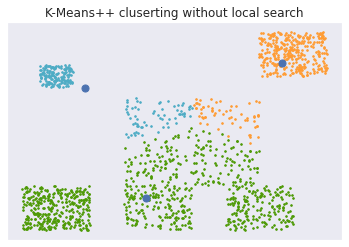

Mean squared distance: 5.163
Time taken:            0.412s


In [ ]:
if __name__ == "__main__":
    import time
    start = time.time()
    r_a = Rectangle(9,9,1,1)
    r_b = Rectangle(2,2,2,2)
    r_c = Rectangle(6,5,4,4)
    r_d = Rectangle(5,5,10,10)
    rctgs_origin = [r_a, r_b, r_c, r_d]

    r_1 = Rectangle(2,8,1,1)
    r_2 = Rectangle(8,2,2,2)
    r_3 = Rectangle(5,2,2,2)
    rctgs_extra = [r_1, r_2, r_3, r_d]

    k = 3
    a = [0.3,0.3,0.3]

    list_n = [1000, 500]

    epsilon, min_pts = 3, 200

    # datetime = '2015-03-15 07:00:00'
    date = dt.date(2015,3,15)
    time = dt.time(7,0,0)
    datetime = dt.datetime.combine(date,time)
    lasting_hours = 12
    n, k = 1000, 2
    eps = 45
    disjoint_bound = [1/3, 1/2, 0]
    alpha = [[0.1, 0.1, 0.1], [0.2, 0.2, 0.2], [0.3, 0.3, 0.3]]
    # alpha = [[0.1, 0.1], [0.2, 0.2], [0.3, 0.3], [0.4, 0.4]]
    # run('rctg', [r_a, r_b, r_d], alpha, n, k)
    run('rctg', alpha[2], datetime, lasting_hours, eps, list_n, rctgs_origin, rctgs_extra, n_components=3, noise=0.01, local_search_=False)
    # rect_compare(rctgs, n, k, alpha, disjoint_bound)
    import time
    end = time.time()
    print("Time taken:            {:.3f}s".format(end - start), file=sys.stderr)  

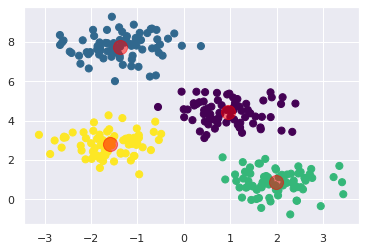

In [ ]:
from sklearn.datasets.samples_generator import make_blobs
X, y_true = make_blobs(n_samples=300, centers=4,
                       cluster_std=0.60, random_state=0)
from sklearn.cluster import KMeans
# kmeans = KMeans(n_clusters=4)
# kmeans.fit(X)
# y_kmeans = kmeans.predict(X)

from sklearn.metrics import pairwise_distances_argmin

def find_clusters(X, n_clusters, rseed=2):
    # 1. Randomly choose clusters
    rng = np.random.RandomState(rseed)
    i = rng.permutation(X.shape[0])[:n_clusters]
    centers = X[i]
    
    while True:
        # 2a. Assign labels based on closest center
        labels = pairwise_distances_argmin(X, centers)
        
        # 2b. Find new centers from means of points
        new_centers = np.array([X[labels == i].mean(0)
                                for i in range(n_clusters)])
        
        # 2c. Check for convergence
        if np.all(centers == new_centers):
            break
        centers = new_centers
    
    return centers, labels

centers, labels = find_clusters(X, 4)
plt.scatter(X[:, 0], X[:, 1], c=labels,
            s=50, cmap='viridis');

# plt.scatter(X[:, 0], X[:, 1], c=y_kmeans, s=50, cmap='viridis')

# centers = kmeans.cluster_centers_
plt.scatter(centers[:, 0], centers[:, 1], c='red', s=200, alpha=0.5);

[185 254  35]


AttributeError: ignored

<Figure size 432x288 with 0 Axes>

In [ ]:
def rectangle_set_list(n_samples, a, rctgs, datetime, interval):
    '''
        n_samples: int, number of points
        a: int list, the probability to be in the smaller rectangles
        rctgs: list of rectangles of class Rectangle, the first one is the biggest one
        datetime: datetime, 'yyyy-mm-dd hh:mm:ss'
        interval: int, the lasting time (e.g. 12 hours) from the starting time (i.e. date)
    '''
    list_points = []
    d = 2

    # insert 0 at the beginning and 1 at the end
    a = [0] + a
    for i in range(1, len(a)):
        a[i] = a[i-1] + a[i]

    for j in range(n_samples):
        b = np.random.uniform(0,1)        # Generate a random float from 0 to 1
        for i in range(len(a)-1):
            if a[i] < b <= a[i+1]:
                tmp_rctg = rctgs[i]
                x = np.random.uniform(low=tmp_rctg.x_min, high=tmp_rctg.x_min+tmp_rctg.width)
                y = np.random.uniform(low=tmp_rctg.y_min, high=tmp_rctg.y_min+tmp_rctg.height)
                hour_low = datetime.hour
                hour = np.random.randint(low=hour_low, high=hour_low+interval)
                year, month, day = datetime.year, datetime.month, datetime.day
                minute = np.random.randint(low=0, high=59)
                second = np.random.randint(low=0, high=59)
                day_month = day_of_month(year, month)
                if hour >= 24:
                    hour = hour % 24
                    if day<day_month:
                        day = day + 1
                    else:
                        day = (day + 1) % day_month
                # date_str = str(year)+'-'+str(month).zfill(2)+'-'+str(day).zfill(2)+' '+str(hour).zfill(2)+':'+str(minute).zfill(2)+':'+str(second).zfill(2)
                date_generated = dt.date(year, month, day)
                time_generated = dt.time(hour, minute, second)
                datetime_generated = dt.datetime.combine(date_generated, time_generated)
                list_points.append(ClusterPoint(d, [x,y],ID=j,datetime=datetime_generated,type_point='Rect'))
                break
    return list_points

def n_type_of_points_in_rectangle(rects, points, type_req):
    '''
        p: one point of format (diemension, coords, cluster_label)
        q: one point of format (diemension, coords, cluster_label)
        points: list of points of format (diemension, coords, cluster_label)
    '''
    cnt = 0
    for i in range(len(points)):
        x,y = points[i].coords
        for r in rects:
            xl = r.x_min
            xr = r.x_max
            yl = r.y_min
            yr = r.y_max
            if xl <= x <= xr and yl <= y <= yr and points[i].type_point==type_req:
                cnt += 1
                break
    return cnt

# def generate_rectangle_set(n_points, d, eps, mpt, data_list):
#     """
#     Reads the input set, clusters the points and writes to output

#     :param path_in:     location of the input set
#     :param path_out:    location to print the output
#     """
#     # Step 1: read file and create box graph
#     bg = BoxGraph(n_points, d, eps, mpt, data_list)
    
#     # Step 2: Compute the core points
#     find_core_points(bg)

#     # Step 3: cluster the core points
#     nr_clusters = compute_cluster_cores(bg)

#     # Step 4: assign border points to clusters
#     assign_border_points(bg)

#     return bg

def generate_rectangle_set(n_points, a, rctgs, datetime, interval, d, eps, mpt, taxis):
    """
    Reads the input set, clusters the points and writes to output

    :param path_in:     location of the input set
    :param path_out:    location to print the output
    """
    # Step 1: read file and create box graph
    rects = rectangle_set_list(n_points, a, rctgs, datetime, interval)
    data_list = taxis + rects
    bg = BoxGraph(n_points, d, eps, mpt, data_list)

    # Step 2: Compute the core points
    find_core_points(bg)

    # Step 3: cluster the core points
    nr_clusters = compute_cluster_cores(bg)

    # Step 4: assign border points to clusters
    assign_border_points(bg)

    return bg

def generate_taxi(df):
    n, d = df.shape[0], 2
    points = []
    for j in range(n):
        x, y = df.iloc[j,-4], df.iloc[j,-3]
        datetime_generated = df.iloc[j,1]
        points.append(ClusterPoint(d, [x,y], ID=j, datetime=datetime_generated,type_point='taxi'))
    return points


def plot_clusters_taxi_many(data_onehour, n, a, rctgs, datetime, interval, min_area_list):
    # Plot init seeds along side sample data=
    # color ="%06x" % random.randint(0, 0xFFFFFF)
    # color = '#'+color.upper()
    
    # fig = plt.figure(figsize=(30, 50))
    # fig.tight_layout()
    # plt.subplots_adjust(wspace=0,hspace=1)
    # fig.suptitle('DBSCAN using box graph with epsilon and minPts')

    # #  plot Numerical Data
    # row = len(min_area_list) // 3 + 1  # number of rows
    # column = 3  # number of columns
    # order = 1  # initialize plot counter
    # cnt = 0

    # plt.rcParams["figure.figsize"] = [4.71, 9.07]
    # plt.rcParams["figure.autolayout"] = True
    im = plt.imread('manhattan.png')
    dpi = 80
    height, width, depth = im.shape
    figsize = width / float(dpi), height / float(dpi)
    # ax = fig.add_axes([0, 0, 1, 1])

    # n_samples = 500
    # a = [0.5, 0.5]
    
    # rect_1 = Rectangle(130, 600, 30, 30)
    # rect_2 = Rectangle(250, 550, 40, 40)
    # rctgs = [rect_1, rect_2]

    # date = dt.date(2015,3,15)
    # time = dt.time(7,0,0)
    # datetime = dt.datetime.combine(date,time)

    # interval = 5

    eps, mpt = 45, 590
    taxi_list = generate_taxi(data_onehour)
    max_avg_dens, ma_max_dens = 0, 0
    max_fscore, ma_max_fscore = 0, 0
    fpr_each_ma, time_each_ma = [], []
    grid_fpr_list, grid_time_list = [], []

    for ma in min_area_list:   
        for _ in range(100):
            bg = generate_rectangle_set(n, a, rctgs, datetime, interval, 2, eps, mpt, taxi_list)
            points = bg.points

            label = [p.cluster_label for p in points]
            label = np.array(label)

            # colors = ['#'+("%06x" % random.randint(0, 0xFFFFFF)).upper() for _ in range(len(np.unique(label)))]
            
            # print(len(np.unique(label)), 'labels:', np.unique(label))
            # print('the first 5 labels:', np.unique(label))
            X = [np.array(points[i].coords) for i in range(len(points))]
            X = np.array(X)
            # print('number of coords:', len(X))
            # print('the first 5 coords:', X[:5])

            # ax_im = fig.add_subplot(row, column, order+cnt)
            # temp_row, temp_col = (order+cnt)//column, (order+cnt)%column
            # pix_row = 907//row
            # pix_col = 471//column
            # ax = fig.add_axes([temp_row*pix_row, temp_col*pix_col, 0.1, 0.1])
            # cnt += 1
            # ax_im = fig.add_axes([0, 0, 1, 1])
            # Hide spines, ticks, etc.
            # ax_im.axis('off')
            # ax_im.imshow(im, cmap='gray')
            # implot = plt.imshow(im)

            # for idx, col in enumerate(colors,1):
            #     # print(idx, col)
            #     cluster_data = label == idx
            #     ax_im.scatter(X[cluster_data, 0], X[cluster_data, 1],
            #                 c=col, marker='.', s=10)
             
            import time as tm
            start = tm.time()
            
            currentAxis = plt.gca()
            # big_rect = rctgs[-1]
            cluster_rect = []
            unique_label = np.unique(label)
            # unique_label = unique_label[unique_label != -1]
            # for idx, lbl in enumerate(np.unique(label),1):
            for idx in range(1,len(unique_label)+1):
                cluster_data = label == idx
                if np.any(cluster_data):
                    left, right = np.min(X[cluster_data,0]), np.max(X[cluster_data,0])
                    bottom, top = np.min(X[cluster_data,1]), np.max(X[cluster_data,1])
                    width, height = abs(right-left), abs(top-bottom)
                    # currentAxis.add_patch(patches.Rectangle((left, bottom), width, height, linewidth=1, edgecolor='b', fill=None))
                    temp_rect = Rectangle(0.5*(left+right), 0.5*(top+bottom), width, height)
                    # print(left, right, top,bottom)
                    # print('x:',temp_rect.x,'y:',temp_rect.y, temp_rect.x_min )
                    cluster_rect.append(temp_rect)
            
            # print('number of clusters:', len(cluster_rect))
            average_density = 0
            f_score = 0
            n_taxi_points = n_rect_points = 0
            if len(cluster_rect)>0:
                # print('number of clusters:',len(cluster_rect))
                k_rects, k_density = dense_rectangle(points, cluster_rect, 3, ma)
            else:
                k_rects, k_density = [],[]
            n_rect_points = n_type_of_points_in_rectangle(k_rects, points, 'Rect')
            n_taxi_points = n_type_of_points_in_rectangle(k_rects, points, 'taxi')
            f_score, precision, recall = f_score_points_in_rect(rctgs, k_rects, points)
            fpr_each_ma.append(np.array([f_score, precision, recall]))
            f_score, precision, recall = round(f_score, 4), round(precision, 4), round(recall, 4)
            print('fscore, precision, recall:', f_score, precision, recall)
            if len(k_density)>0: average_density = np.mean(k_density)
            else: average_density = 0
            if average_density > max_avg_dens: 
                max_avg_dens = average_density
                ma_max_dens = ma
            if f_score > max_fscore: 
                max_fscore = f_score
                ma_max_fscore = ma
            # for r in k_rects:
            #     currentAxis.add_patch(patches.Rectangle((r.x-r.width/2, r.y-r.height/2), r.width, r.height, linewidth=3, edgecolor='r', fill=None))
            # for r in rctgs:
            #     currentAxis.add_patch(patches.Rectangle((r.x-r.width/2, r.y-r.height/2), r.width, r.height, linewidth=1, edgecolor='b', fill=None))

            # print('the maximum average density:',max_avg_dens)
            end = tm.time()
            cost_time = end - start
            time_each_ma.append(cost_time)
            # title_1 = 'epsilon: ' + str(round(eps,2)) + '\n' + 'minPts: ' + str(round(mpt,2)) + '\n'
            # title_2 = 'It takes ' + str(round(cost_time, 4)) + ' seconds.' + '\n'
            # title_3_1 = 'average density: ' + str(round(average_density, 4))+'\n'
            # title_3 = 'f_score: ' + str(f_score) + '\n' + 'precision: ' + str(precision) + '\n' + 'recall: ' + str(recall) + '\n'
            # title_4 = 'number of clusters: '+str(len(cluster_rect)) + '\n'
            # title_5 = 'taxi data points: ' + str(n_taxi_points) + '\n'
            # title_6 = 'generated rect points: ' + str(n_rect_points)
            # title = title_1 + title_2 + title_3_1 + title_3 + title_4 + title_5 + title_6
            # ax_im.set_title(title)           
            # # ax_im.set_xlabel(xlabel)
            # ax_im.set_xticks([])
            # ax_im.set_yticks([])
            bg = None
        grid_fpr_list.append(fpr_each_ma)
        grid_time_list.append(time_each_ma)
    # plt.show()
    print('maximum average density:', max_avg_dens, ', min_area:', ma_max_dens)
    print('maximum fscore:', max_fscore, ', min_area:', ma_max_fscore)

    return grid_fpr_list, grid_time_list
    
if __name__ == "__main__":

    n = 2000
    a = [0.5, 0.5]
    
    rect_1 = Rectangle(130, 600, 30, 30)
    rect_2 = Rectangle(250, 550, 40, 40)
    rctgs = [rect_1, rect_2]

    date = dt.date(2015,1,10)
    time = dt.time(7,0,0)
    datetime = dt.datetime.combine(date,time)

    lasting_hours = 1

    pow_list = np.arange(0,14)
    min_area_list = 2**pow_list

    import time 
    start = time.time()
    fpr_each_ma, time_each_ma = plot_clusters_taxi_many(data_onehour, n, a, rctgs, datetime, lasting_hours, min_area_list)
    fpr_each_ma, time_each_ma = np.array(fpr_each_ma), np.array(time_each_ma)
    print(fpr_each_ma[0,:5], time_each_ma[0,:5])
    fig = plt.figure(figsize=(8,len(min_area_list)))
    fig.tight_layout()
    plt.subplots_adjust(wspace=0.5,hspace=1)
    row, columns, order = len(min_area_list)//2+1, 2, 1
    for i in range(len(min_area_list)):
        ax = fig.add_subplot(row,columns,order+i)
        sns.kdeplot(fpr_each_ma[i,:,0],shade=True)
        title_i = 'minimum area: ' + str(min_area_list[i])
        ax.set_title(title_i)
        ax.set_xlim(0,1)
        ax.set_xlabel('F-score')
        ax.set_ylabel('Density')
    plt.show()
    fig = plt.figure(figsize=(4,3))
    for i in range(len(min_area_list)):
        tmp_label = 'min_area = ' + str(min_area_list[i])
        sns.kdeplot(time_each_ma[i],shade=True, label=tmp_label)
    ax.set_xlabel('time(s)')
    ax.set_ylabel('Density')
    ax.legend()
    plt.show()
    fig = plt.figure(figsize=(8,len(min_area_list)))
    fig.tight_layout()
    plt.subplots_adjust(wspace=0.5,hspace=1)
    for i in range(len(min_area_list)):
        ax = fig.add_subplot(row,columns,order+i)
        sns.kdeplot(fpr_each_ma[i,:,1],shade=True)
        title_i = 'minimum area: ' + str(min_area_list[i])  
        ax.set_title(title_i)
        ax.set_xlabel('precision')
        ax.set_ylabel('Density')
    plt.show()
    fig = plt.figure(figsize=(8,len(min_area_list)))
    fig.tight_layout()
    plt.subplots_adjust(wspace=0.5,hspace=1)
    for i in range(len(min_area_list)):
        ax = fig.add_subplot(row,columns,order+i)
        sns.kdeplot(fpr_each_ma[i,:,2],shade=True)
        title_i = 'minimum area: ' + str(min_area_list[i])  
        ax.set_title(title_i)
        ax.set_xlabel('recall')
        ax.set_ylabel('Density')
    end = time.time()
    print("Time taken:      {:.3f}s".format(end - start), file=sys.stderr)

fscore, precision, recall: 0.5807 0.7875 0.4599
fscore, precision, recall: 0.579 0.7873 0.4579
fscore, precision, recall: 0.5567 0.777 0.4338
fscore, precision, recall: 0.5738 0.7842 0.4525
fscore, precision, recall: 0.5635 0.7809 0.4408
fscore, precision, recall: 0.5702 0.7832 0.4483
fscore, precision, recall: 0.5648 0.7804 0.4425
fscore, precision, recall: 0.5651 0.7805 0.4429
fscore, precision, recall: 0.574 0.7847 0.4525
fscore, precision, recall: 0.5729 0.7843 0.4512
fscore, precision, recall: 0.5648 0.7804 0.4425
fscore, precision, recall: 0.5611 0.7793 0.4384
fscore, precision, recall: 0.5888 0.7908 0.4691
fscore, precision, recall: 0.5663 0.781 0.4442
fscore, precision, recall: 0.5798 0.7866 0.4591
fscore, precision, recall: 0.5506 0.7743 0.4271
fscore, precision, recall: 0.5727 0.7837 0.4512
fscore, precision, recall: 0.555 0.7767 0.4317
fscore, precision, recall: 0.5683 0.7824 0.4462
fscore, precision, recall: 0.5613 0.7789 0.4388
fscore, precision, recall: 0.5647 0.7814 0.44

In [ ]:
fig = plt.figure(figsize=(8,len(min_area_list)))
fig.tight_layout()
plt.subplots_adjust(wspace=0.5,hspace=1)
row, columns, order = len(min_area_list)//2+1, 2, 1
for i in range(len(min_area_list)):
    ax = fig.add_subplot(row,columns,order+i)
    sns.kdeplot(fpr_each_ma[i,:,0],shade=True)
    title_i = 'minimum area: ' + str(min_area_list[i])
    ax.set_title(title_i)
    ax.set_xlim(0,1)
    ax.set_xlabel('F-score')
    ax.set_ylabel('Density')
plt.show()
fig = plt.figure(figsize=(4,3))
for i in range(len(min_area_list)):
    tmp_label = 'min_area = ' + str(min_area_list[i])
    sns.kdeplot(time_each_ma[i],shade=True, label=tmp_label)
ax.set_xlabel('time(s)')
ax.set_ylabel('Density')
ax.legend()
plt.show()
fig = plt.figure(figsize=(8,len(min_area_list)))
fig.tight_layout()
plt.subplots_adjust(wspace=0.5,hspace=1)
for i in range(len(min_area_list)):
    ax = fig.add_subplot(row,columns,order+i)
    sns.kdeplot(fpr_each_ma[i,:,1],shade=True)
    title_i = 'minimum area: ' + str(min_area_list[i])  
    ax.set_title(title_i)
    ax.set_xlabel('precision')
    ax.set_ylabel('Density')
plt.show()
fig = plt.figure(figsize=(8,len(min_area_list)))
fig.tight_layout()
plt.subplots_adjust(wspace=0.5,hspace=1)
for i in range(len(min_area_list)):
    ax = fig.add_subplot(row,columns,order+i)
    sns.kdeplot(fpr_each_ma[i,:,2],shade=True)
    title_i = 'minimum area: ' + str(min_area_list[i])  
    ax.set_title(title_i)
    ax.set_xlabel('recall')
    ax.set_ylabel('Density')

NameError: ignored

[[ 4.00364907e+00 -2.71754792e+00]
 [ 3.54354579e+00  9.04004250e+00]
 [ 8.31241206e+00  2.61190166e+00]
 [ 6.84913411e-01  1.02906066e+01]
 [ 9.82433097e-01  4.72005982e+00]
 [ 6.55065963e+00  1.28378380e+00]
 [ 2.90369232e+00  5.14230619e+00]
 [ 7.17714047e+00  4.93546506e-02]
 [ 5.22769122e+00  1.24744647e+00]
 [ 3.58754088e+00  7.70137141e+00]
 [ 2.74955819e+00  7.68574572e+00]
 [ 3.36783769e+00  5.23455297e+00]
 [ 4.78229808e+00  2.57430749e+00]
 [ 1.63458995e+00  1.47936544e+00]
 [ 4.15288066e+00  4.25810199e+00]
 [ 2.09516426e+00  4.22783197e+00]
 [ 1.54110570e-01  8.28044764e+00]
 [ 3.11642404e+00  3.61055515e+00]
 [ 3.30121291e+00  4.13593615e-01]
 [ 3.87997545e+00  3.27714232e+00]
 [ 1.22152952e+01  1.94927138e+00]
 [ 1.36225620e+01  8.58547729e-02]
 [ 6.49117789e+00  4.82226270e+00]
 [-1.73751092e+00  4.61844438e+00]
 [ 6.04403742e+00  7.27011777e+00]
 [ 7.27589523e+00  3.11962518e+00]
 [ 6.76896517e+00  6.20814422e+00]
 [ 8.09755864e+00  7.32461518e+00]
 [ 6.32279782e+00  6

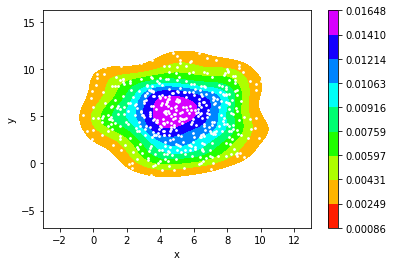

In [ ]:
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt
x = np.random.normal(5, 10*0.3, size=(500, 2))
print(x)
plt.figure(1)
from pandas import DataFrame
df_predicted = DataFrame(x,columns=['x','y'])
contour = sns.kdeplot(data=df_predicted, x='x', y='y', cmap="gist_rainbow", fill=True, cbar=True)
plt.scatter(x[:,0], x[:,1],color='white',s=3)
plt.xlim([-3,13])
contour.collections[0].set_alpha(0)

In [ ]:
s = 1
templist= np.array([1,4,7,10])
for i in range(48):
    if i%4==0:
        if i//4 in templist:
            s=i*1
        elif i//4 in templist+1:
            s=i*2
        elif i//4 in templist+2:
            s=i*3
    print(s)

1
1
1
1
4
4
4
4
16
16
16
16
36
36
36
36
16
16
16
16
40
40
40
40
72
72
72
72
28
28
28
28
64
64
64
64
108
108
108
108
40
40
40
40
88
88
88
88
